In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 59.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 26.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 108.8 MB/s eta 0:00:00


# **DATA PREPROCESSING**

**Renaming all wav files**

In [3]:
import os


def rename_wave_files(folder_path):
    files = os.listdir(folder_path)
    wav_files = [f for f in files if f.lower().endswith('.wav')]

    print(f'Folder path: {folder_path}')
    print(f'All files in the folder: {files}')
    print(f'Wave files found: {len(wav_files)}')

    for index, wav_file in enumerate(wav_files, start=1):
        old_path = os.path.join(folder_path, wav_file)
        new_path = os.path.join(folder_path, f'{index}.wav')
        os.rename(old_path, new_path)
        print(f'Renamed {old_path} to {new_path}')


if __name__ == "__main__":
    folder_path = r'/content/drive/MyDrive/ESD/train'  # Change this to your wav file folder
    rename_wave_files(folder_path)
    print("Wave files renamed successfully!")

Folder path: /content/drive/MyDrive/ESD/train
All files in the folder: ['0018_001174.wav', '0018_001178.wav', '0018_001176.wav', '0018_001180.wav', '0018_001177.wav', '0018_001179.wav', '0018_001175.wav', '0018_001173.wav', '0018_001172.wav', '0018_001171.wav', '0018_001102.wav', '0018_001101.wav', '0018_001103.wav', '0018_001105.wav', '0018_001104.wav', '0018_001106.wav', '0018_001108.wav', '0018_001107.wav', '0018_001109.wav', '0018_001110.wav', '0018_001111.wav', '0018_001112.wav', '0018_001113.wav', '0018_001114.wav', '0018_001115.wav', '0018_001117.wav', '0018_001116.wav', '0018_001118.wav', '0018_001120.wav', '0018_001119.wav', '0018_001121.wav', '0018_001122.wav', '0018_001123.wav', '0018_001124.wav', '0018_001125.wav', '0018_001126.wav', '0018_001127.wav', '0018_001129.wav', '0018_001128.wav', '0018_001130.wav', '0018_001131.wav', '0018_001132.wav', '0018_001133.wav', '0018_001134.wav', '0018_001135.wav', '0018_001136.wav', '0018_001138.wav', '0018_001137.wav', '0018_001139.wav

**creating transcripts**

In [4]:
import os
import torch
import torchaudio
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor

# Define the path where the .wav files are located
wav_directory = "/content/drive/MyDrive/ESD/train"  # Add your wav dir

# Define the output file name
output_file = os.path.join(wav_directory, "list.txt")

# Define the range of .wav files (1 to 165)
# Change the 165 to what ever amount of wav files you have if 100 the change it to 101
wav_files_range = range(1, 301)

# Initialize the list to store file paths and transcripts
file_and_transcripts = []

# Initialize the wav2vec model and processor
model = Wav2Vec2ForCTC.from_pretrained("facebook/wav2vec2-large-960h")
processor = Wav2Vec2Processor.from_pretrained("facebook/wav2vec2-large-960h")

# Iterate through the .wav files
for i in wav_files_range:
    wav_file = os.path.join(wav_directory, f"{i}.wav")

    # Check if the .wav file exists
    if os.path.exists(wav_file):
        # Recognize the speech in the .wav file
        try:
            waveform, sample_rate = torchaudio.load(wav_file)
            waveform = waveform.squeeze()  # Squeeze the batch dimension
            resampler = torchaudio.transforms.Resample(
                orig_freq=sample_rate, new_freq=16000)
            waveform = resampler(waveform)
            input_values = processor(
                waveform, return_tensors="pt", sampling_rate=16000).input_values
            logits = model(input_values).logits
            predicted_ids = torch.argmax(logits, dim=-1)
            transcript = processor.decode(predicted_ids[0])
        except FileNotFoundError:
            print(f"File not found: {wav_file}")
            continue

        # Append the desired path format and transcript to the list
        file_and_transcripts.append(
            f"/content/TTS-TT2/wavs/{i}.wav|{transcript}")
    else:
        print(f"File not found: {wav_file}")

# Write the file paths and transcripts to the output file
with open(output_file, "w") as f:
    for line in file_and_transcripts:
        f.write(f"{line}\n")

print(f"File '{output_file}' created successfully.")

Some weights of Wav2Vec2ForCTC were not initialized from the model checkpoint at facebook/wav2vec2-large-960h and are newly initialized: ['wav2vec2.masked_spec_embed']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


File not found: /content/drive/MyDrive/ESD/train/101.wav
File not found: /content/drive/MyDrive/ESD/train/102.wav
File not found: /content/drive/MyDrive/ESD/train/103.wav
File not found: /content/drive/MyDrive/ESD/train/104.wav
File not found: /content/drive/MyDrive/ESD/train/105.wav
File not found: /content/drive/MyDrive/ESD/train/106.wav
File not found: /content/drive/MyDrive/ESD/train/107.wav
File not found: /content/drive/MyDrive/ESD/train/108.wav
File not found: /content/drive/MyDrive/ESD/train/109.wav
File not found: /content/drive/MyDrive/ESD/train/110.wav
File not found: /content/drive/MyDrive/ESD/train/111.wav
File not found: /content/drive/MyDrive/ESD/train/112.wav
File not found: /content/drive/MyDrive/ESD/train/113.wav
File not found: /content/drive/MyDrive/ESD/train/114.wav
File not found: /content/drive/MyDrive/ESD/train/115.wav
File not found: /content/drive/MyDrive/ESD/train/116.wav
File not found: /content/drive/MyDrive/ESD/train/117.wav
File not found: /content/drive/

**modifying audio parameters**

In [5]:
import os
import librosa
import soundfile as sf

input_path = "/content/drive/MyDrive/ESD/train"  # Add your path
output_path = "/content/drive/MyDrive/ESD/train"  # Add your path

if not os.path.exists(output_path):
    os.makedirs(output_path)

for filename in os.listdir(input_path):
    if filename.endswith(".wav"):
        # Load the .wav file
        filepath = os.path.join(input_path, filename)
        y, sr = librosa.load(filepath, sr=22050)

        # Trim silence
        trimmed_audio, _ = librosa.effects.trim(y, top_db=20)

        # Normalize audio
        normalized_audio = librosa.util.normalize(trimmed_audio)

        # Save processed .wav file to the output folder
        output_filepath = os.path.join(output_path, filename)
        sf.write(output_filepath, normalized_audio, sr, subtype='PCM_16')

print("All .wav files have been preprocessed and saved to the output folder.")

All .wav files have been preprocessed and saved to the output folder.


In [6]:
pip install pytaglib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 894.4/894.4 kB 16.3 MB/s eta 0:00:00


**Modifying wav files Metadata**

In [7]:
import os
import shutil
import taglib


def update_metadata(input_folder, output_folder):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    for i in range(1, 301):  # change  this to the number of files in your folder + 1
        input_file = os.path.join(input_folder, f"{i}.wav")
        output_file = os.path.join(output_folder, f"{i}.wav")

        if os.path.exists(input_file):
            # Load WAV file and update metadata
            with taglib.File(input_file) as audio:
                # Set the title to match the file name without the extension
                audio.tags["TITLE"] = [f"{i}"]
                # Set the track number to match the file name without the extension
                audio.tags["TRACKNUMBER"] = [f"{i}"]

                # Save updated WAV file
                audio.save()

            # Copy the updated file to the output folder instead of moving it
            shutil.copy2(input_file, output_file)

            print(
                f"Updated metadata for {i}.wav: title='{i}', track number={i}")  # Update the print statement as well
        else:
            print(f"File {i}.wav not found.")


if __name__ == "__main__":
    input_folder = "/content/drive/MyDrive/ESD/train"  # your path
    output_folder = "/content/drive/MyDrive/ESD_new/train"  # your path
    update_metadata(input_folder, output_folder)

Updated metadata for 1.wav: title='1', track number=1
Updated metadata for 2.wav: title='2', track number=2
Updated metadata for 3.wav: title='3', track number=3
Updated metadata for 4.wav: title='4', track number=4
Updated metadata for 5.wav: title='5', track number=5
Updated metadata for 6.wav: title='6', track number=6
Updated metadata for 7.wav: title='7', track number=7
Updated metadata for 8.wav: title='8', track number=8
Updated metadata for 9.wav: title='9', track number=9
Updated metadata for 10.wav: title='10', track number=10
Updated metadata for 11.wav: title='11', track number=11
Updated metadata for 12.wav: title='12', track number=12
Updated metadata for 13.wav: title='13', track number=13
Updated metadata for 14.wav: title='14', track number=14
Updated metadata for 15.wav: title='15', track number=15
Updated metadata for 16.wav: title='16', track number=16
Updated metadata for 17.wav: title='17', track number=17
Updated metadata for 18.wav: title='18', track number=18
U

# **Setup**

In [8]:

_, card = !nvidia-smi --query-gpu=gpu_name --format='csv'
print(card)

Tesla T4


In [9]:


from google.colab import drive
import os
from os.path import exists
if not exists('/content/drive'):
    drive.mount('drive', force_remount=True)

# **Installing Tacotron2 model**

In [10]:

import os
%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/TTS-TT2.git
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/
#NVIDIA's requirements
#I believe Colab gives us PyTorch and TF by default so we don't need anything else
#Versions specified in requirements.txt have conflicts so that's why we simply get current versions 
print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  print("Downloading tt2 pretrained")
  gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)
if not os.path.isfile("/content/TTS-TT2/text/merged.dict.txt"):
  print("Applying cmudict patch")
  # !curl https://cdn.discordapp.com/attachments/820353681567907901/865742324084244480/tacotron2-cmudict-patch.zip -o /content/tacotron2-cmudict-patch.zip
  gdown.download("https://drive.google.com/uc?id=1xgtiHABttD4MTds4KUPjghXfLqvzln2_", "/content/tacotron2-cmudict-patch.zip", quiet=False)
  !unzip -o /content/tacotron2-cmudict-patch.zip -d /content/TTS-TT2/text/
  !mv /content/TTS-TT2/text/merged.dict.txt /content/TTS-TT2/

latest_downloaded = None

/content
Cloning justinjohn0306/TTS-TT2
Cloning into 'TTS-TT2'...
remote: Enumerating objects: 76, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 76 (delta 0), reused 0 (delta 0), pack-reused 72
Unpacking objects: 100% (76/76), 1.81 MiB | 4.39 MiB/s, done.
/content/TTS-TT2
/content/TTS-TT2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.9/235.9 kB 6.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-a_j63am6
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-a_j63am6
  Resolved https://github.com/wkentaro/gdown.git to commit 5c7507f02718048899b85d4010a6ed93316cbf27
  Running command git submodule update --init --recursive -q
  Ins

Downloading...
From (original): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA
From (redirected): https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA&confirm=t&uuid=0bbf57b3-aabb-4aa5-9eaf-ec5f615e13e8
To: /content/TTS-TT2/pretrained_model
100%|██████████| 113M/113M [00:01<00:00, 86.1MB/s]


Applying cmudict patch


Downloading...
From: https://drive.google.com/uc?id=1xgtiHABttD4MTds4KUPjghXfLqvzln2_
To: /content/tacotron2-cmudict-patch.zip
100%|██████████| 893k/893k [00:00<00:00, 112MB/s]

Archive:  /content/tacotron2-cmudict-patch.zip
  inflating: /content/TTS-TT2/text/cleaners.py  
  inflating: /content/TTS-TT2/text/cmudict.py  
  inflating: /content/TTS-TT2/text/LICENSE  
  inflating: /content/TTS-TT2/text/README  
  inflating: /content/TTS-TT2/text/__init__.py  
  inflating: /content/TTS-TT2/text/merged.dict.txt  


In [11]:

patches = [
  ("/content/TTS-TT2/train.patch", """17a18
> from tqdm import tqdm
18a20,26
> from plotting_utils import plot_alignment_to_numpy
> from IPython import display
> from PIL import Image
> 
> def plot_something_to_ipython(alignment):
>   numpoop = plot_alignment_to_numpy(alignment)
>   display.display(Image.fromarray(numpoop))
28,29c36,37
<     assert torch.cuda.is_available(), "Distributed mode requires CUDA."
<     print("Initializing Distributed")
---
>     assert torch.cuda.is_available(), "distributed mode requires CUDA"
>     print("initializing distributed")
39c47
<     print("Done initializing distributed")
---
>     print("done initializing distributed")
86c94
<     print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
---
>     print("warm starting model from checkpoint '{}'".format(checkpoint_path))
101c109
<     print("Loading checkpoint '{}'".format(checkpoint_path))
---
>     print("loading checkpoint '{}'".format(checkpoint_path))
107c115
<     print("Loaded checkpoint '{}' from iteration {}" .format(
---
>     print("loaded checkpoint '{}' from iteration {}" .format(
113c121
<     print("Saving model and optimizer state at iteration {} to {}".format(
---
>     print("saving model and optimizer state at iteration {} to {}".format(
145c153
<         print("Validation loss {}: {:9f}  ".format(iteration, val_loss))
---
>         print("validation loss {}: {:9f}  ".format(iteration, val_loss))
146a155,161
>         
>         # plot_something_to_ipython
>         # https://github.com/NVIDIA/tacotron2/blob/master/logger.py
>         _, _, _, alignments = y_pred
>         from random import randint
>         idx = randint(0, alignments.size(0)-1)
>         plot_something_to_ipython(alignments[idx].data.cpu().numpy().T)
169a185
>     print("starting with {} learning rate".format(learning_rate))
207,208c223,225
<         print("Epoch: {}".format(epoch))
<         for i, batch in enumerate(train_loader):
---
>         print("starting epoch {} at iteration {}".format(epoch, iteration))
>         epochstart = time.perf_counter()
>         for i, batch in tqdm(enumerate(train_loader)):
240,241c257,258
<                 print("Train loss {} {:.6f} Grad Norm {:.6f} {:.2f}s/it".format(
<                     iteration, reduced_loss, grad_norm, duration))
---
>                 #print("Train loss {} {:.6f} Grad Norm {:.6f} {:.2f}s/it".format(
>                 #    iteration, reduced_loss, grad_norm, duration))
243a261
>             from random import random
245,246c263,266
<             if not is_overflow and (iteration % hparams.iters_per_checkpoint == 0):
<                 validate(model, criterion, valset, iteration,
---
>             iteration += 1
>         print("\nepoch {} took {} seconds".format(epoch, time.perf_counter() - epochstart))
>         #what could possibly go wrong
>         validate(model, criterion, valset, iteration,
248a269
>         if not is_overflow and (random() > 0.66): #(iteration % hparams.iters_per_checkpoint == 0):
251,256c272,280
<                         output_directory, "checkpoint_{}".format(iteration))
<                     save_checkpoint(model, optimizer, learning_rate, iteration,
<                                     checkpoint_path)
< 
<             iteration += 1
< 
---
>                         output_directory, hparams.model_name)
>                     try:
>                         save_checkpoint(model, optimizer, learning_rate, iteration,
>                                         checkpoint_path)
>                     except KeyboardInterrupt:
>                         print("you probably shouldnt ^C while im saving")
>                         save_checkpoint(model, optimizer, learning_rate, iteration,
>                                         checkpoint_path)
>                         print("ok it should be fine now")

"""),
  ("/content/TTS-TT2/plotting_utils.patch", """5c5
< 
---
> import io
9,10c9,13
<     data = np.fromstring(fig.canvas.tostring_rgb(), dtype=np.uint8, sep='')
<     data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
---
>     # no obvious way to make it rgba... https://github.com/matplotlib/matplotlib/issues/5336#issuecomment-388736185
>     buf = io.BytesIO()
>     fig.savefig(buf, format="rgba")
>     data = np.fromstring(buf.getvalue(), dtype=np.uint8, sep='')
>     data = data.reshape(fig.canvas.get_width_height()[::-1] + (4,))
15c18
<     fig, ax = plt.subplots(figsize=(6, 4))
---
>     fig, ax = plt.subplots(figsize=(9, 6))
17c20
<                    interpolation='none')
---
>                    interpolation='none', cmap='inferno')
35c38
<                    interpolation='none')
---
>                    interpolation='none', cmap='inferno')

""")
]
for i, v in enumerate(patches):
  to = v[0]
  co = v[1]
  with open(to, "w") as file:
    file.write(co)

from glob import glob 
for x in glob("*.patch"):
  base = x[:-6]
  patch = x
  py = base+".py"
  !patch {py} {patch}
  import time
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams
 
import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename, 
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval): 
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists
    
    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

patching file train.py
patch: **** '>' followed by space or tab expected at line 72 of patch
patching file plotting_utils.py


/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'
/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'


sed: can't read filelists/clipper_train_filelist.txt: No such file or directory
sed: can't read filelists/clipper_val_filelist.txt: No such file or directory
/content/TTS-TT2


### <b><font color="red">**Optional:** 
### Run the cell below 👇 if you want to load another dataset and clear/remove the current one 

In [13]:
#@markdown <b><font color="pink" size="+2"> Clean the dataset folder
!rm -rf /content/TTS-TT2/wavs/*
!rm -rf /content/TTS-TT2/filelists/*

#**Dataset Loading/Processing**

In [15]:
#@markdown ## Load the dataset
#@markdown ---
#@markdown #### The audios can be compressed in a **ZIP** file (recommended) or loose.
#@markdown #### You can also manually upload the ZIP/folder and enter the path in the field below, or import your audios from Drive by entering the path in the template "/content/drive/My Drive/your_file". If you want to **upload in the cell itself, leave the field empty**.
#@markdown ---
#@markdown ####  Enable audio processing? <b><font color="red">(Recommended)
#@markdown Remember that they must be in a compatible format, i.e. sample rate 22050, 16 bit, mono. If you do not have the audios in this format, check this box to make the conversion.
audio_processing = True #@param {type:"boolean"}
drive_path = "/content/drive/MyDrive/wavs.zip" #@param {type: "string"}

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification...")
  !mkdir /content/tempwav
  !bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can" 
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/wavs

Audio imported from Drive.

rm: cannot remove '/content/TTS-TT2/wavs/list.txt': No such file or directory

Metadata removal and audio verification...

100 processed audios. total duration: 0:03:24


All set, please proceed.


In [ ]:


drive_path = "/content/drive/MyDrive/wavs.zip" #@param {type: "string"}

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

if os.listdir('/content/TTS-TT2/wavs/'):
  !rm /content/TTS-TT2/wavs/*

with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    sox /content/tempwav/srtmp.wav  -c 1 /content/tempwav/ntmp.wav norm -0.1
    ffmpeg -y -i /content/tempwav/ntmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt

print(f"\n\033[37mNormalization, metadata removal and audio verification...")
!mkdir /content/tempwav
!bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can" 
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

In [ ]:


#drive_path = "/content/drive/MyDrive/wavs.zip" #@param {type: "string"}

#from google.colab import files
#import zipfile
#import os
#import wave
#import shutil
#import datetime

#if os.listdir('/content/TTS-TT2/wavs/'):
 # !rm /content/TTS-TT2/wavs/*

#with open('/content/audios.sh', 'w') as rsh:
 #   rsh.write('''\
#for file in /content/TTS-TT2/wavs/*.wav
#do
 #   ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
  #  sox /content/tempwav/srtmp.wav /content/tempwav/ctmp.wav silence 1 0.05 0.1% reverse silence 1 0.05 0.1% reverse
   # ffmpeg -y -i /content/tempwav/ctmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    #rm "$file"
    #mv /content/tempwav/poop.wav "$file"
    #rm /content/tempwav/*
#done
#''')

'''%cd /content/TTS-TT2/wavs

drive_path = drive_path.strip()

if drive_path:
  if os.path.exists(drive_path):
    print(f"\n\033[34m\033[1mAudio imported from Drive.\n\033[90m")
    if zipfile.is_zipfile(drive_path):
      !unzip -q -j "$drive_path" -d /content/TTS-TT2/wavs

    else:
      fp = drive_path + "/."
      !cp -a "$fp" "/content/TTS-TT2/wavs"
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path {drive_path} is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
    uploaded = files.upload()
else:
  print(f"\n\033[34m\033[1mUpload your dataset(audios)...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      !unzip -q -j "$fn" -d /content/TTS-TT2/wavs
      !rm "$fn"

if os.path.exists("/content/TTS-TT2/wavs/wavs"):
    for file in os.listdir("/content/TTS-TT2/wavs/wavs"):
      !mv /content/TTS-TT2/wavs/wavs/"$file"  /content/TTS-TT2/wavs/"$file"
!rm /content/TTS-TT2/wavs/list.txt

print(f"\n\033[37mSilence removal, metadata removal and audio verification...")
!mkdir /content/tempwav
!bash /content/audios.sh

totalduration = 0
for file_name in [x for x in os.listdir() if os.path.isfile(x)]:
    with wave.open(file_name, "rb") as wave_file:
        frames = wave_file.getnframes()
        rate = wave_file.getframerate()
        duration = frames / float(rate)
        totalduration += duration

        if duration >= 12:
          print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can" 
                " occur in a large batch size!")

wav_count = len(os.listdir("/content/TTS-TT2/wavs"))
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

#shutil.make_archive("/content/processedwavs", 'zip', '/content/TTS-TT2/wavs')
#files.download('/content/processedwavs.zip')

print("\n\033[32m\033[1mAll set, please proceed.")

In [16]:
#@markdown ## Upload the **transcript**
#@markdown The transcript must be a ``.TXT`` file formatted in <font color="red" size="+3"> ``UTF-8 without BOM.``
%cd /content/TTS-TT2/filelists/
!rm /content/TTS-TT2/filelists/list.txt

print("\n\033[34m\033[1mUpload your transcript(list)...")
listfn, length = files.upload().popitem()

if listfn != "list.txt":
  !mv "$listfn" list.txt
%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists
rm: cannot remove '/content/TTS-TT2/filelists/list.txt': No such file or directory

Upload your transcript(list)...


Saving list.txt to list.txt
/content/TTS-TT2

All set, please proceed.


# **Training** 

**Adjust model parameters**

In [17]:

#@markdown ---

#@markdown #### Your desired model name:

model_filename = 'Sudip-sad' #@param {type: "string"}

#@markdown #### Upload your transcription / text to TTS-TT2/filelists and right click -> copy path:
Training_file = "filelists/list.txt" #@param {type: "string"}
hparams.training_files = Training_file
hparams.validation_files = Training_file




# hparams to Tune
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1

# Learning Rate             # https://www.desmos.com/calculator/ptgcz4vzsw / http://boards.4channel.org/mlp/thread/34778298#p34789030
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate

#@markdown #### Lower learning rates will take more time but will lead to more accurate results:
# Start/Max Learning Rate  
hparams.A_ = 3e-4 #@param ["3e-6", "1e-5", "1e-4", "5e-4", "1e-3"] {type:"raw", allow-input: true}              
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-5    # Min Learning Rate

# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000

#@markdown #### Your batch size, lower if you don't have enough ram:

hparams.batch_size =  6#@param {type: "integer"}
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] # Layers to reset (None by default, other than foreign languages this param can be ignored)
use_cmudict = True #@param {type:"boolean"}
#@markdown #### Your total epochs to train to. Not recommended to change:

##@markdown #### Amount of epochs before stopping, preferably a very high amount to not stop.
hparams.epochs =  250#@param {type: "integer"}

torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark

#@markdown #### Where to save your model when training:
output_directory = '/content/drive/MyDrive/colab/outdir' #@param {type: "string"}
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

##@markdown #### Train the model from scratch? (If yes, then uncheck the box below):
#warm_start=True #@param {type:"boolean"}


#@markdown ---
hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])


#@markdown Note:-

#@markdown - The learning_rate value is ordered from smallest to largest, top to bottom.

#@markdown - The smaller the "learning rates" value is, the longer it will take to train the model, but the more accurate the results will be.

#@markdown ___

#@markdown Todo:-
#@markdown - Disable warm_start
#@markdown - Add tensorboard training monitor

#@markdown ___


**Convert WAV files into Mel-Spectrograms (Run only once)**

In [18]:


if generate_mels:
    create_mels()

Generating Mels


  0%|          | 0/100 [00:00<?, ?it/s]

In [19]:
#@markdown ## <b><font color="pink" size="+2"> **Check the working cmudict patch**
%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


In [20]:
#@markdown ## <b><font color="pink" size="+2"> **Check for missing files**

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}; sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}



In [21]:
check_dataset(hparams)#/content/TTS-TT2/wavs/1.npy

Checking Training Files
/content/TTS-TT2/wavs/1.npy|YOU KNOW ANSWERS TO THE NAME OF TOM'S SON 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/2.npy|PUT THAT RUDE GRASSHOPPER IN JAIL 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/3.npy|THIS TURN GOES TO THE HILL 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/4.npy|AND WHAT SPOIL MY JOKE 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/5.npy|CAUSE I KNOW I HAD SOME HONEY 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/6.npy|A LARGE FLAT FERRY BOAT WAS MOORED BESIDE IT 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/7.npy|TO CATCH THAT BULRISH ROOT WITH MY PAW 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/8.npy|I AM FROM TOWERLAND 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/9.npy|AM I AN ABSOLUTE PAUPER 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/10.npy|FINN AND THE FAIRY SHOEMAKER 
[info] has no ending punctuation.
/content/TTS-TT2/wavs/11.npy|FRO

FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


  0%|          | 0/250 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 0 Validation loss 16:  0.554146  Time: 0.3m LR: 0.000300


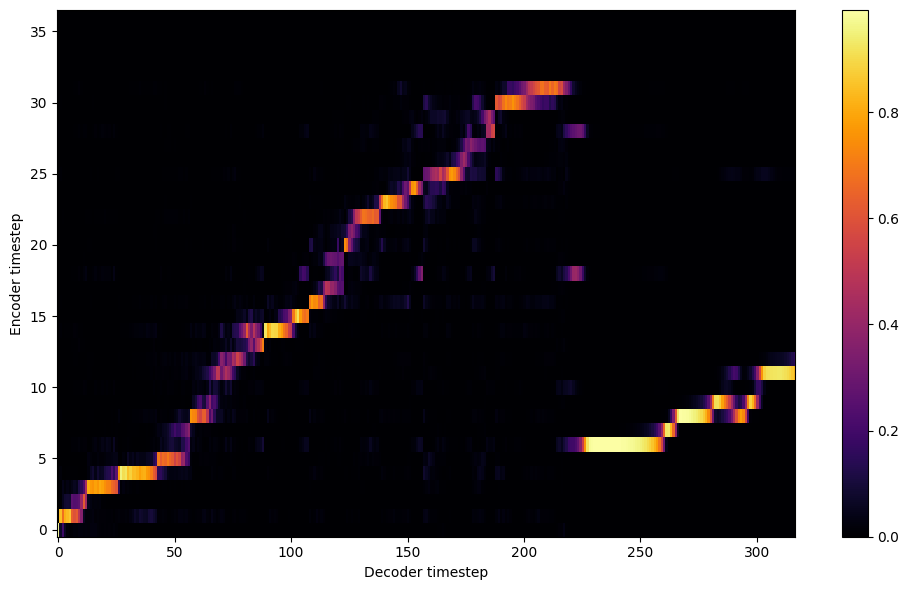


Starting Epoch: 1 Iteration: 16


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 1 Validation loss 32:  0.476269  Time: 0.3m LR: 0.000300


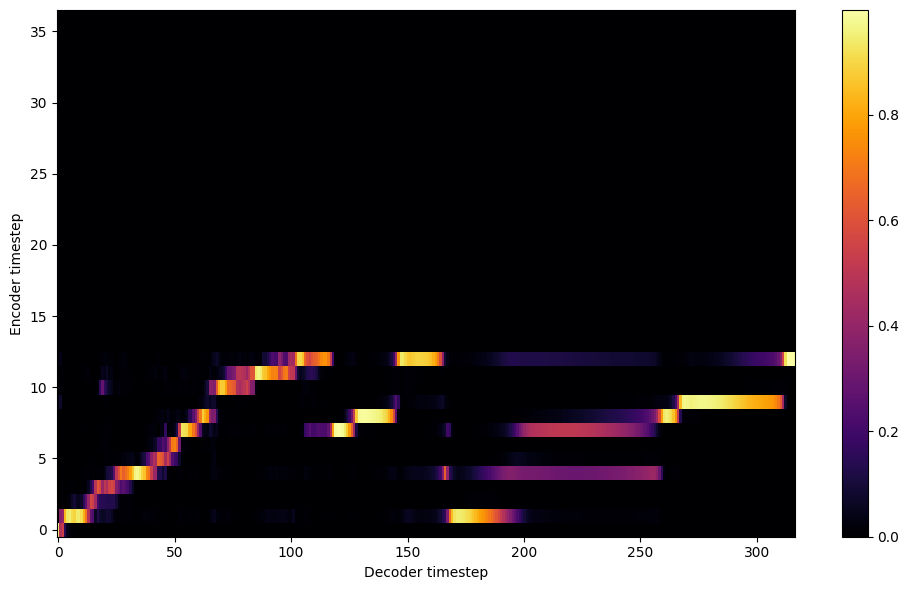


Starting Epoch: 2 Iteration: 32


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 2 Validation loss 48:  0.434787  Time: 0.3m LR: 0.000300


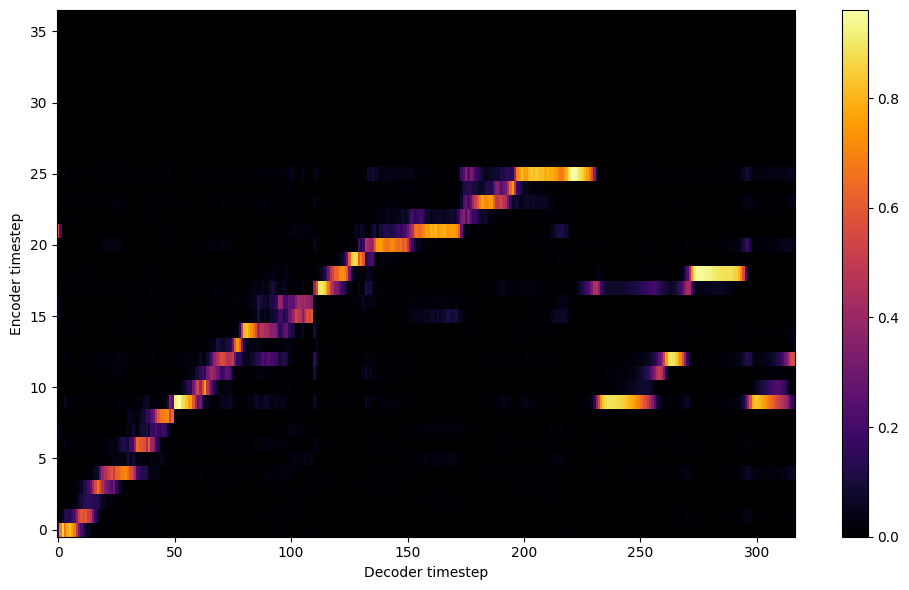


Starting Epoch: 3 Iteration: 48


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 3 Validation loss 64:  0.399571  Time: 0.3m LR: 0.000300


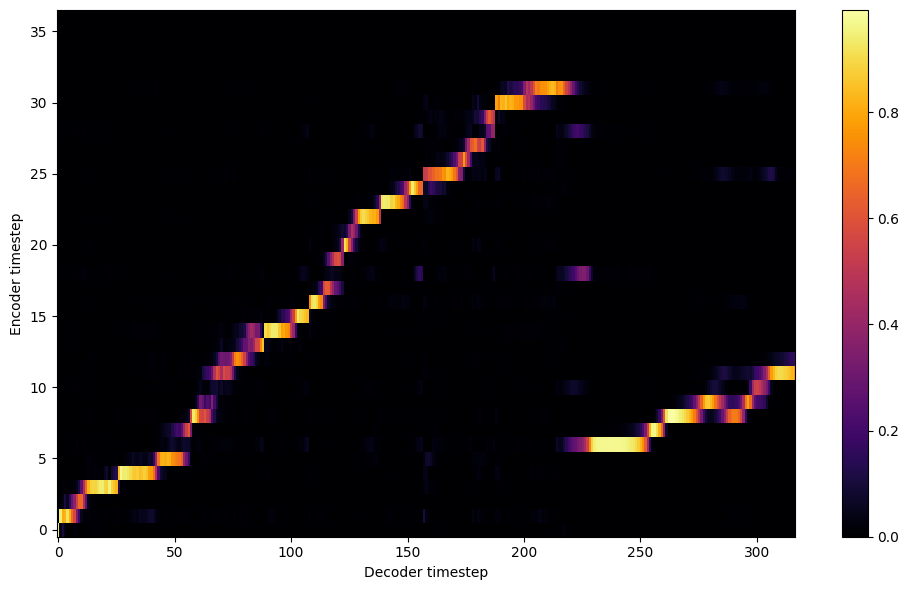


Starting Epoch: 4 Iteration: 64


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 4 Validation loss 80:  0.382992  Time: 0.3m LR: 0.000300


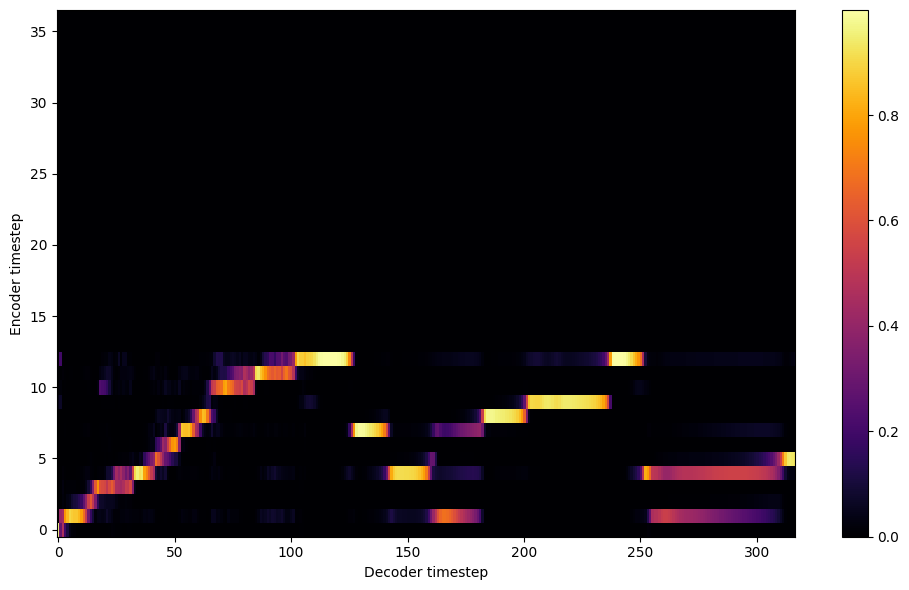


Starting Epoch: 5 Iteration: 80


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 5 Validation loss 96:  0.406953  Time: 0.3m LR: 0.000300


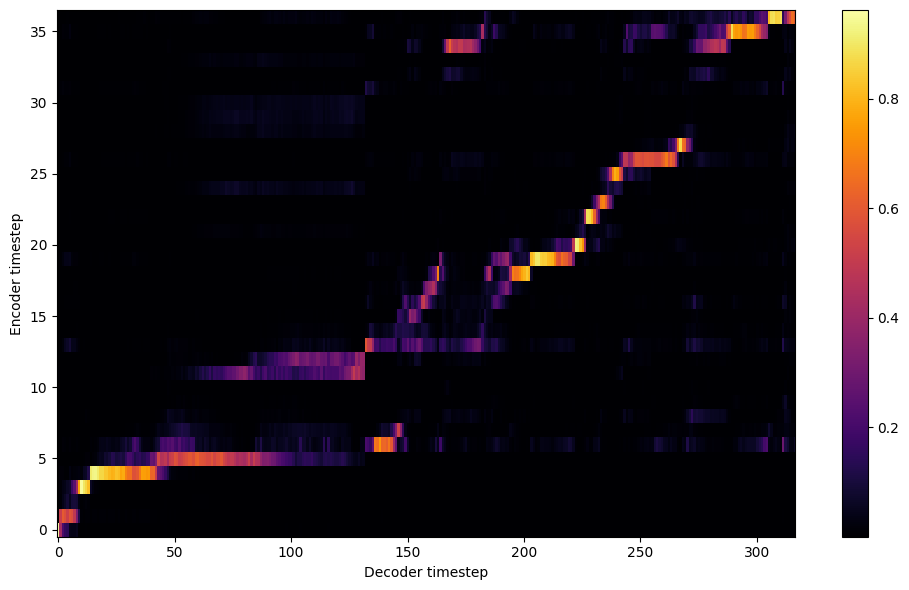


Starting Epoch: 6 Iteration: 96


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 6 Validation loss 112:  0.363904  Time: 0.3m LR: 0.000300


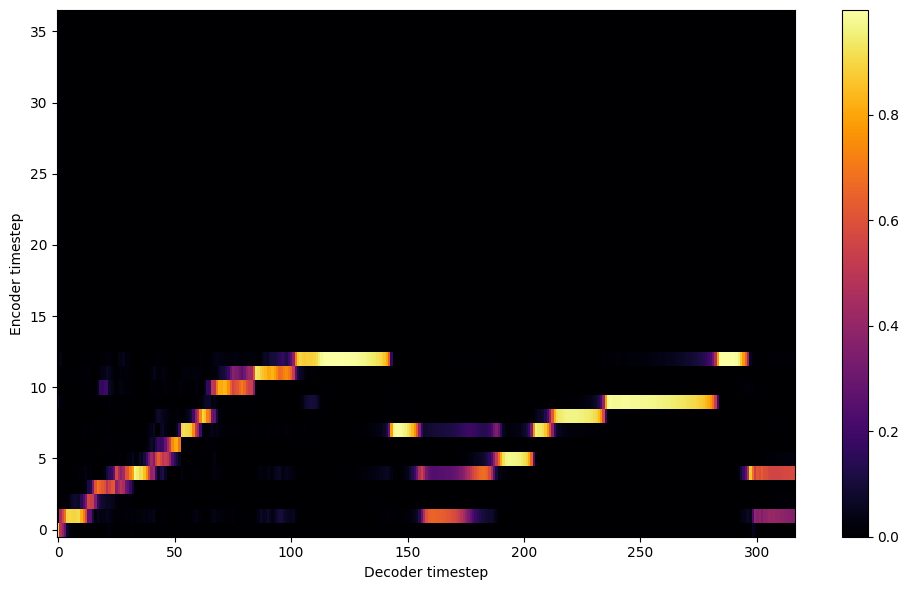


Starting Epoch: 7 Iteration: 112


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 7 Validation loss 128:  0.371166  Time: 0.3m LR: 0.000300


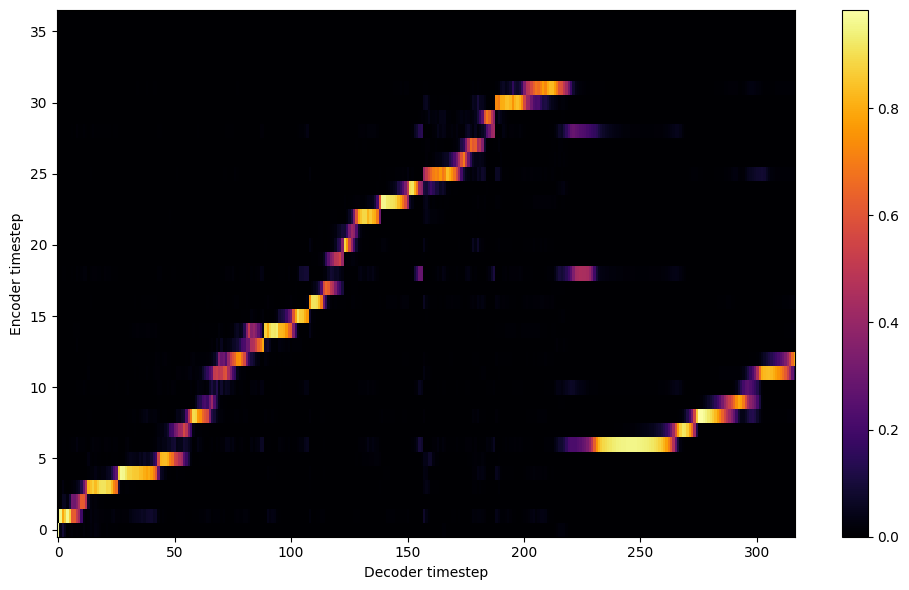


Starting Epoch: 8 Iteration: 128


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 8 Validation loss 144:  0.342780  Time: 0.3m LR: 0.000300


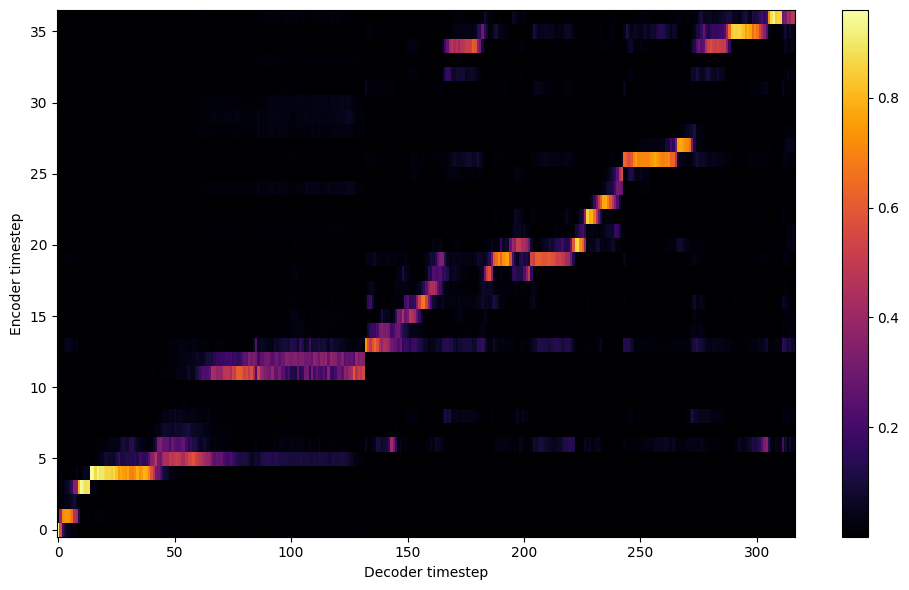


Starting Epoch: 9 Iteration: 144


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 9 Validation loss 160:  0.326999  Time: 0.3m LR: 0.000300


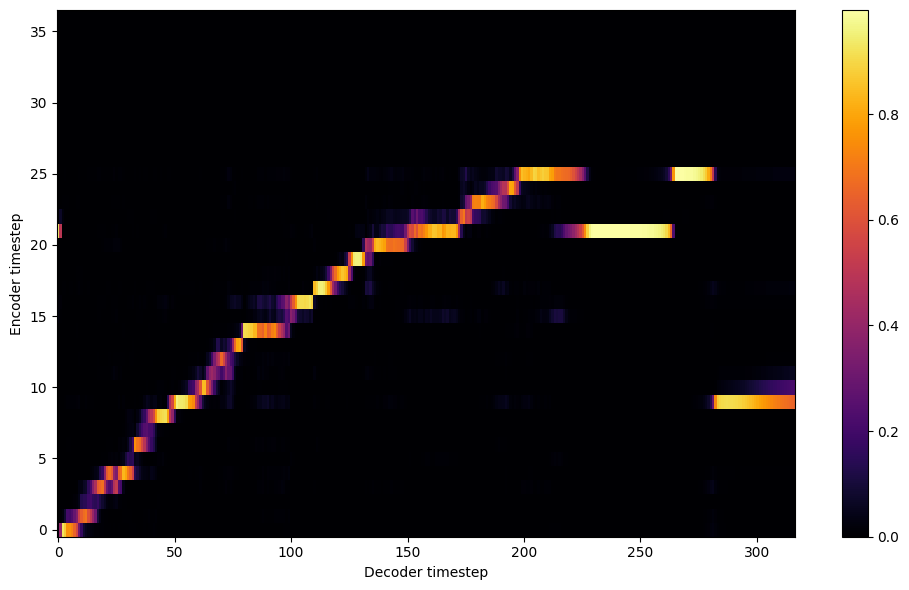

Saving model and optimizer state at iteration 160 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 10 Iteration: 160


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 10 Validation loss 176:  0.314809  Time: 0.3m LR: 0.000300


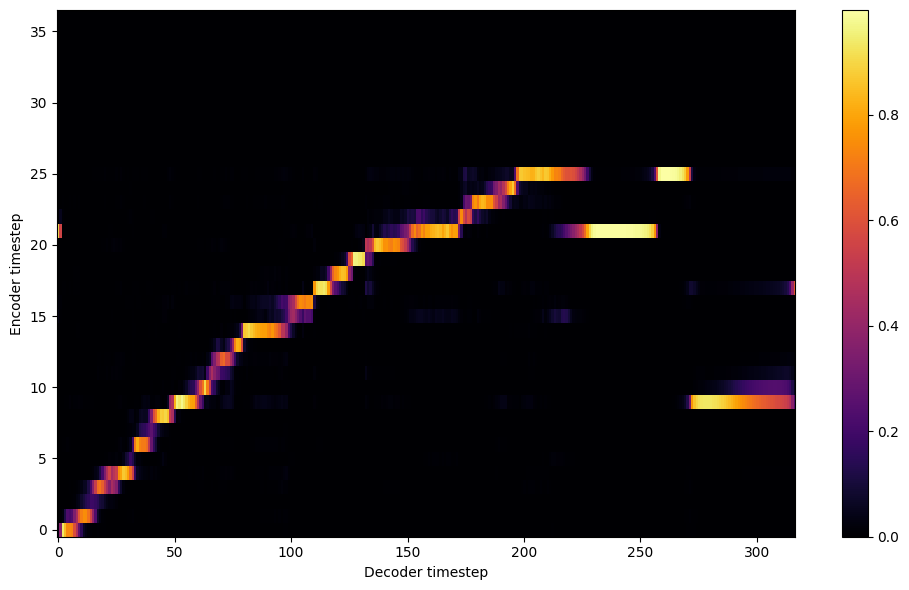


Starting Epoch: 11 Iteration: 176


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 11 Validation loss 192:  0.311576  Time: 0.3m LR: 0.000300


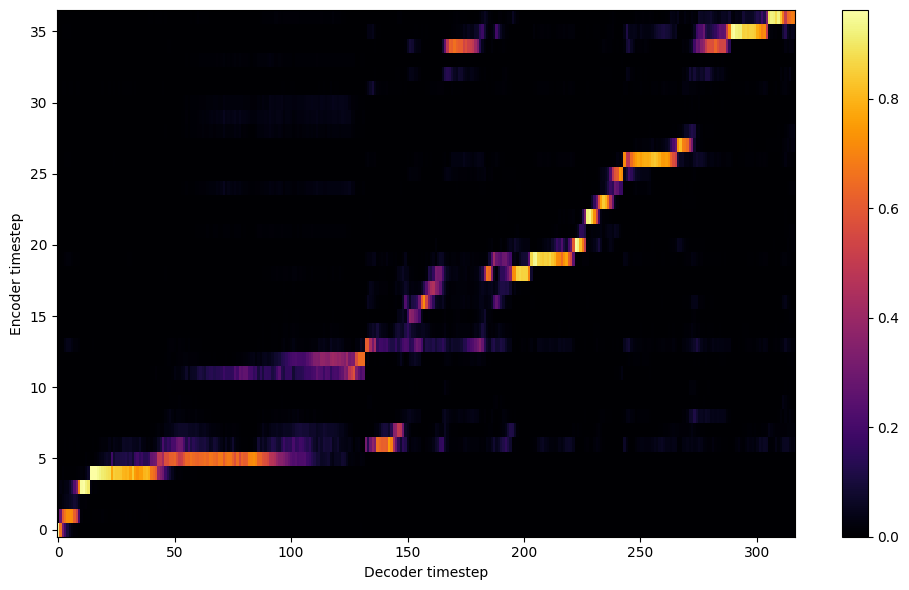


Starting Epoch: 12 Iteration: 192


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 12 Validation loss 208:  0.327463  Time: 0.3m LR: 0.000300


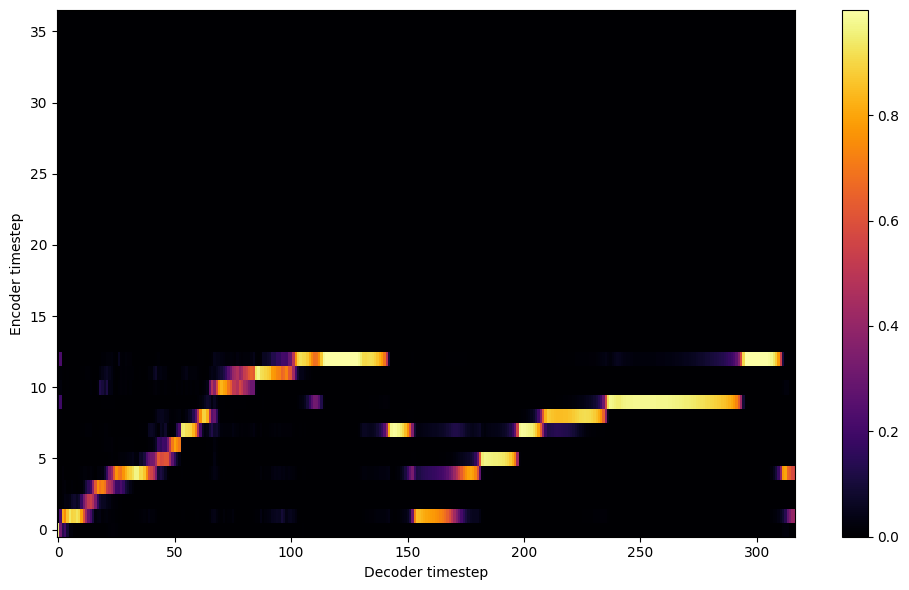


Starting Epoch: 13 Iteration: 208


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 13 Validation loss 224:  0.310718  Time: 0.3m LR: 0.000300


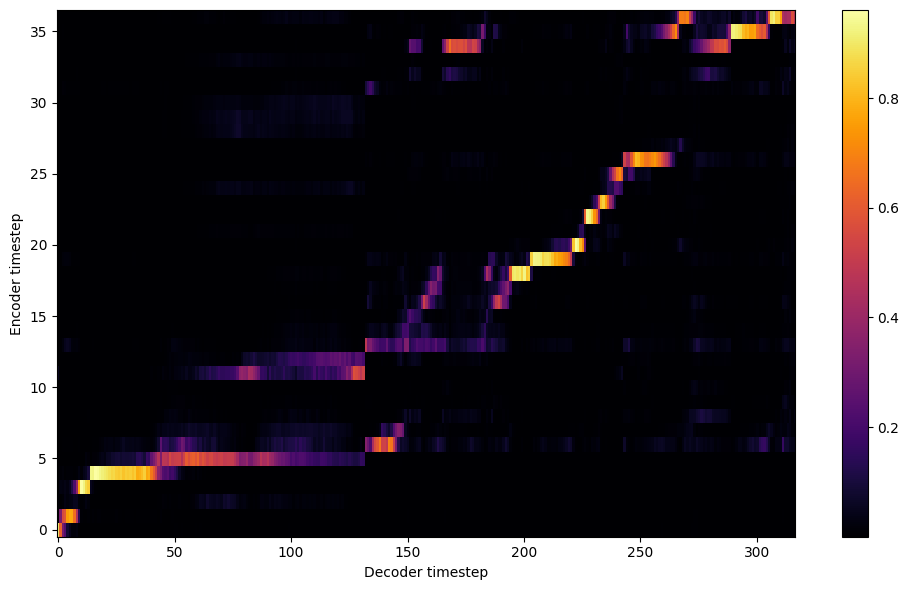


Starting Epoch: 14 Iteration: 224


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 14 Validation loss 240:  0.290989  Time: 0.3m LR: 0.000300


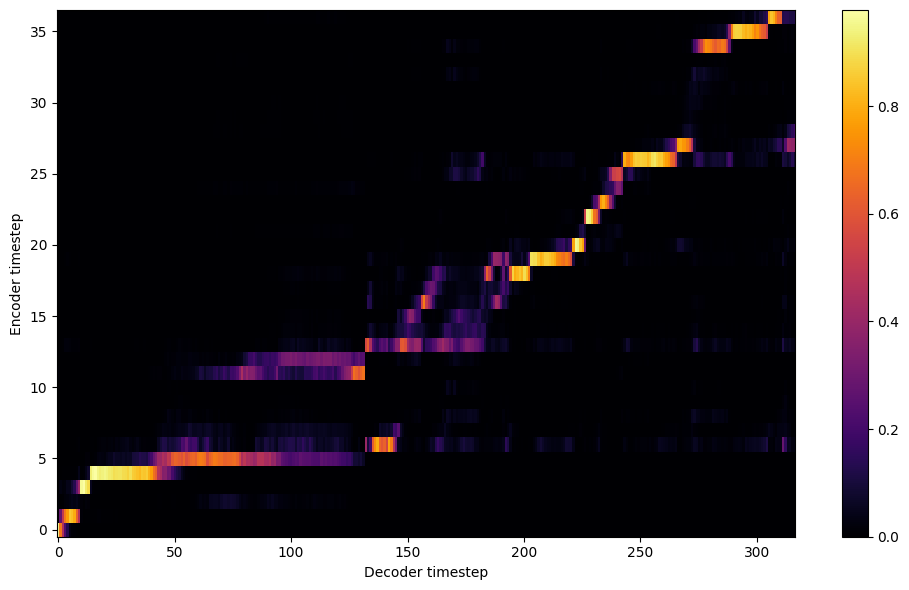


Starting Epoch: 15 Iteration: 240


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 15 Validation loss 256:  0.287968  Time: 0.3m LR: 0.000300


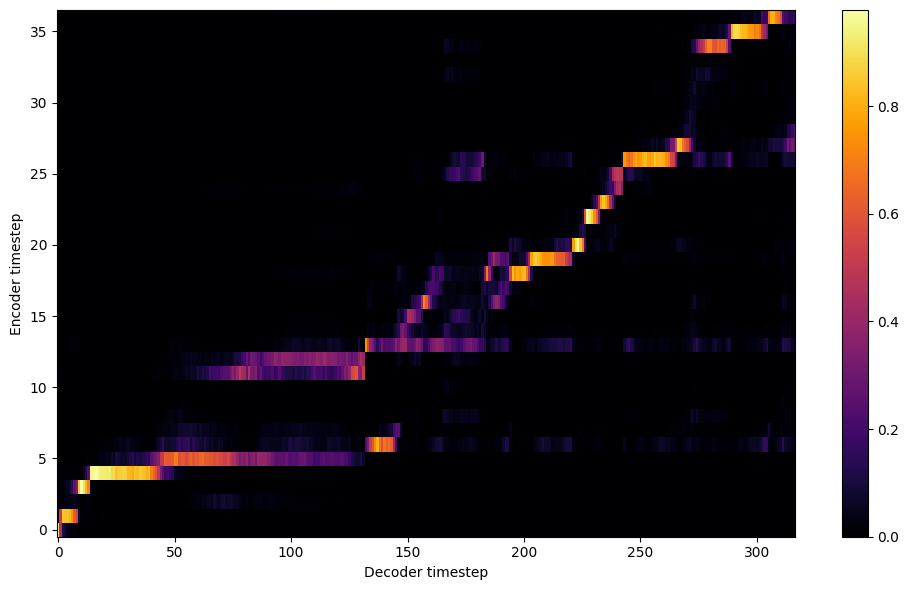


Starting Epoch: 16 Iteration: 256


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 16 Validation loss 272:  0.281111  Time: 0.3m LR: 0.000300


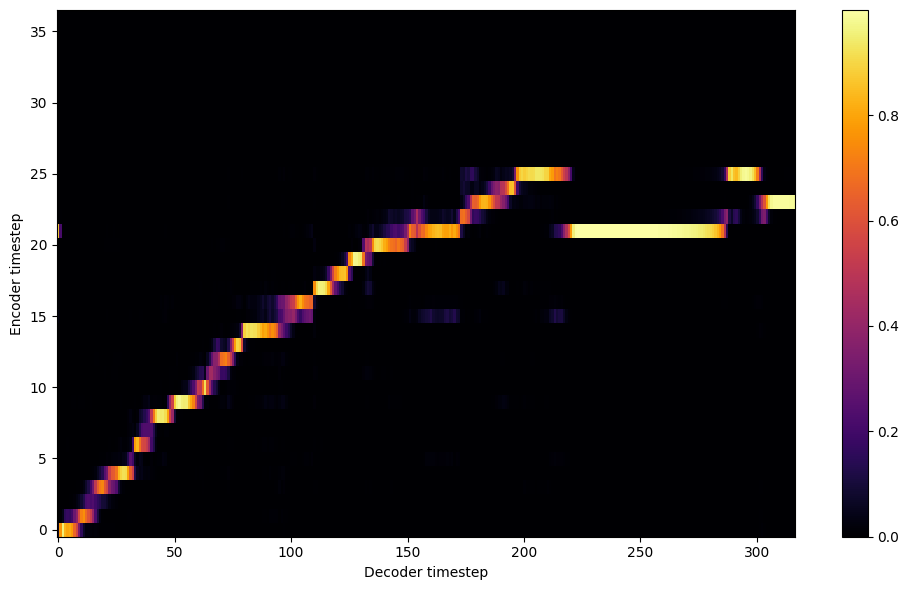


Starting Epoch: 17 Iteration: 272


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 17 Validation loss 288:  0.271301  Time: 0.3m LR: 0.000300


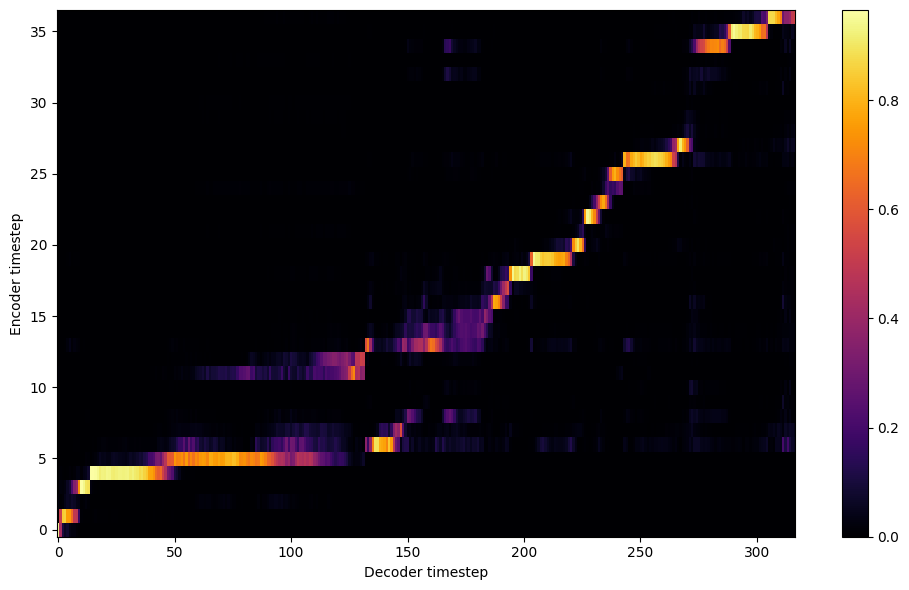


Starting Epoch: 18 Iteration: 288


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 18 Validation loss 304:  0.266844  Time: 0.3m LR: 0.000300


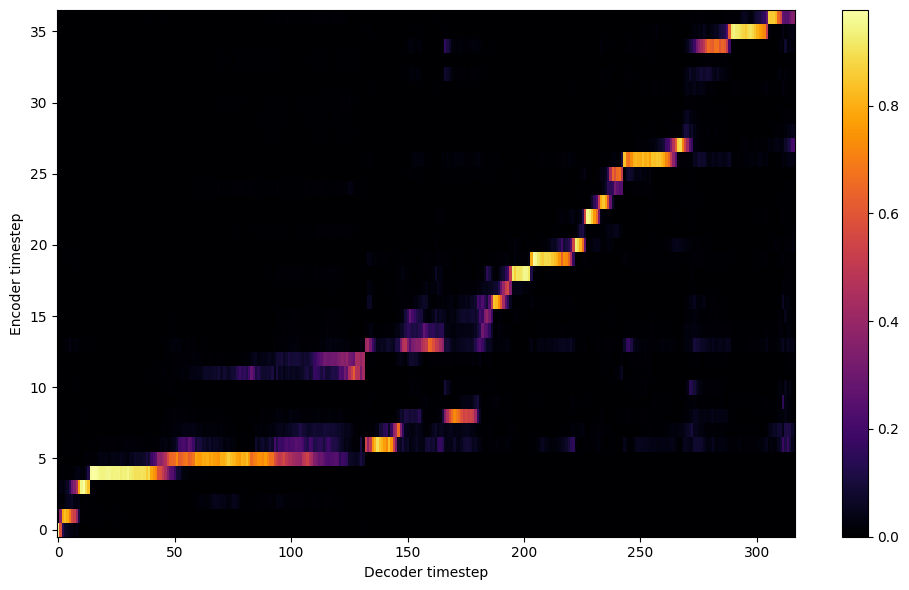


Starting Epoch: 19 Iteration: 304


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 19 Validation loss 320:  0.260821  Time: 0.3m LR: 0.000300


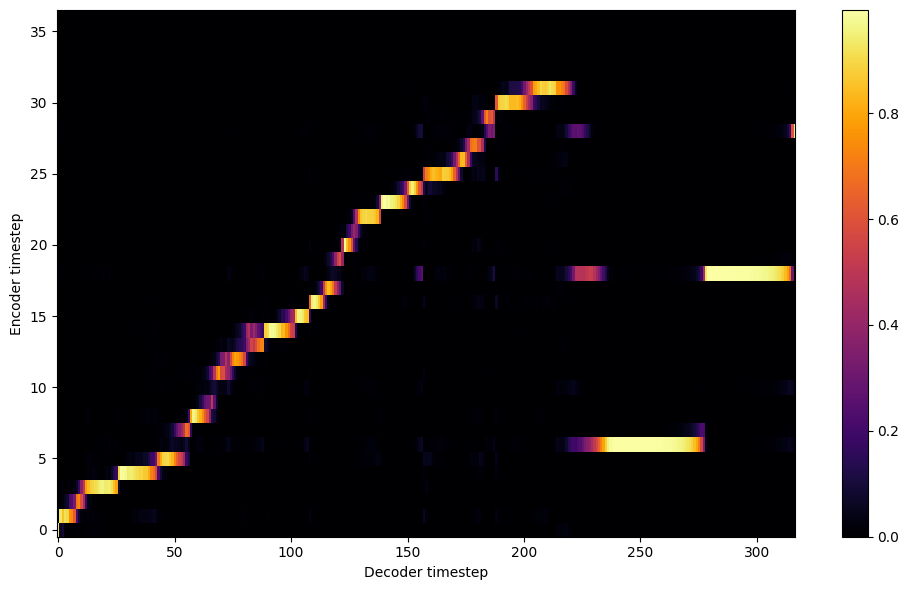

Saving model and optimizer state at iteration 320 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 20 Iteration: 320


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 20 Validation loss 336:  0.255199  Time: 0.3m LR: 0.000300


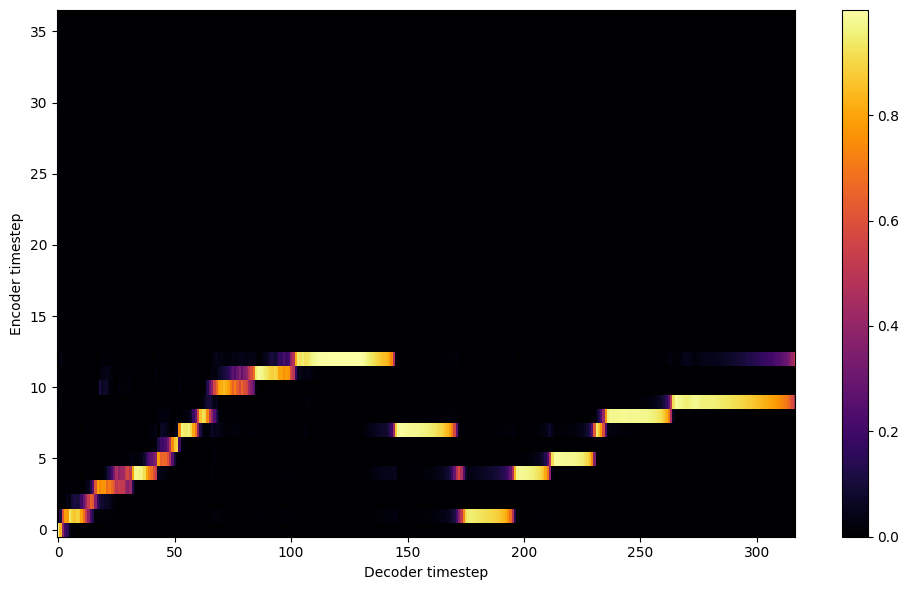


Starting Epoch: 21 Iteration: 336


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 21 Validation loss 352:  0.249031  Time: 0.3m LR: 0.000300


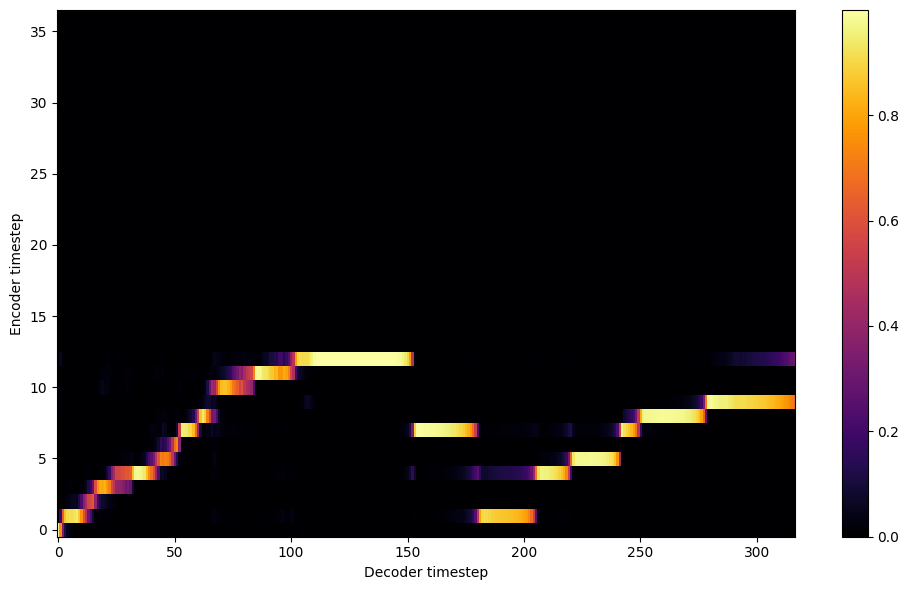


Starting Epoch: 22 Iteration: 352


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 22 Validation loss 368:  0.252679  Time: 0.3m LR: 0.000300


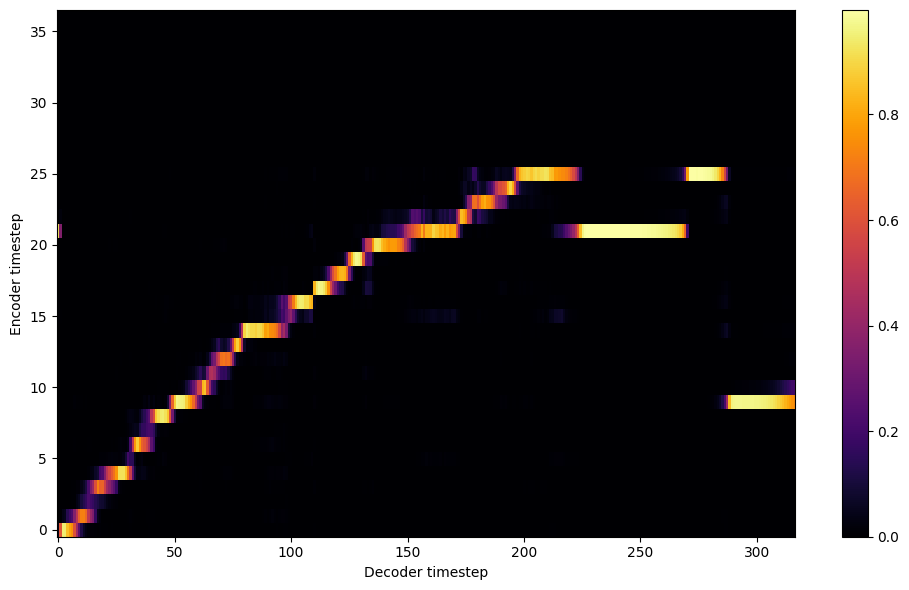


Starting Epoch: 23 Iteration: 368


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 23 Validation loss 384:  0.246967  Time: 0.3m LR: 0.000300


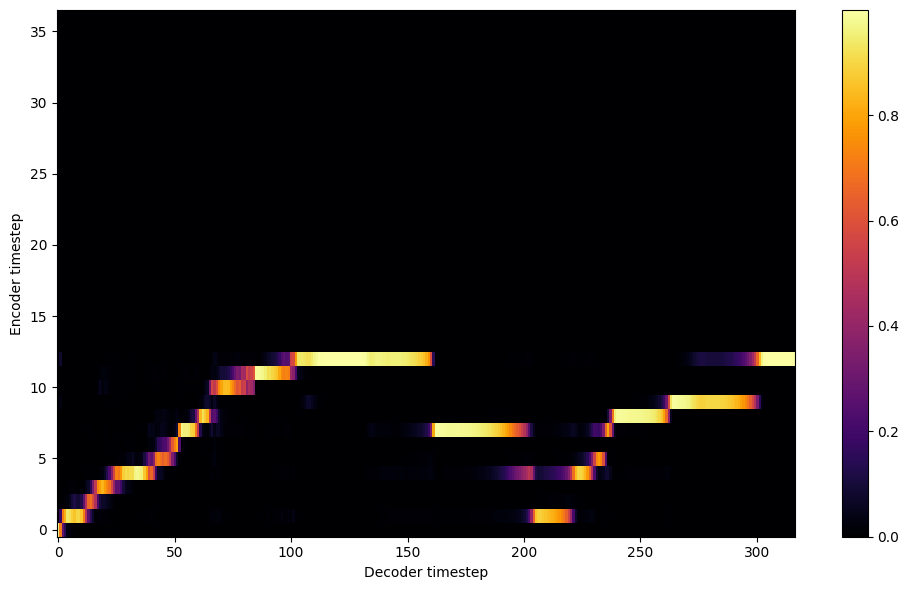


Starting Epoch: 24 Iteration: 384


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 24 Validation loss 400:  0.238560  Time: 0.3m LR: 0.000300


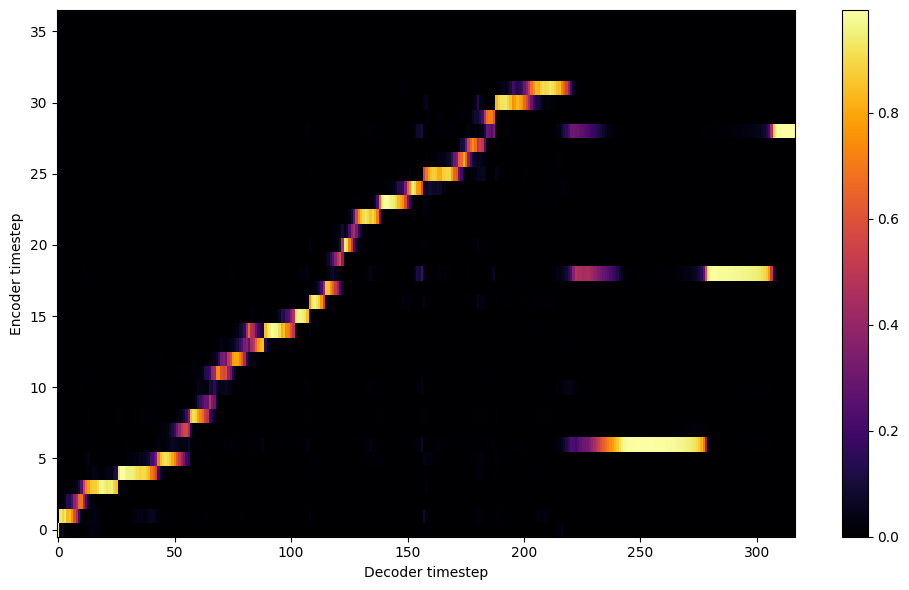


Starting Epoch: 25 Iteration: 400


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 25 Validation loss 416:  0.236146  Time: 0.3m LR: 0.000300


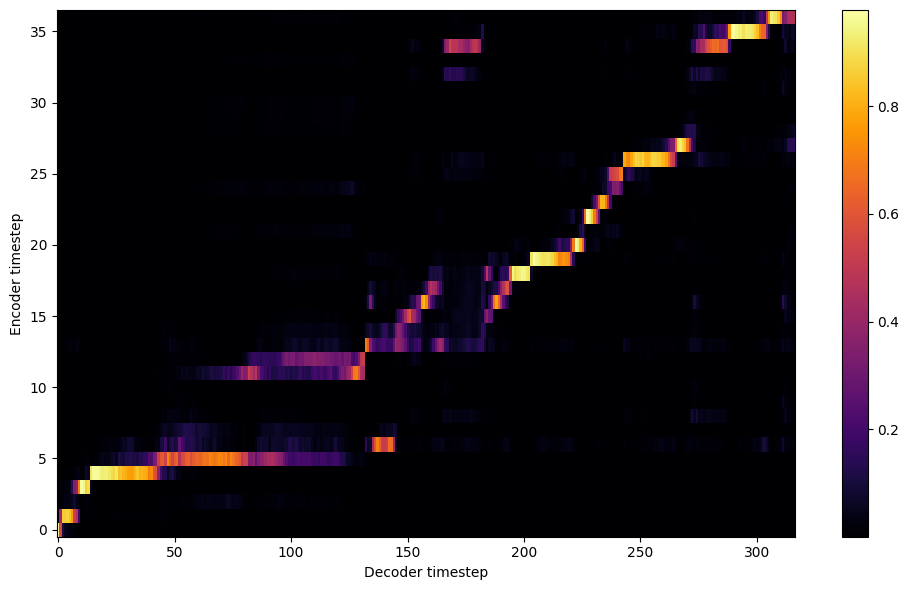


Starting Epoch: 26 Iteration: 416


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 26 Validation loss 432:  0.234393  Time: 0.3m LR: 0.000300


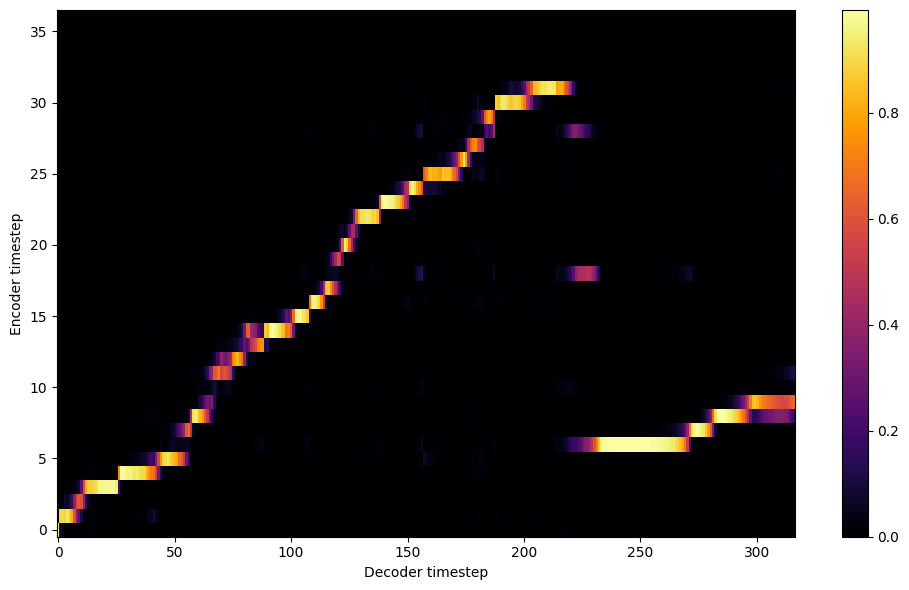


Starting Epoch: 27 Iteration: 432


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 27 Validation loss 448:  0.234689  Time: 0.3m LR: 0.000300


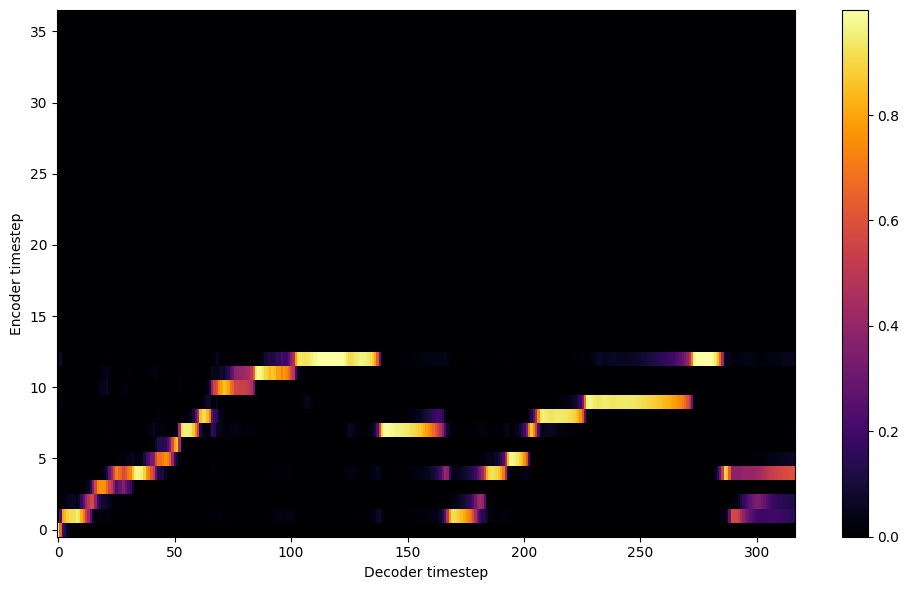


Starting Epoch: 28 Iteration: 448


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 28 Validation loss 464:  0.233151  Time: 0.3m LR: 0.000300


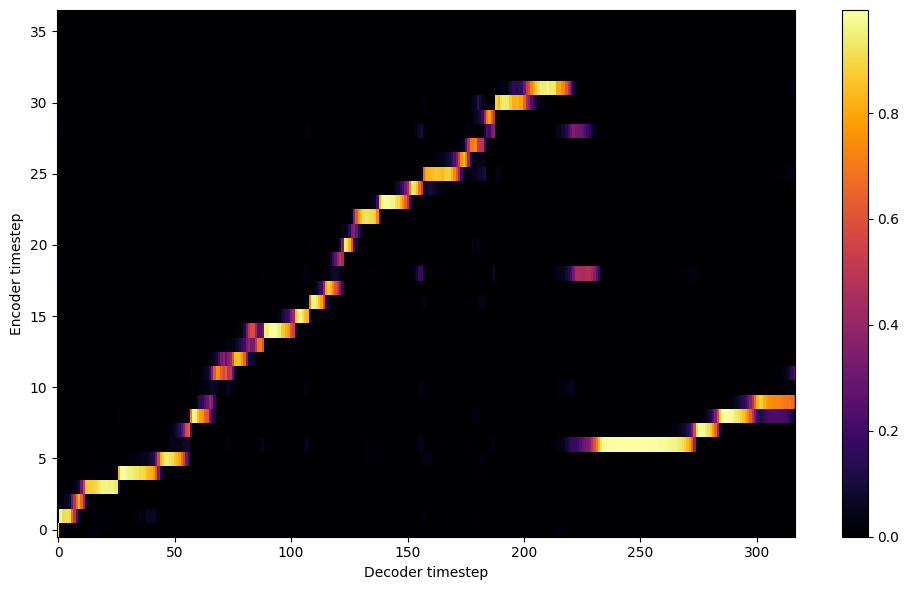


Starting Epoch: 29 Iteration: 464


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 29 Validation loss 480:  0.224043  Time: 0.3m LR: 0.000300


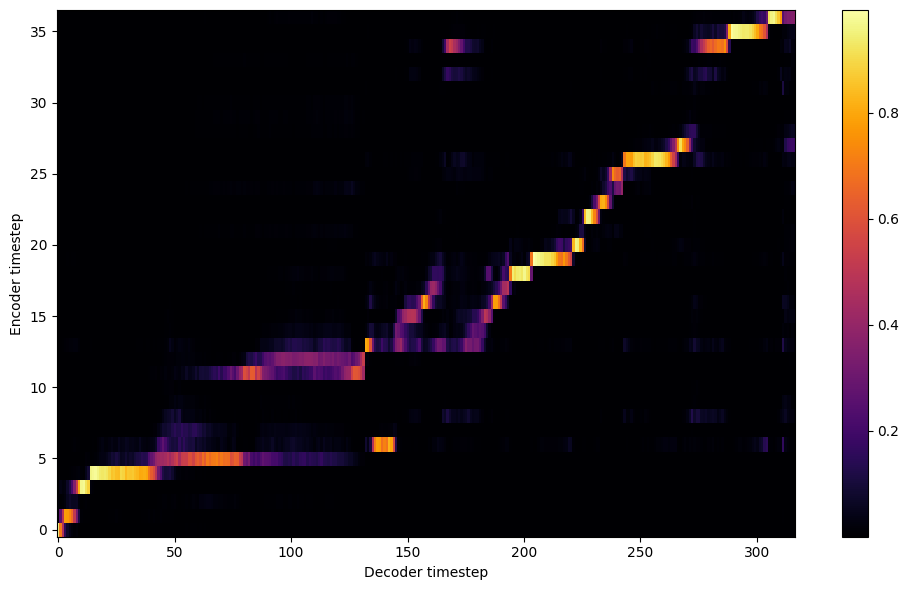

Saving model and optimizer state at iteration 480 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 30 Iteration: 480


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 30 Validation loss 496:  0.220537  Time: 0.3m LR: 0.000300


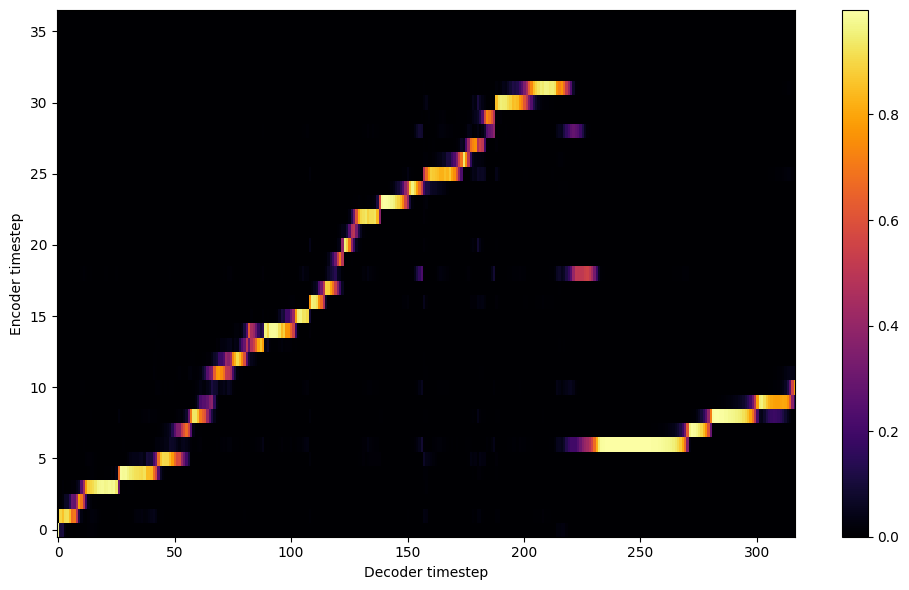


Starting Epoch: 31 Iteration: 496


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 31 Validation loss 512:  0.209363  Time: 0.3m LR: 0.000300


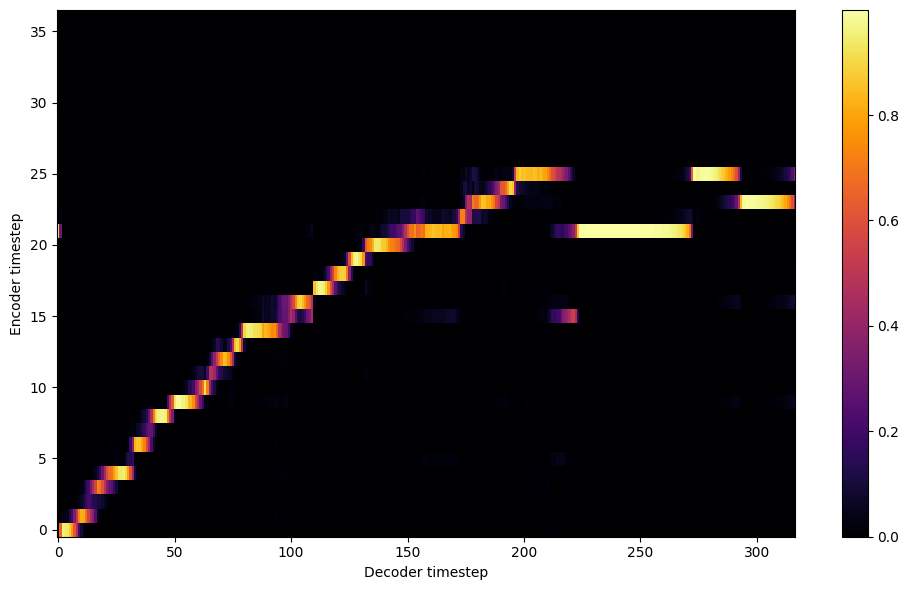


Starting Epoch: 32 Iteration: 512


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 32 Validation loss 528:  0.217626  Time: 0.3m LR: 0.000300


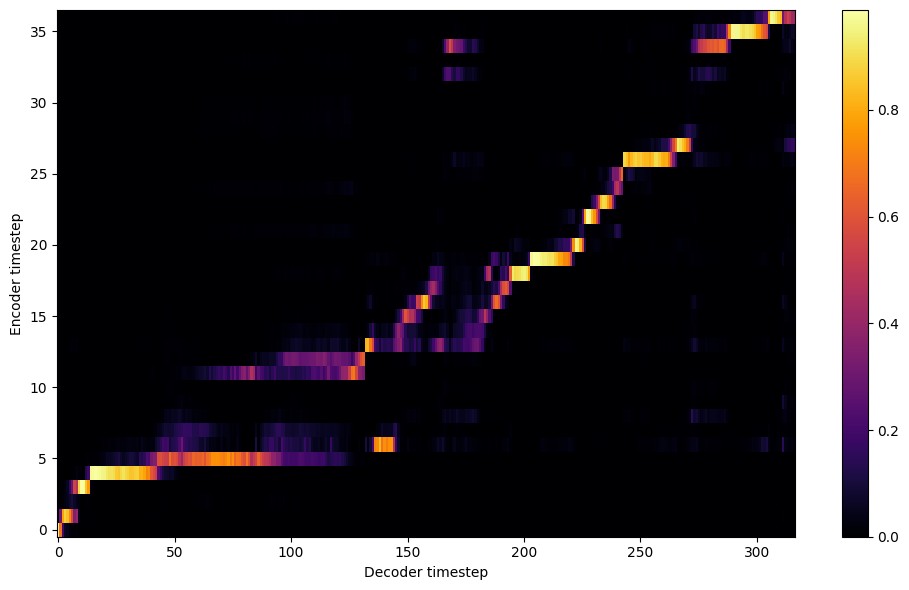


Starting Epoch: 33 Iteration: 528


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 33 Validation loss 544:  0.211633  Time: 0.3m LR: 0.000300


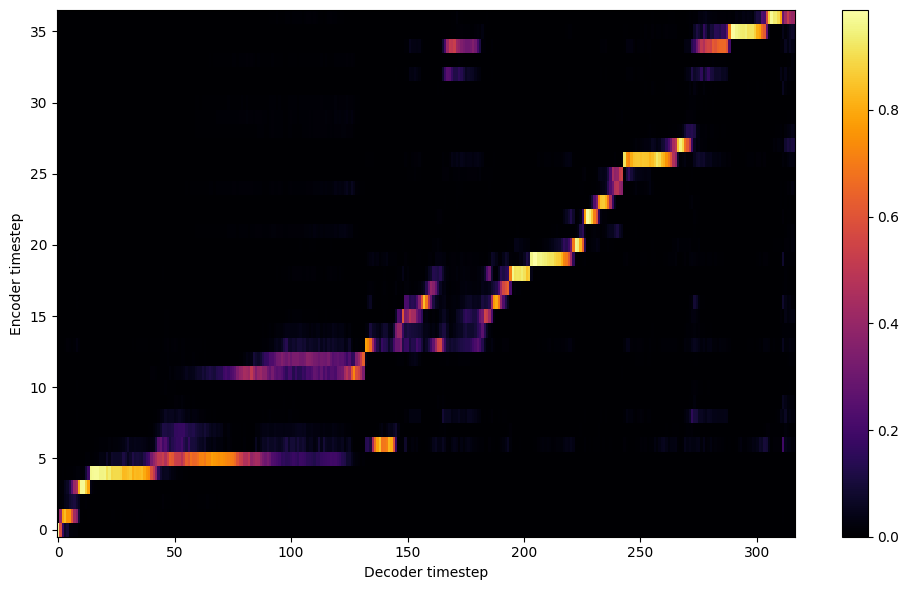


Starting Epoch: 34 Iteration: 544


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 34 Validation loss 560:  0.209213  Time: 0.3m LR: 0.000300


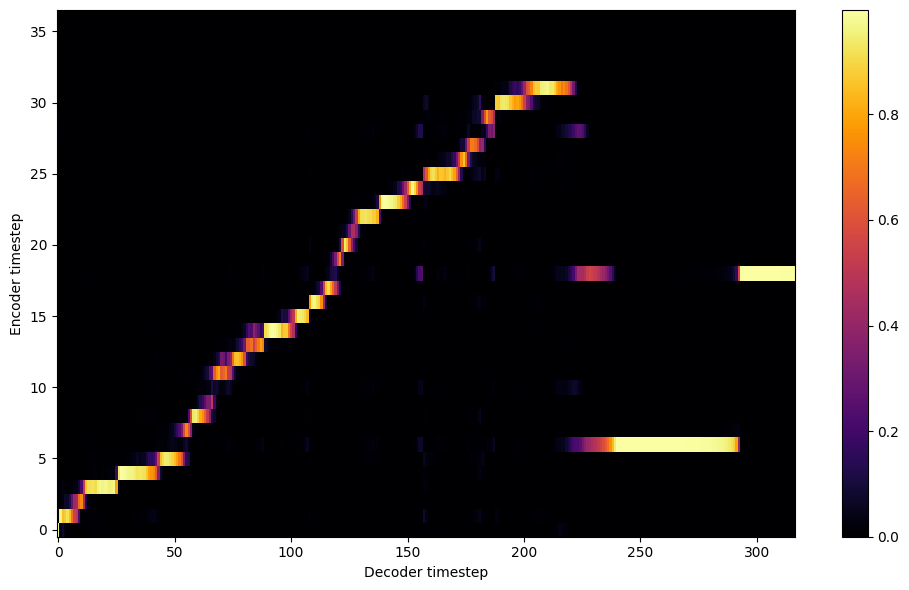


Starting Epoch: 35 Iteration: 560


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 35 Validation loss 576:  0.207376  Time: 0.3m LR: 0.000300


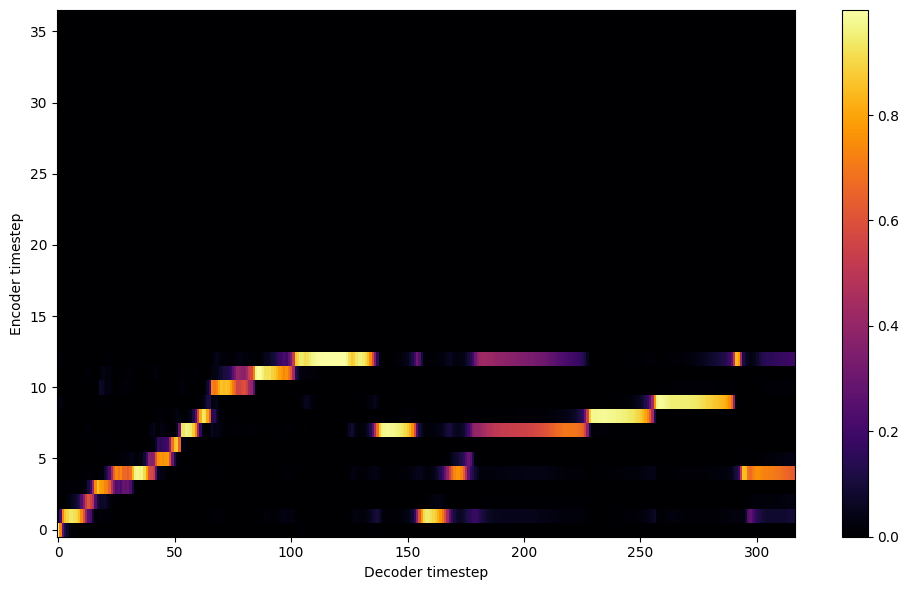


Starting Epoch: 36 Iteration: 576


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 36 Validation loss 592:  0.197663  Time: 0.3m LR: 0.000300


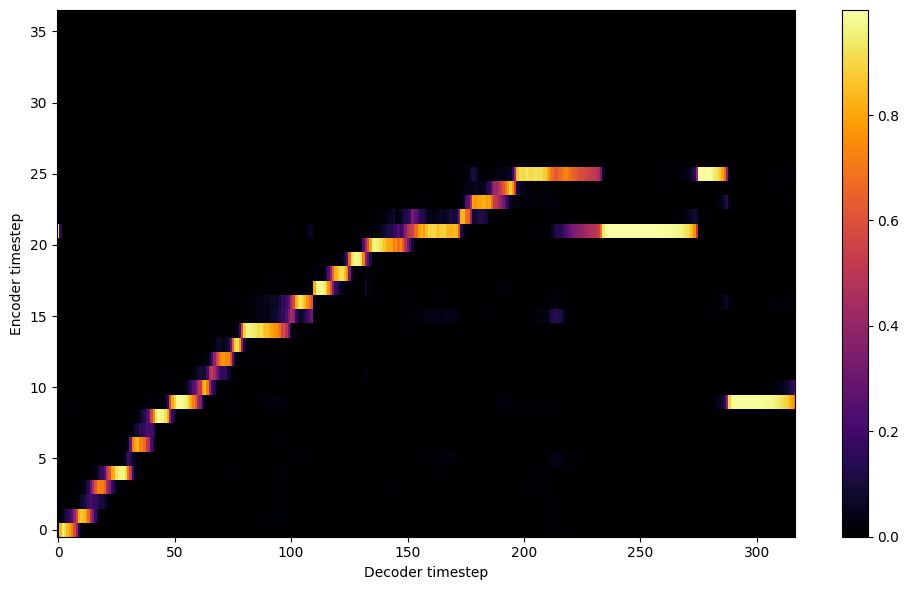


Starting Epoch: 37 Iteration: 592


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 37 Validation loss 608:  0.195713  Time: 0.3m LR: 0.000300


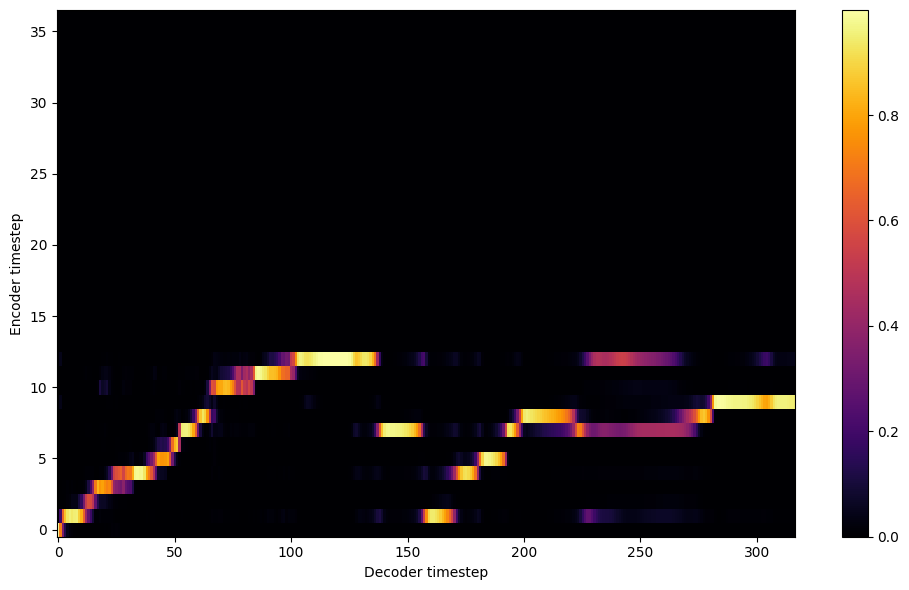


Starting Epoch: 38 Iteration: 608


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 38 Validation loss 624:  0.195055  Time: 0.3m LR: 0.000300


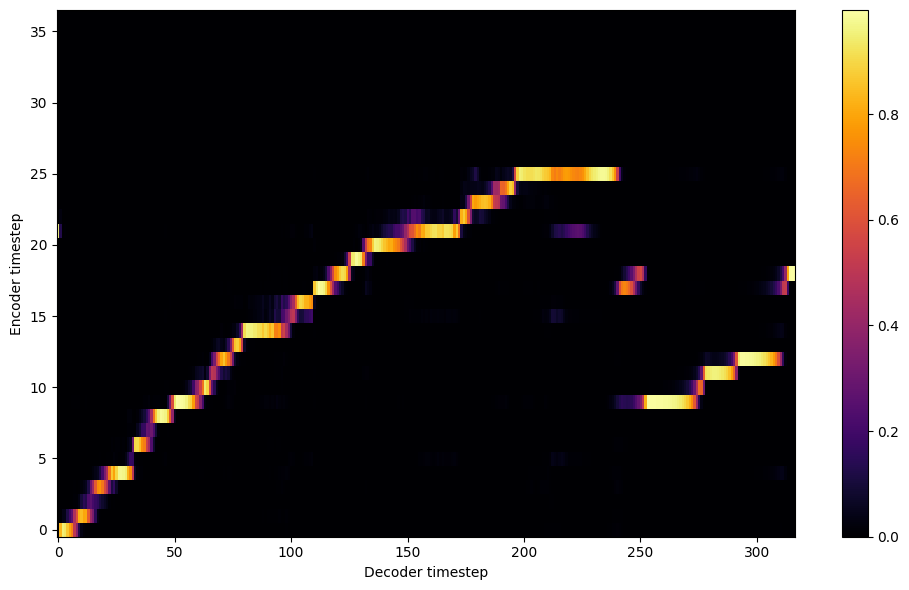


Starting Epoch: 39 Iteration: 624


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 39 Validation loss 640:  0.194834  Time: 0.3m LR: 0.000300


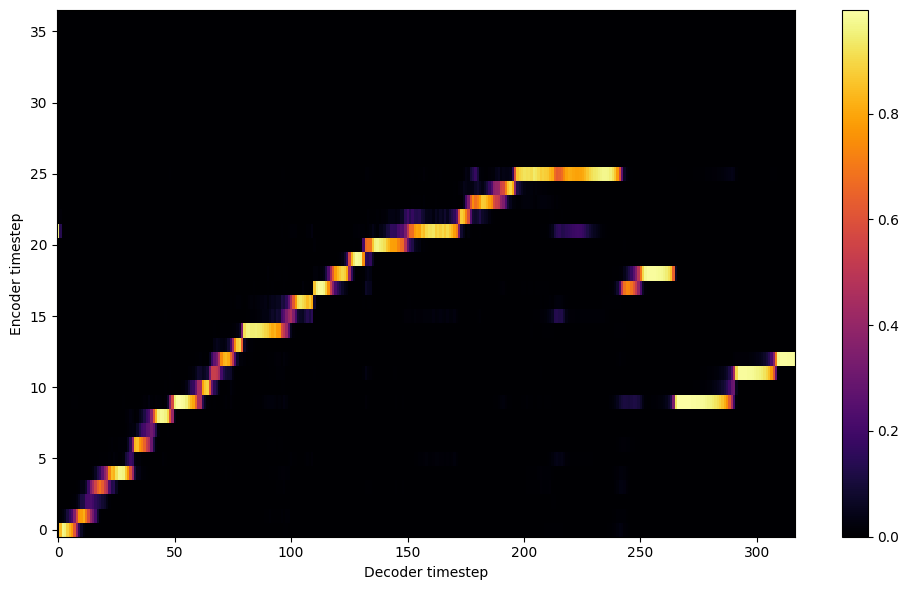

Saving model and optimizer state at iteration 640 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 40 Iteration: 640


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 40 Validation loss 656:  0.191417  Time: 0.4m LR: 0.000300


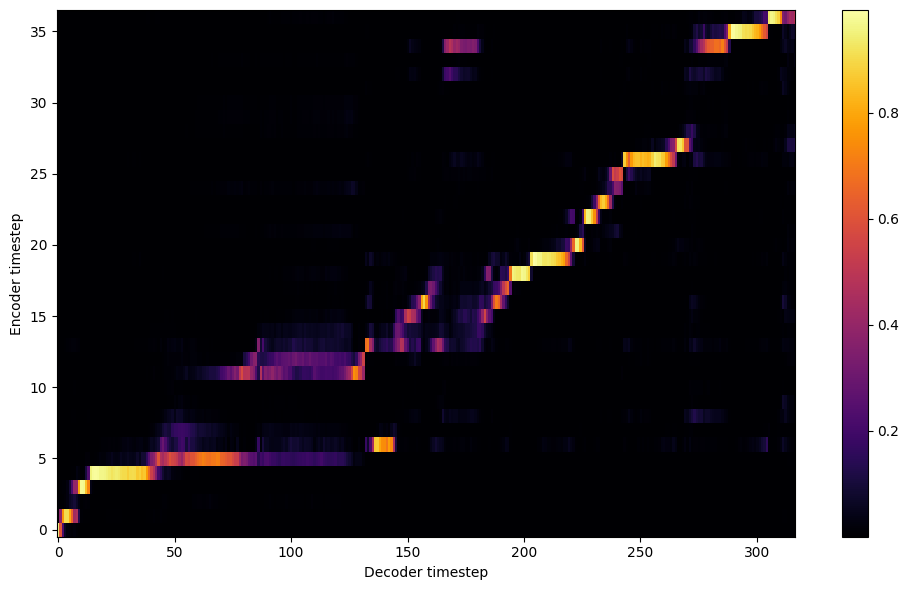


Starting Epoch: 41 Iteration: 656


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 41 Validation loss 672:  0.188629  Time: 0.3m LR: 0.000300


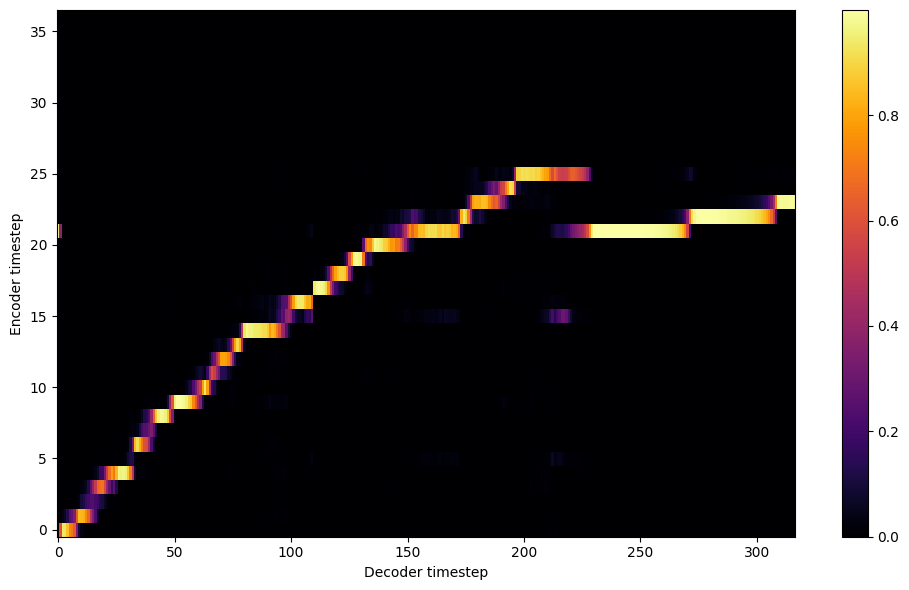


Starting Epoch: 42 Iteration: 672


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 42 Validation loss 688:  0.191892  Time: 0.3m LR: 0.000300


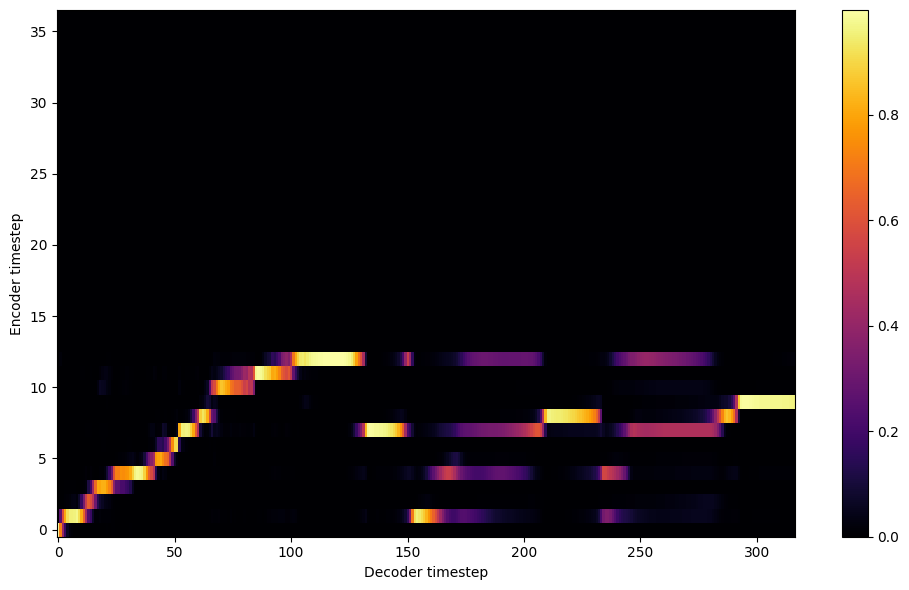


Starting Epoch: 43 Iteration: 688


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 43 Validation loss 704:  0.184714  Time: 0.3m LR: 0.000300


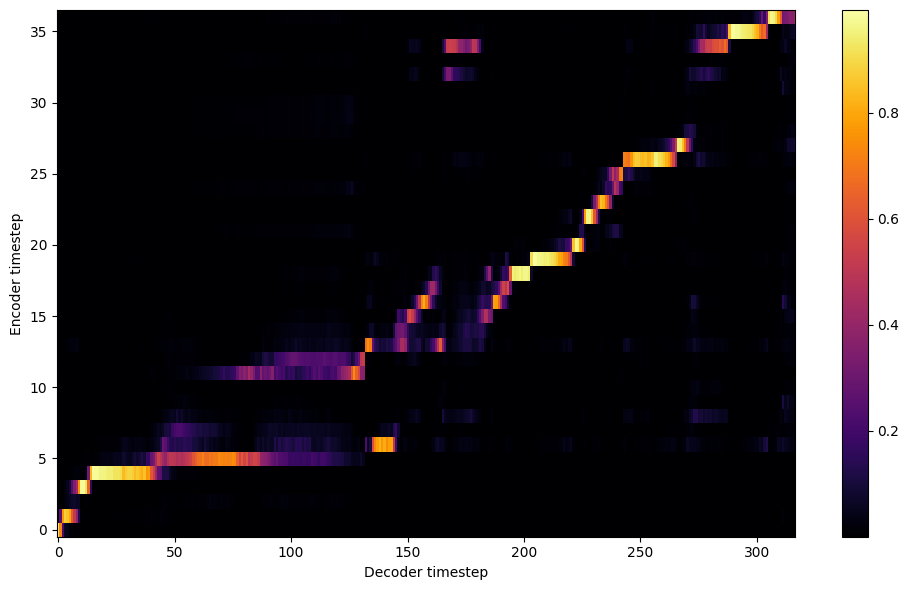


Starting Epoch: 44 Iteration: 704


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 44 Validation loss 720:  0.180912  Time: 0.3m LR: 0.000300


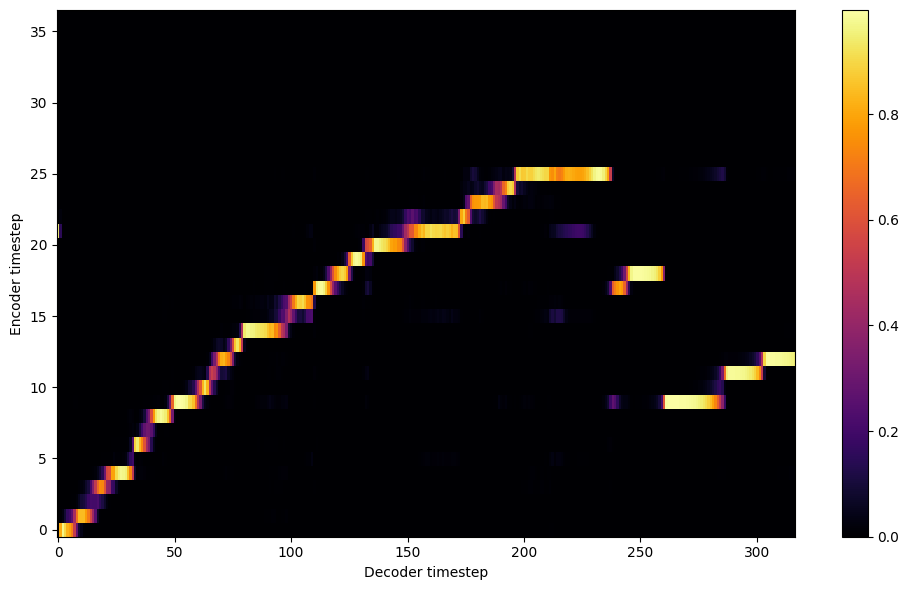


Starting Epoch: 45 Iteration: 720


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 45 Validation loss 736:  0.181854  Time: 0.3m LR: 0.000300


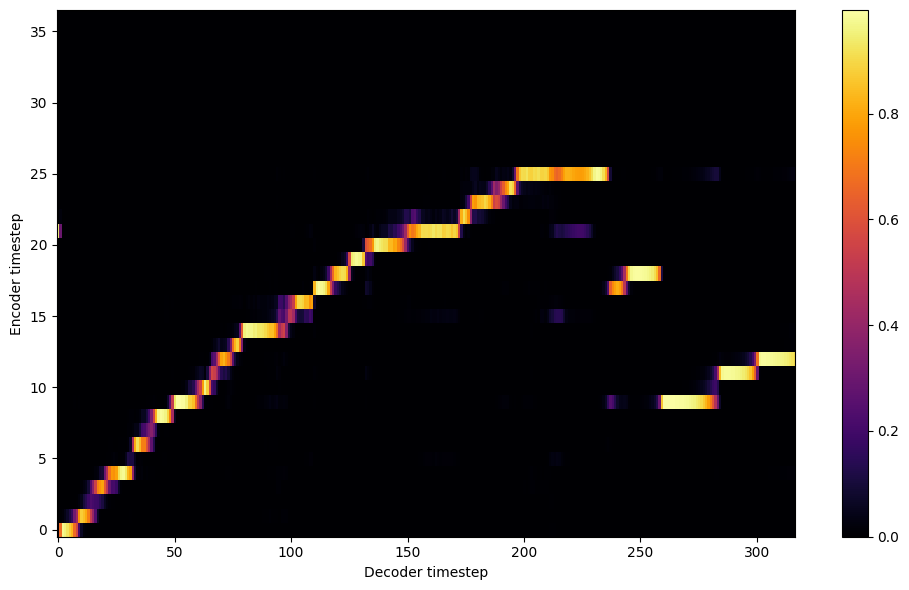


Starting Epoch: 46 Iteration: 736


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 46 Validation loss 752:  0.176639  Time: 0.3m LR: 0.000300


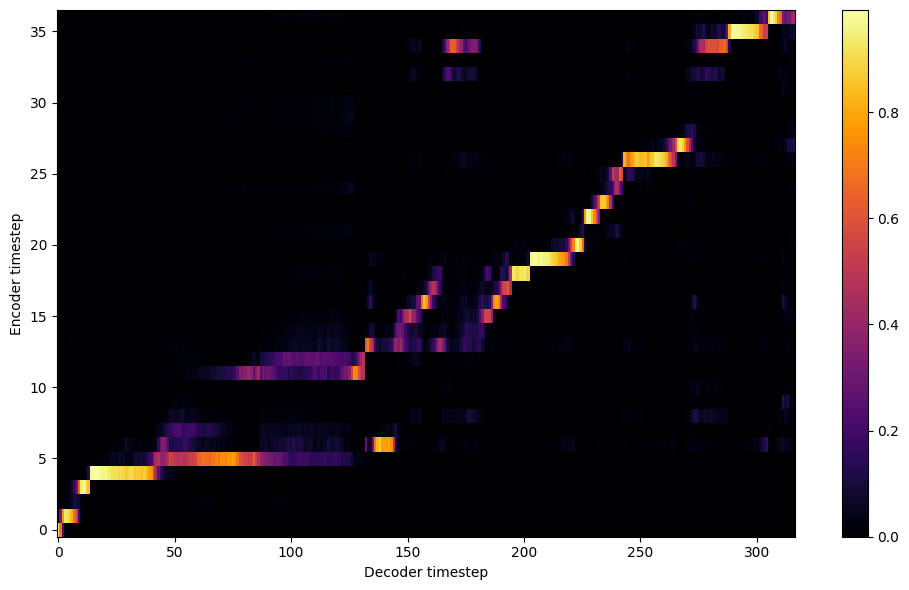


Starting Epoch: 47 Iteration: 752


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 47 Validation loss 768:  0.179461  Time: 0.3m LR: 0.000300


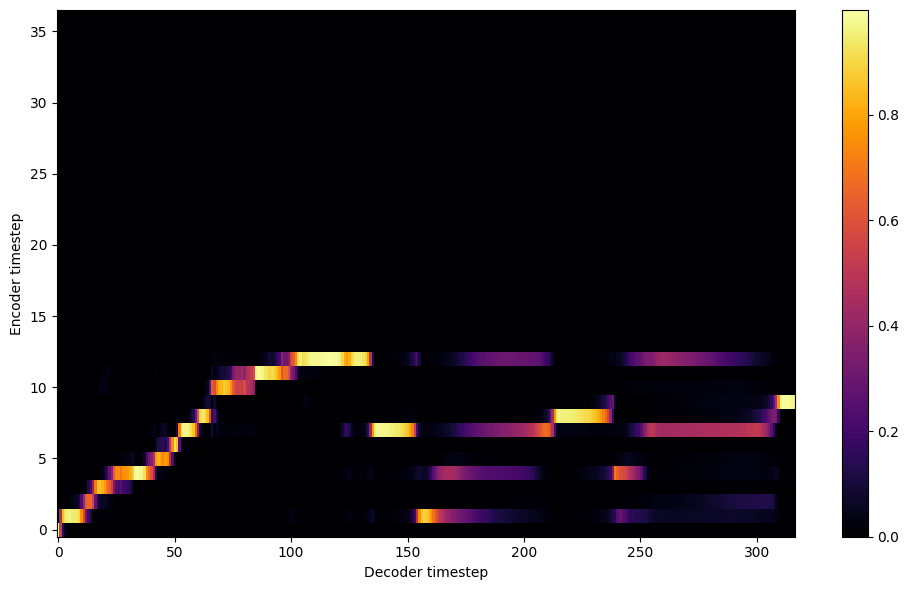


Starting Epoch: 48 Iteration: 768


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 48 Validation loss 784:  0.185276  Time: 0.3m LR: 0.000300


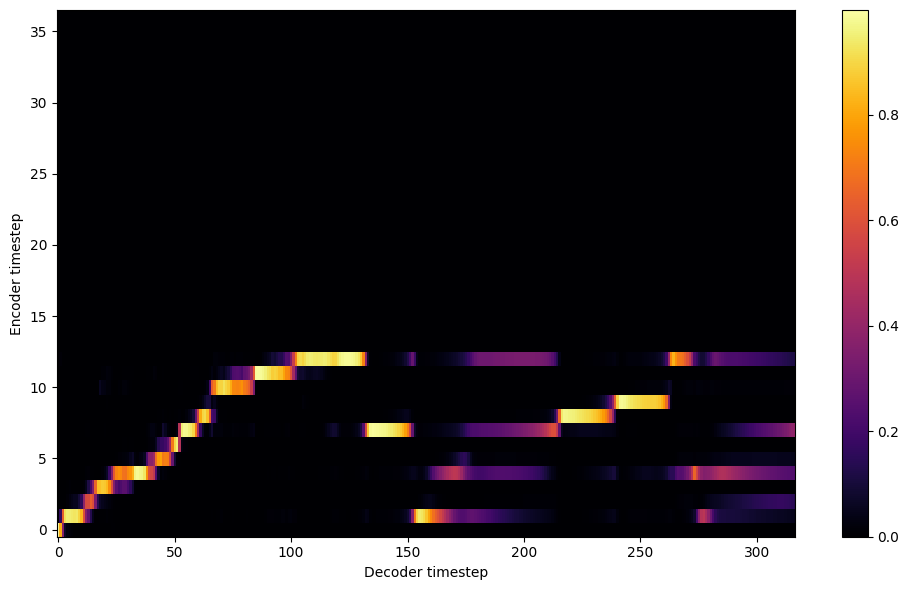


Starting Epoch: 49 Iteration: 784


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 49 Validation loss 800:  0.172185  Time: 0.3m LR: 0.000300


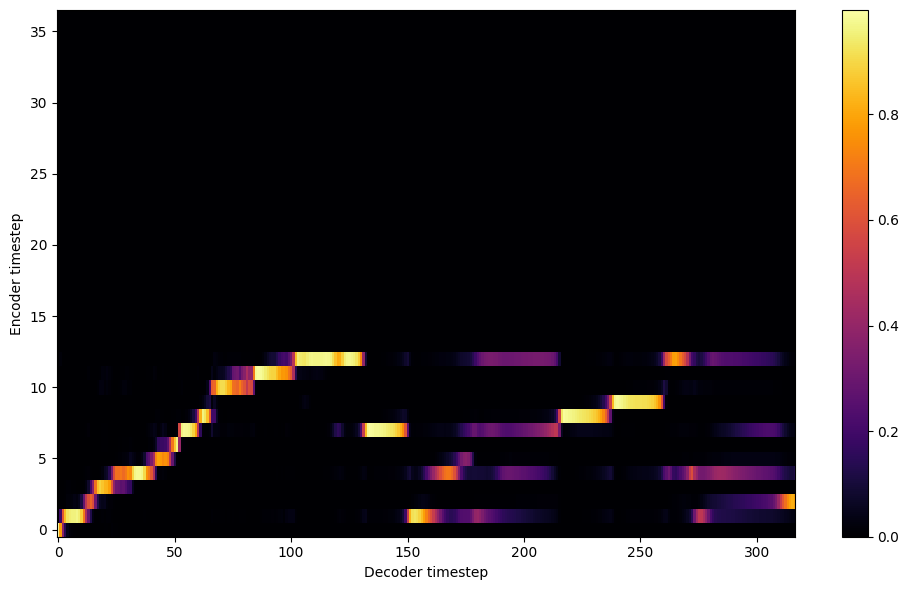

Saving model and optimizer state at iteration 800 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 50 Iteration: 800


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 50 Validation loss 816:  0.170994  Time: 0.3m LR: 0.000300


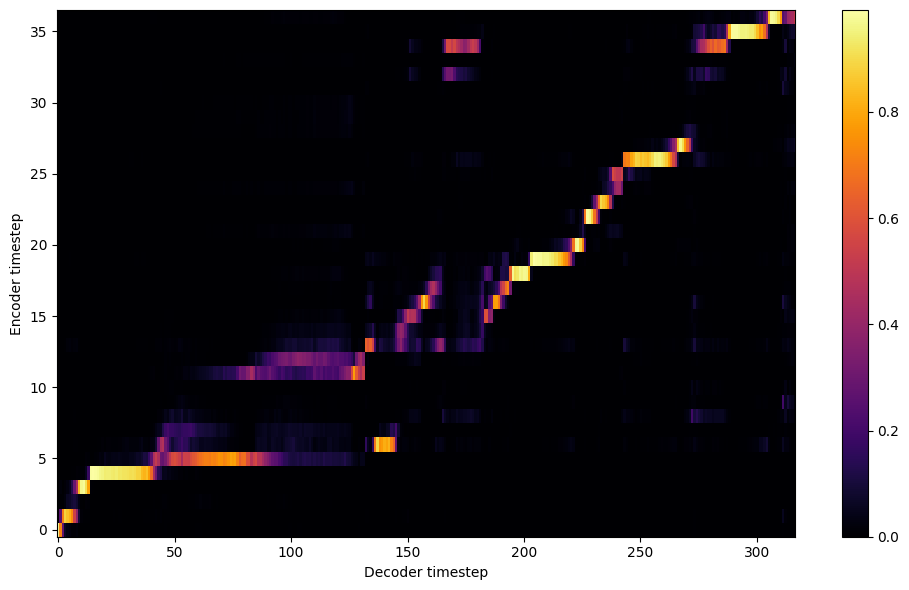


Starting Epoch: 51 Iteration: 816


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 51 Validation loss 832:  0.166343  Time: 0.3m LR: 0.000300


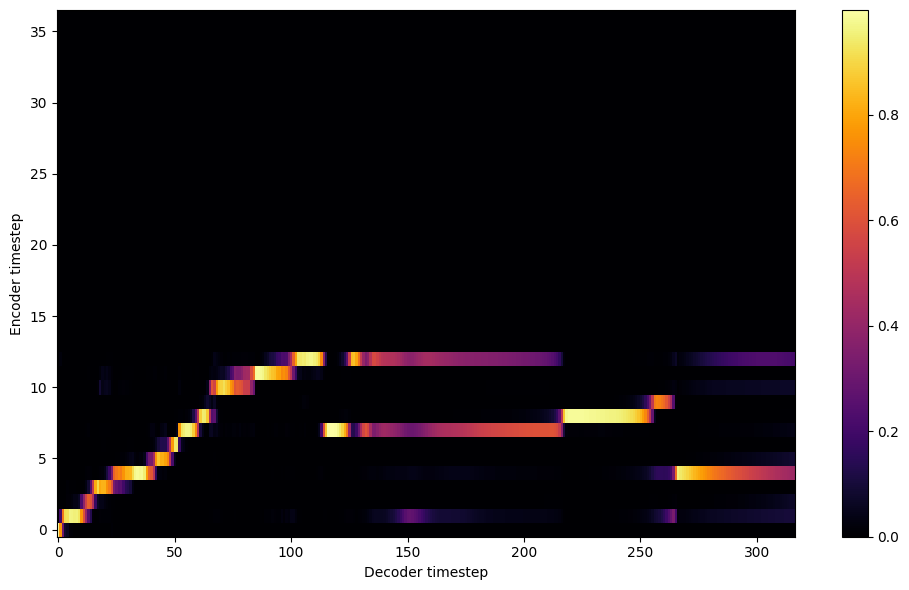


Starting Epoch: 52 Iteration: 832


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 52 Validation loss 848:  0.169154  Time: 0.3m LR: 0.000300


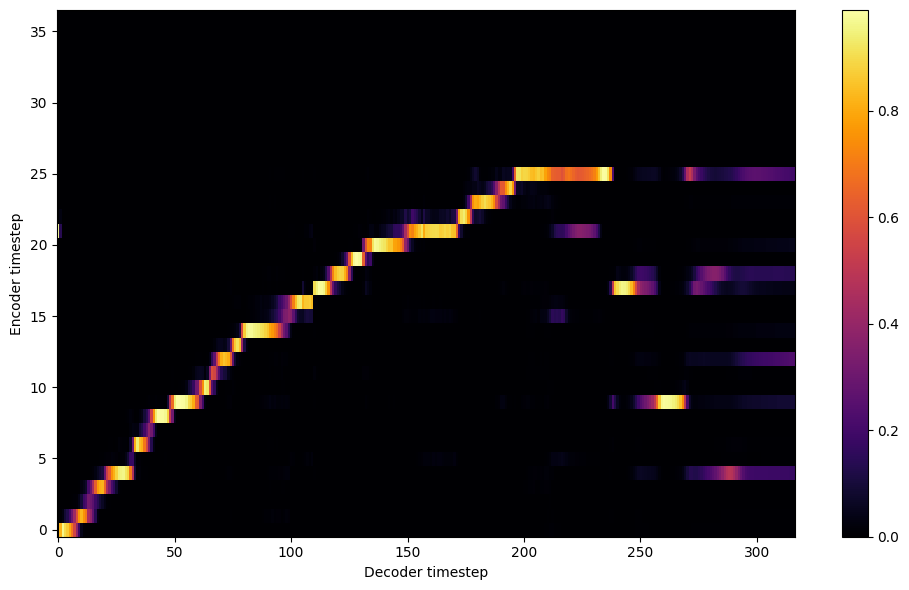


Starting Epoch: 53 Iteration: 848


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 53 Validation loss 864:  0.167720  Time: 0.3m LR: 0.000300


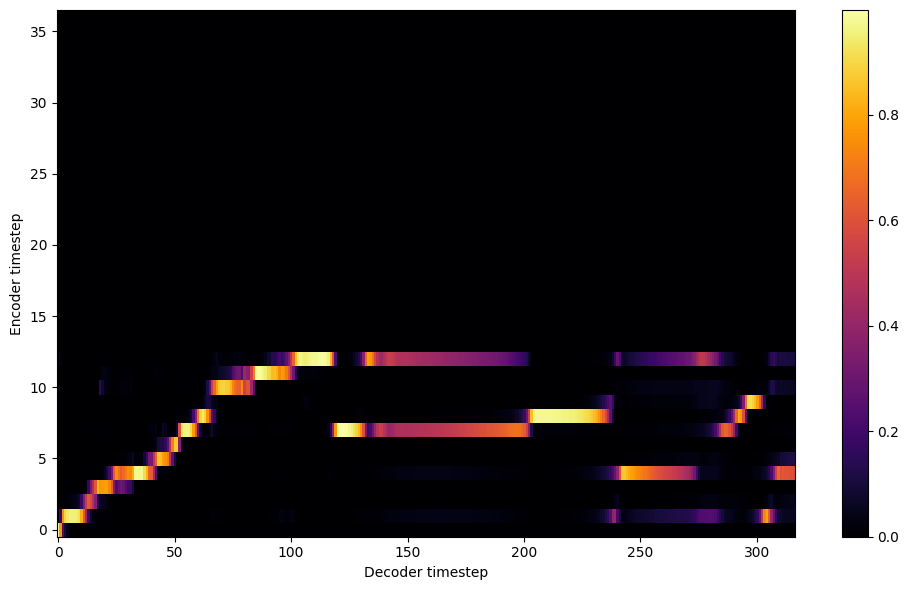


Starting Epoch: 54 Iteration: 864


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 54 Validation loss 880:  0.163349  Time: 0.3m LR: 0.000300


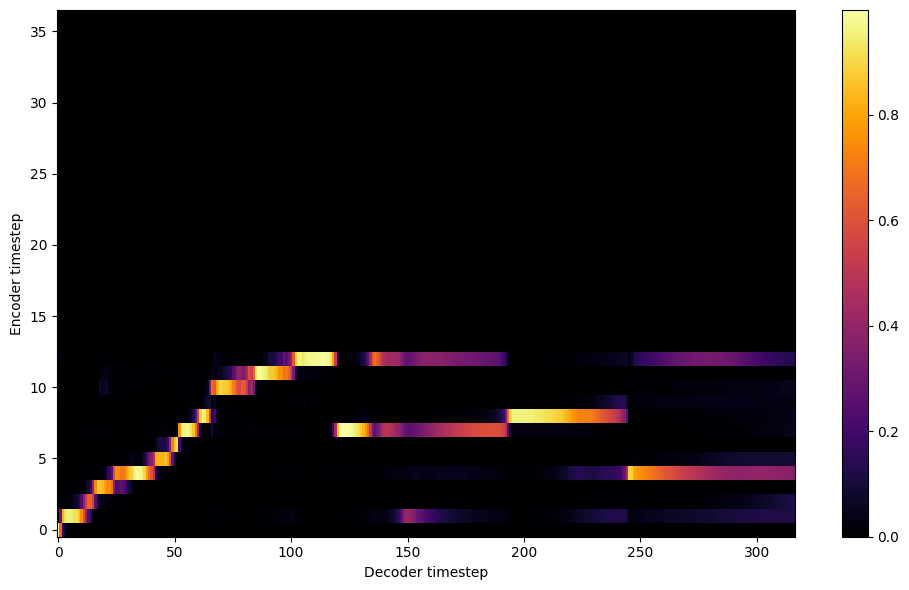


Starting Epoch: 55 Iteration: 880


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 55 Validation loss 896:  0.162881  Time: 0.3m LR: 0.000300


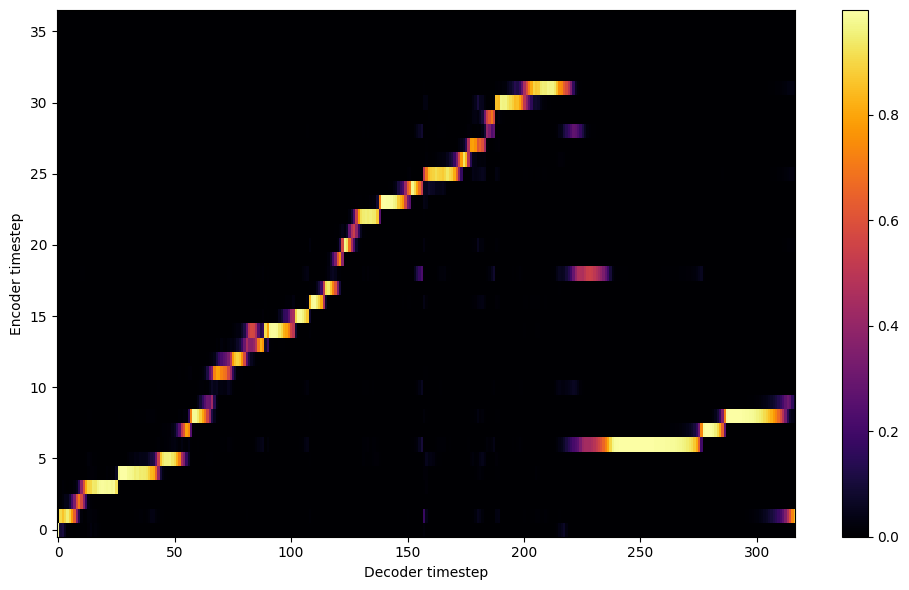


Starting Epoch: 56 Iteration: 896


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 56 Validation loss 912:  0.165498  Time: 0.3m LR: 0.000300


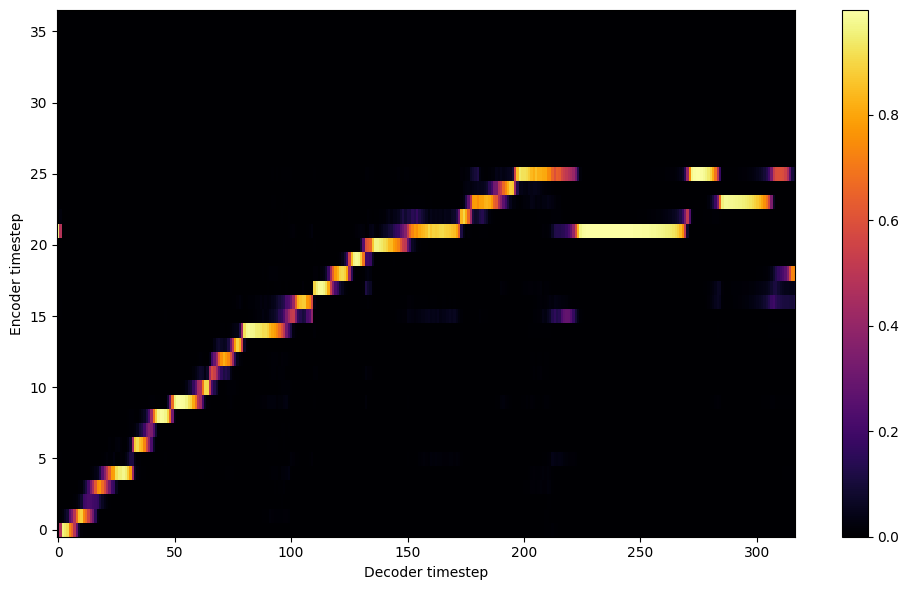


Starting Epoch: 57 Iteration: 912


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 57 Validation loss 928:  0.160101  Time: 0.3m LR: 0.000300


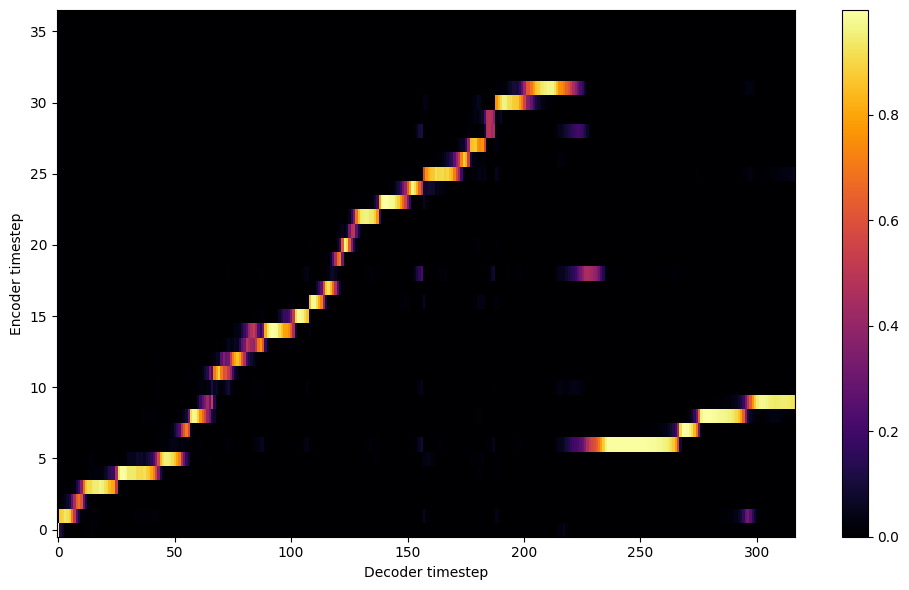


Starting Epoch: 58 Iteration: 928


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 58 Validation loss 944:  0.160476  Time: 0.3m LR: 0.000300


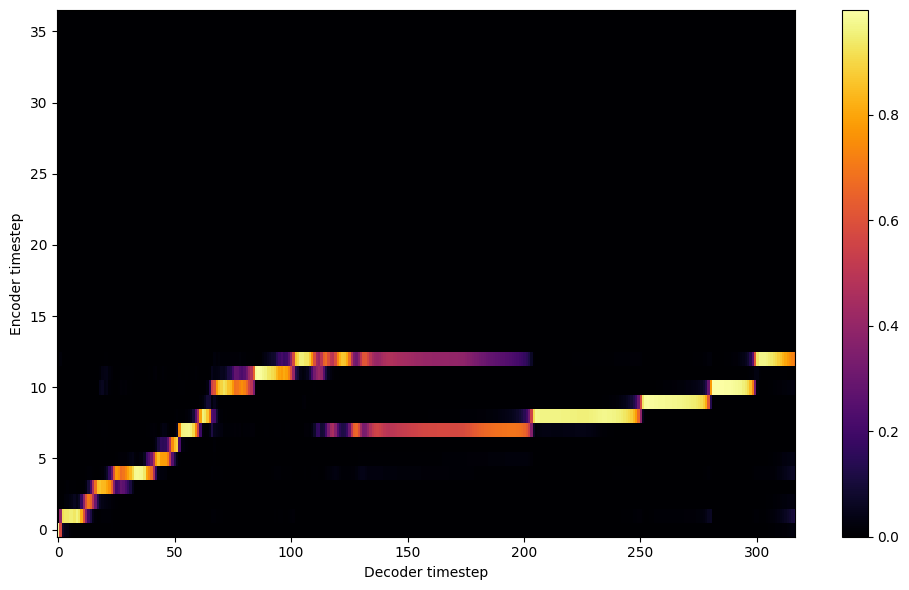


Starting Epoch: 59 Iteration: 944


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 59 Validation loss 960:  0.160640  Time: 0.3m LR: 0.000300


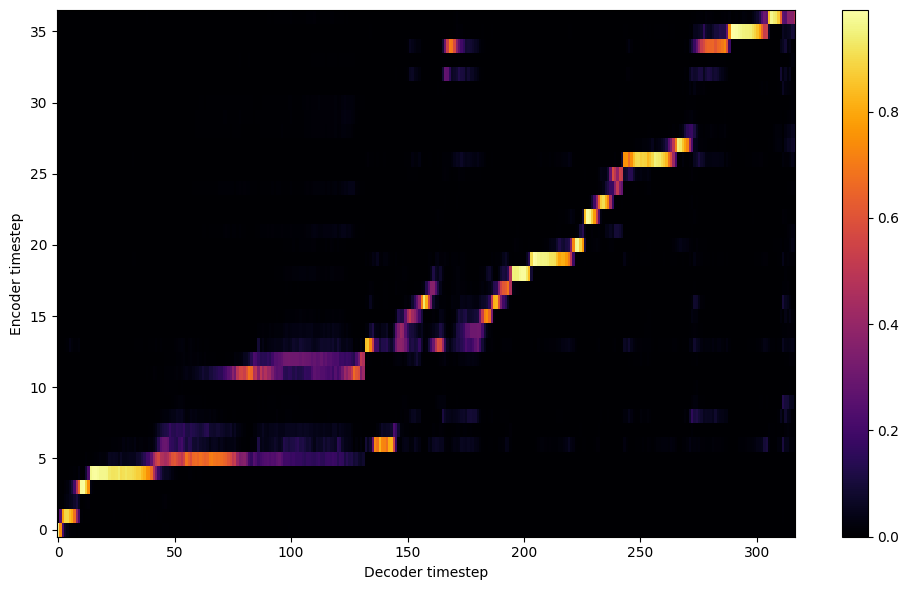

Saving model and optimizer state at iteration 960 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 60 Iteration: 960


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 60 Validation loss 976:  0.162068  Time: 0.3m LR: 0.000300


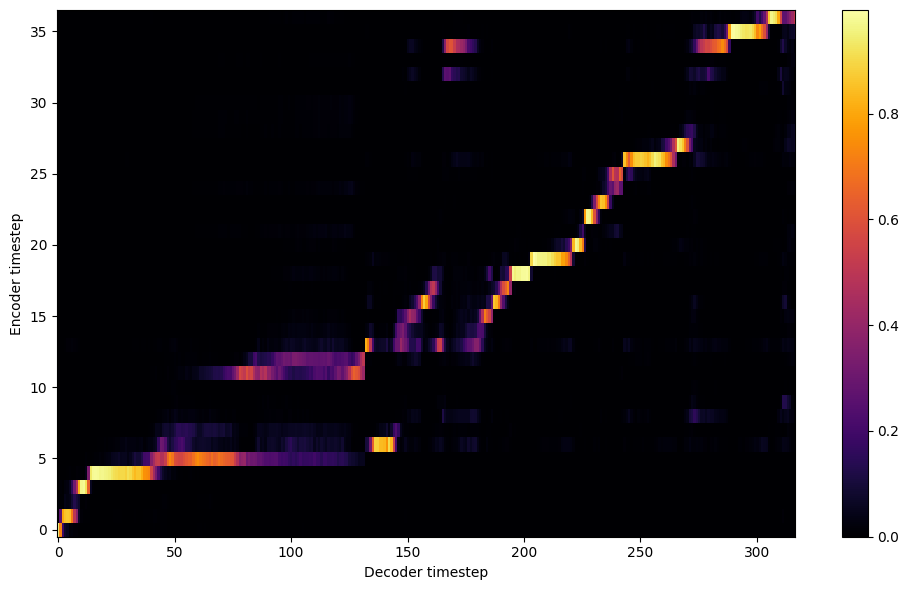


Starting Epoch: 61 Iteration: 976


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 61 Validation loss 992:  0.152361  Time: 0.3m LR: 0.000300


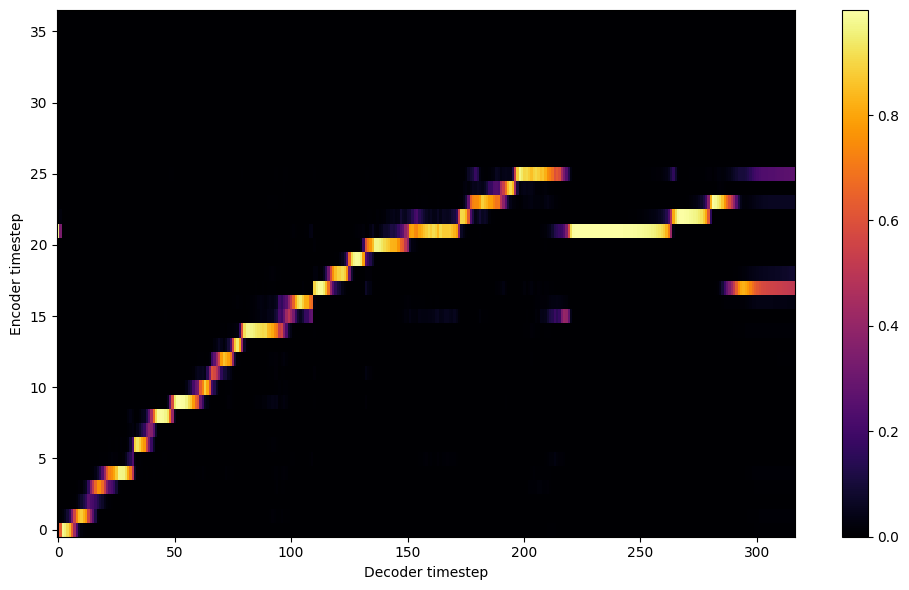


Starting Epoch: 62 Iteration: 992


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 62 Validation loss 1008:  0.151455  Time: 0.3m LR: 0.000300


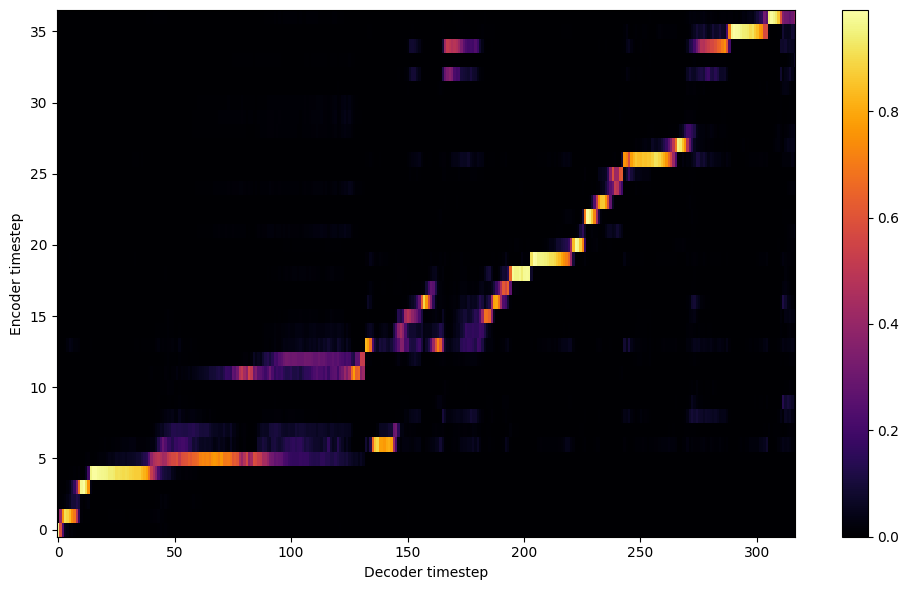


Starting Epoch: 63 Iteration: 1008


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 63 Validation loss 1024:  0.153686  Time: 0.3m LR: 0.000300


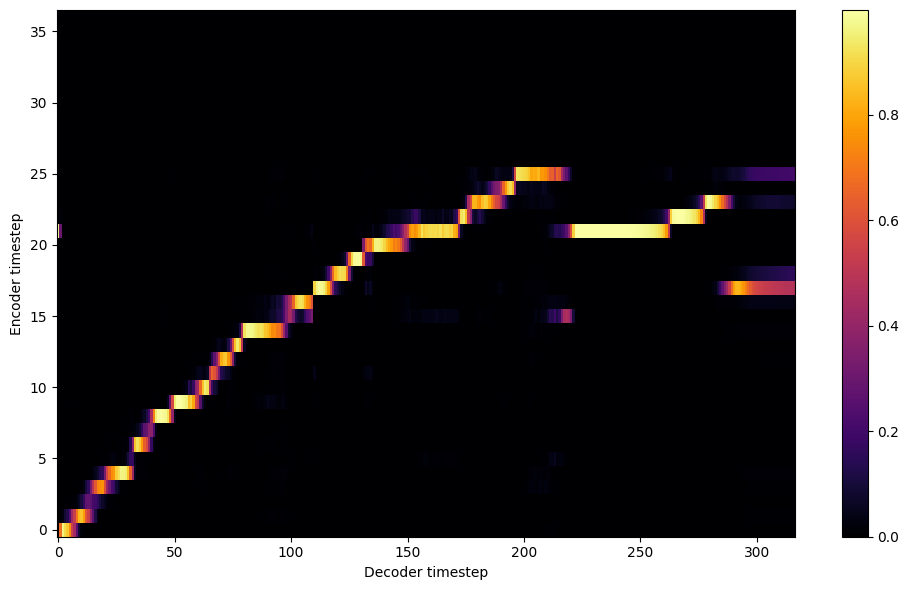


Starting Epoch: 64 Iteration: 1024


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 64 Validation loss 1040:  0.149028  Time: 0.3m LR: 0.000300


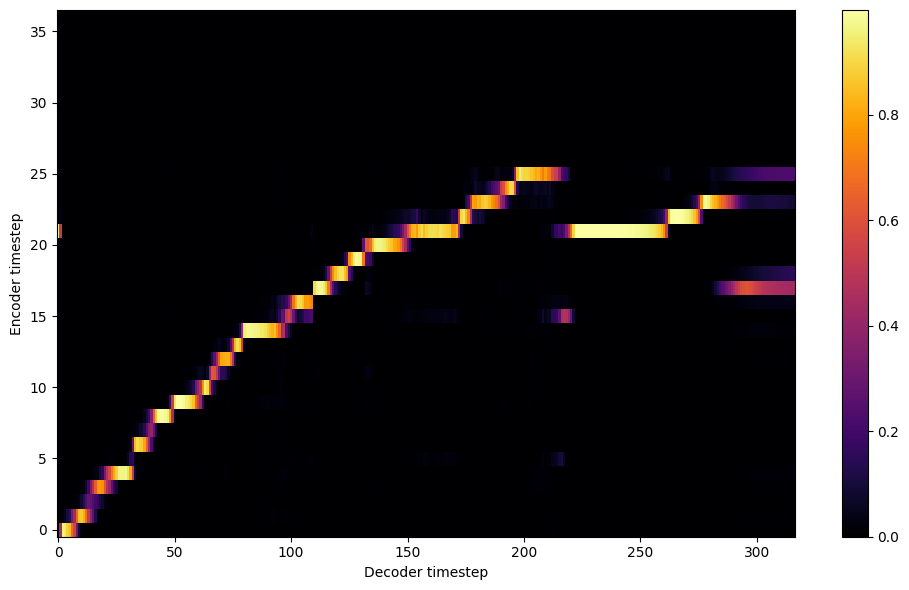


Starting Epoch: 65 Iteration: 1040


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 65 Validation loss 1056:  0.149931  Time: 0.3m LR: 0.000300


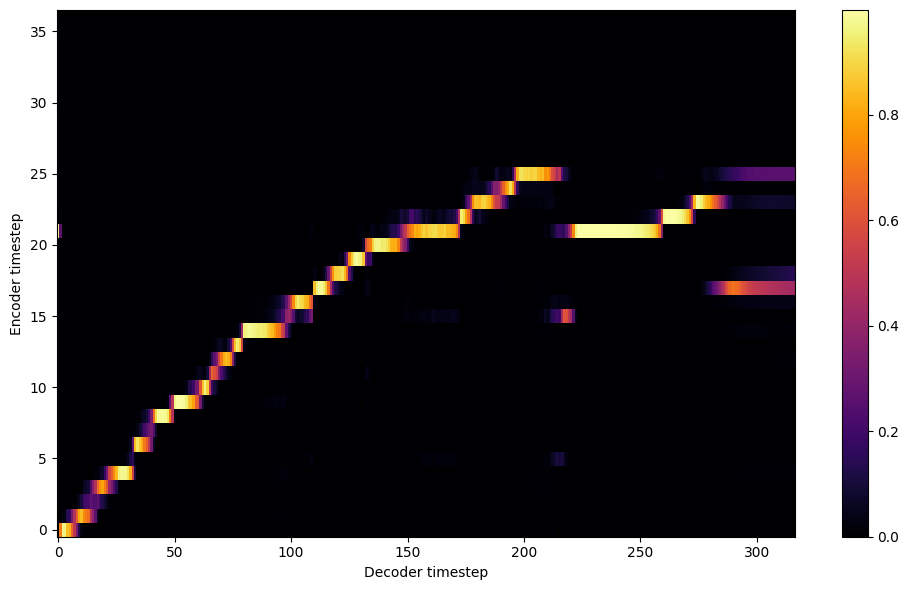


Starting Epoch: 66 Iteration: 1056


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 66 Validation loss 1072:  0.151471  Time: 0.3m LR: 0.000300


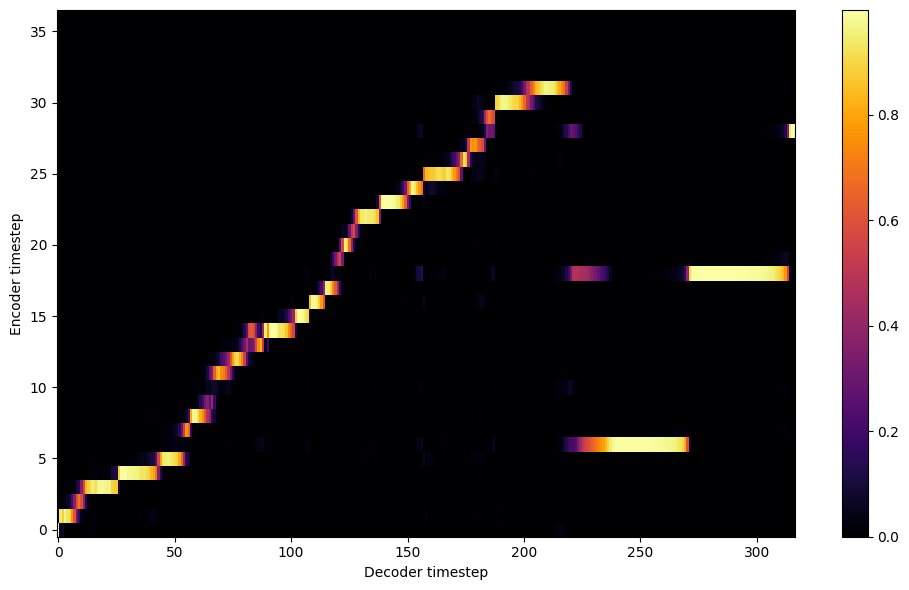


Starting Epoch: 67 Iteration: 1072


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 67 Validation loss 1088:  0.150881  Time: 0.3m LR: 0.000300


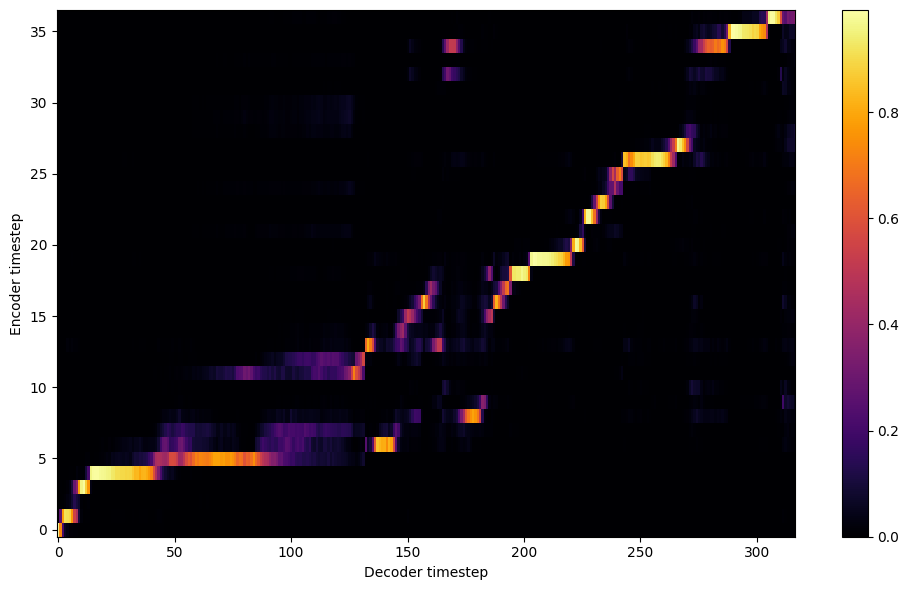


Starting Epoch: 68 Iteration: 1088


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 68 Validation loss 1104:  0.152504  Time: 0.3m LR: 0.000300


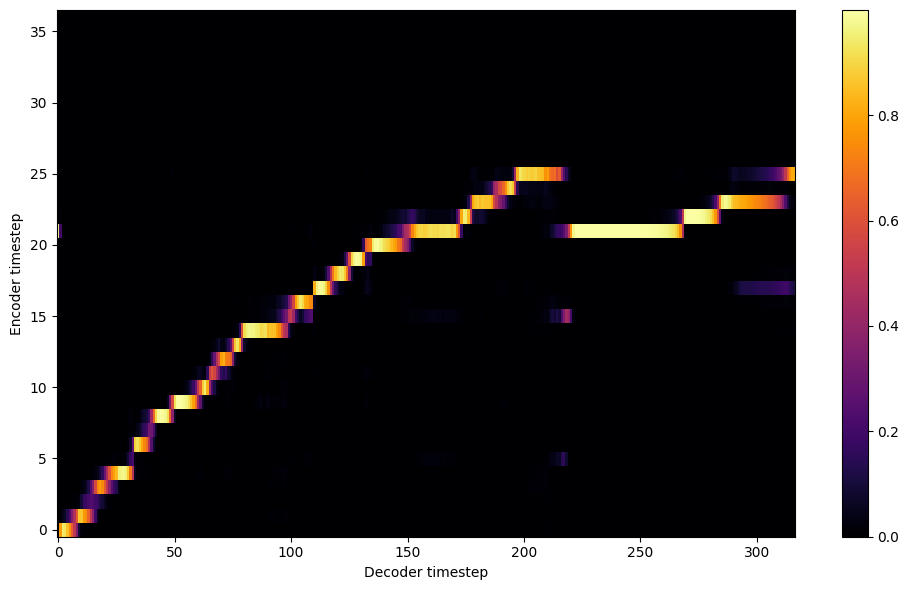


Starting Epoch: 69 Iteration: 1104


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 69 Validation loss 1120:  0.147456  Time: 0.3m LR: 0.000300


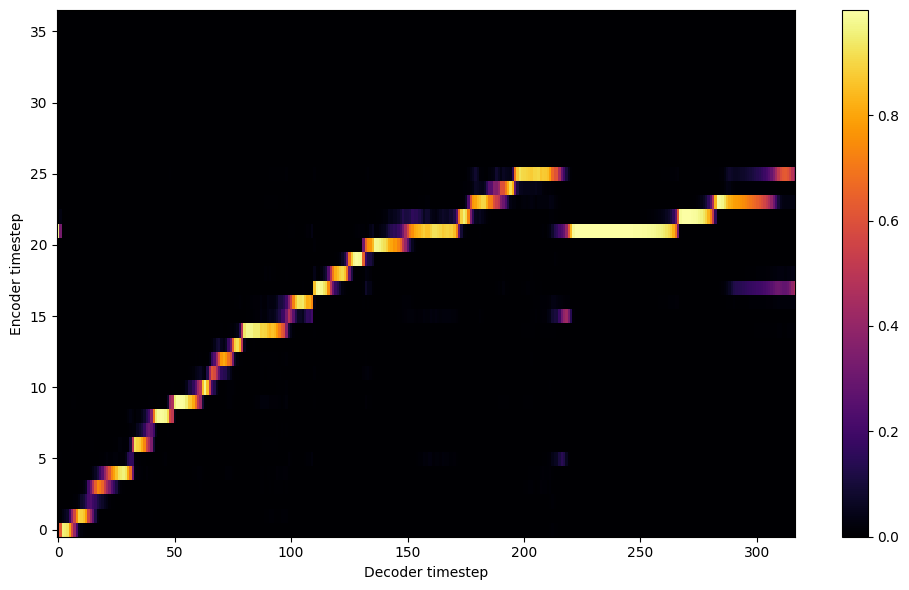

Saving model and optimizer state at iteration 1120 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 70 Iteration: 1120


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 70 Validation loss 1136:  0.148300  Time: 0.3m LR: 0.000300


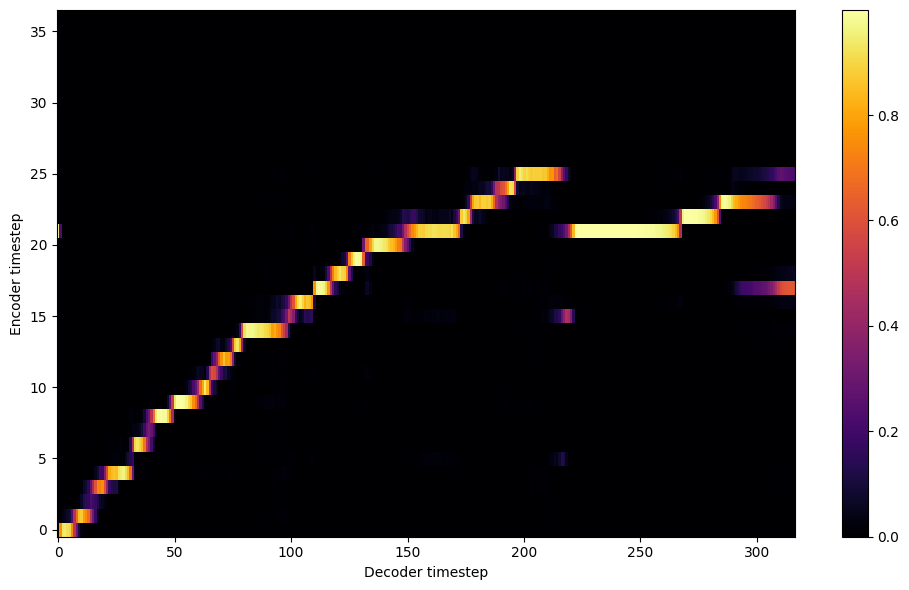


Starting Epoch: 71 Iteration: 1136


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 71 Validation loss 1152:  0.145211  Time: 0.3m LR: 0.000300


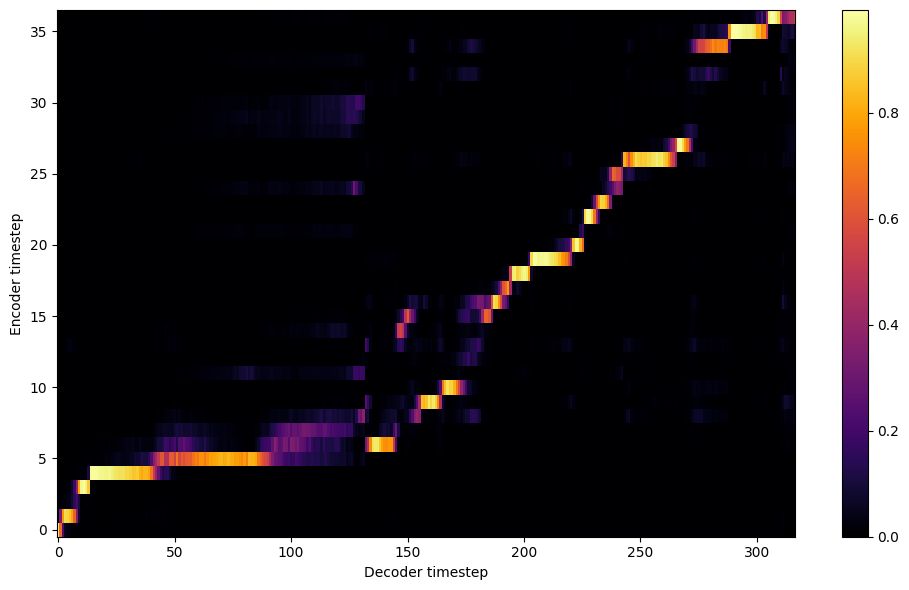


Starting Epoch: 72 Iteration: 1152


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 72 Validation loss 1168:  0.143730  Time: 0.3m LR: 0.000300


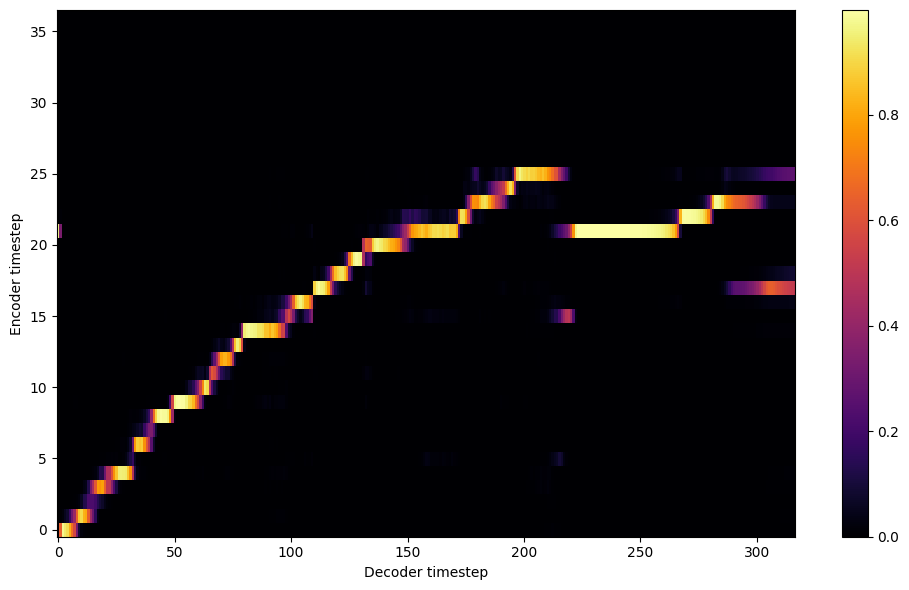


Starting Epoch: 73 Iteration: 1168


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 73 Validation loss 1184:  0.141523  Time: 0.3m LR: 0.000300


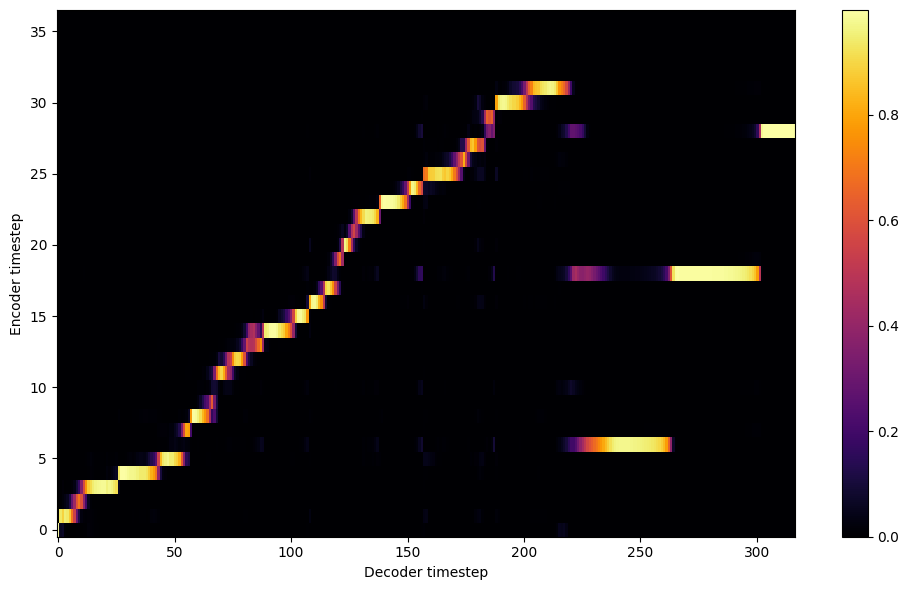


Starting Epoch: 74 Iteration: 1184


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 74 Validation loss 1200:  0.141835  Time: 0.3m LR: 0.000300


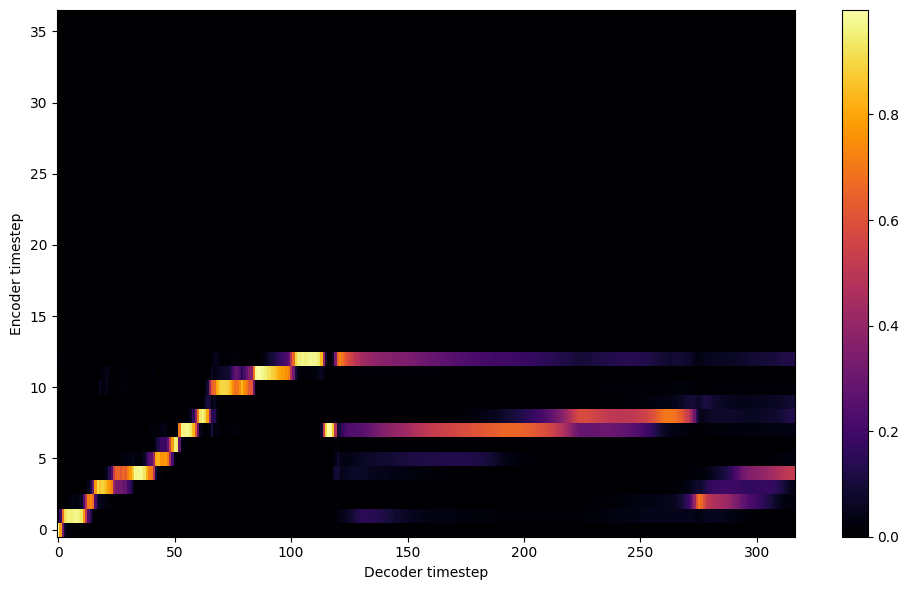


Starting Epoch: 75 Iteration: 1200


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 75 Validation loss 1216:  0.140589  Time: 0.3m LR: 0.000300


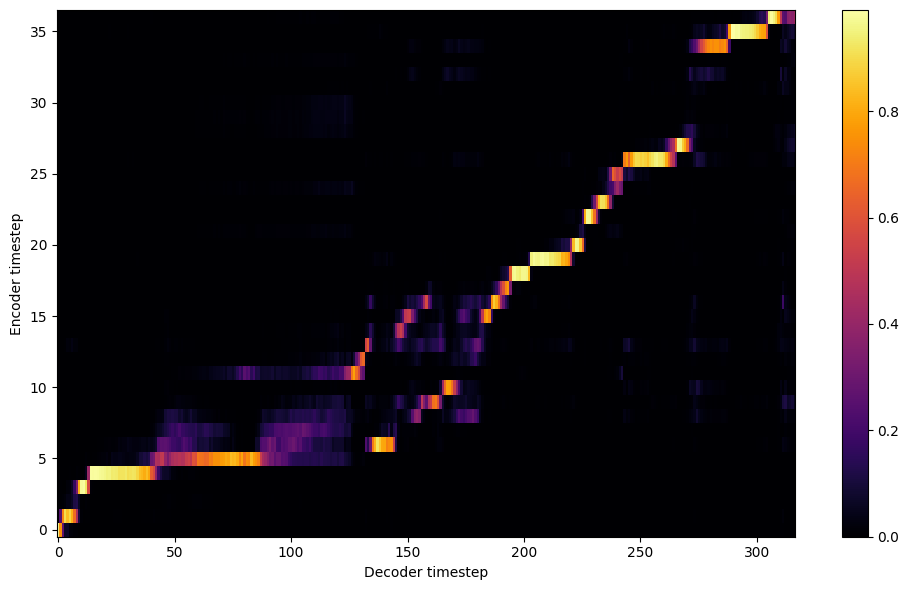


Starting Epoch: 76 Iteration: 1216


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 76 Validation loss 1232:  0.139017  Time: 0.3m LR: 0.000300


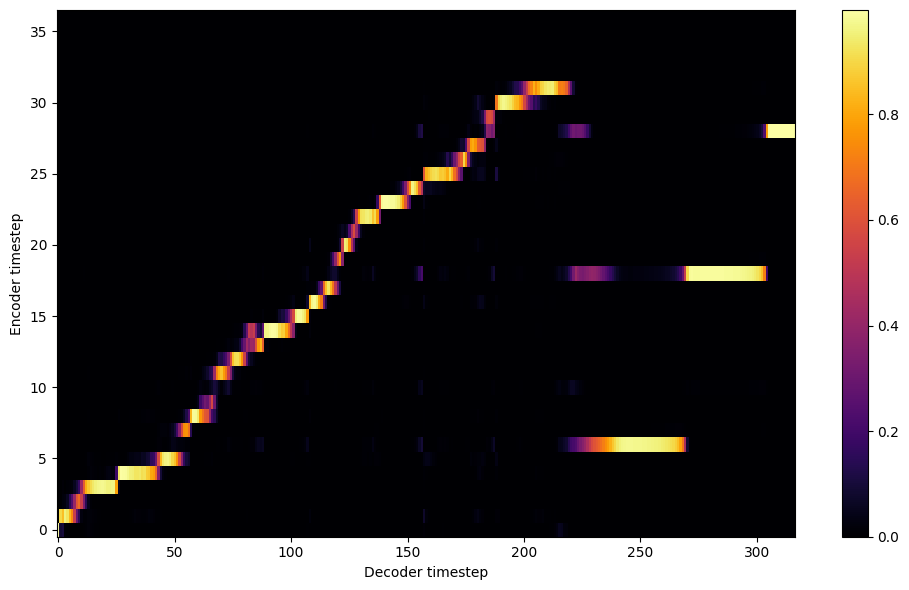


Starting Epoch: 77 Iteration: 1232


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 77 Validation loss 1248:  0.139836  Time: 0.3m LR: 0.000300


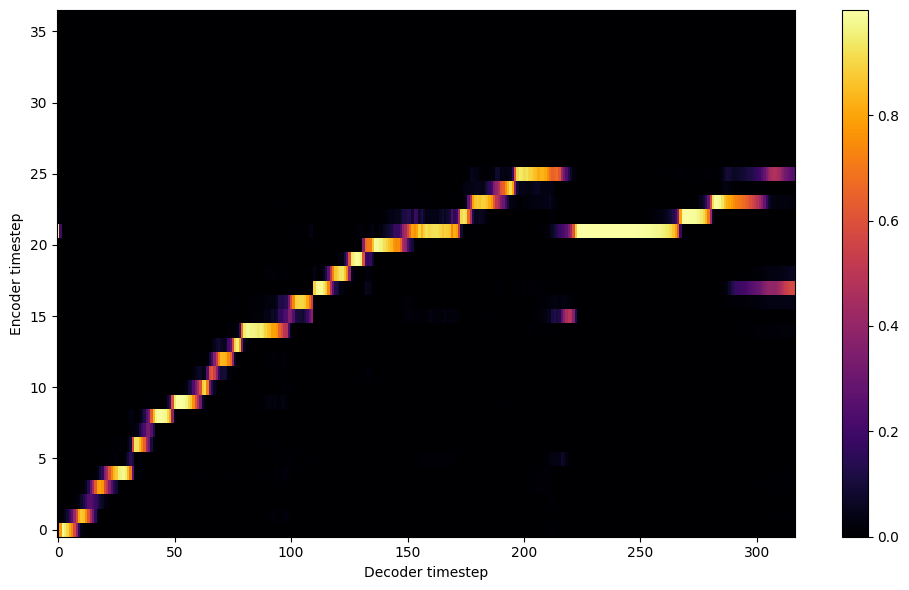


Starting Epoch: 78 Iteration: 1248


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 78 Validation loss 1264:  0.136747  Time: 0.3m LR: 0.000300


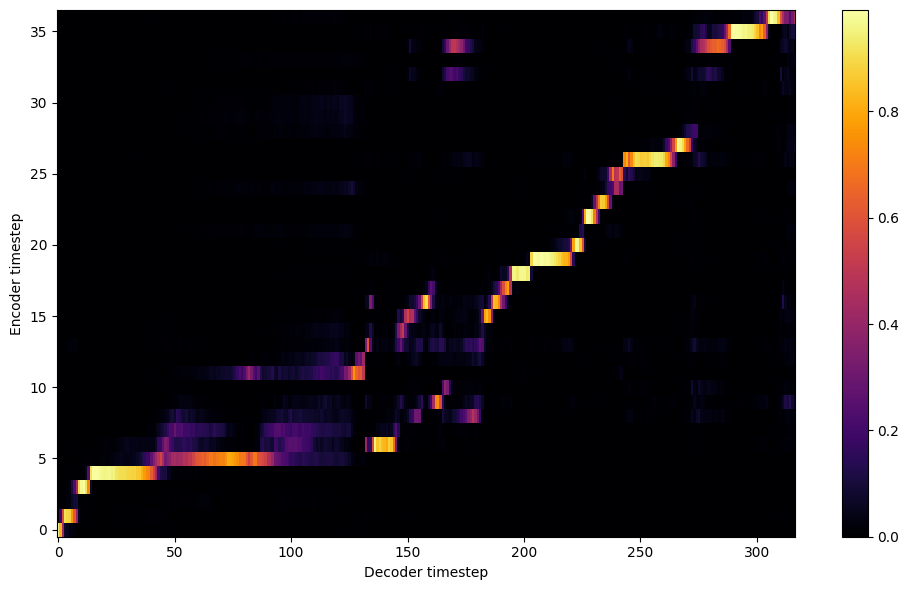


Starting Epoch: 79 Iteration: 1264


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 79 Validation loss 1280:  0.138353  Time: 0.3m LR: 0.000300


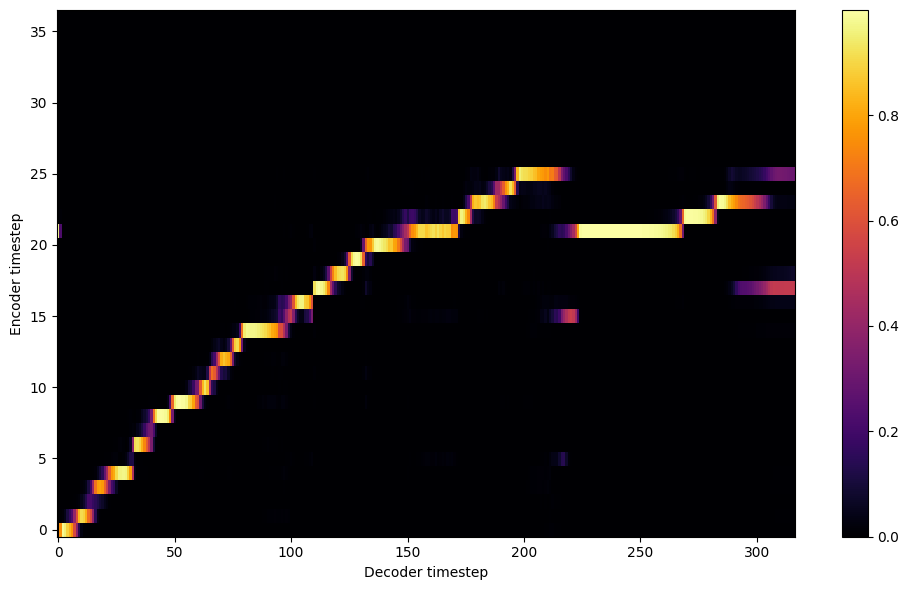

Saving model and optimizer state at iteration 1280 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 80 Iteration: 1280


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 80 Validation loss 1296:  0.136158  Time: 0.3m LR: 0.000300


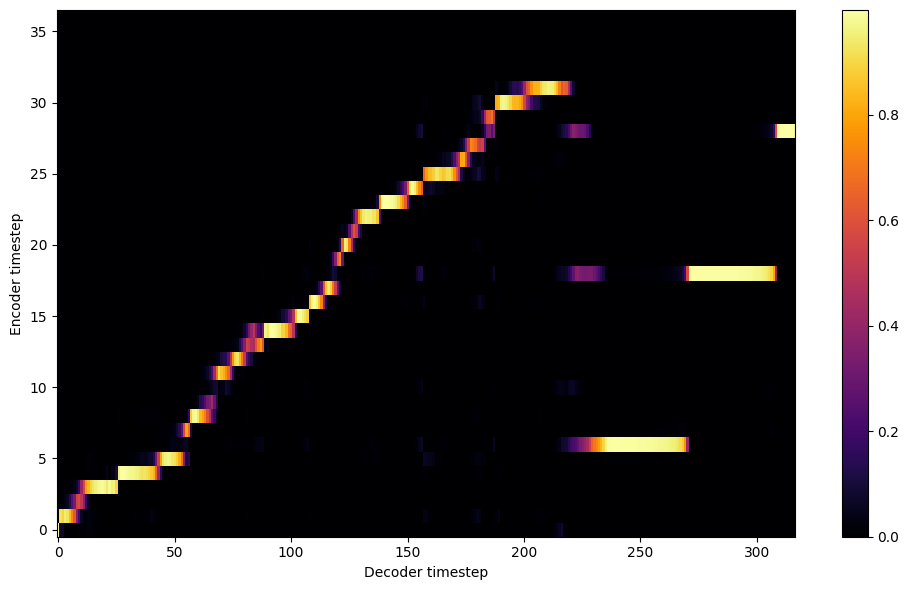


Starting Epoch: 81 Iteration: 1296


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 81 Validation loss 1312:  0.137416  Time: 0.3m LR: 0.000300


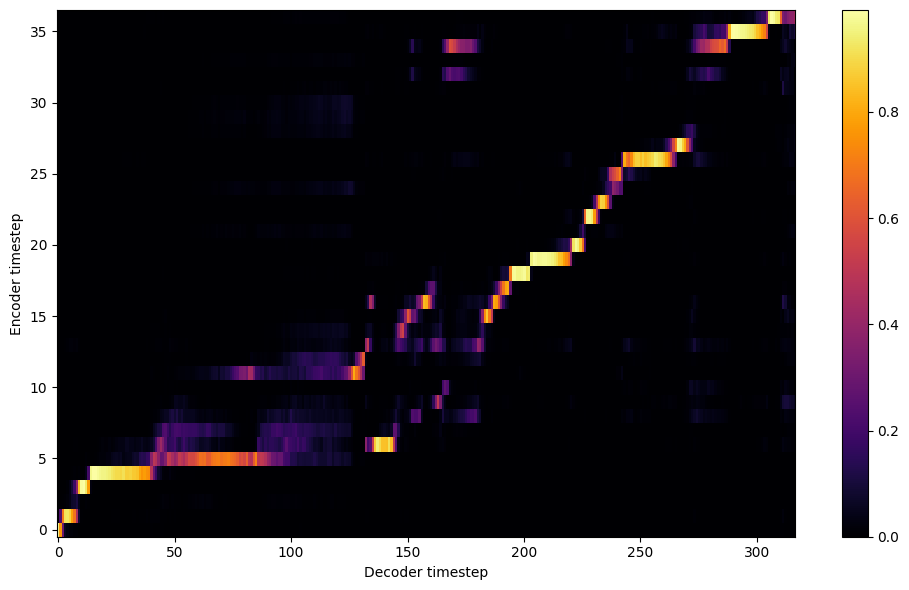


Starting Epoch: 82 Iteration: 1312


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 82 Validation loss 1328:  0.134699  Time: 0.3m LR: 0.000300


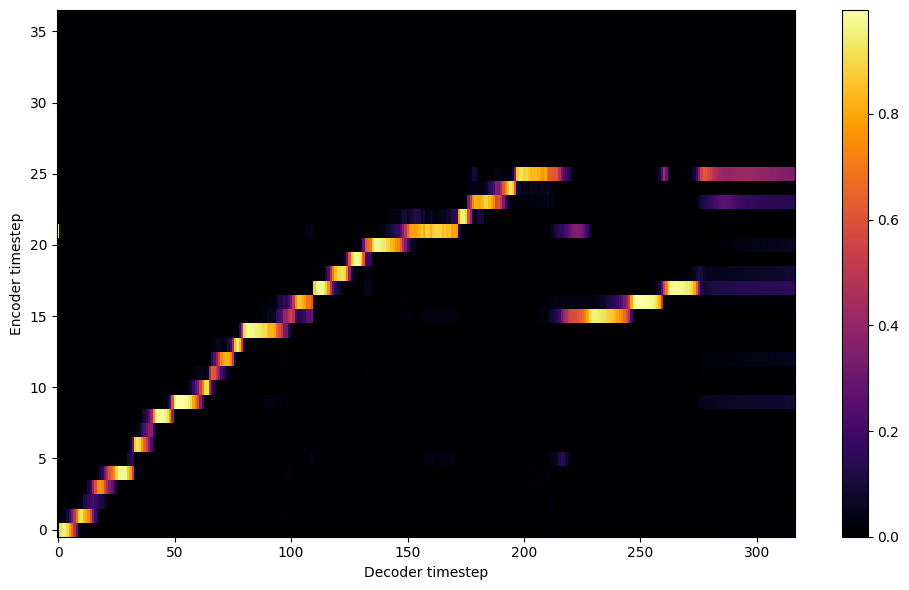


Starting Epoch: 83 Iteration: 1328


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 83 Validation loss 1344:  0.132375  Time: 0.3m LR: 0.000300


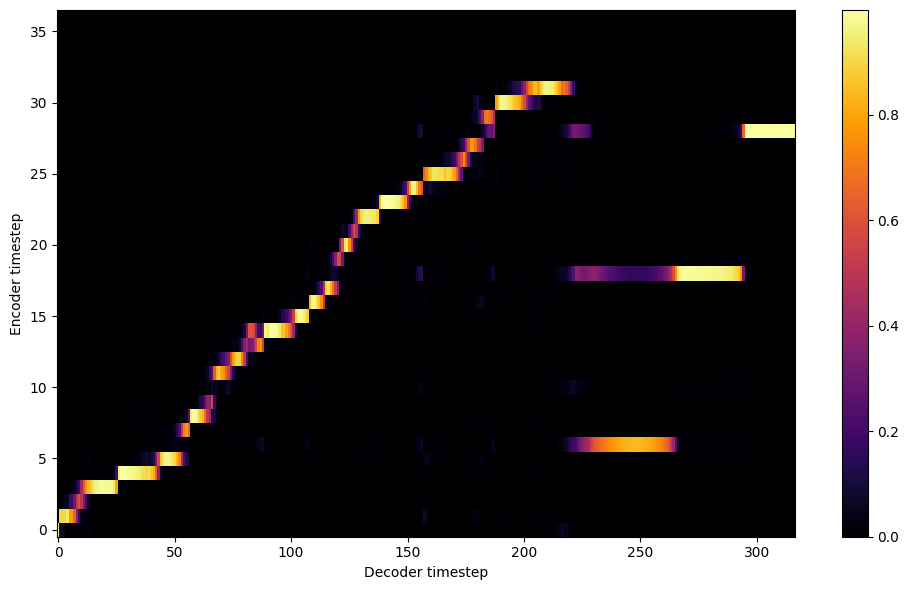


Starting Epoch: 84 Iteration: 1344


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 84 Validation loss 1360:  0.134004  Time: 0.3m LR: 0.000300


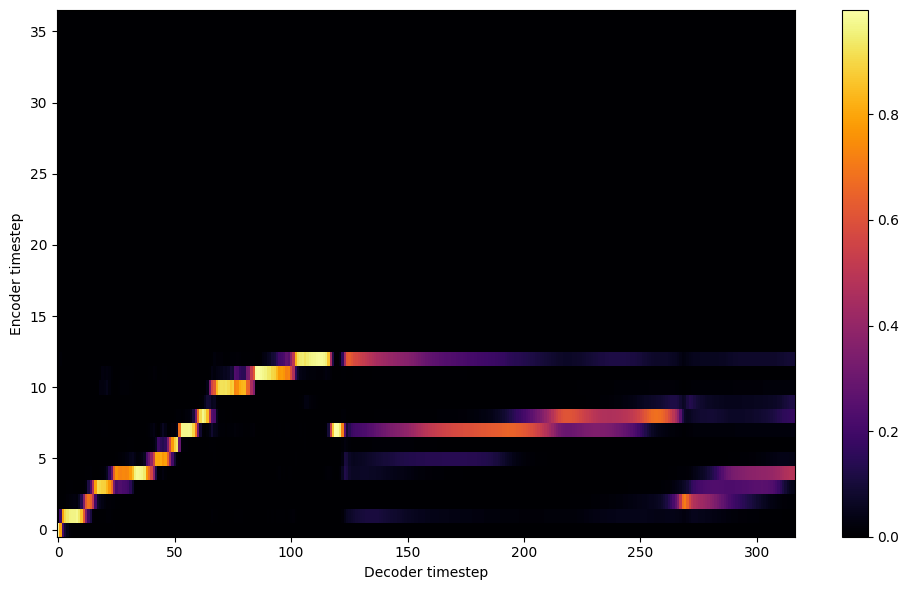


Starting Epoch: 85 Iteration: 1360


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 85 Validation loss 1376:  0.132979  Time: 0.3m LR: 0.000300


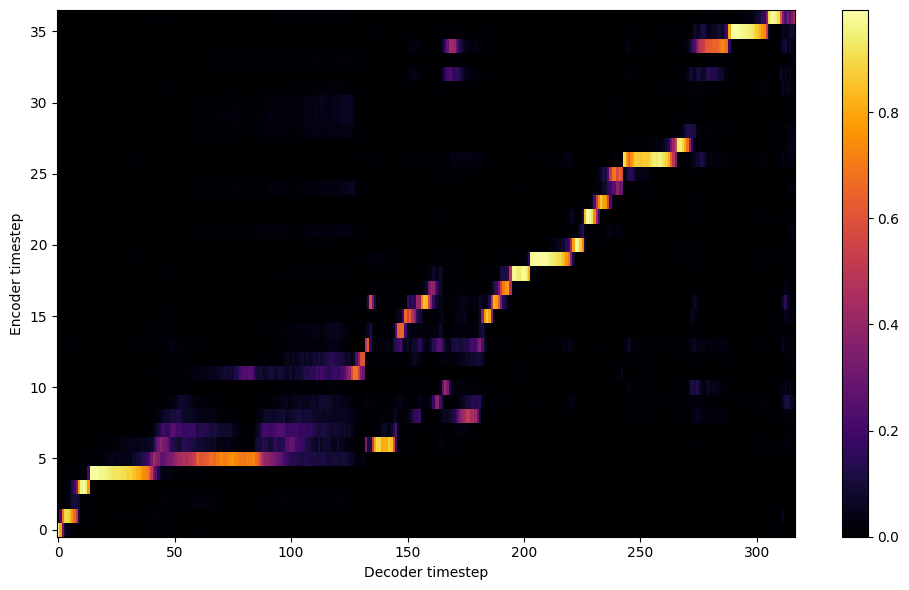


Starting Epoch: 86 Iteration: 1376


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 86 Validation loss 1392:  0.133615  Time: 0.3m LR: 0.000300


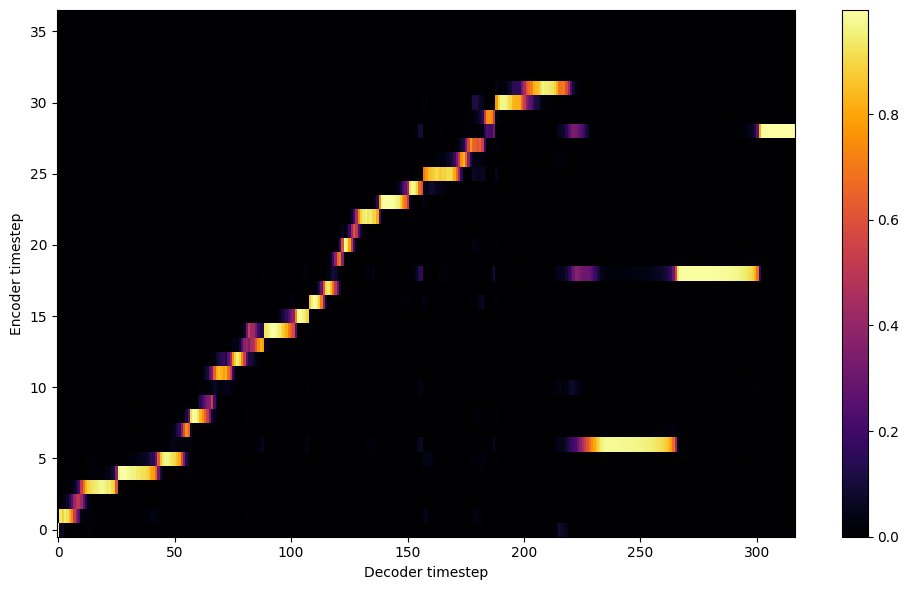


Starting Epoch: 87 Iteration: 1392


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 87 Validation loss 1408:  0.128010  Time: 0.3m LR: 0.000300


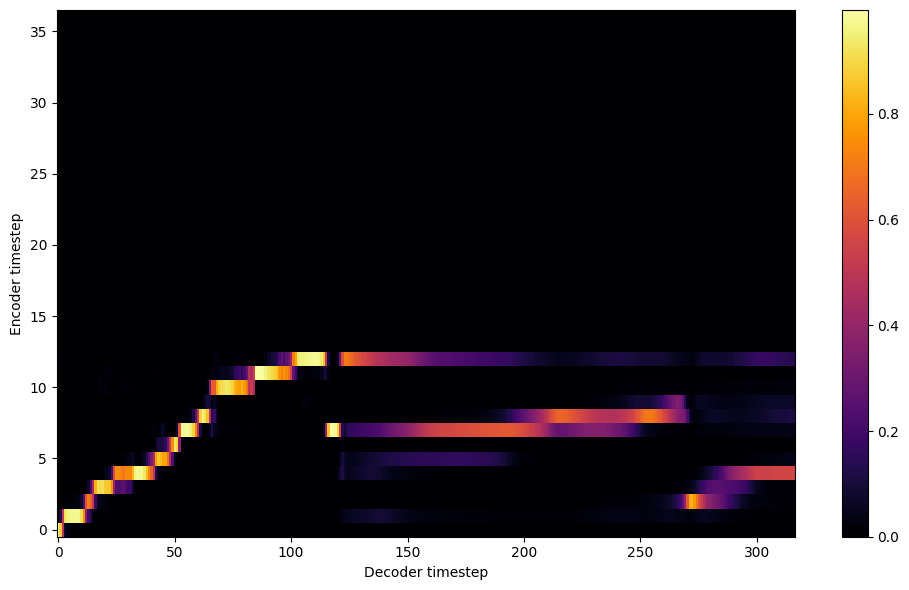


Starting Epoch: 88 Iteration: 1408


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 88 Validation loss 1424:  0.128089  Time: 0.3m LR: 0.000300


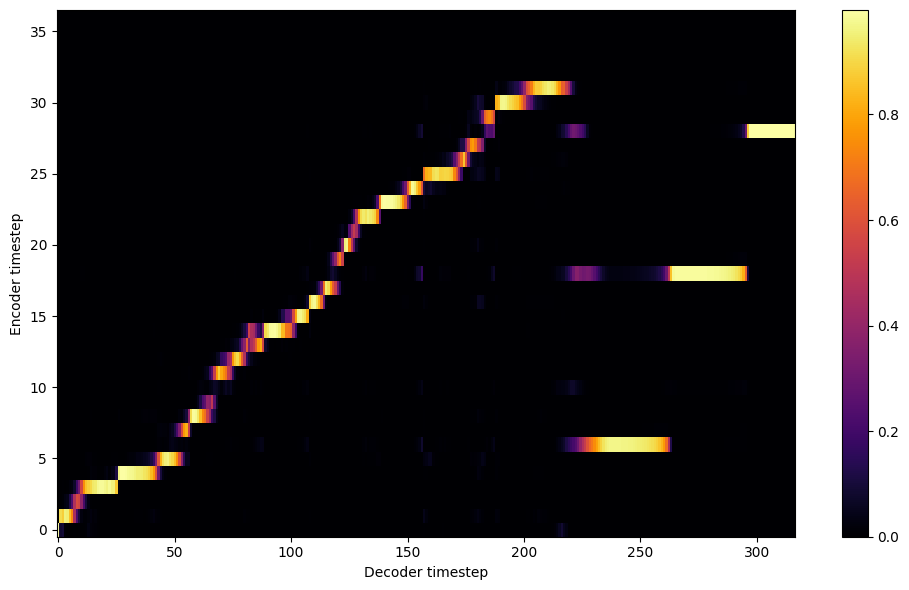


Starting Epoch: 89 Iteration: 1424


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 89 Validation loss 1440:  0.125609  Time: 0.3m LR: 0.000300


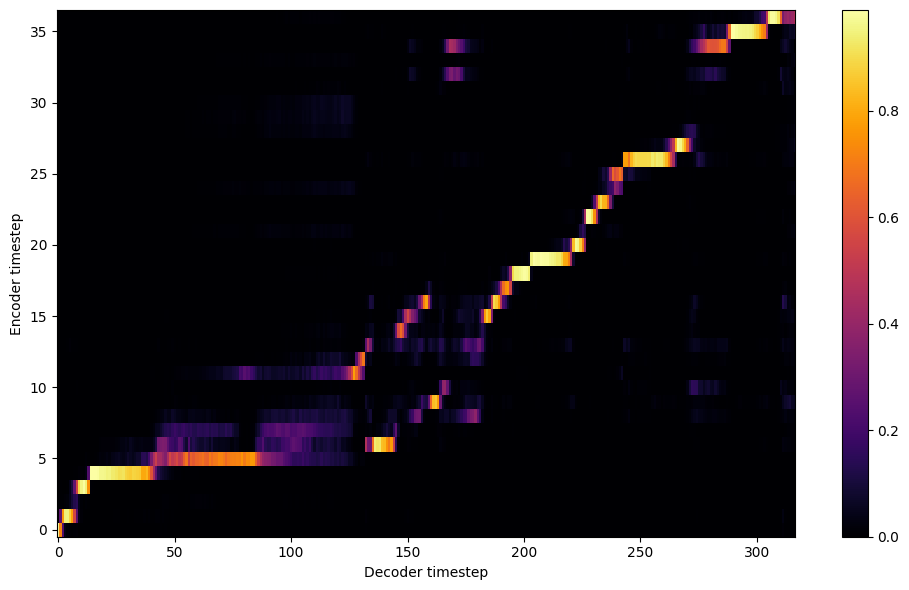

Saving model and optimizer state at iteration 1440 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 90 Iteration: 1440


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 90 Validation loss 1456:  0.126161  Time: 0.3m LR: 0.000300


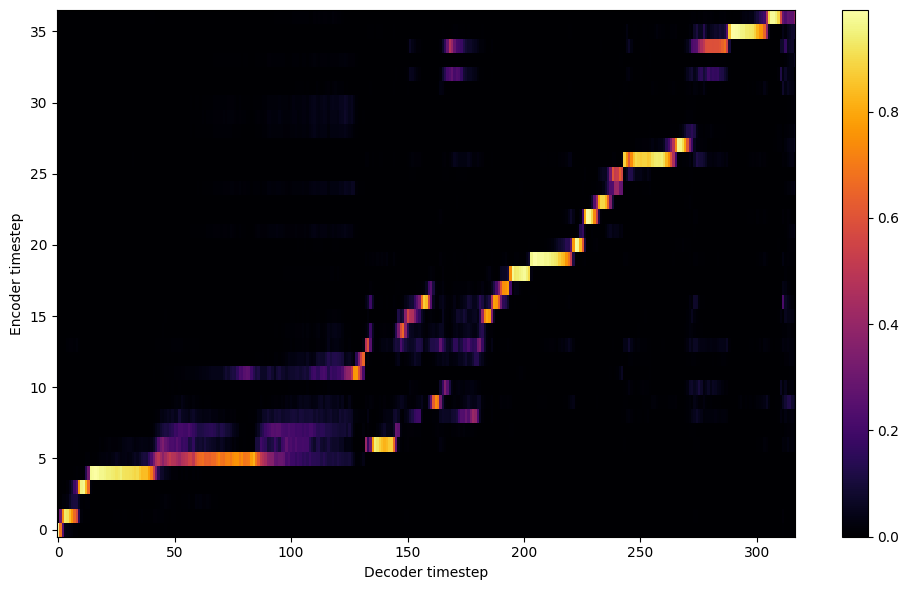


Starting Epoch: 91 Iteration: 1456


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 91 Validation loss 1472:  0.127040  Time: 0.3m LR: 0.000300


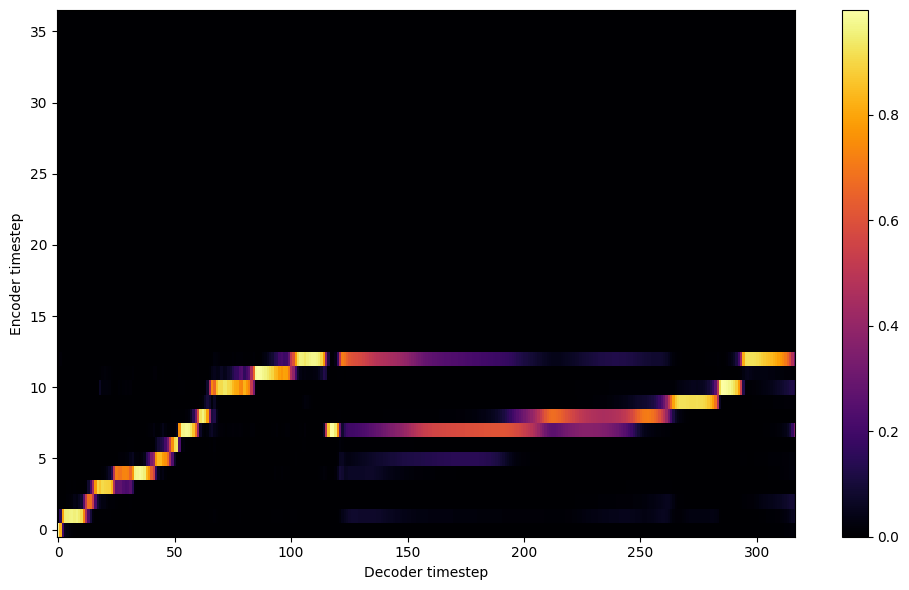


Starting Epoch: 92 Iteration: 1472


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 92 Validation loss 1488:  0.124927  Time: 0.3m LR: 0.000300


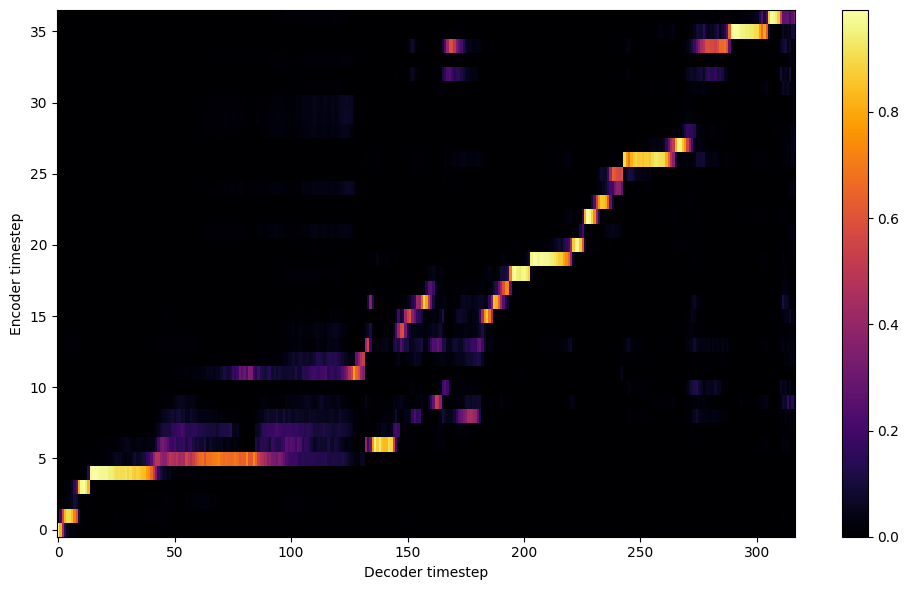


Starting Epoch: 93 Iteration: 1488


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 93 Validation loss 1504:  0.122223  Time: 0.3m LR: 0.000300


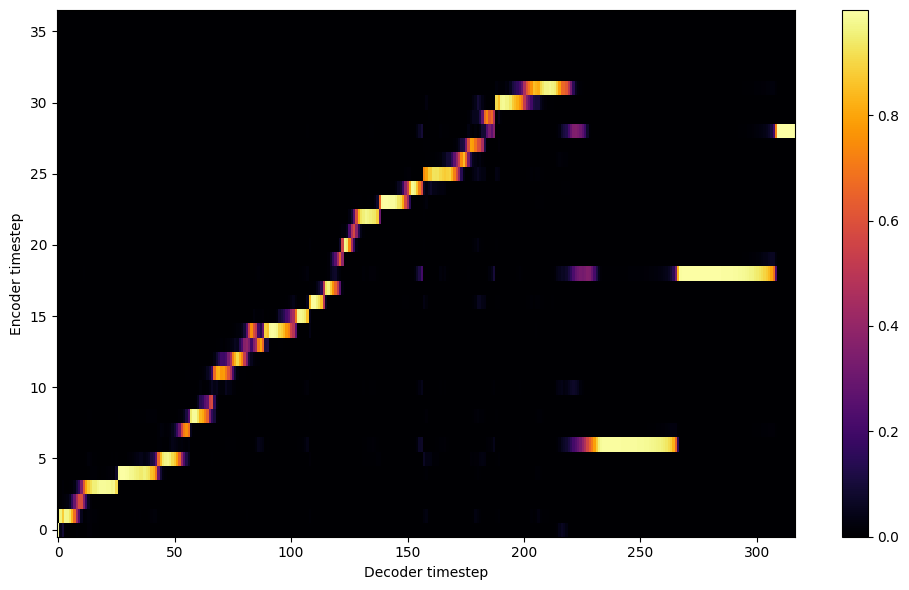


Starting Epoch: 94 Iteration: 1504


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 94 Validation loss 1520:  0.124249  Time: 0.3m LR: 0.000300


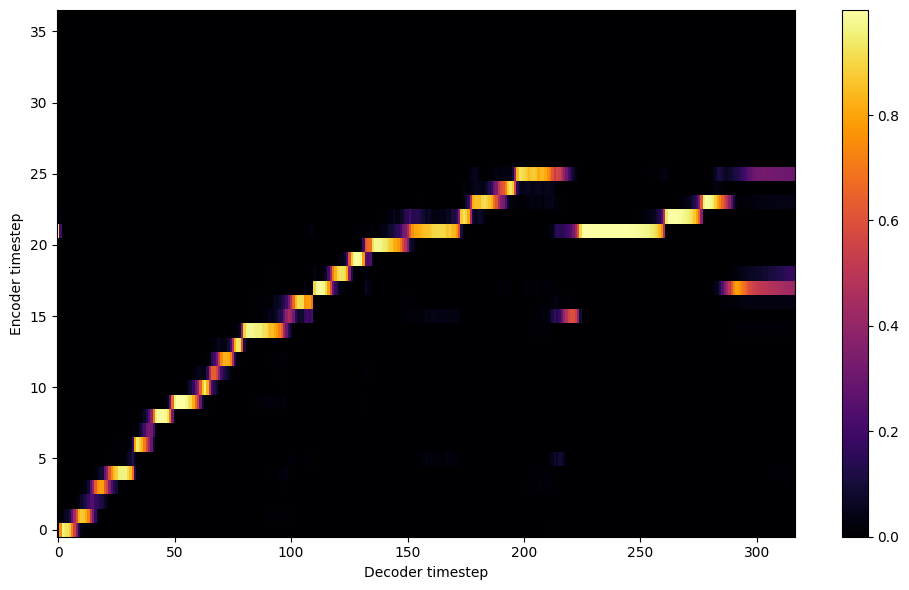


Starting Epoch: 95 Iteration: 1520


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 95 Validation loss 1536:  0.124363  Time: 0.3m LR: 0.000300


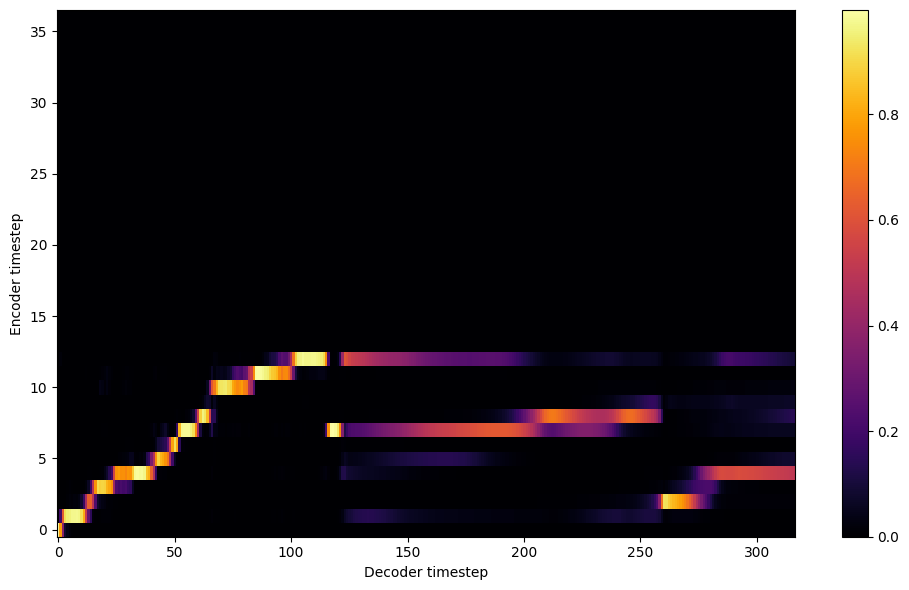


Starting Epoch: 96 Iteration: 1536


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 96 Validation loss 1552:  0.124227  Time: 0.3m LR: 0.000300


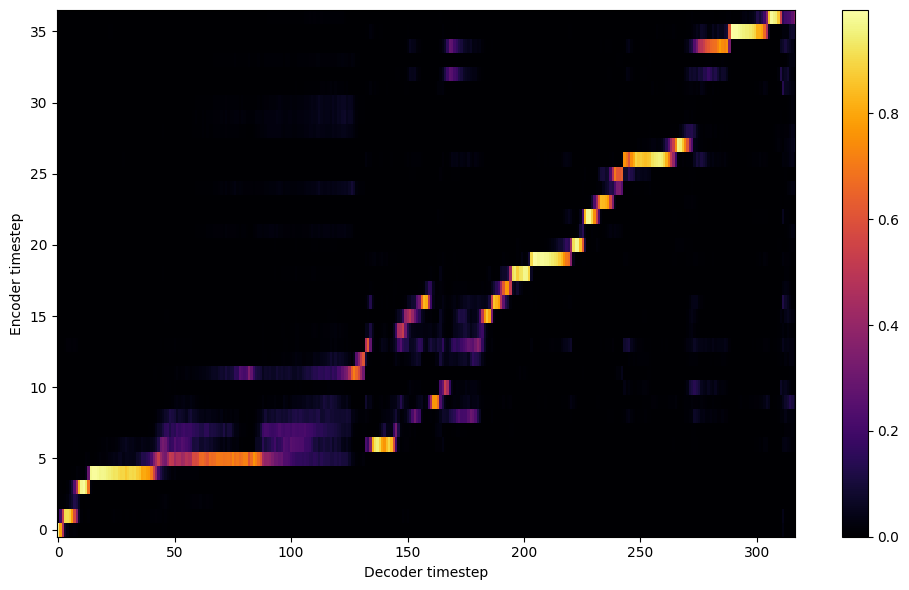


Starting Epoch: 97 Iteration: 1552


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 97 Validation loss 1568:  0.120276  Time: 0.3m LR: 0.000300


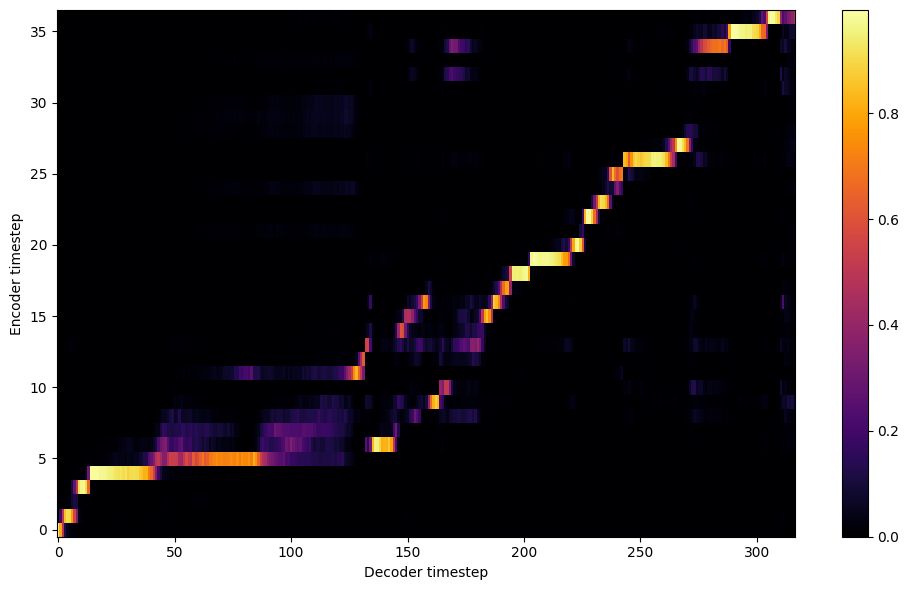


Starting Epoch: 98 Iteration: 1568


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 98 Validation loss 1584:  0.120602  Time: 0.3m LR: 0.000300


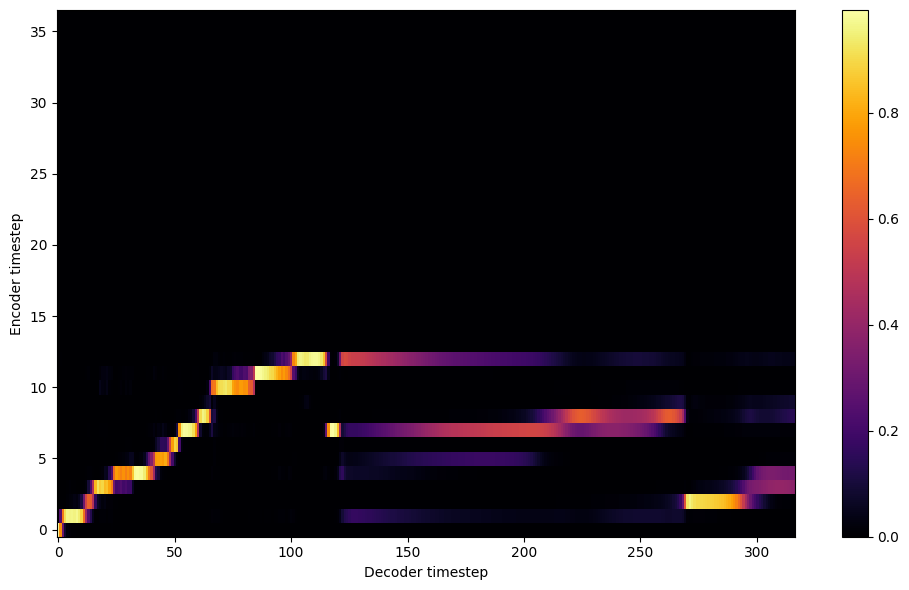


Starting Epoch: 99 Iteration: 1584


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 99 Validation loss 1600:  0.121262  Time: 0.3m LR: 0.000300


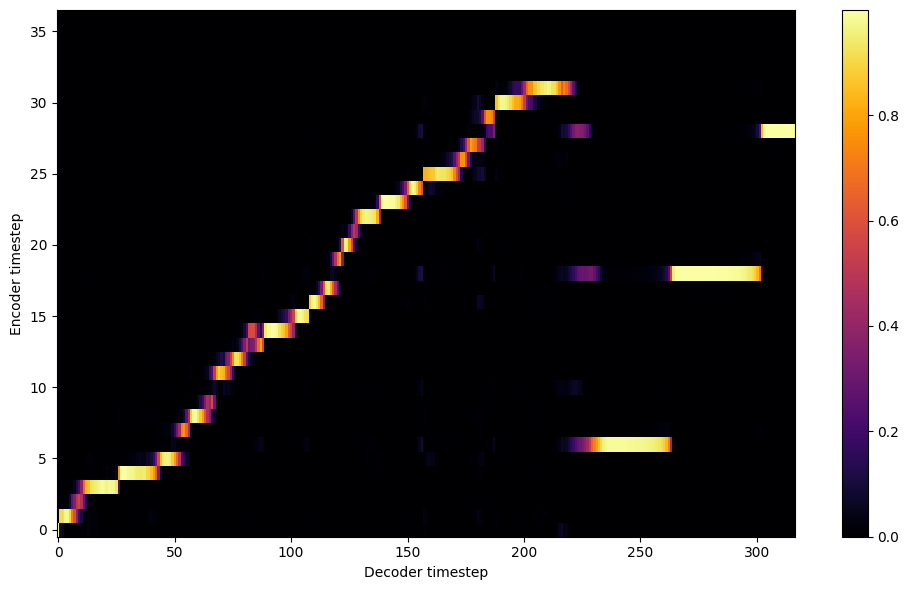

Saving model and optimizer state at iteration 1600 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 100 Iteration: 1600


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 100 Validation loss 1616:  0.118563  Time: 0.3m LR: 0.000300


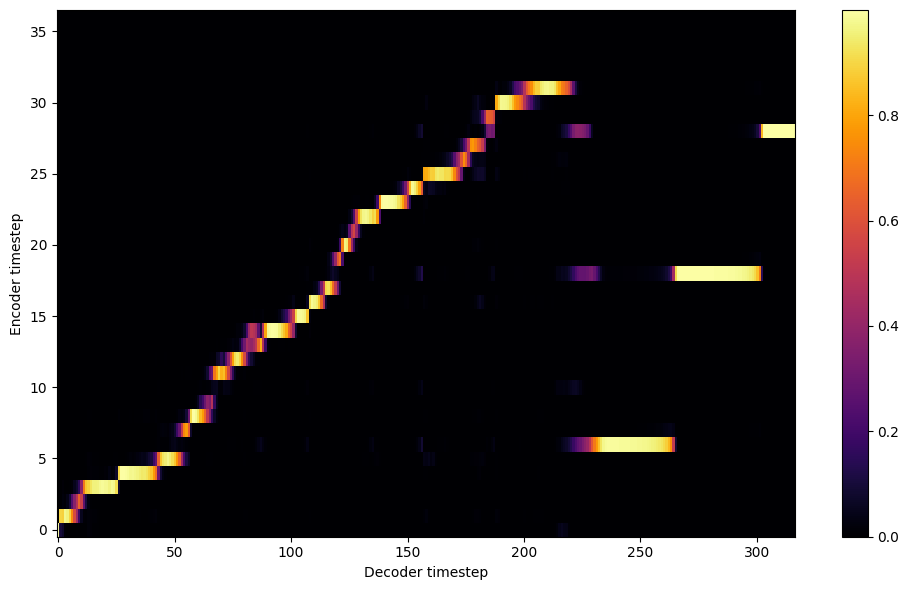


Starting Epoch: 101 Iteration: 1616


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 101 Validation loss 1632:  0.118443  Time: 0.3m LR: 0.000300


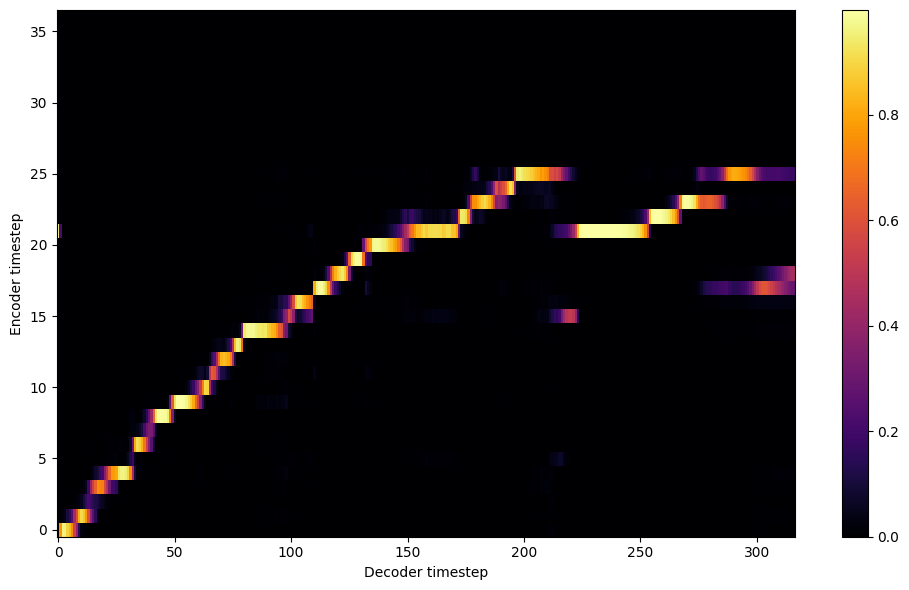


Starting Epoch: 102 Iteration: 1632


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 102 Validation loss 1648:  0.117037  Time: 0.3m LR: 0.000300


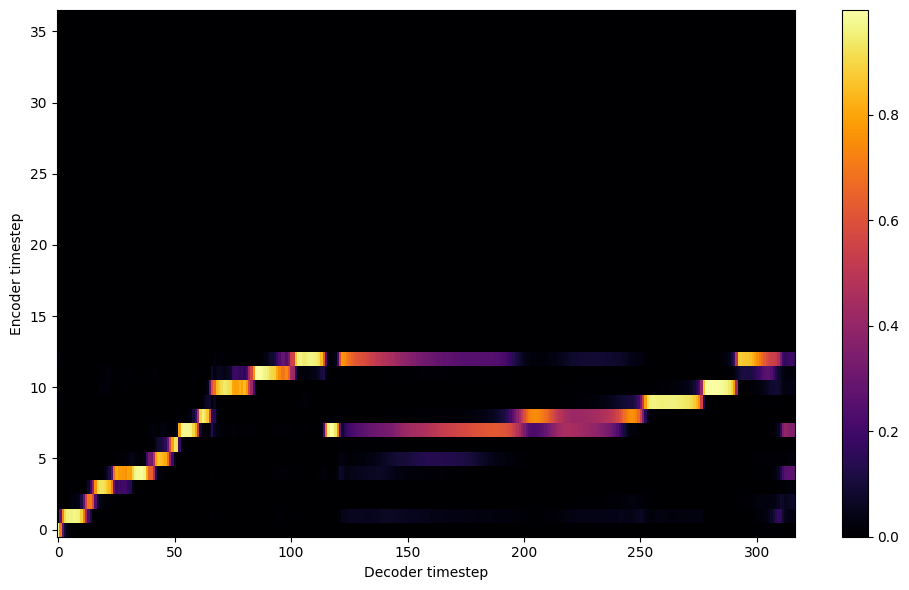


Starting Epoch: 103 Iteration: 1648


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 103 Validation loss 1664:  0.114205  Time: 0.3m LR: 0.000300


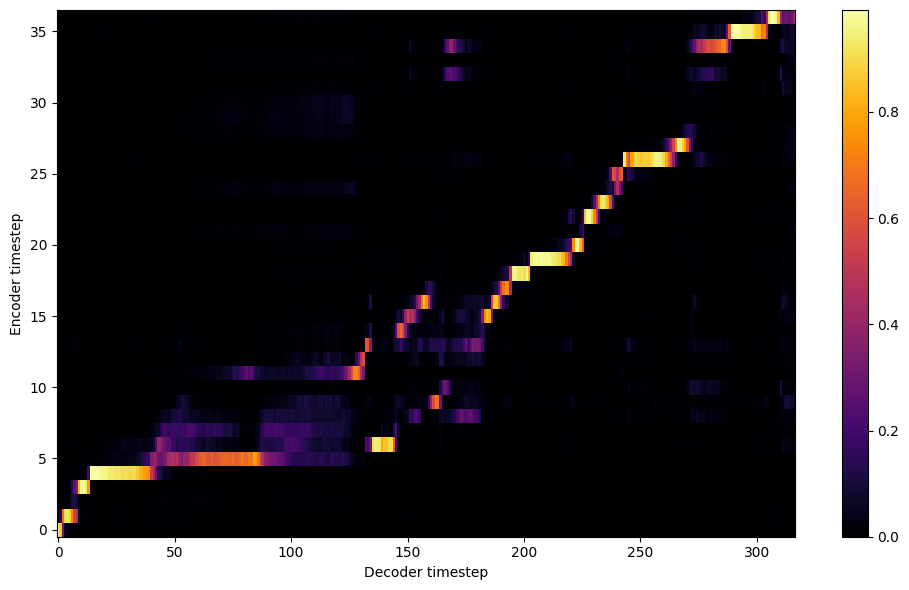


Starting Epoch: 104 Iteration: 1664


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 104 Validation loss 1680:  0.114441  Time: 0.3m LR: 0.000300


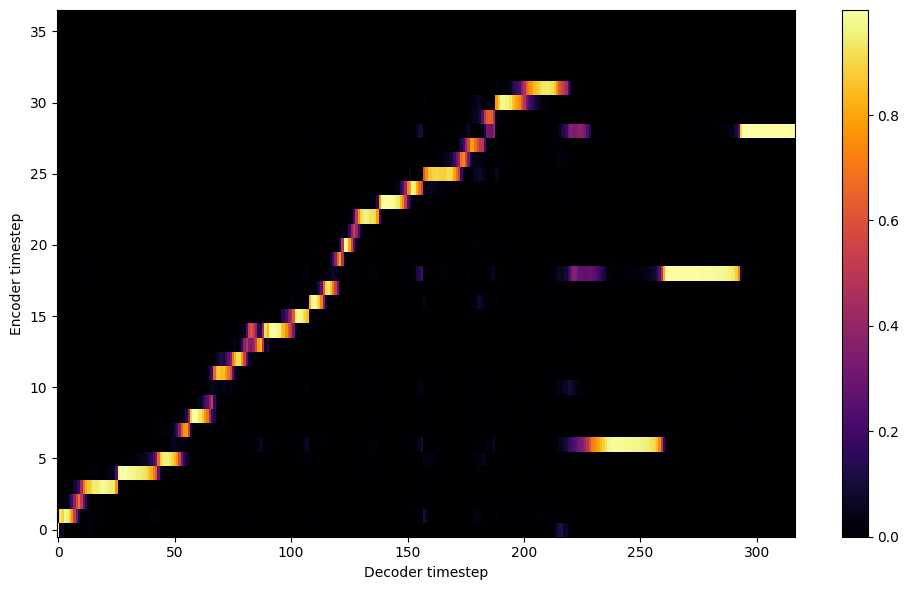


Starting Epoch: 105 Iteration: 1680


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 105 Validation loss 1696:  0.115221  Time: 0.3m LR: 0.000300


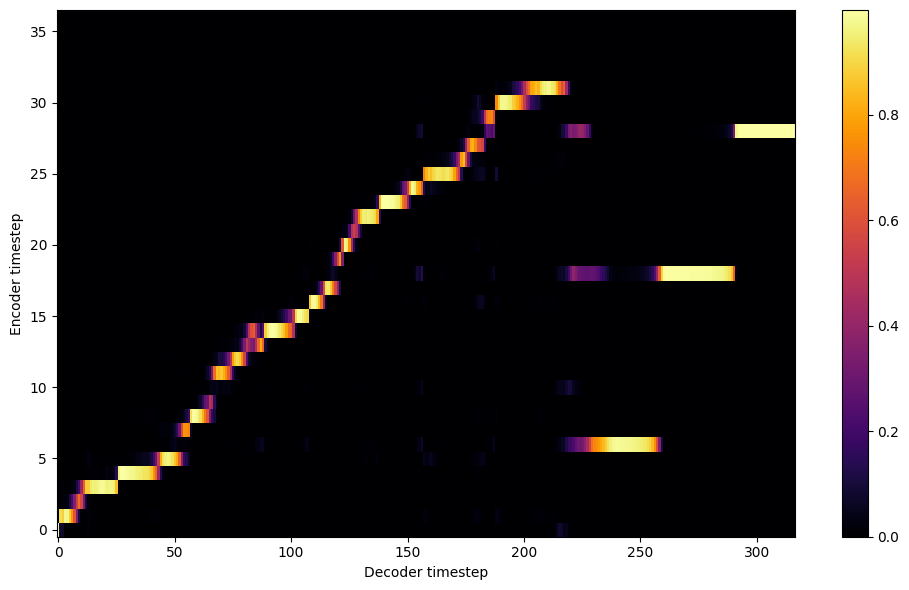


Starting Epoch: 106 Iteration: 1696


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 106 Validation loss 1712:  0.114778  Time: 0.4m LR: 0.000300


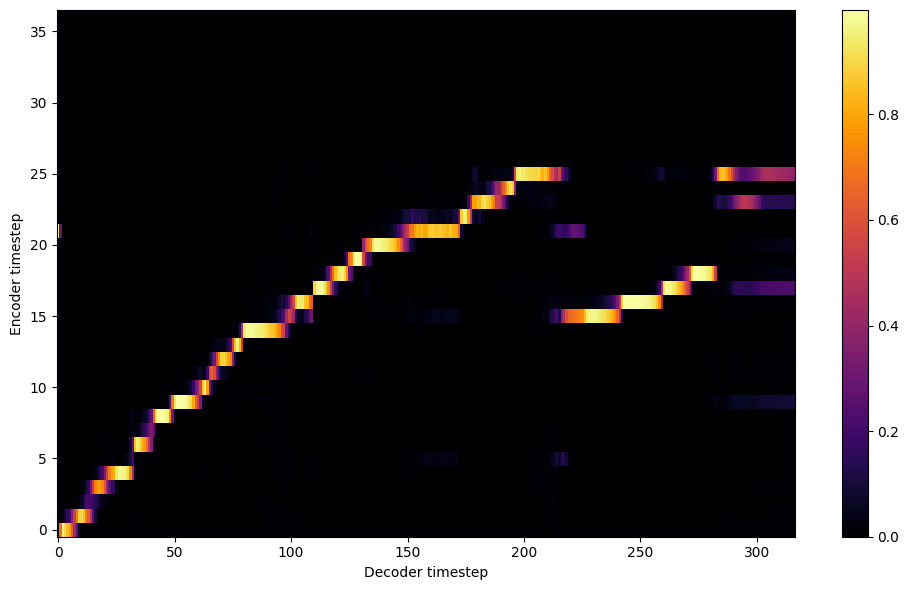


Starting Epoch: 107 Iteration: 1712


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 107 Validation loss 1728:  0.115746  Time: 0.3m LR: 0.000300


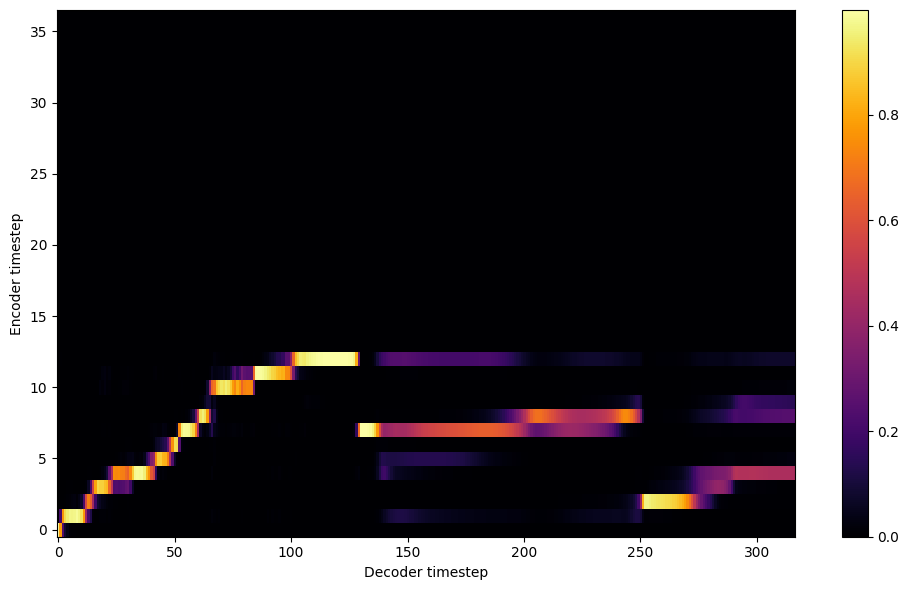


Starting Epoch: 108 Iteration: 1728


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 108 Validation loss 1744:  0.117763  Time: 0.3m LR: 0.000300


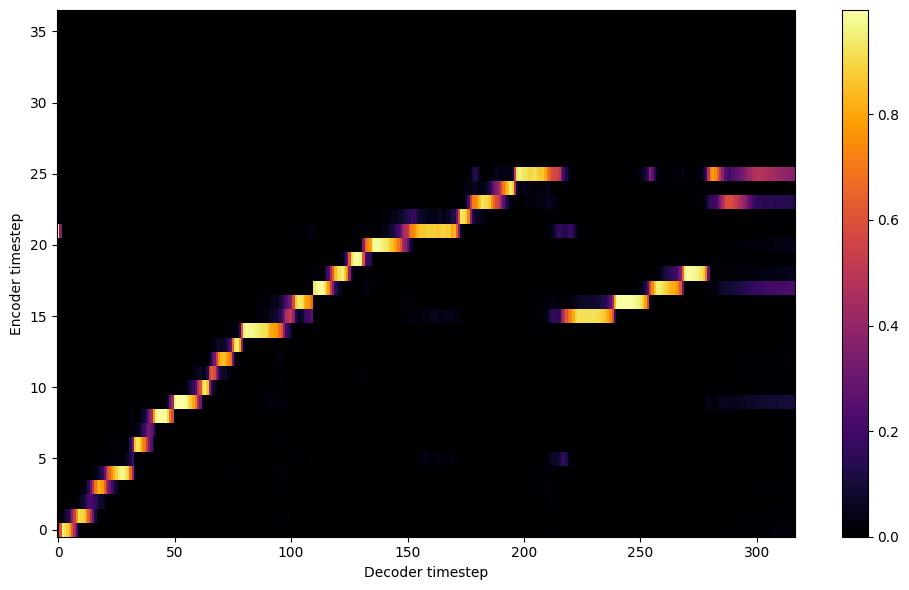


Starting Epoch: 109 Iteration: 1744


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 109 Validation loss 1760:  0.113245  Time: 0.3m LR: 0.000300


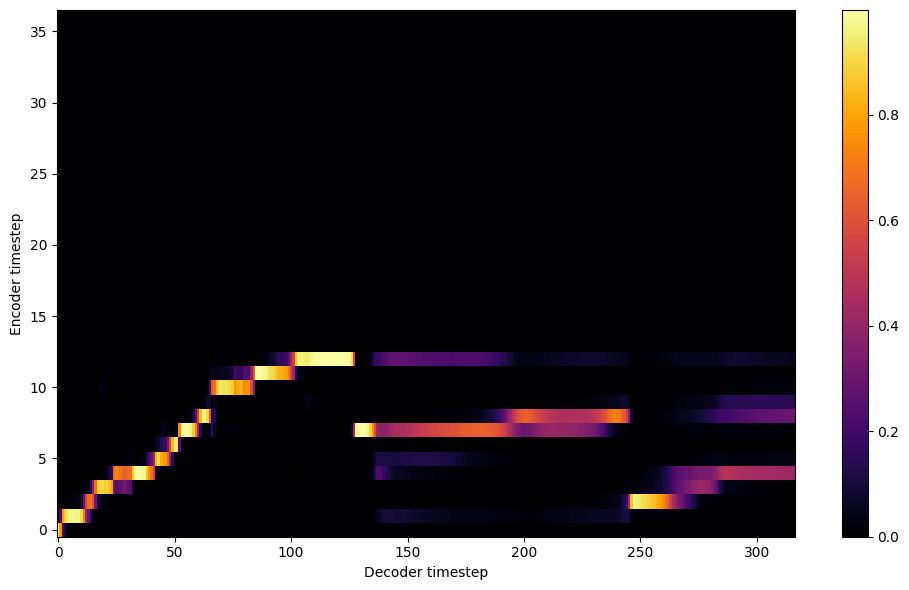

Saving model and optimizer state at iteration 1760 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 110 Iteration: 1760


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 110 Validation loss 1776:  0.113663  Time: 0.3m LR: 0.000300


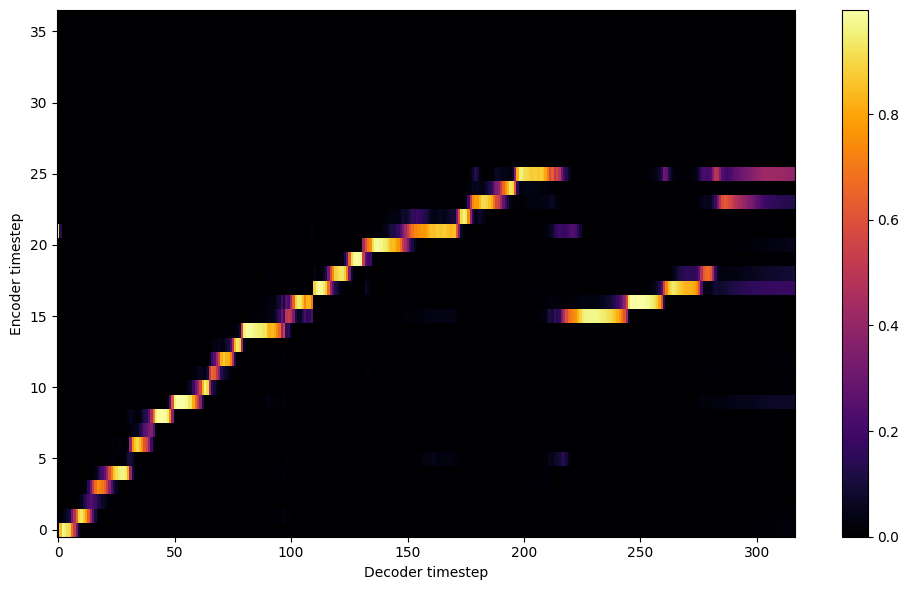


Starting Epoch: 111 Iteration: 1776


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 111 Validation loss 1792:  0.113672  Time: 0.3m LR: 0.000300


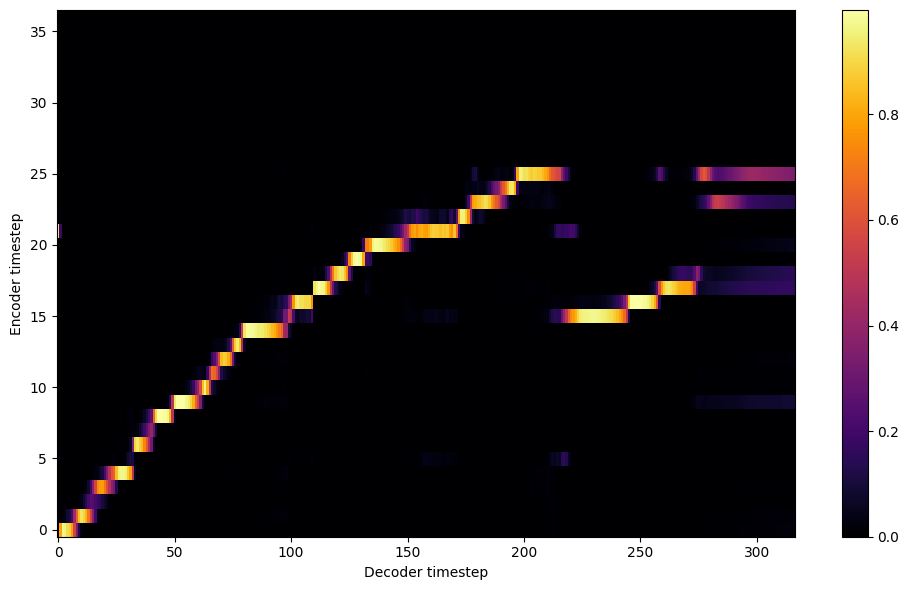


Starting Epoch: 112 Iteration: 1792


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 112 Validation loss 1808:  0.113216  Time: 0.3m LR: 0.000300


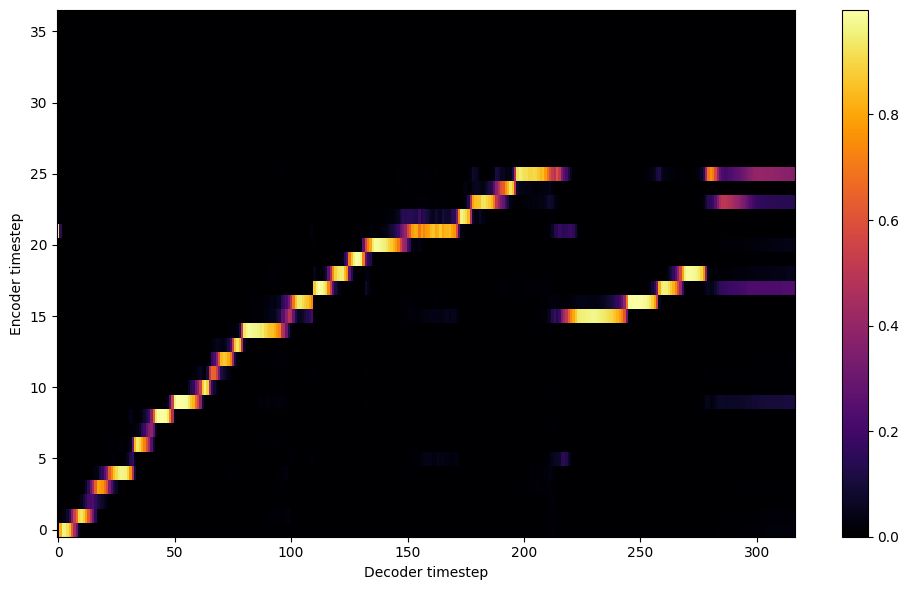


Starting Epoch: 113 Iteration: 1808


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 113 Validation loss 1824:  0.110251  Time: 0.3m LR: 0.000300


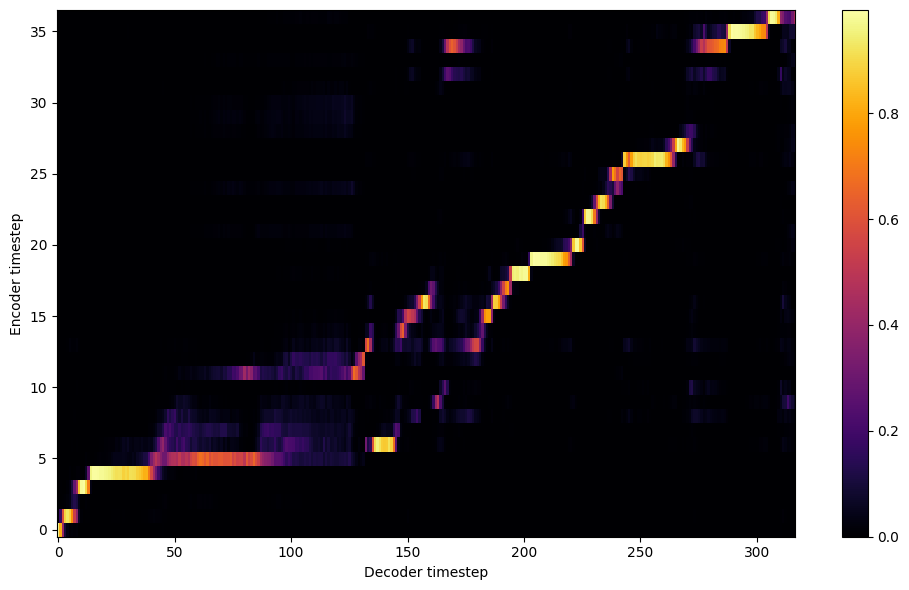


Starting Epoch: 114 Iteration: 1824


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 114 Validation loss 1840:  0.110341  Time: 0.3m LR: 0.000300


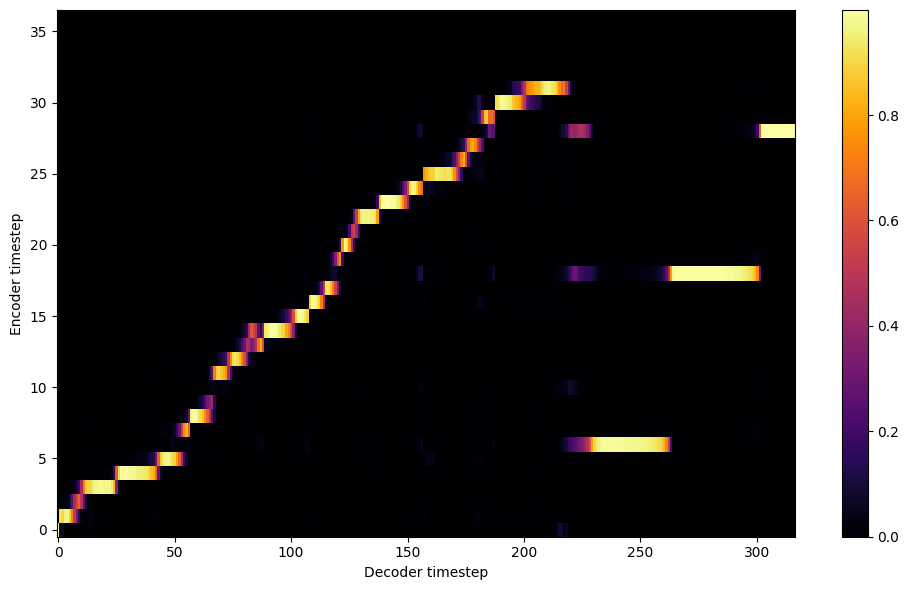


Starting Epoch: 115 Iteration: 1840


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 115 Validation loss 1856:  0.110770  Time: 0.3m LR: 0.000300


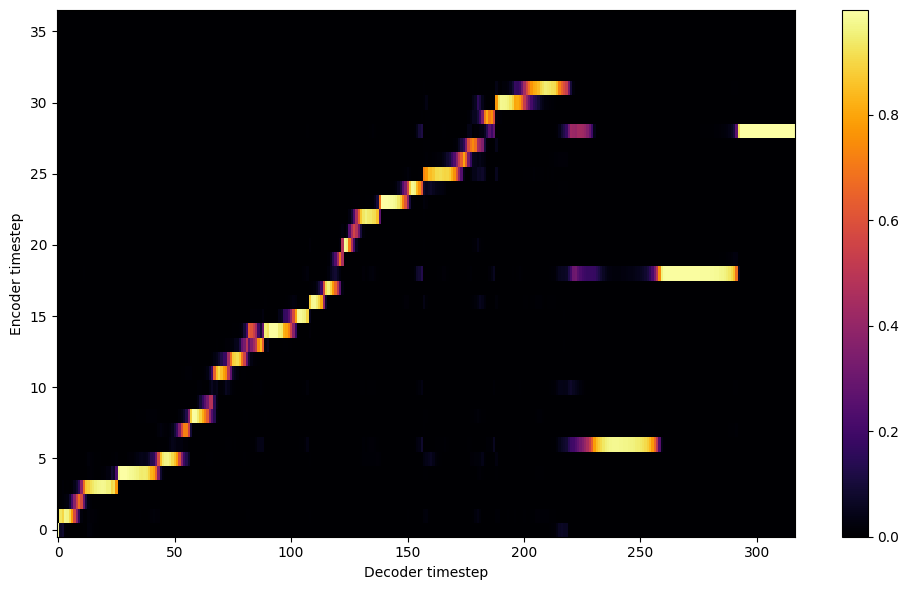


Starting Epoch: 116 Iteration: 1856


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 116 Validation loss 1872:  0.110070  Time: 0.3m LR: 0.000300


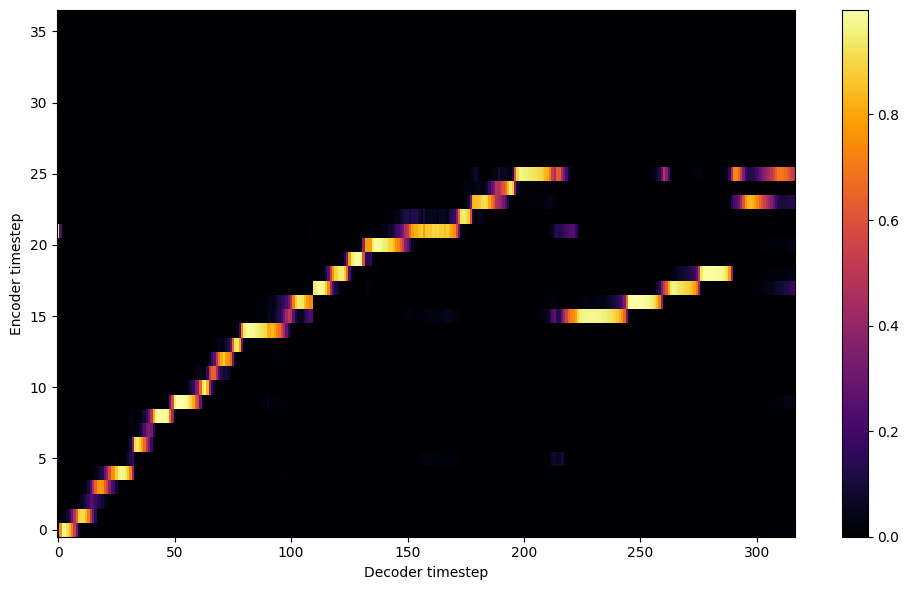


Starting Epoch: 117 Iteration: 1872


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 117 Validation loss 1888:  0.109667  Time: 0.3m LR: 0.000300


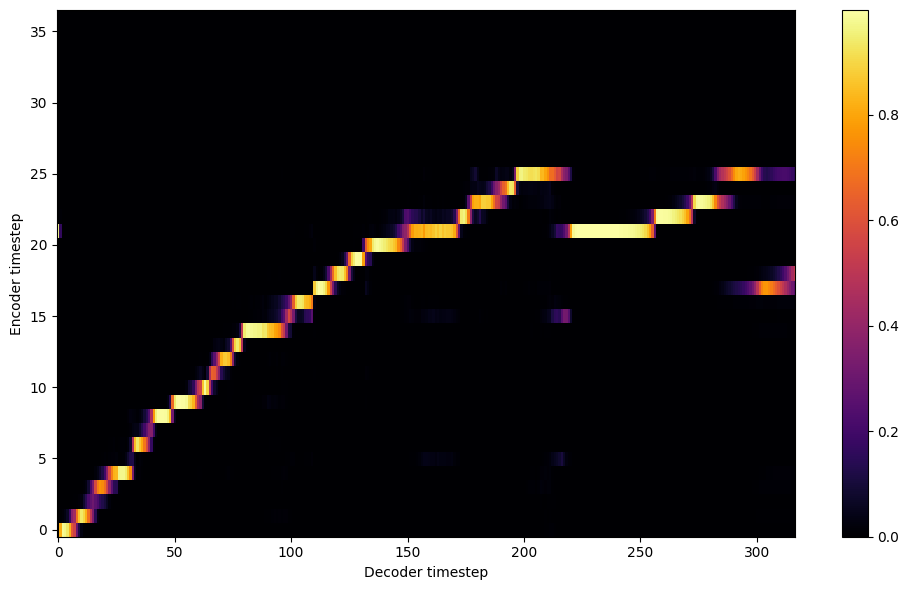


Starting Epoch: 118 Iteration: 1888


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 118 Validation loss 1904:  0.109332  Time: 0.3m LR: 0.000300


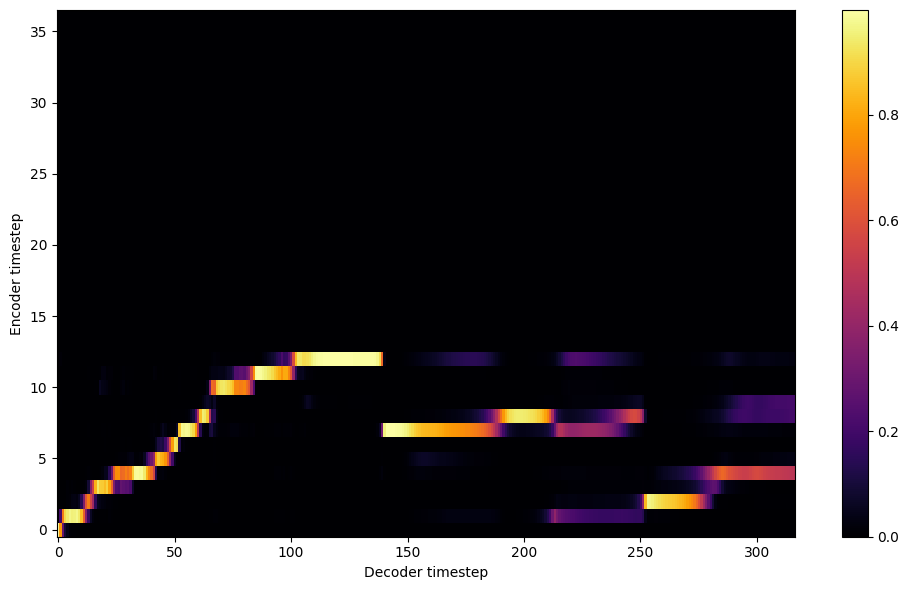


Starting Epoch: 119 Iteration: 1904


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 119 Validation loss 1920:  0.108916  Time: 0.3m LR: 0.000300


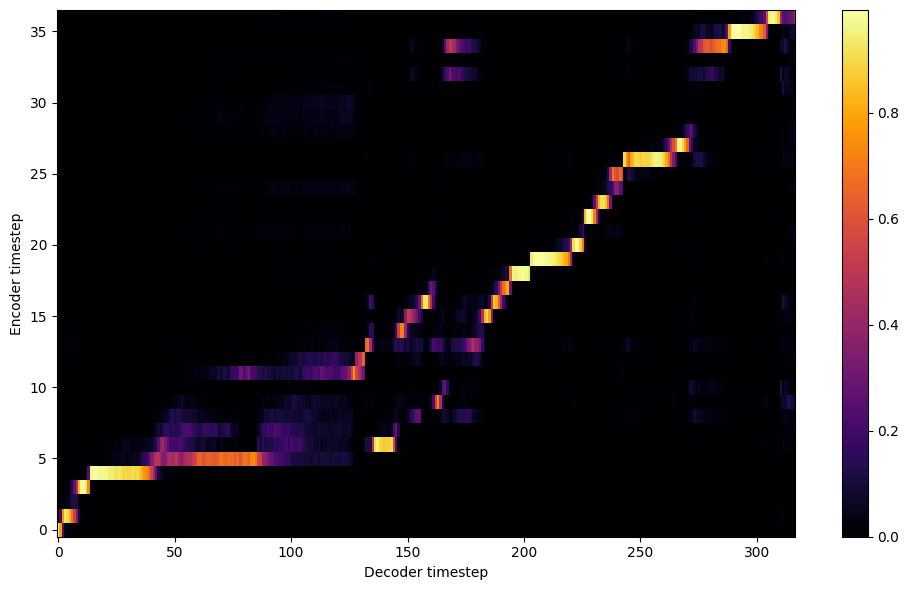

Saving model and optimizer state at iteration 1920 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 120 Iteration: 1920


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 120 Validation loss 1936:  0.110393  Time: 0.3m LR: 0.000300


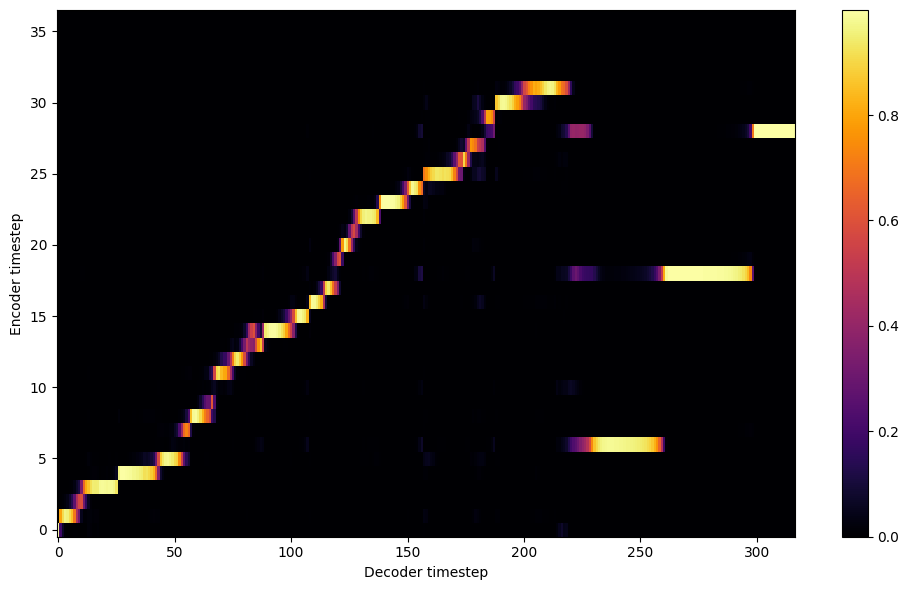


Starting Epoch: 121 Iteration: 1936


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 121 Validation loss 1952:  0.110919  Time: 0.3m LR: 0.000300


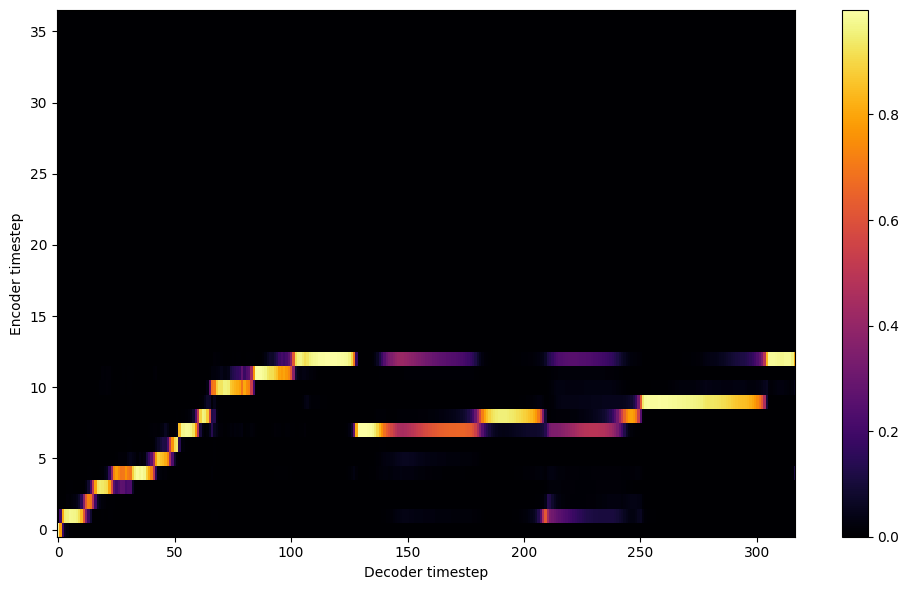


Starting Epoch: 122 Iteration: 1952


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 122 Validation loss 1968:  0.108141  Time: 0.3m LR: 0.000300


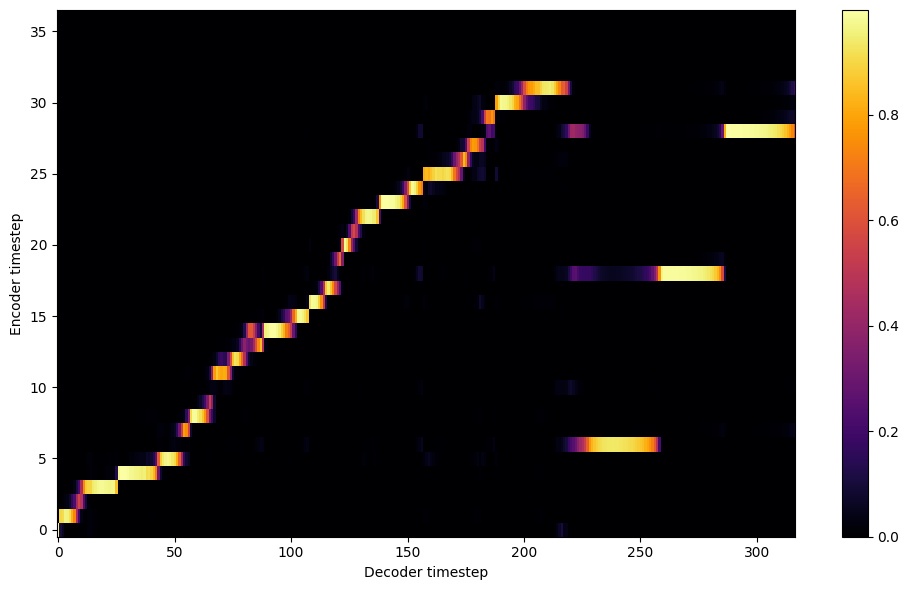


Starting Epoch: 123 Iteration: 1968


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 123 Validation loss 1984:  0.110897  Time: 0.3m LR: 0.000300


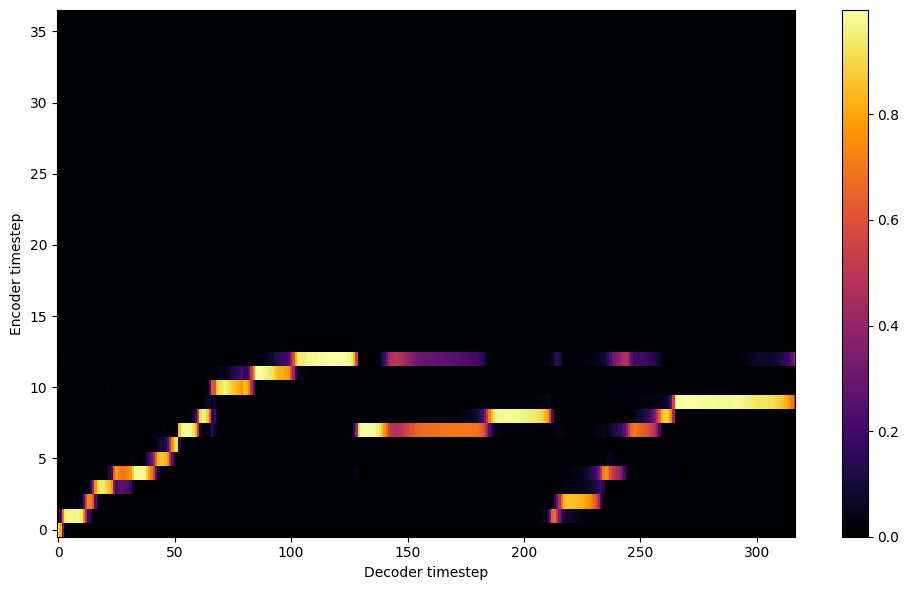


Starting Epoch: 124 Iteration: 1984


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 124 Validation loss 2000:  0.107926  Time: 0.3m LR: 0.000300


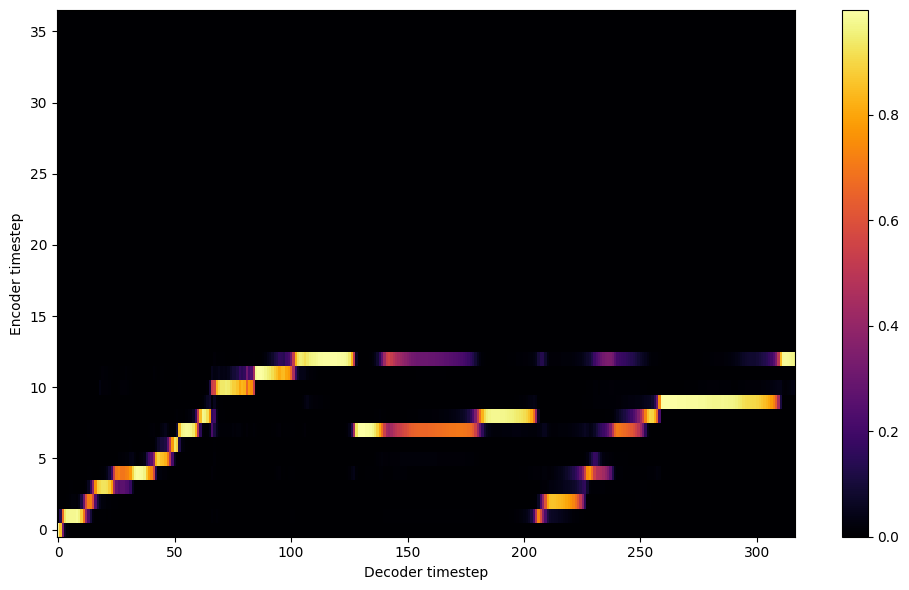


Starting Epoch: 125 Iteration: 2000


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 125 Validation loss 2016:  0.104731  Time: 0.3m LR: 0.000300


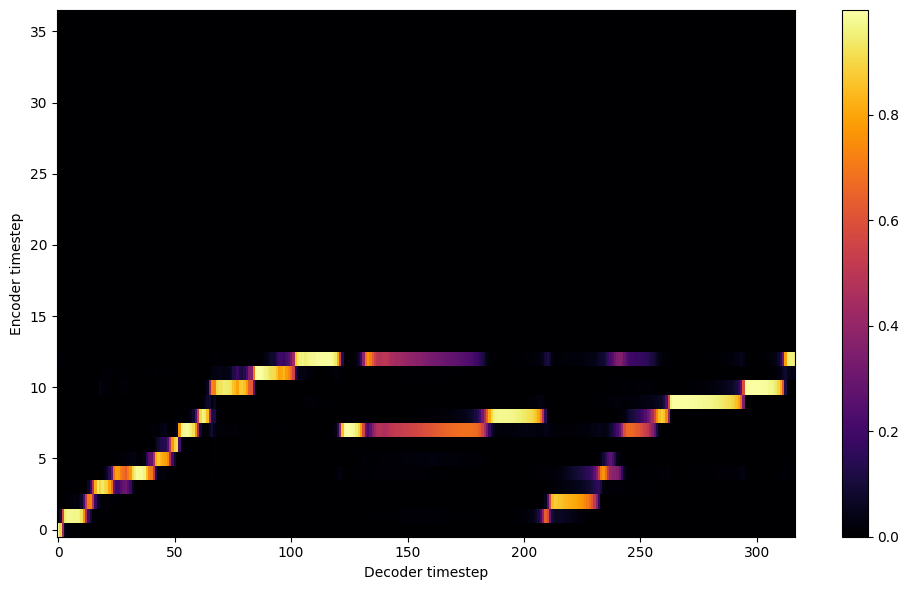


Starting Epoch: 126 Iteration: 2016


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 126 Validation loss 2032:  0.103809  Time: 0.3m LR: 0.000300


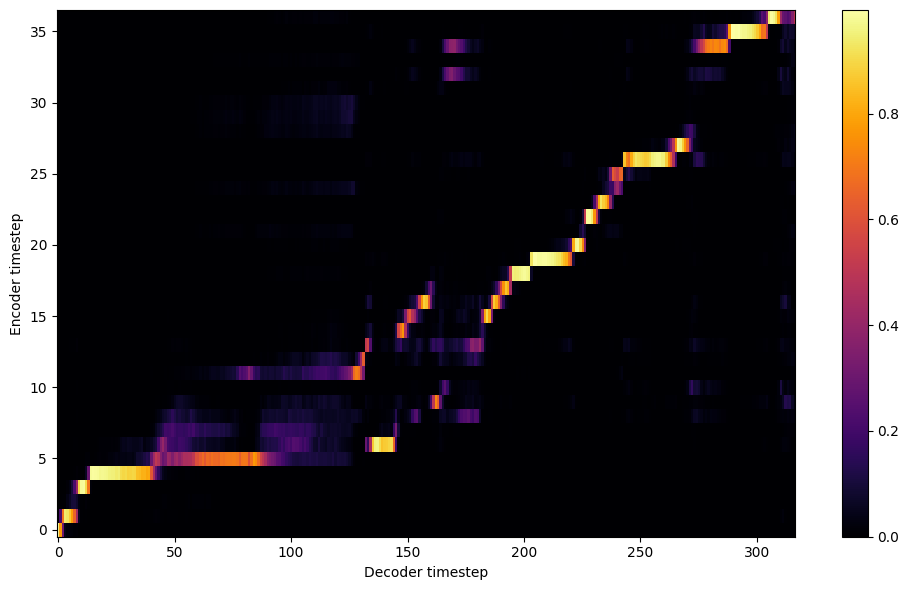


Starting Epoch: 127 Iteration: 2032


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 127 Validation loss 2048:  0.105864  Time: 0.3m LR: 0.000300


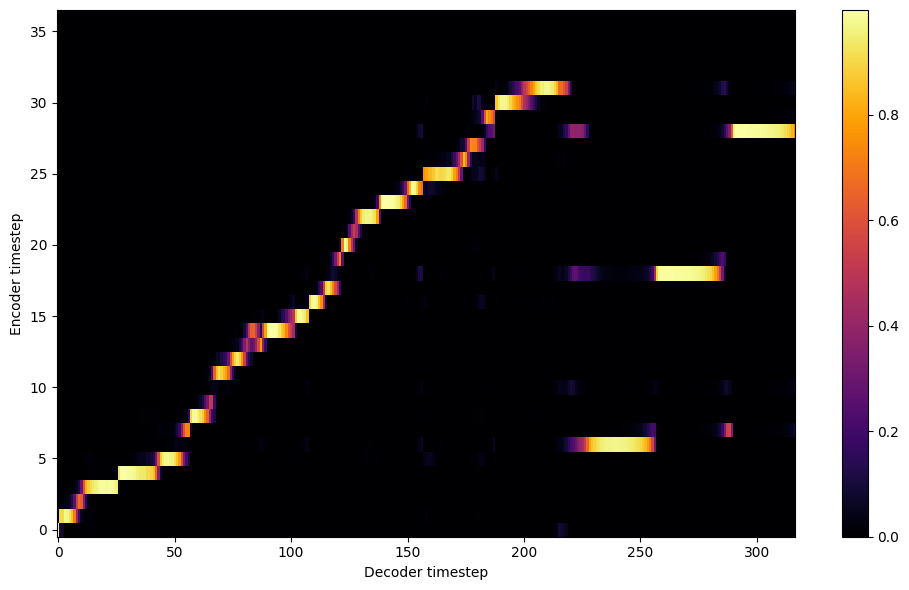


Starting Epoch: 128 Iteration: 2048


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 128 Validation loss 2064:  0.105398  Time: 0.3m LR: 0.000300


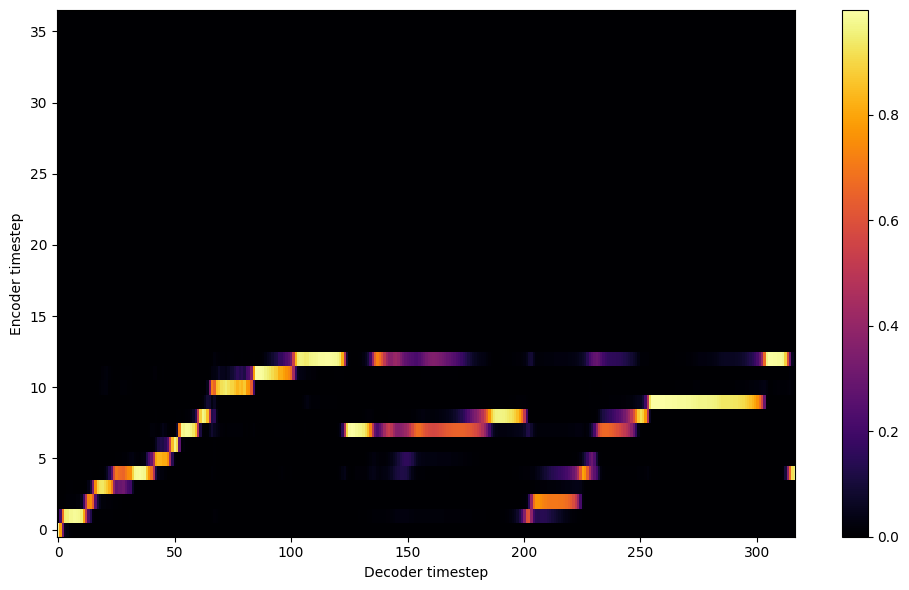


Starting Epoch: 129 Iteration: 2064


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 129 Validation loss 2080:  0.105625  Time: 0.3m LR: 0.000300


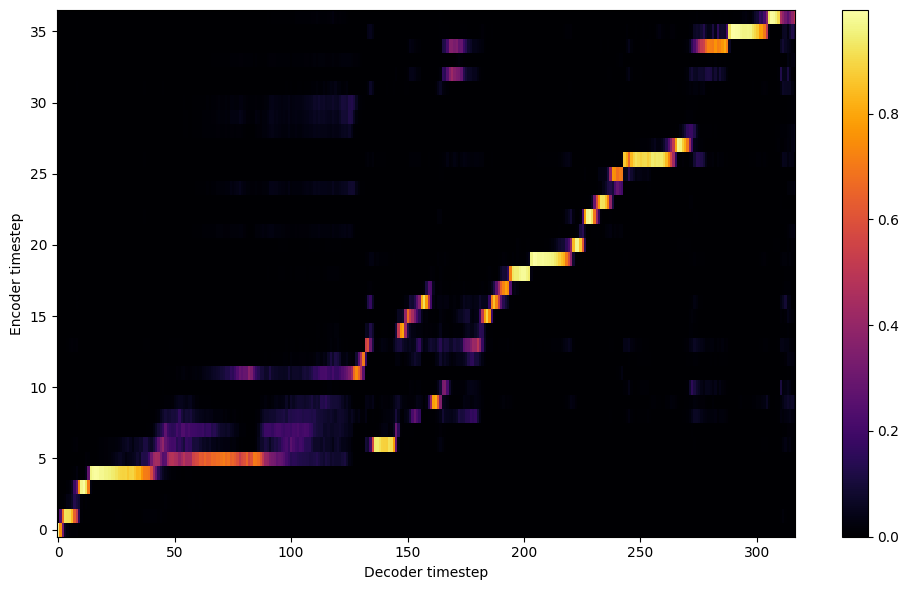

Saving model and optimizer state at iteration 2080 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 130 Iteration: 2080


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 130 Validation loss 2096:  0.103952  Time: 0.4m LR: 0.000300


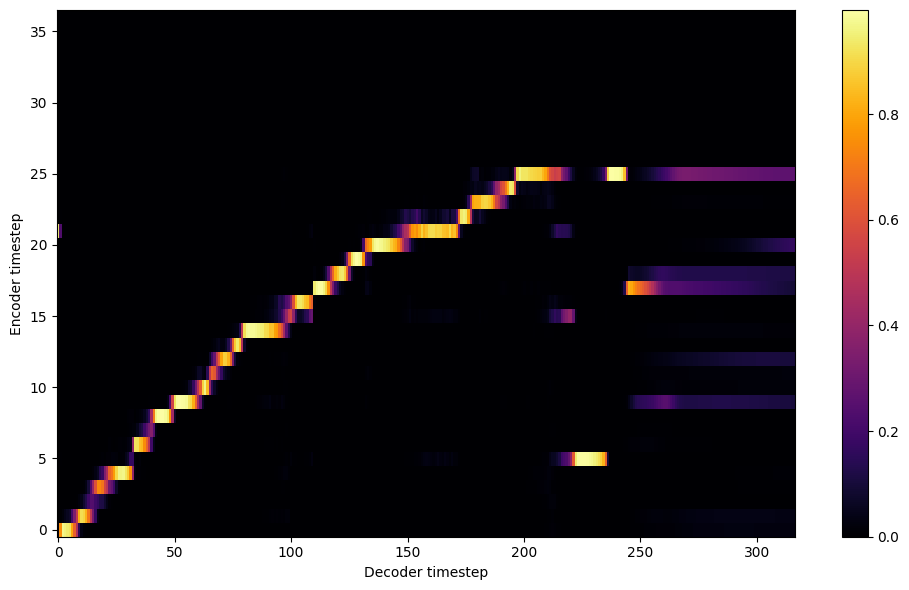


Starting Epoch: 131 Iteration: 2096


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 131 Validation loss 2112:  0.103927  Time: 0.3m LR: 0.000300


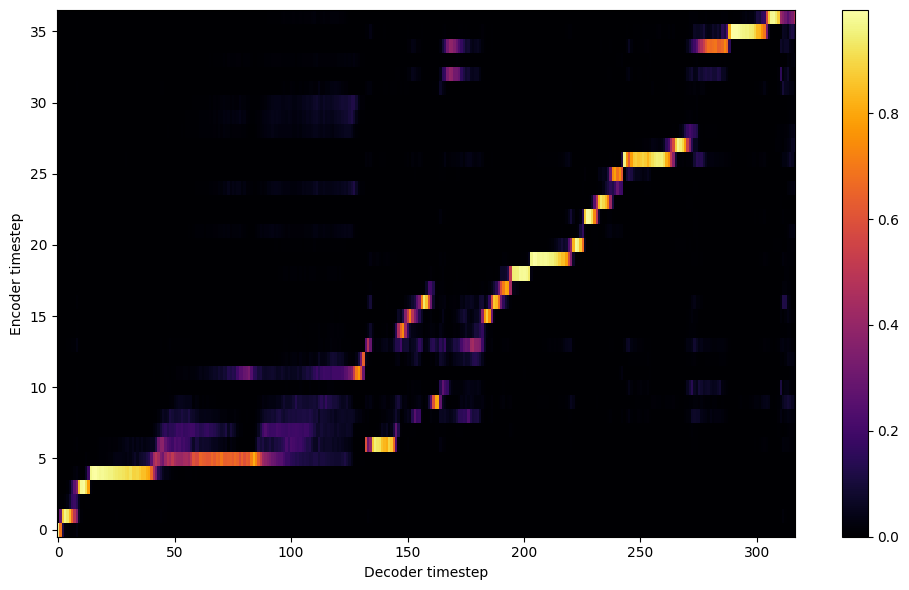


Starting Epoch: 132 Iteration: 2112


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 132 Validation loss 2128:  0.103898  Time: 0.3m LR: 0.000300


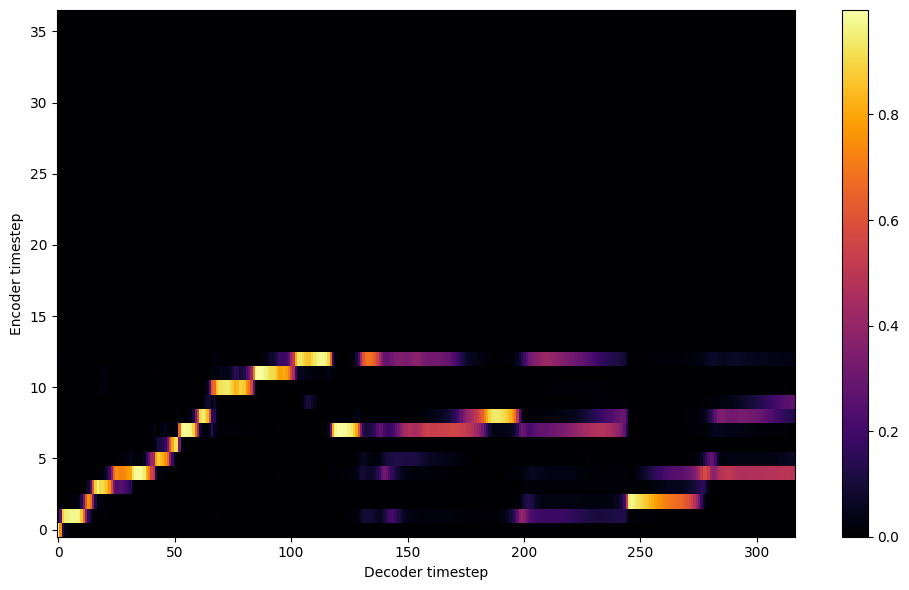


Starting Epoch: 133 Iteration: 2128


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 133 Validation loss 2144:  0.102257  Time: 0.3m LR: 0.000300


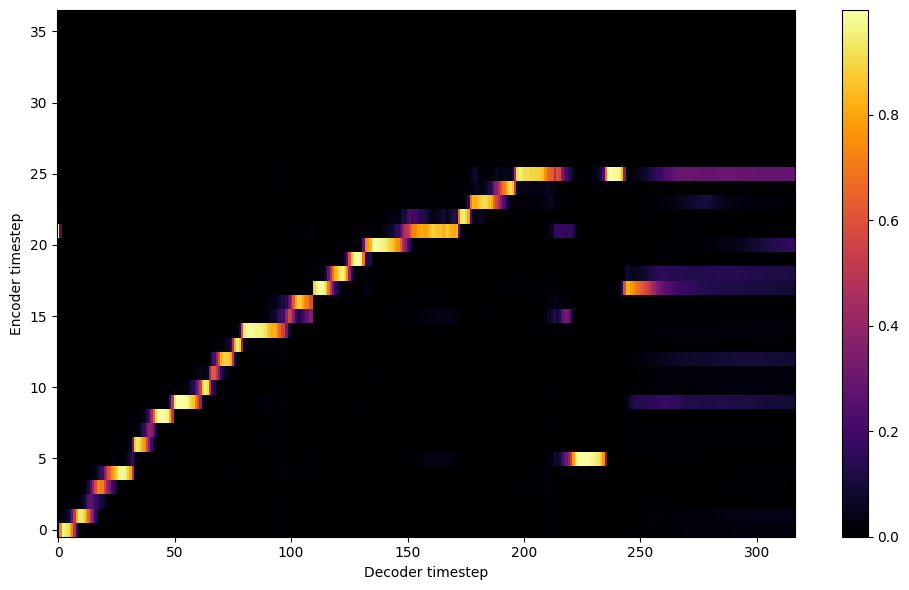


Starting Epoch: 134 Iteration: 2144


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 134 Validation loss 2160:  0.101733  Time: 0.3m LR: 0.000300


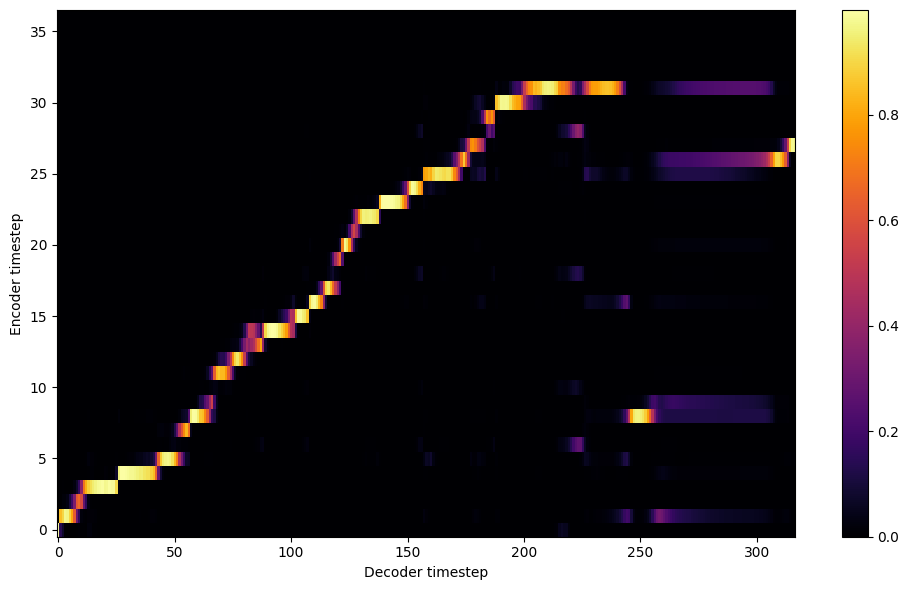


Starting Epoch: 135 Iteration: 2160


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 135 Validation loss 2176:  0.101712  Time: 0.3m LR: 0.000300


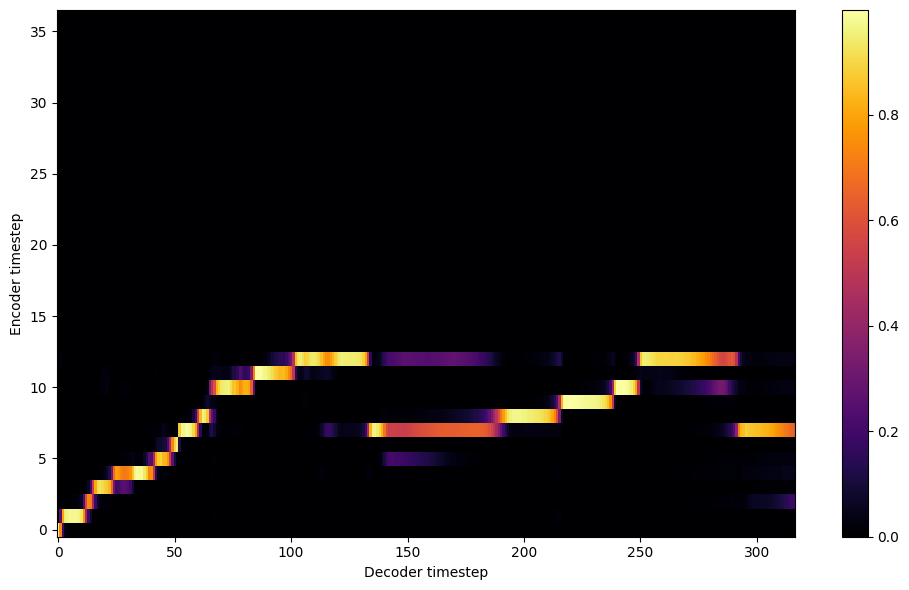


Starting Epoch: 136 Iteration: 2176


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 136 Validation loss 2192:  0.105403  Time: 0.3m LR: 0.000300


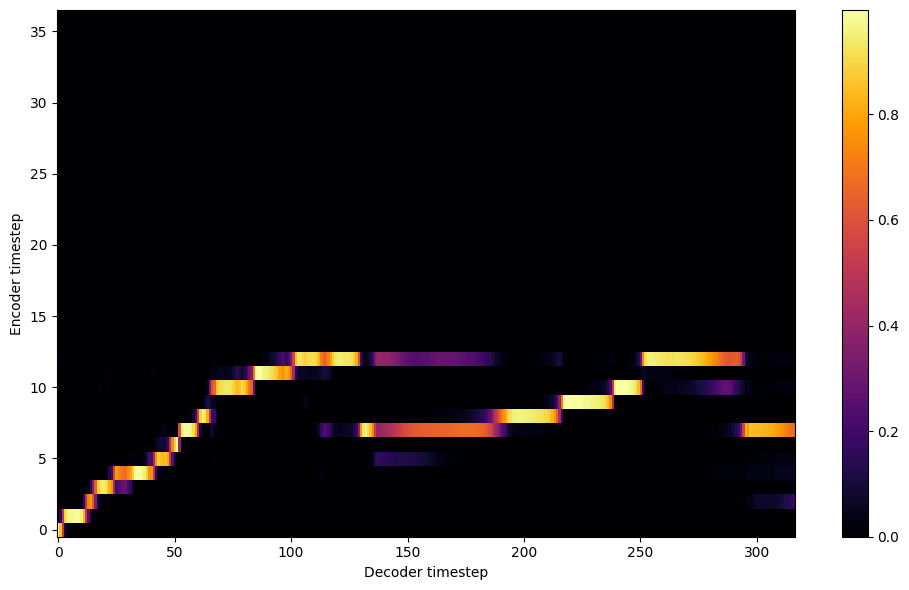


Starting Epoch: 137 Iteration: 2192


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 137 Validation loss 2208:  0.103197  Time: 0.3m LR: 0.000300


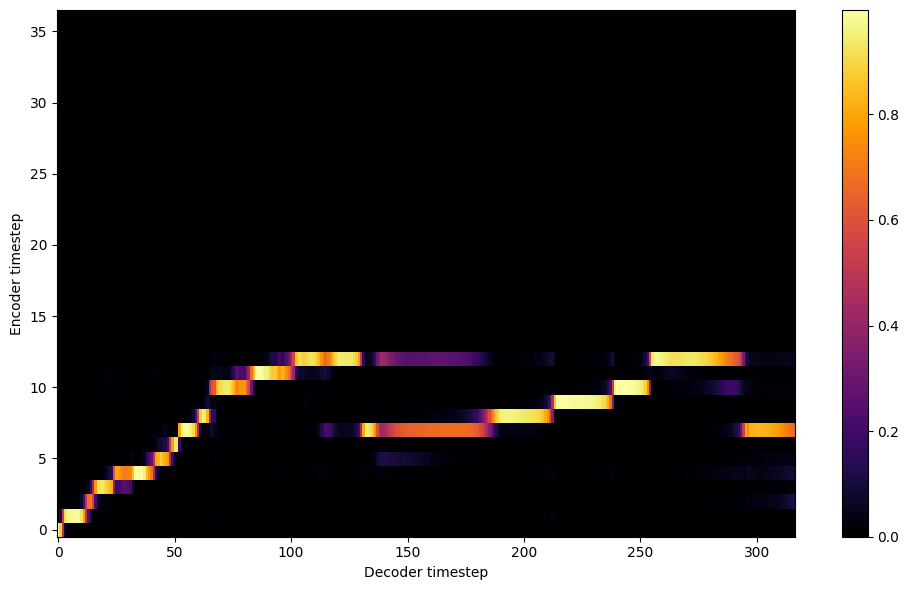


Starting Epoch: 138 Iteration: 2208


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 138 Validation loss 2224:  0.103670  Time: 0.3m LR: 0.000300


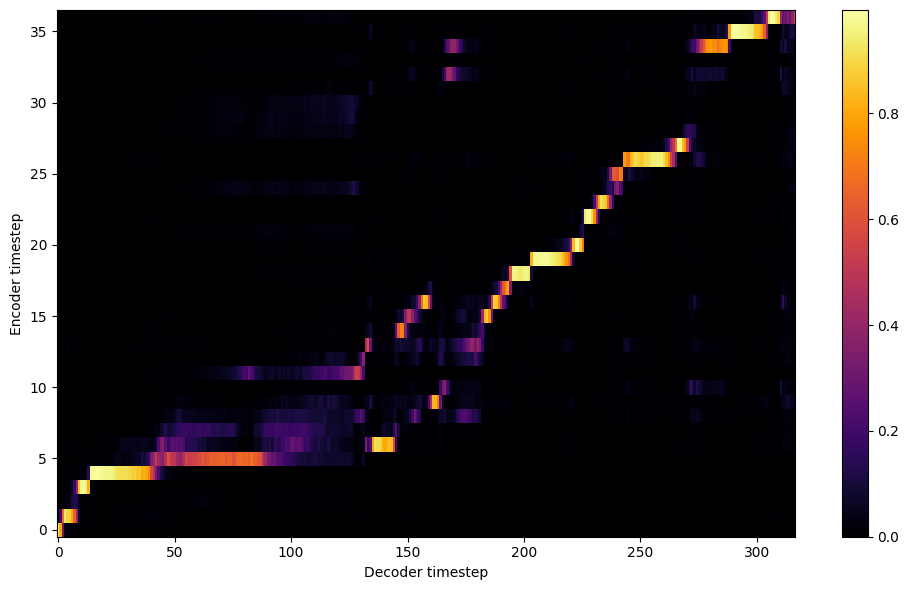


Starting Epoch: 139 Iteration: 2224


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 139 Validation loss 2240:  0.101467  Time: 0.3m LR: 0.000300


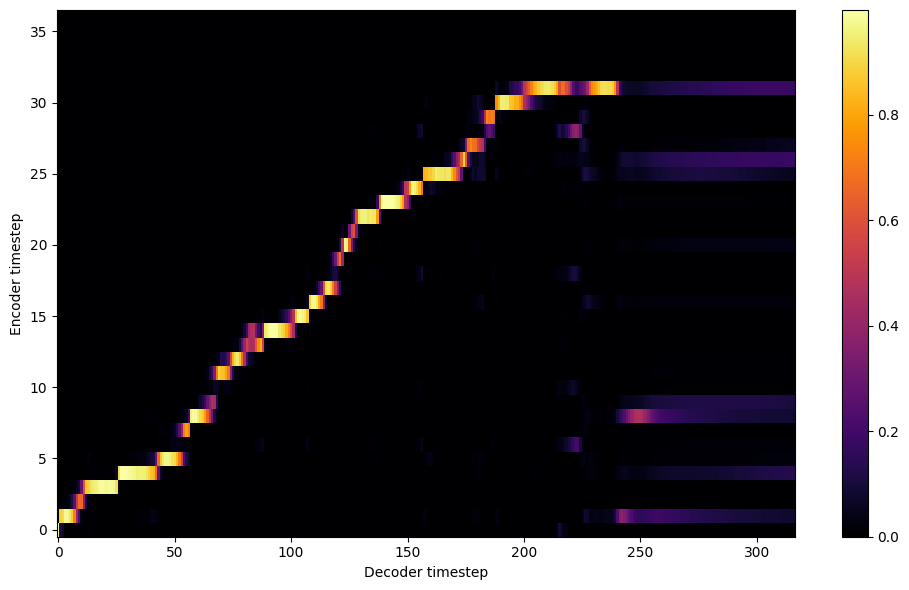

Saving model and optimizer state at iteration 2240 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 140 Iteration: 2240


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 140 Validation loss 2256:  0.104147  Time: 0.3m LR: 0.000300


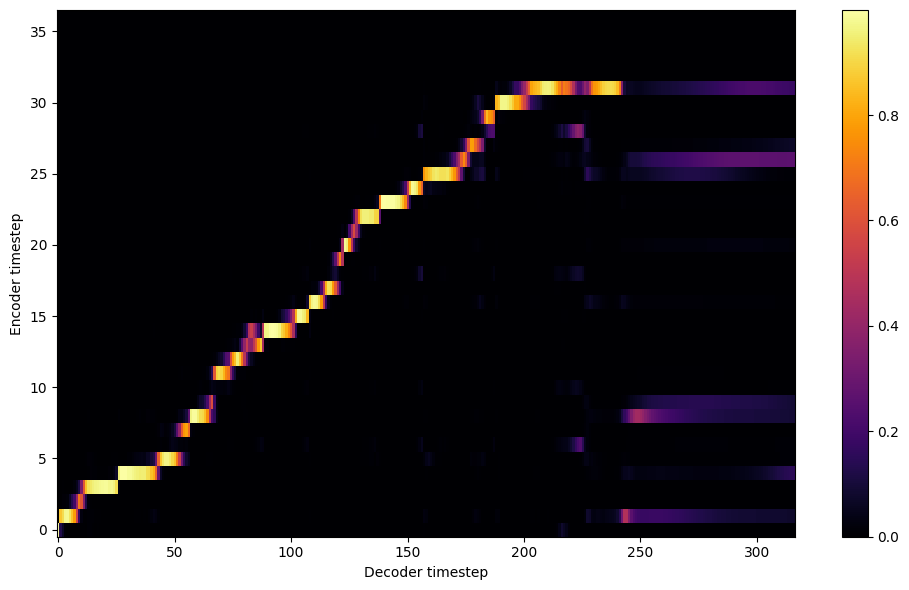


Starting Epoch: 141 Iteration: 2256


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 141 Validation loss 2272:  0.101572  Time: 0.3m LR: 0.000300


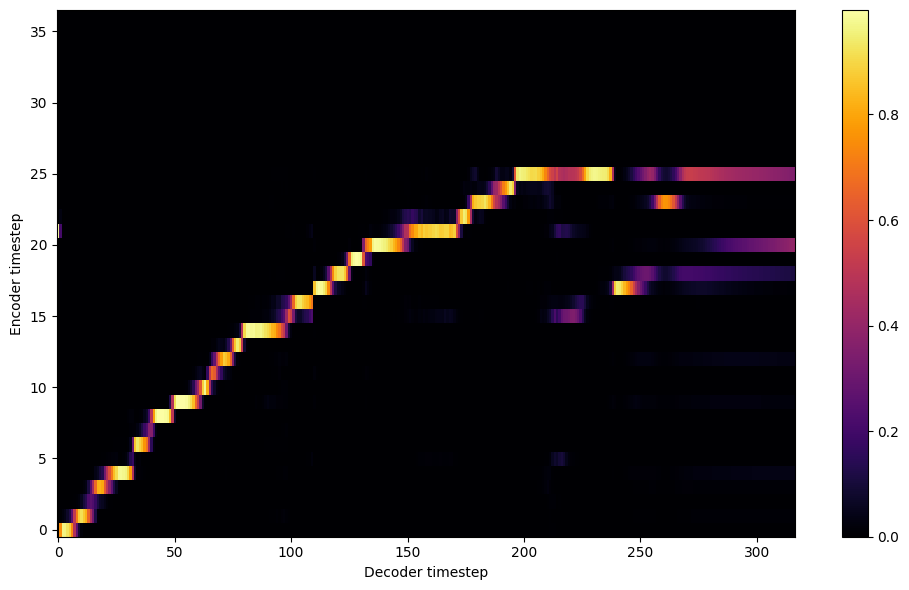


Starting Epoch: 142 Iteration: 2272


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 142 Validation loss 2288:  0.100998  Time: 0.3m LR: 0.000300


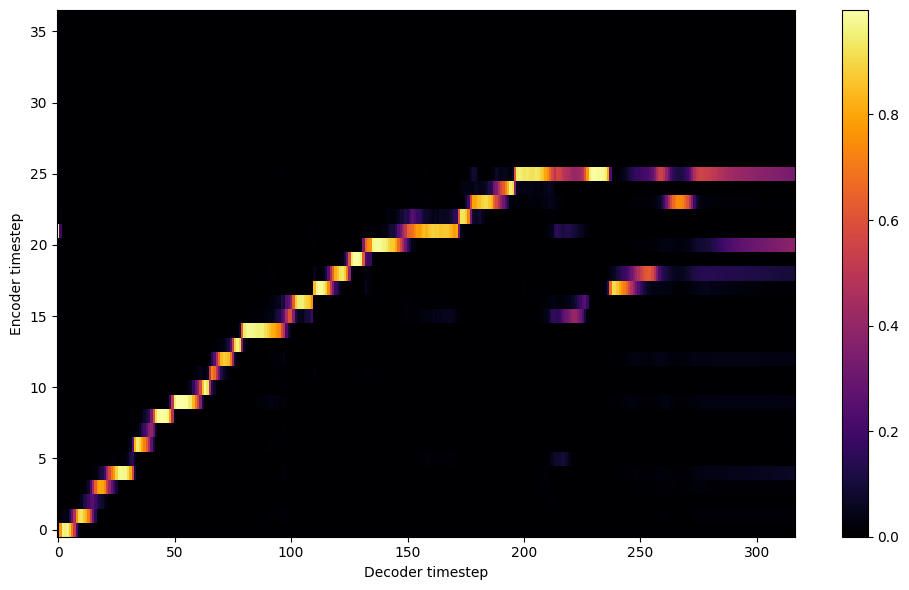


Starting Epoch: 143 Iteration: 2288


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 143 Validation loss 2304:  0.100080  Time: 0.3m LR: 0.000300


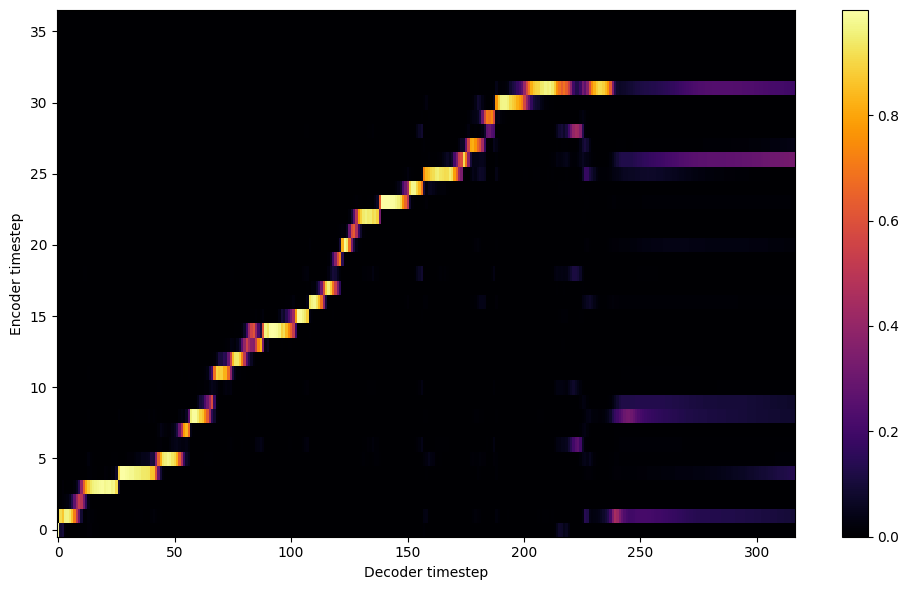


Starting Epoch: 144 Iteration: 2304


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 144 Validation loss 2320:  0.101546  Time: 0.4m LR: 0.000300


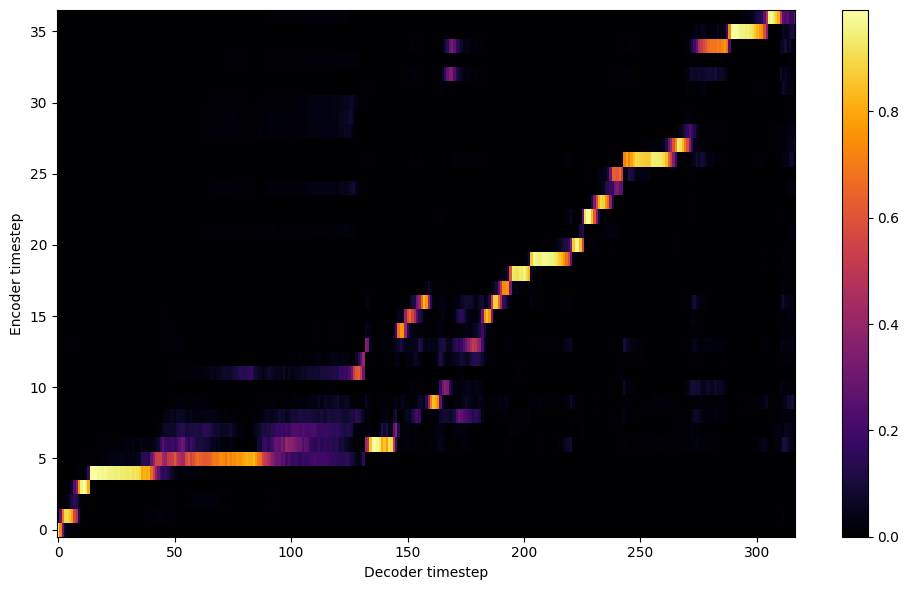


Starting Epoch: 145 Iteration: 2320


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 145 Validation loss 2336:  0.100561  Time: 0.3m LR: 0.000300


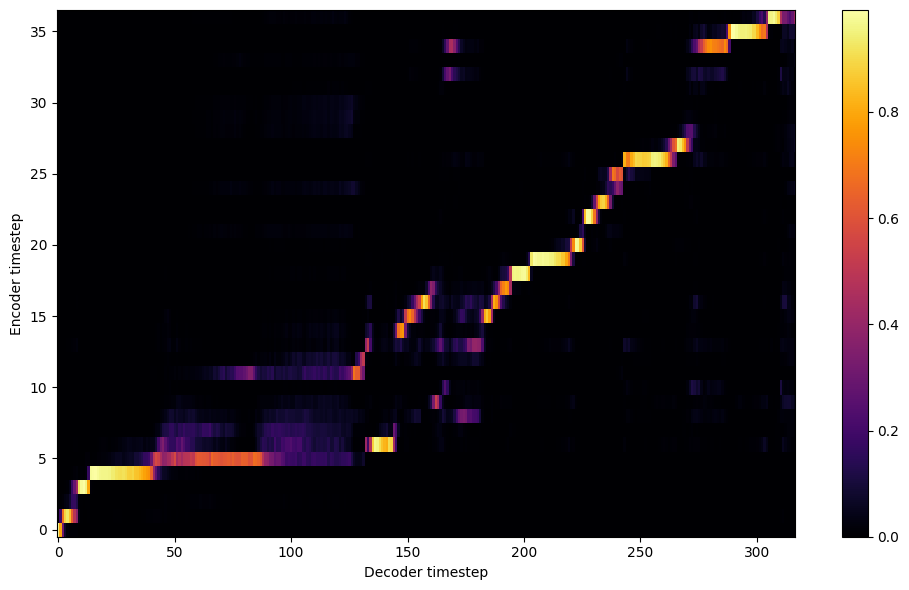


Starting Epoch: 146 Iteration: 2336


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 146 Validation loss 2352:  0.101237  Time: 0.3m LR: 0.000300


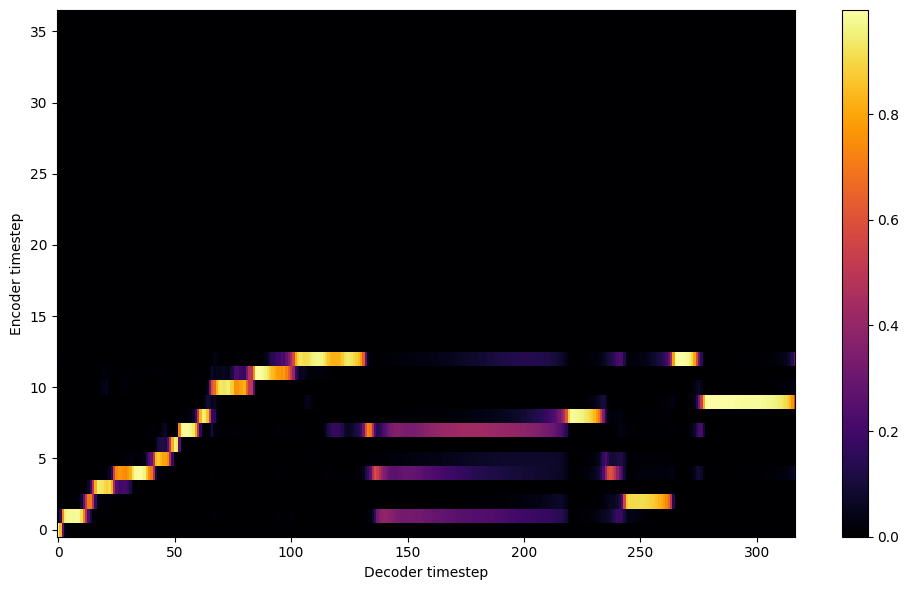


Starting Epoch: 147 Iteration: 2352


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 147 Validation loss 2368:  0.099242  Time: 0.3m LR: 0.000300


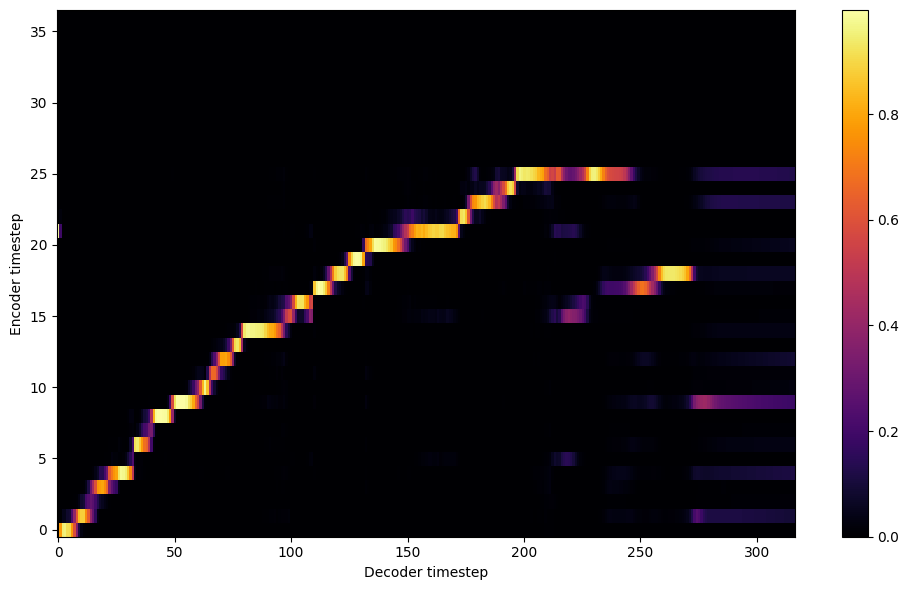


Starting Epoch: 148 Iteration: 2368


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 148 Validation loss 2384:  0.100246  Time: 0.3m LR: 0.000300


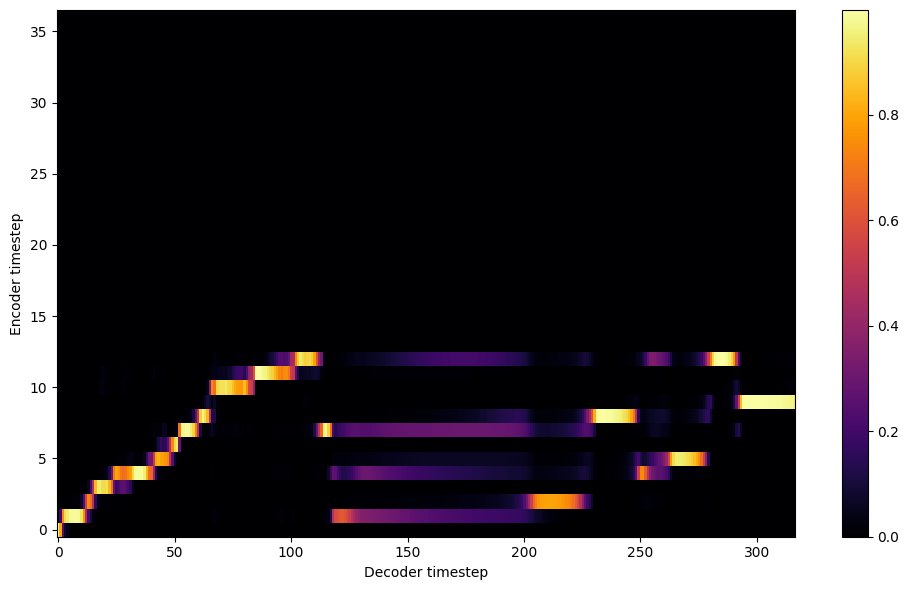


Starting Epoch: 149 Iteration: 2384


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 149 Validation loss 2400:  0.101952  Time: 0.3m LR: 0.000300


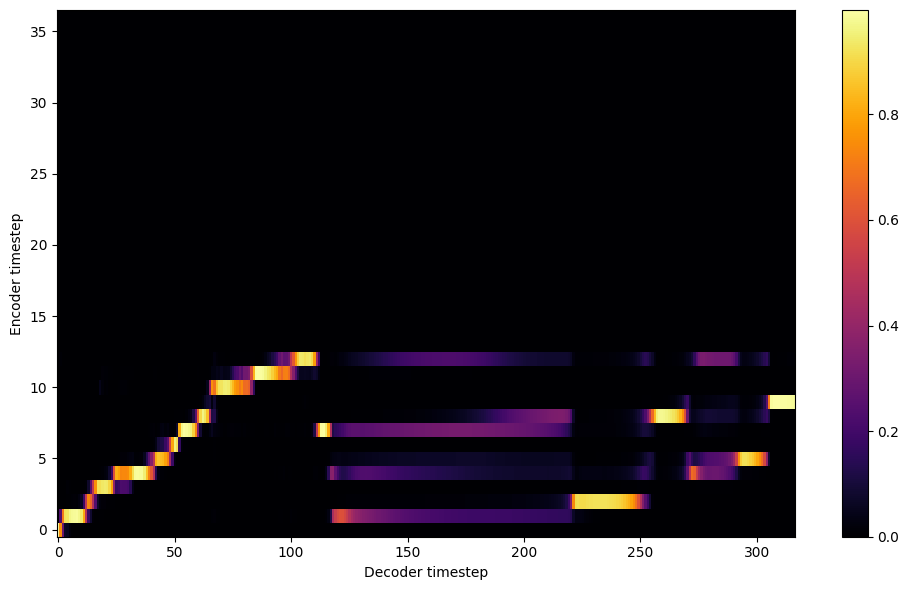

Saving model and optimizer state at iteration 2400 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 150 Iteration: 2400


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 150 Validation loss 2416:  0.101424  Time: 0.3m LR: 0.000300


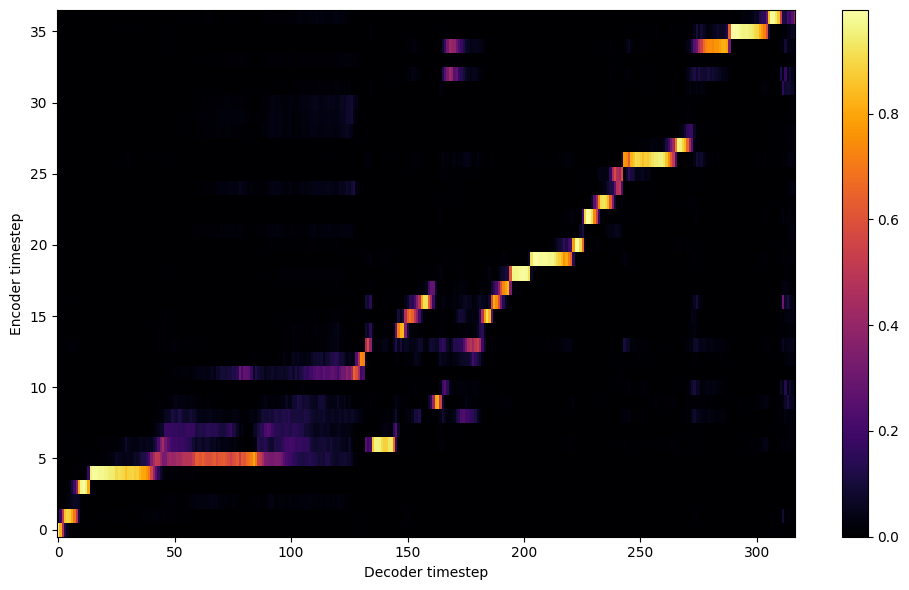


Starting Epoch: 151 Iteration: 2416


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 151 Validation loss 2432:  0.100901  Time: 0.4m LR: 0.000300


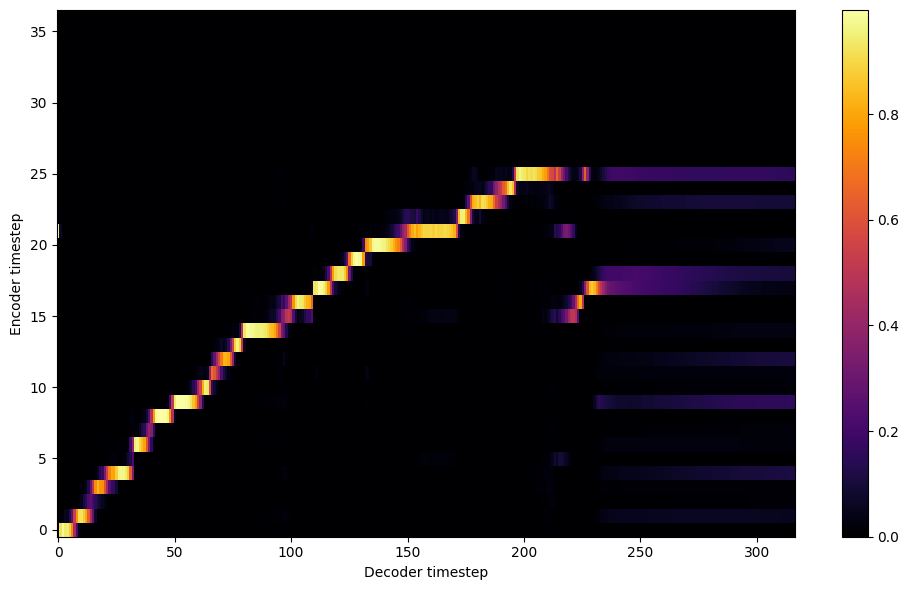


Starting Epoch: 152 Iteration: 2432


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 152 Validation loss 2448:  0.102241  Time: 0.3m LR: 0.000300


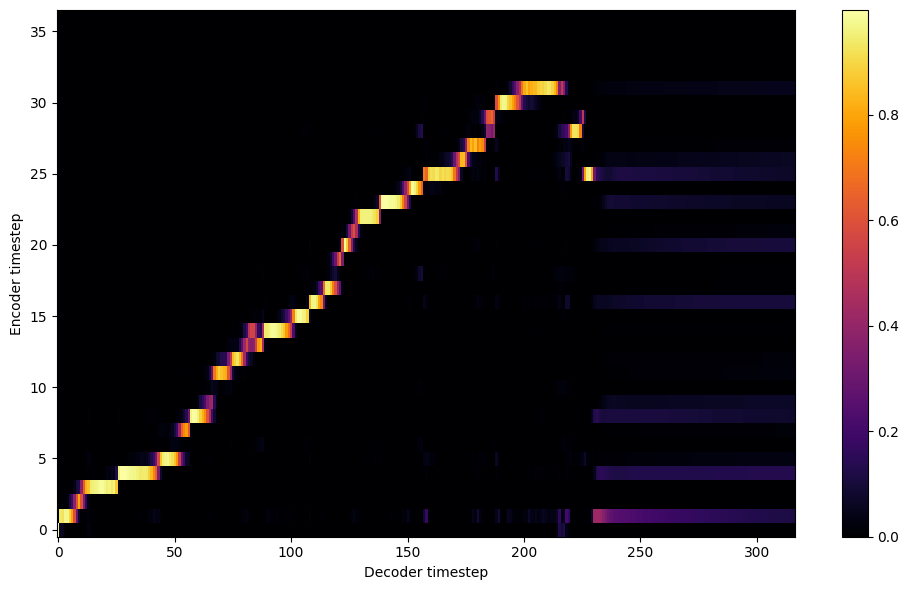


Starting Epoch: 153 Iteration: 2448


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 153 Validation loss 2464:  0.099479  Time: 0.3m LR: 0.000300


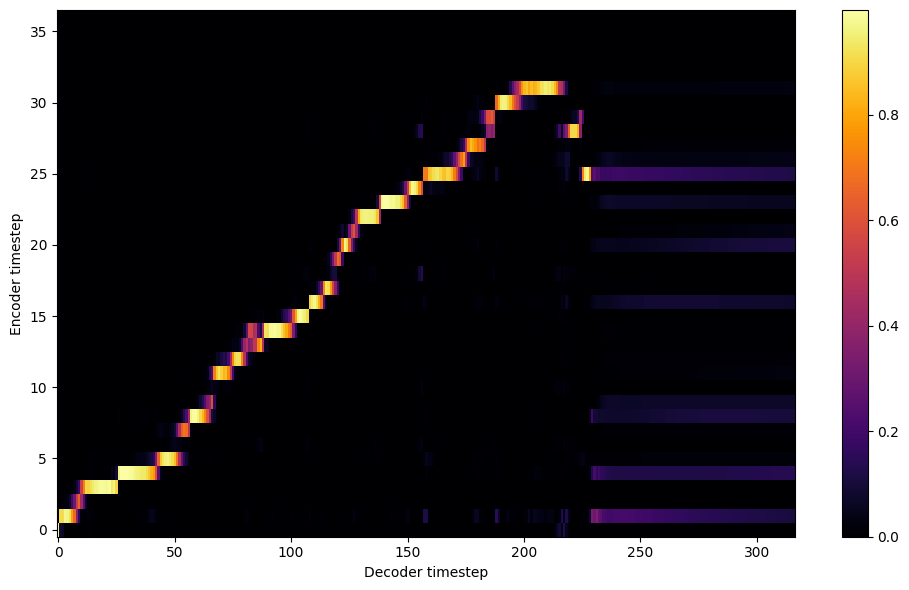


Starting Epoch: 154 Iteration: 2464


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 154 Validation loss 2480:  0.097935  Time: 0.3m LR: 0.000300


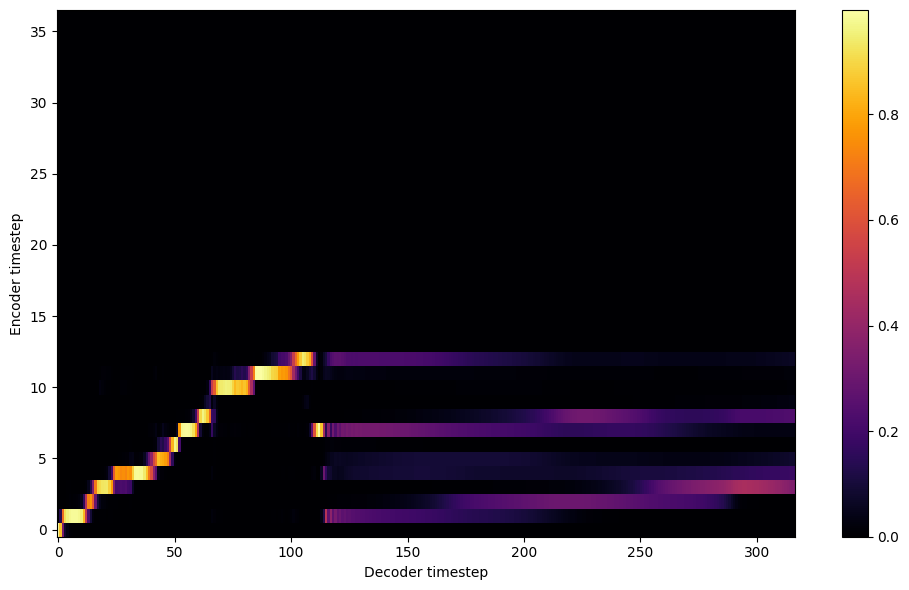


Starting Epoch: 155 Iteration: 2480


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 155 Validation loss 2496:  0.098380  Time: 0.3m LR: 0.000300


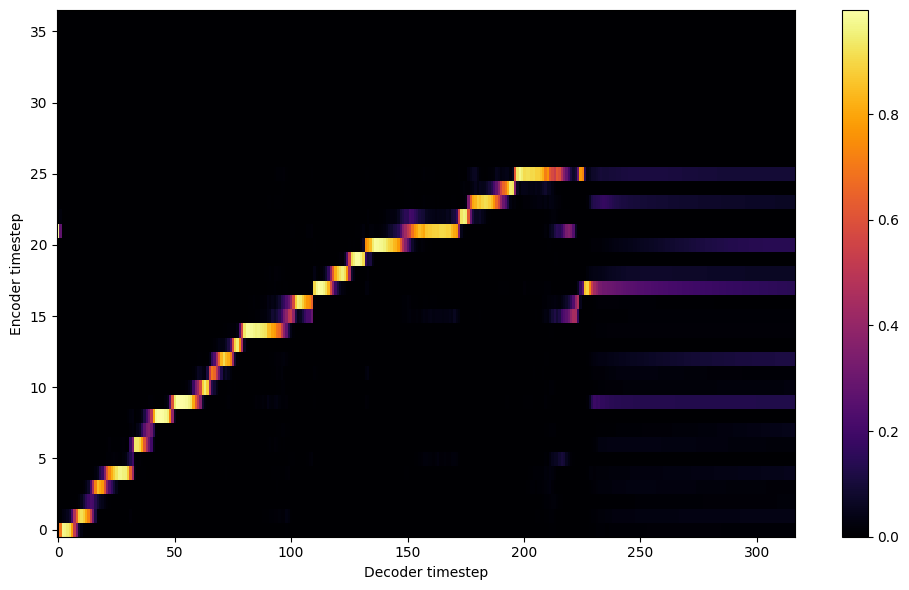


Starting Epoch: 156 Iteration: 2496


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 156 Validation loss 2512:  0.096980  Time: 0.3m LR: 0.000300


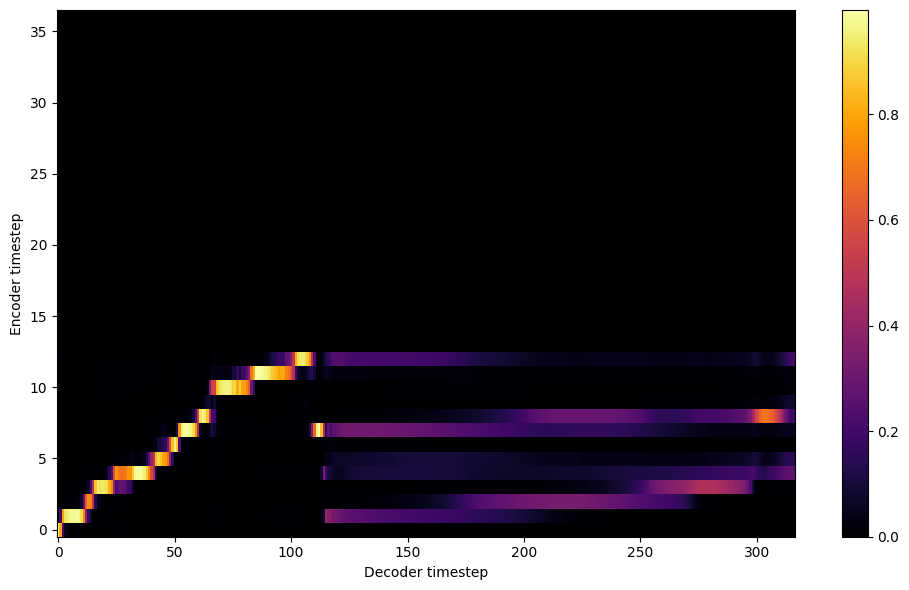


Starting Epoch: 157 Iteration: 2512


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 157 Validation loss 2528:  0.096672  Time: 0.3m LR: 0.000300


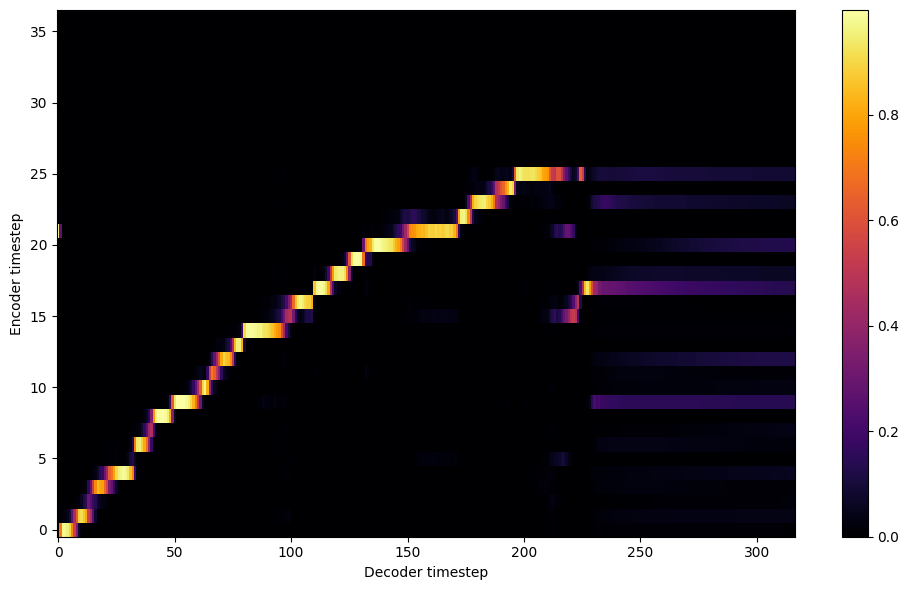


Starting Epoch: 158 Iteration: 2528


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 158 Validation loss 2544:  0.094845  Time: 0.3m LR: 0.000300


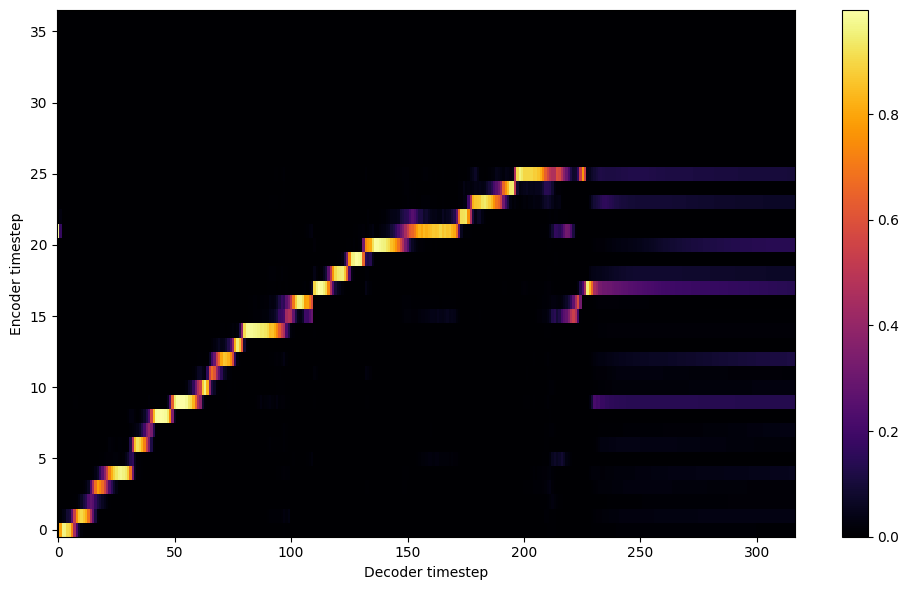


Starting Epoch: 159 Iteration: 2544


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 159 Validation loss 2560:  0.094307  Time: 0.3m LR: 0.000300


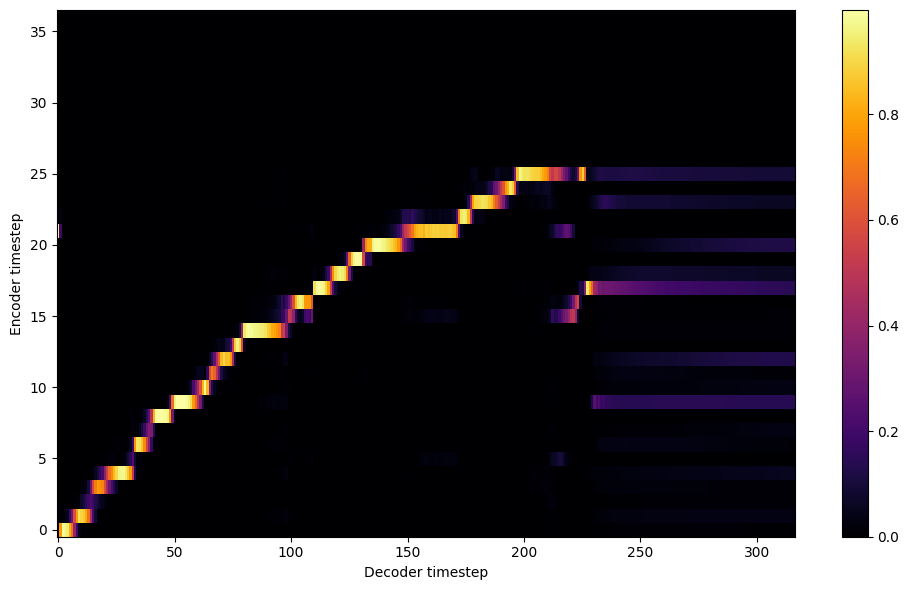

Saving model and optimizer state at iteration 2560 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 160 Iteration: 2560


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 160 Validation loss 2576:  0.093504  Time: 0.4m LR: 0.000300


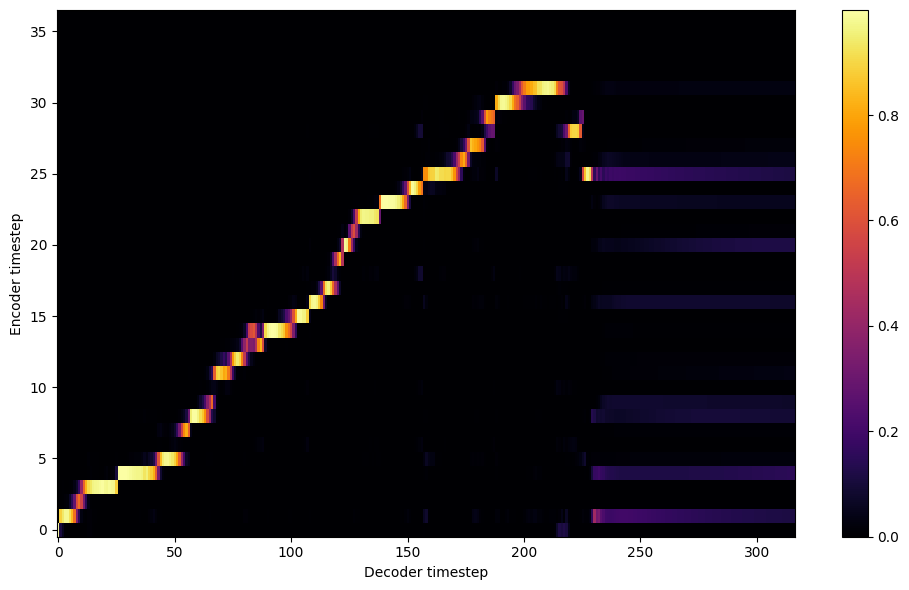


Starting Epoch: 161 Iteration: 2576


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 161 Validation loss 2592:  0.092404  Time: 0.3m LR: 0.000300


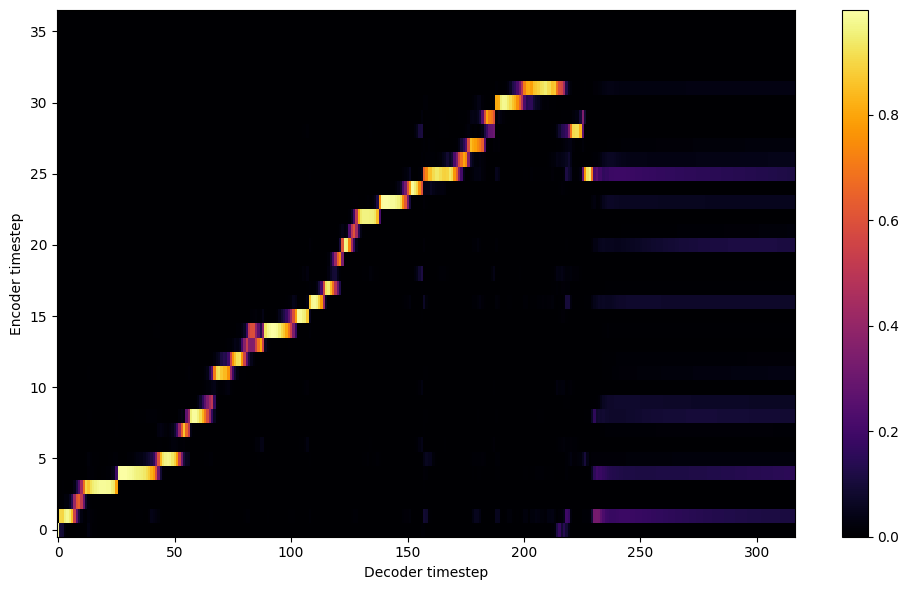


Starting Epoch: 162 Iteration: 2592


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 162 Validation loss 2608:  0.091421  Time: 0.3m LR: 0.000300


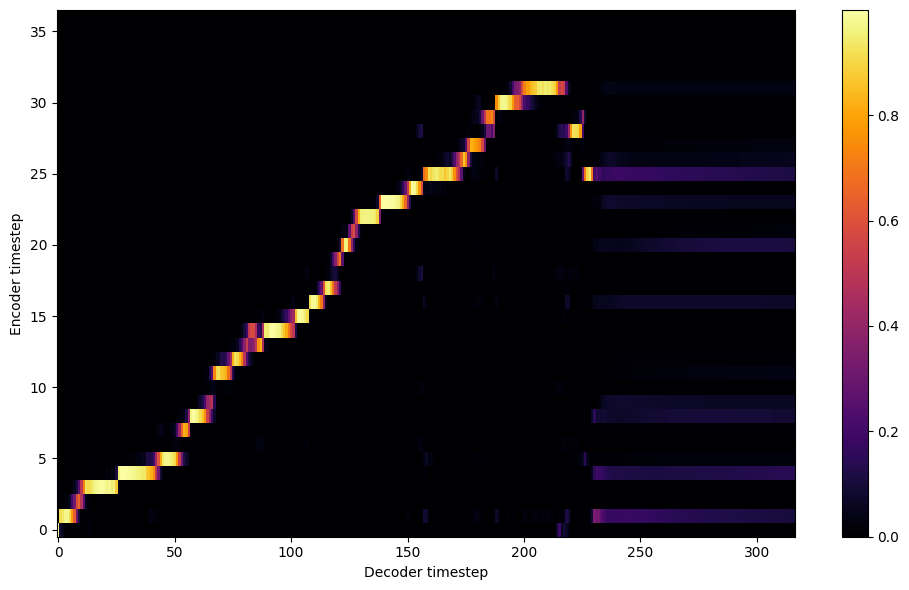


Starting Epoch: 163 Iteration: 2608


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 163 Validation loss 2624:  0.096211  Time: 0.3m LR: 0.000300


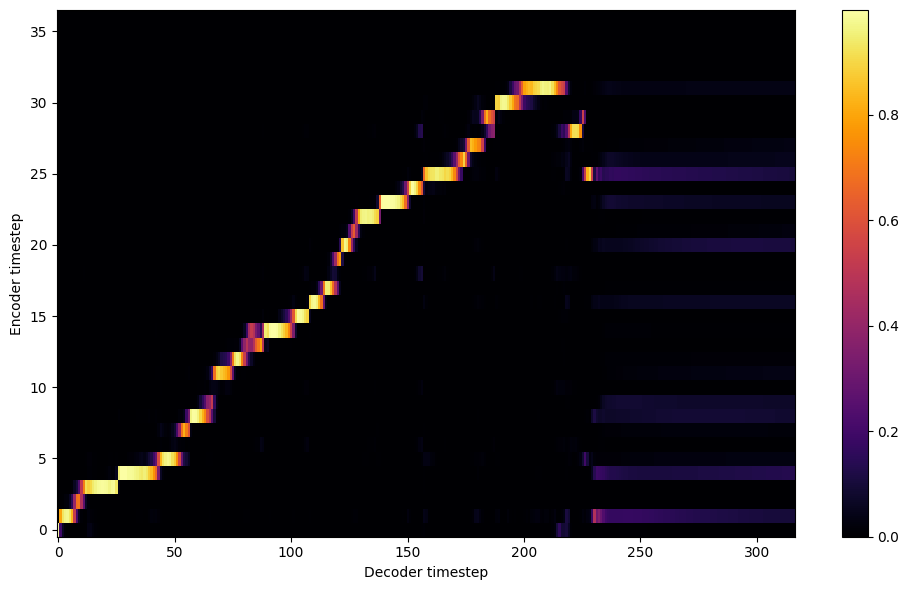


Starting Epoch: 164 Iteration: 2624


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 164 Validation loss 2640:  0.094812  Time: 0.3m LR: 0.000300


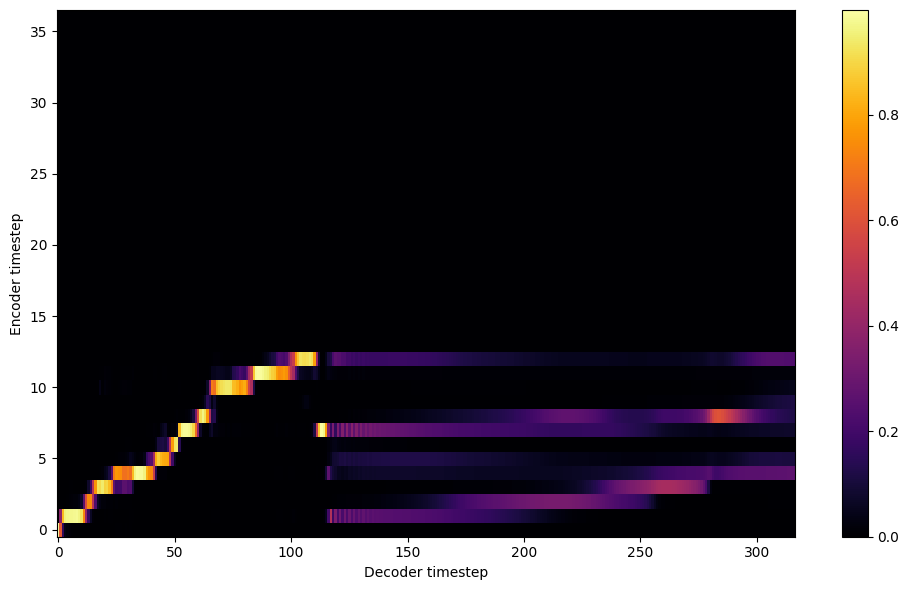


Starting Epoch: 165 Iteration: 2640


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 165 Validation loss 2656:  0.096525  Time: 0.3m LR: 0.000300


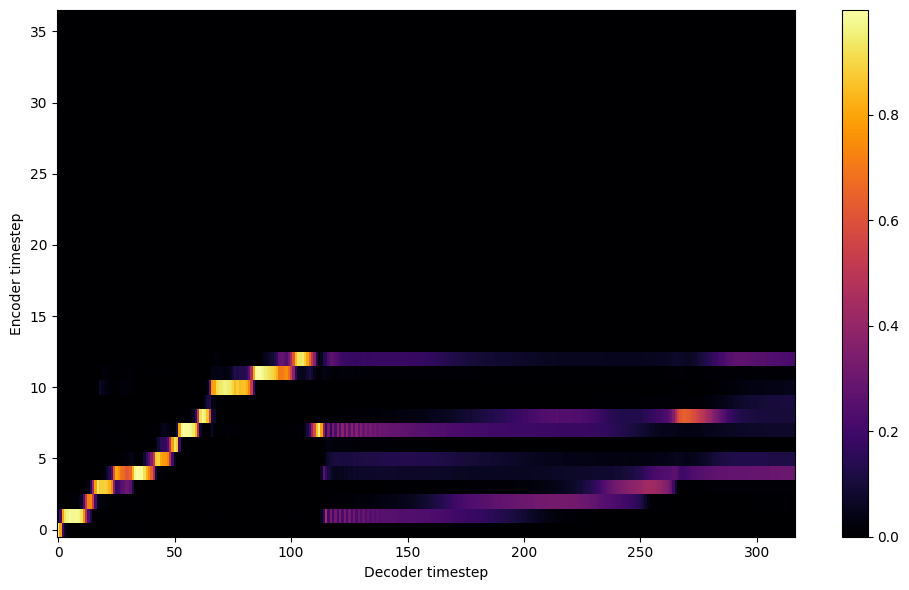


Starting Epoch: 166 Iteration: 2656


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 166 Validation loss 2672:  0.093505  Time: 0.3m LR: 0.000300


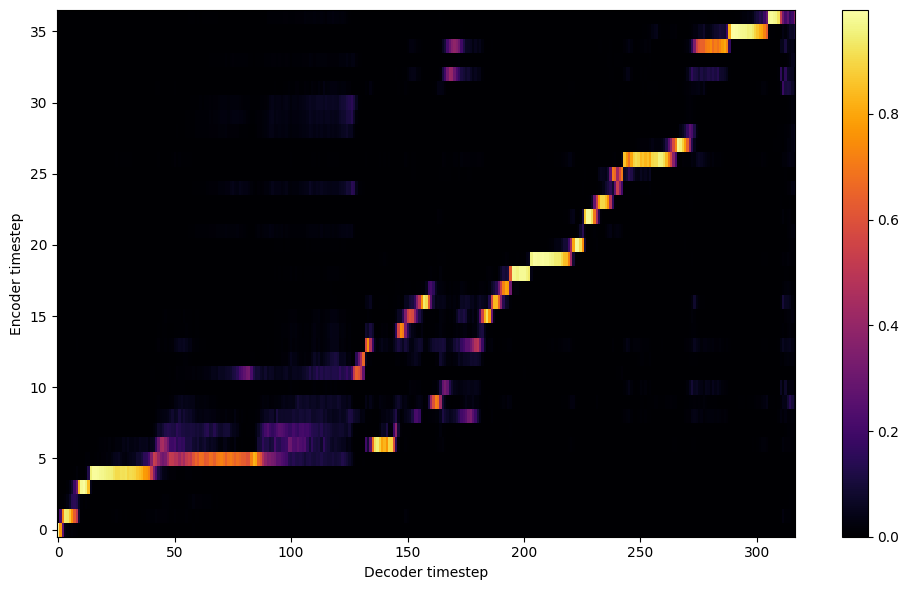


Starting Epoch: 167 Iteration: 2672


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 167 Validation loss 2688:  0.092211  Time: 0.3m LR: 0.000300


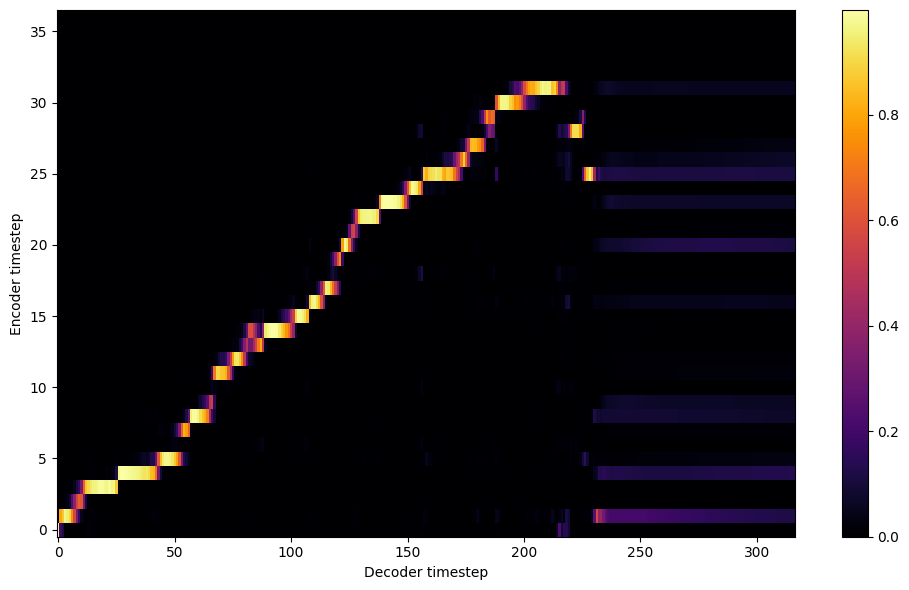


Starting Epoch: 168 Iteration: 2688


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 168 Validation loss 2704:  0.092752  Time: 0.3m LR: 0.000300


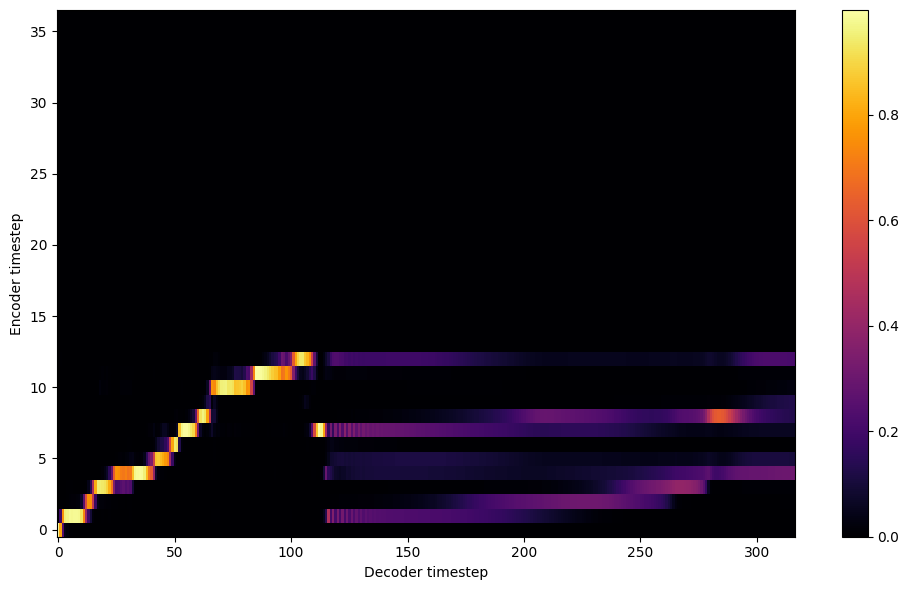


Starting Epoch: 169 Iteration: 2704


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 169 Validation loss 2720:  0.092715  Time: 0.3m LR: 0.000300


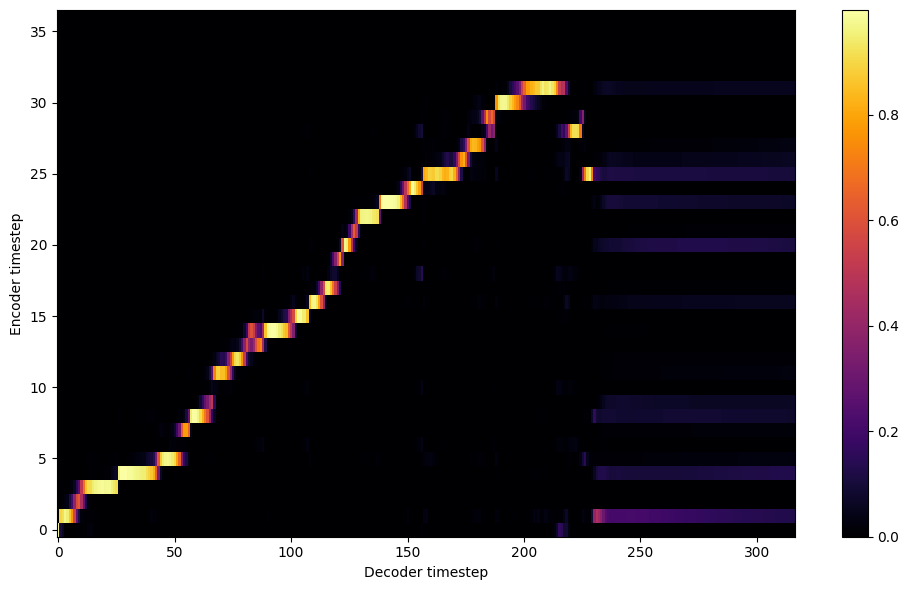

Saving model and optimizer state at iteration 2720 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 170 Iteration: 2720


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 170 Validation loss 2736:  0.093032  Time: 0.4m LR: 0.000300


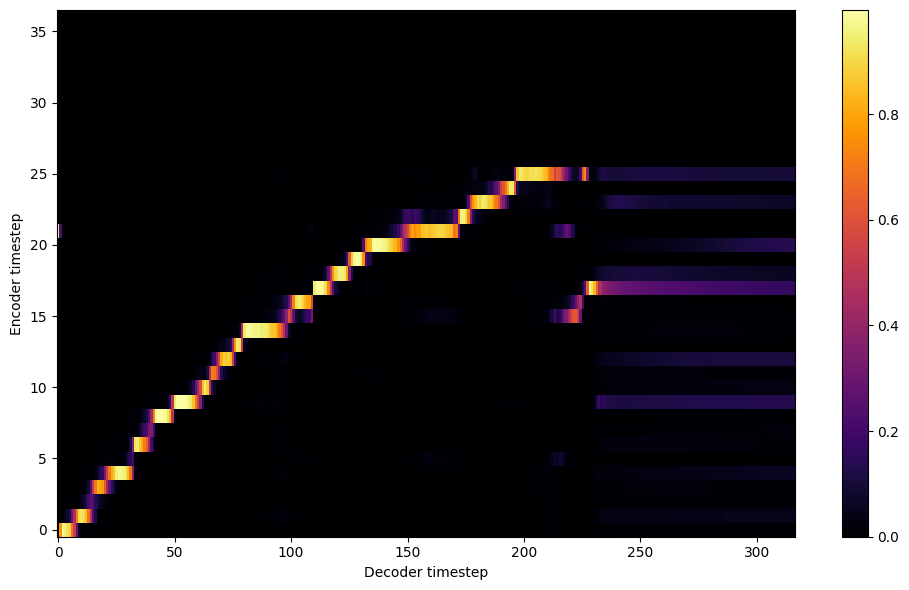


Starting Epoch: 171 Iteration: 2736


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 171 Validation loss 2752:  0.092614  Time: 0.3m LR: 0.000300


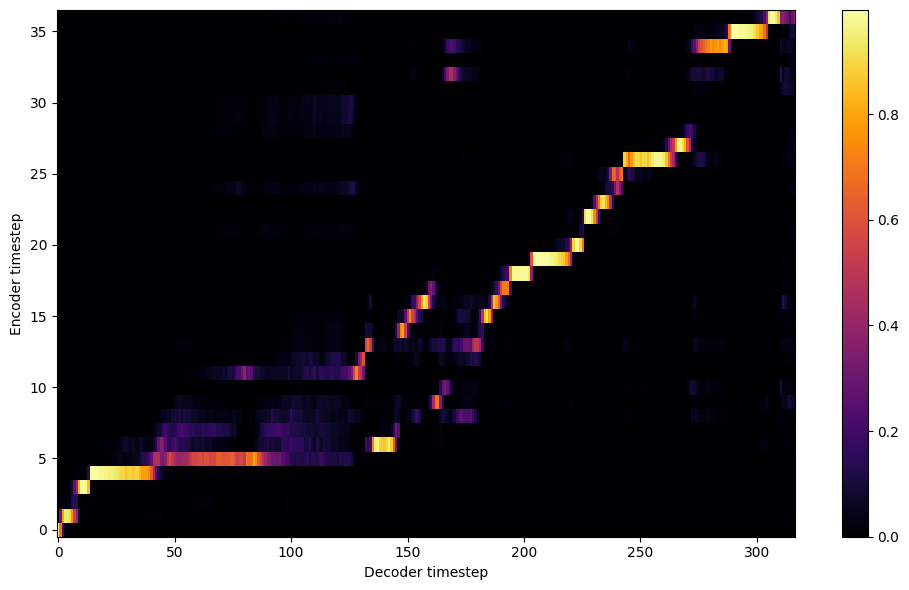


Starting Epoch: 172 Iteration: 2752


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 172 Validation loss 2768:  0.094180  Time: 0.3m LR: 0.000300


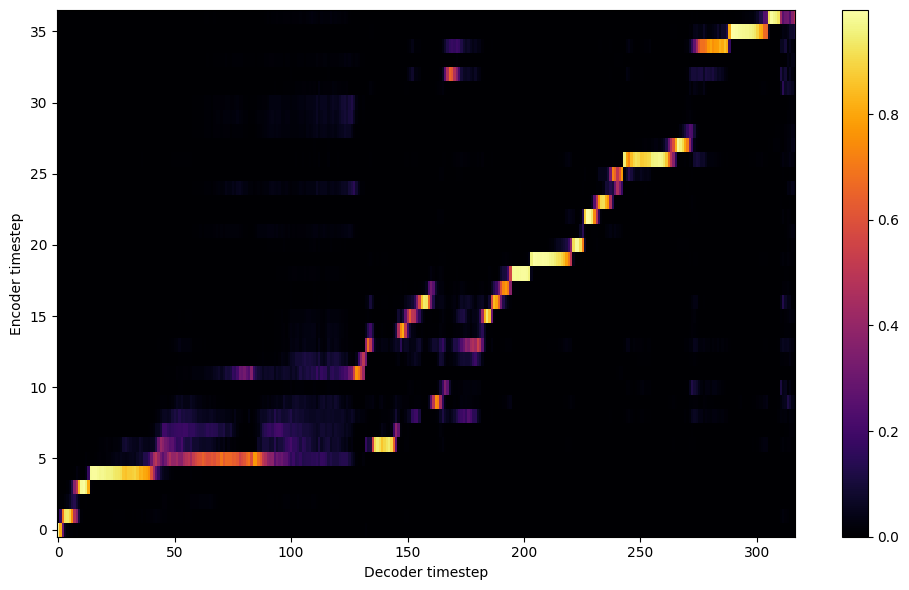


Starting Epoch: 173 Iteration: 2768


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 173 Validation loss 2784:  0.090703  Time: 0.3m LR: 0.000300


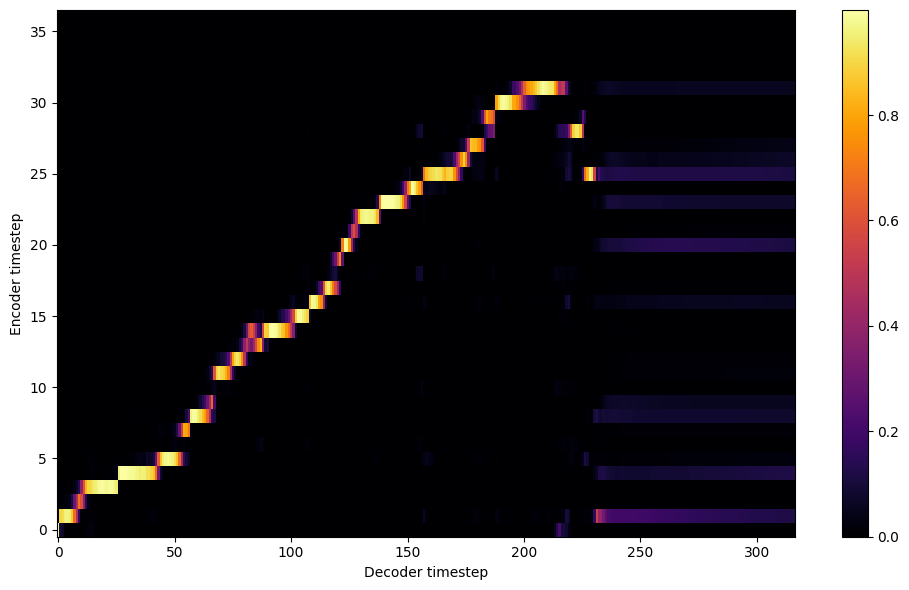


Starting Epoch: 174 Iteration: 2784


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 174 Validation loss 2800:  0.089857  Time: 0.3m LR: 0.000300


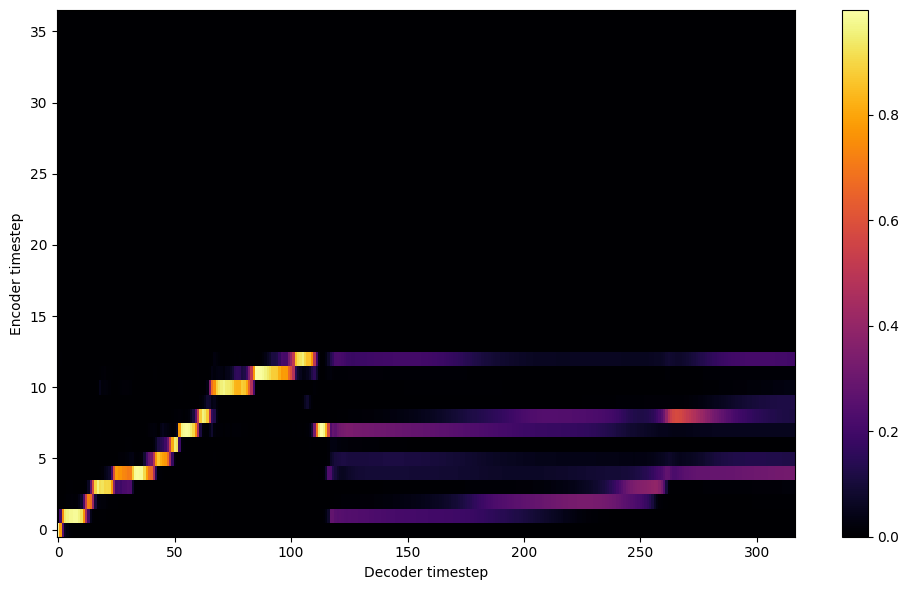


Starting Epoch: 175 Iteration: 2800


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 175 Validation loss 2816:  0.091841  Time: 0.3m LR: 0.000300


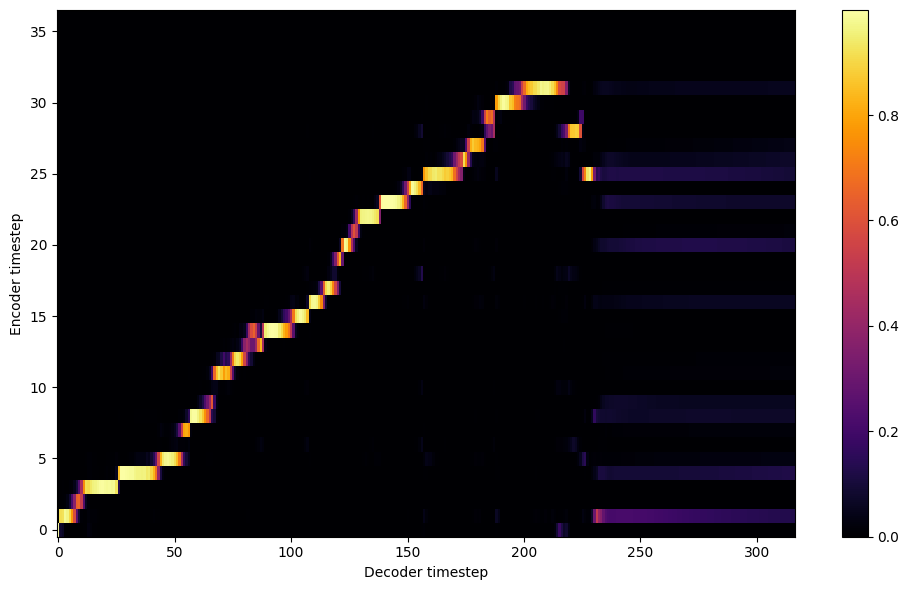


Starting Epoch: 176 Iteration: 2816


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 176 Validation loss 2832:  0.090627  Time: 0.3m LR: 0.000300


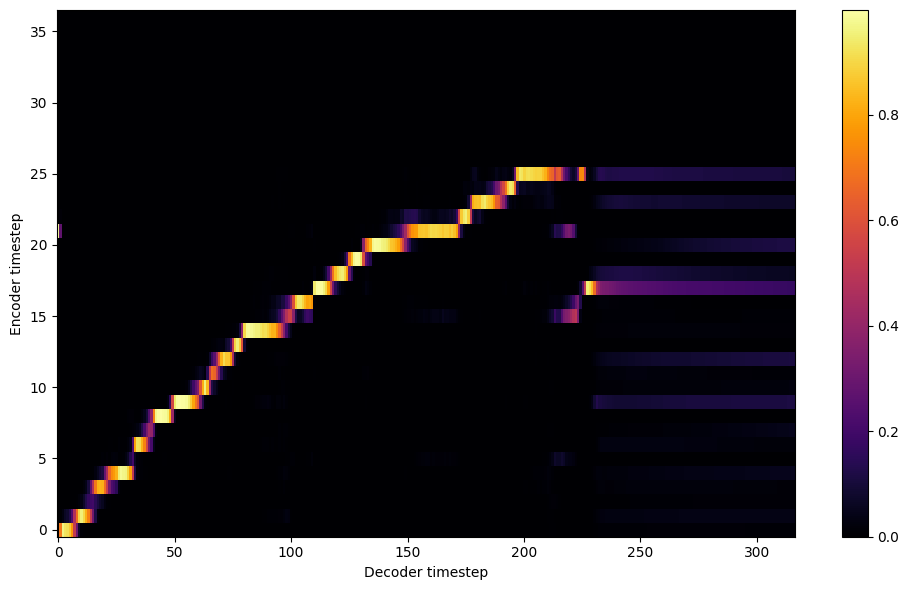


Starting Epoch: 177 Iteration: 2832


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 177 Validation loss 2848:  0.088768  Time: 0.3m LR: 0.000300


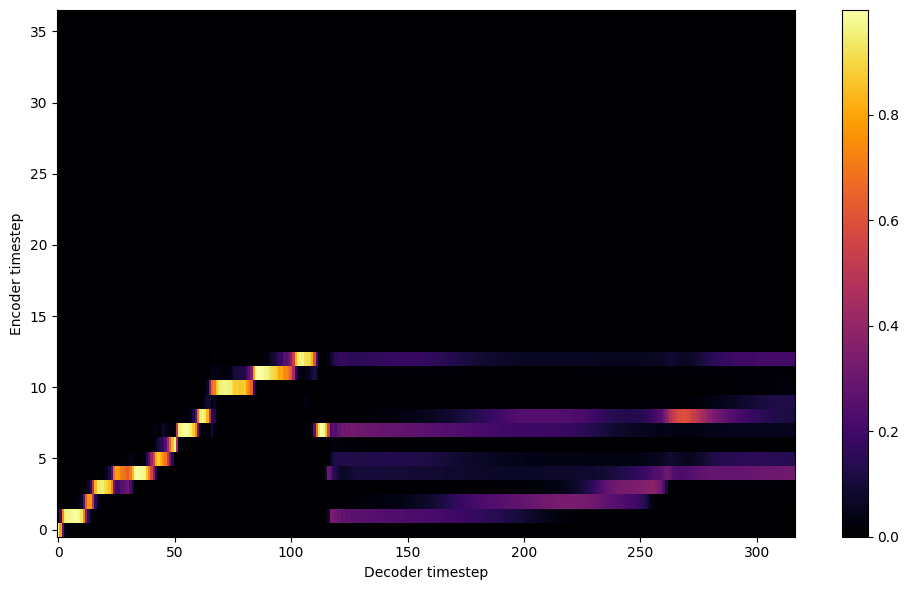


Starting Epoch: 178 Iteration: 2848


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 178 Validation loss 2864:  0.089765  Time: 0.3m LR: 0.000300


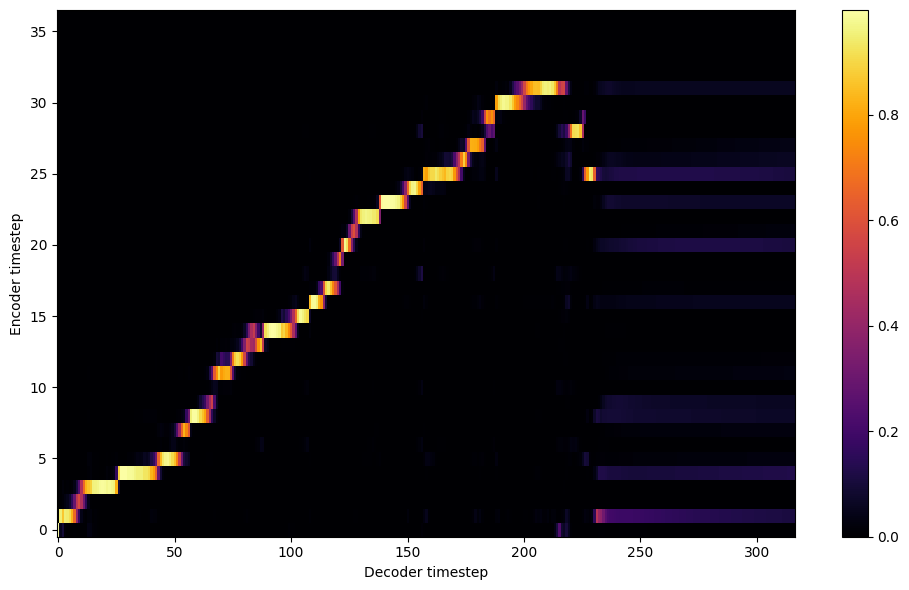


Starting Epoch: 179 Iteration: 2864


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 179 Validation loss 2880:  0.091592  Time: 0.3m LR: 0.000300


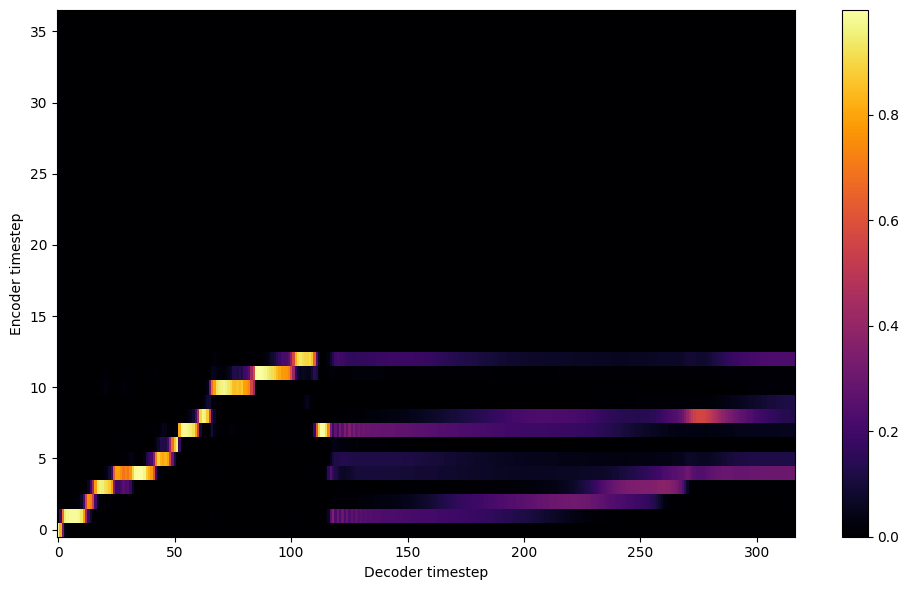

Saving model and optimizer state at iteration 2880 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 180 Iteration: 2880


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 180 Validation loss 2896:  0.090235  Time: 0.4m LR: 0.000300


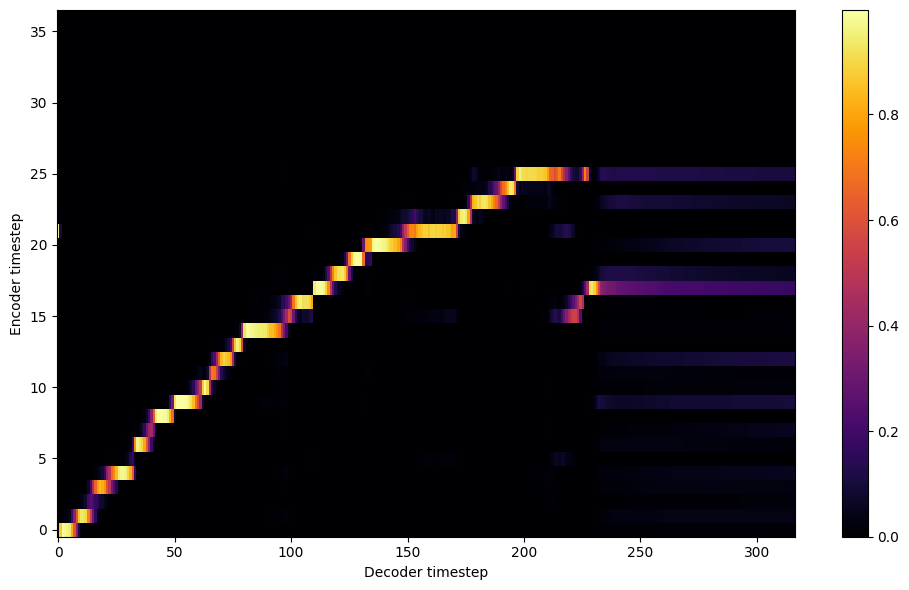


Starting Epoch: 181 Iteration: 2896


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 181 Validation loss 2912:  0.090889  Time: 0.3m LR: 0.000300


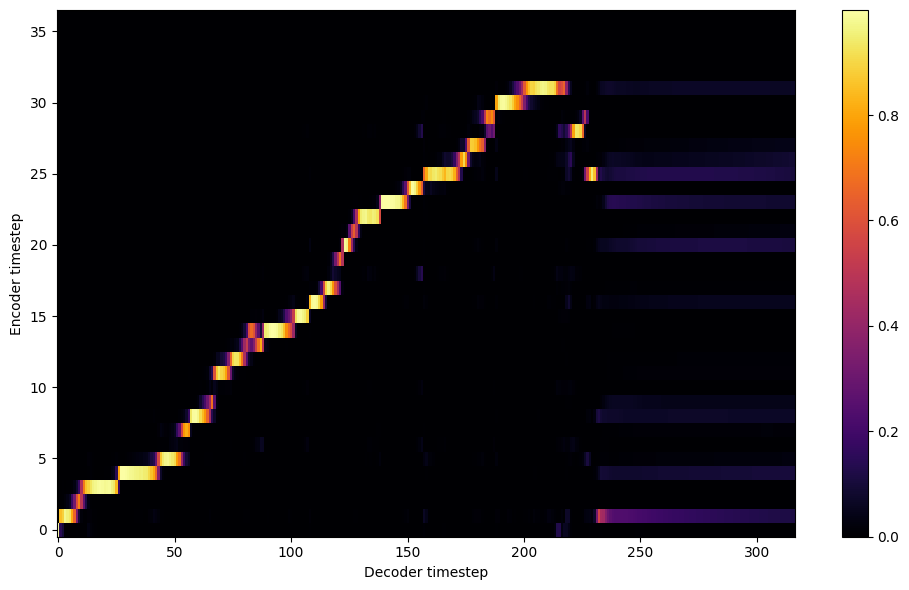


Starting Epoch: 182 Iteration: 2912


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 182 Validation loss 2928:  0.089350  Time: 0.3m LR: 0.000300


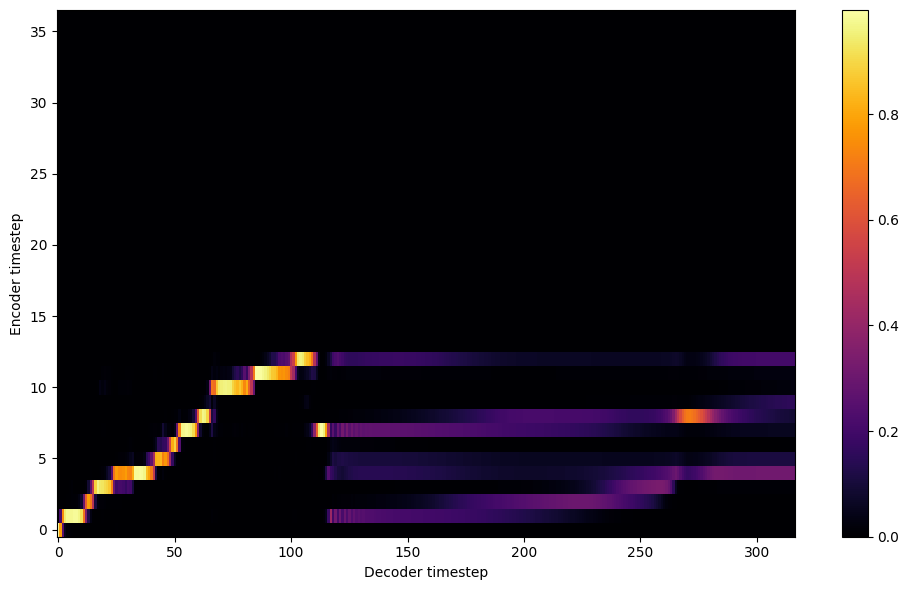


Starting Epoch: 183 Iteration: 2928


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 183 Validation loss 2944:  0.089558  Time: 0.3m LR: 0.000300


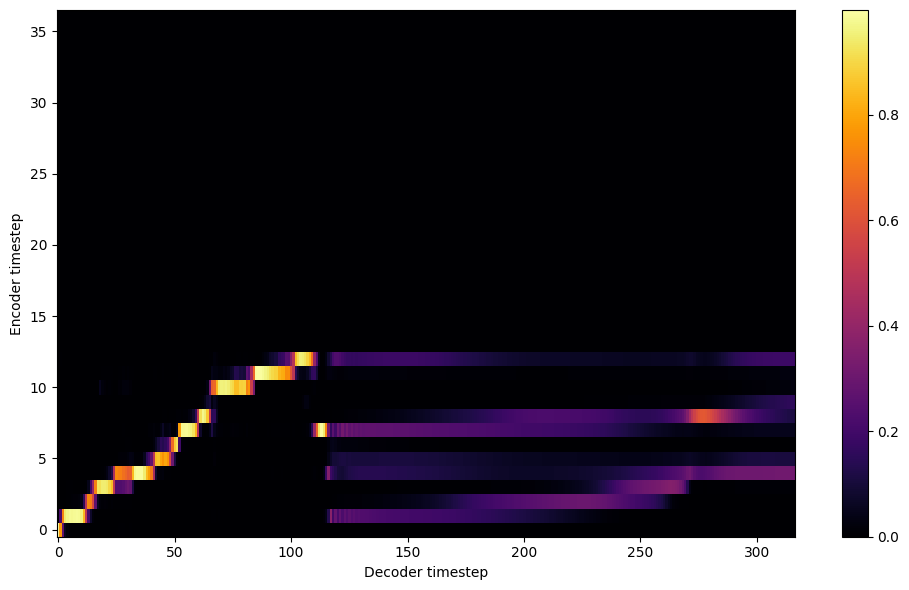


Starting Epoch: 184 Iteration: 2944


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 184 Validation loss 2960:  0.090490  Time: 0.3m LR: 0.000300


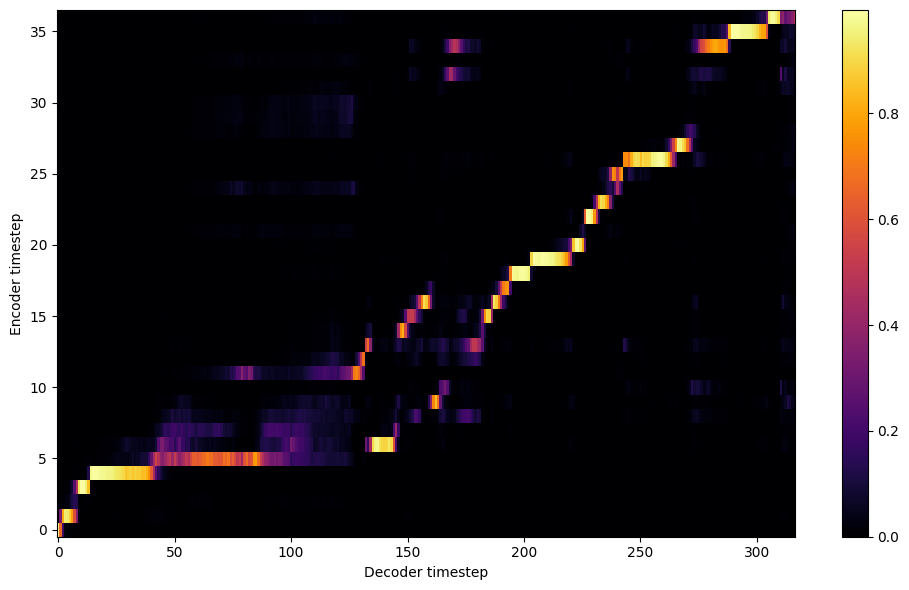


Starting Epoch: 185 Iteration: 2960


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 185 Validation loss 2976:  0.087685  Time: 0.3m LR: 0.000300


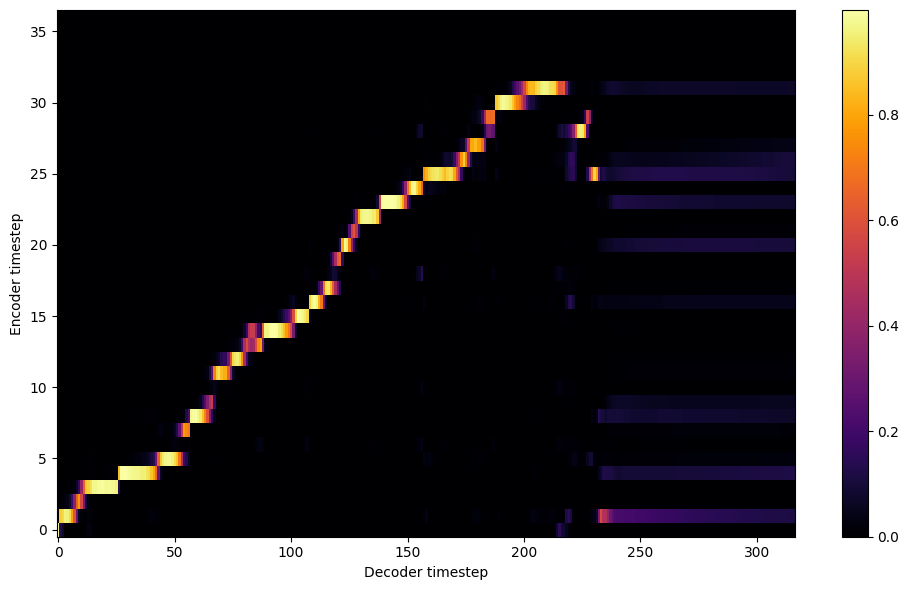


Starting Epoch: 186 Iteration: 2976


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 186 Validation loss 2992:  0.087959  Time: 0.3m LR: 0.000300


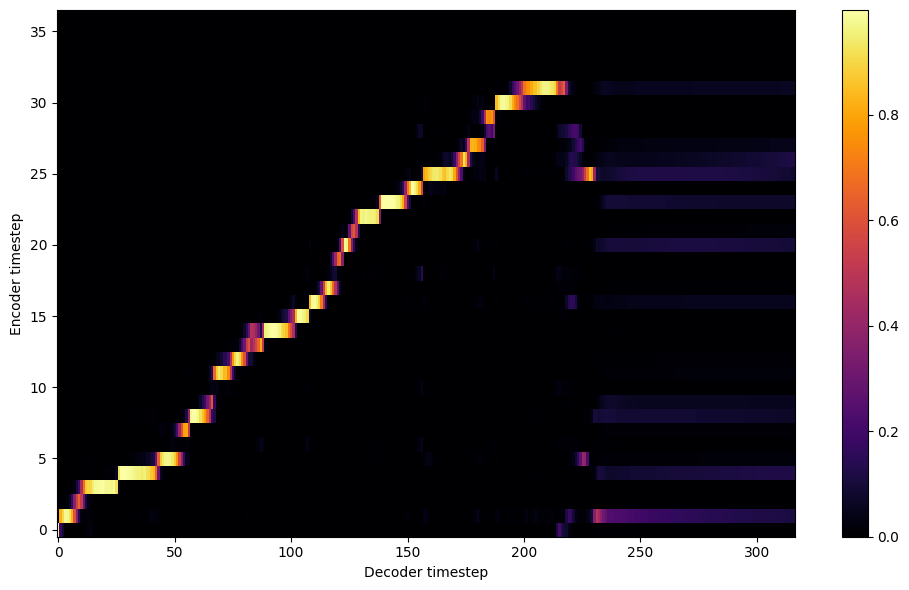


Starting Epoch: 187 Iteration: 2992


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 187 Validation loss 3008:  0.087547  Time: 0.3m LR: 0.000300


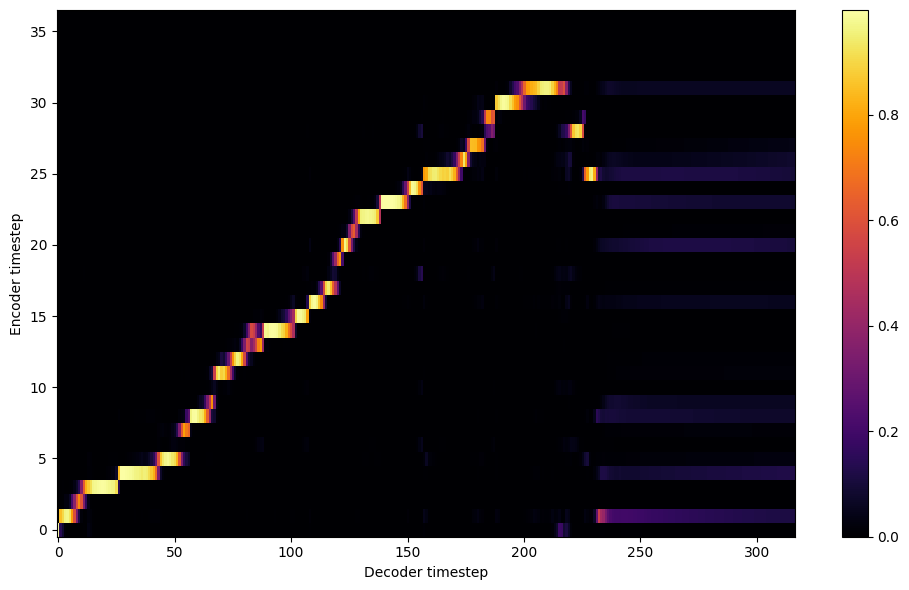


Starting Epoch: 188 Iteration: 3008


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 188 Validation loss 3024:  0.086678  Time: 0.4m LR: 0.000300


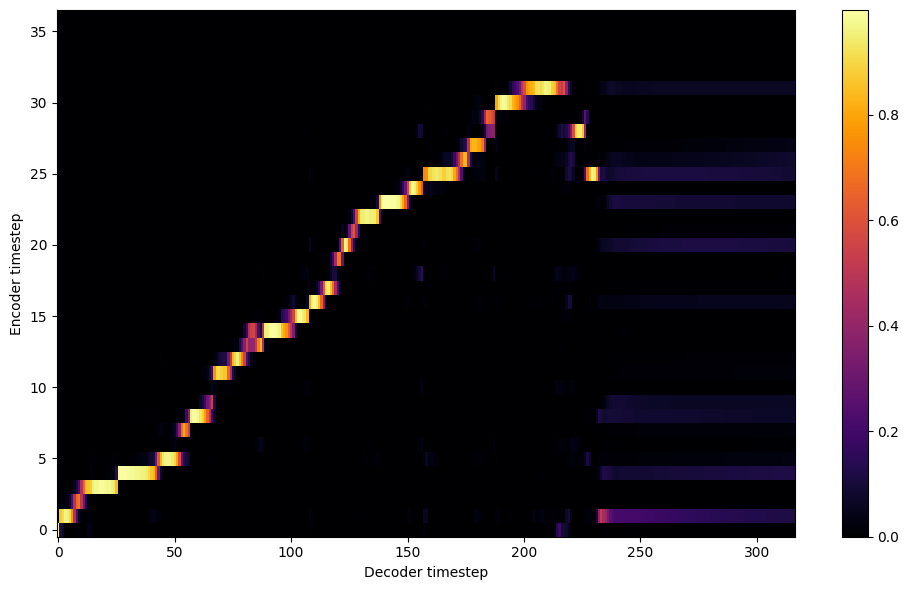


Starting Epoch: 189 Iteration: 3024


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 189 Validation loss 3040:  0.085868  Time: 0.3m LR: 0.000300


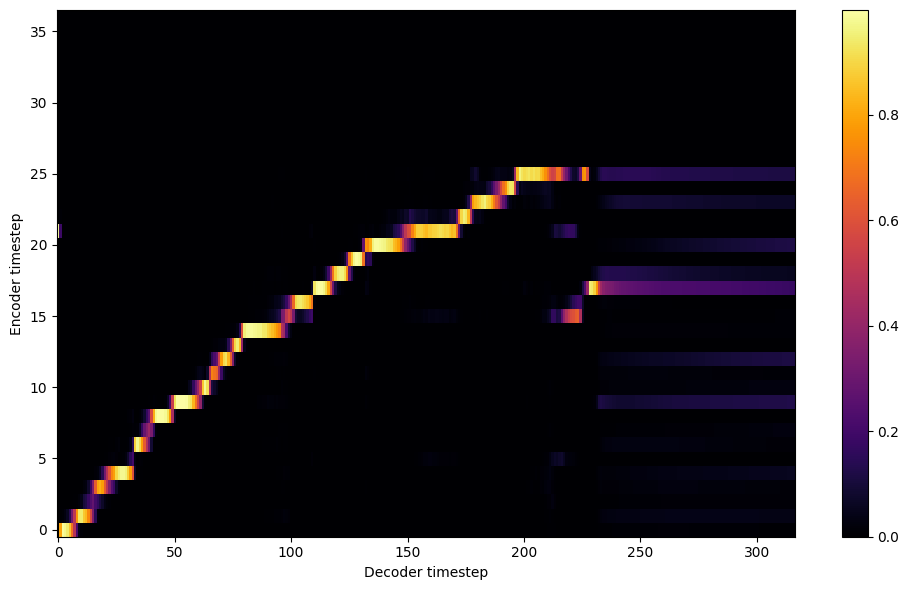

Saving model and optimizer state at iteration 3040 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 190 Iteration: 3040


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 190 Validation loss 3056:  0.084071  Time: 0.4m LR: 0.000300


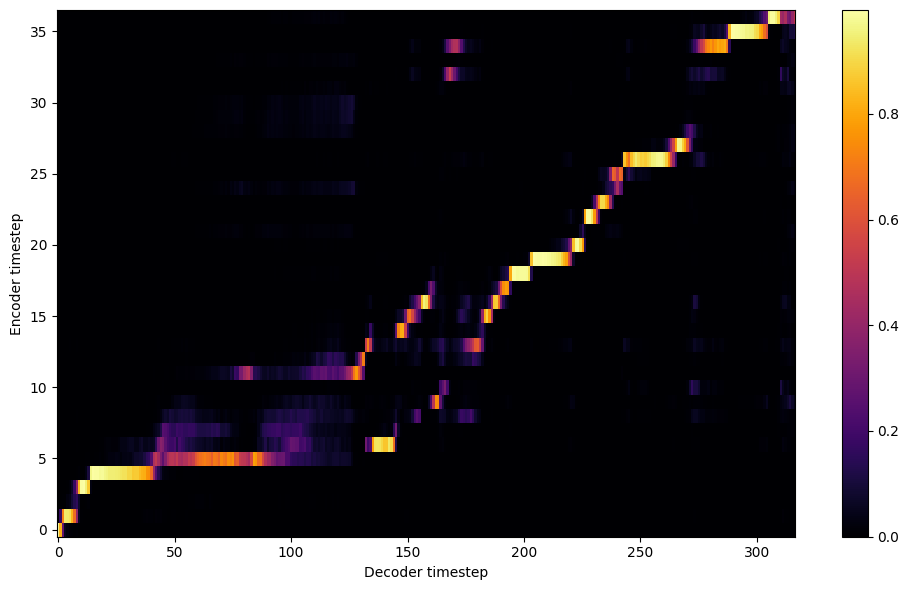


Starting Epoch: 191 Iteration: 3056


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 191 Validation loss 3072:  0.083676  Time: 0.4m LR: 0.000300


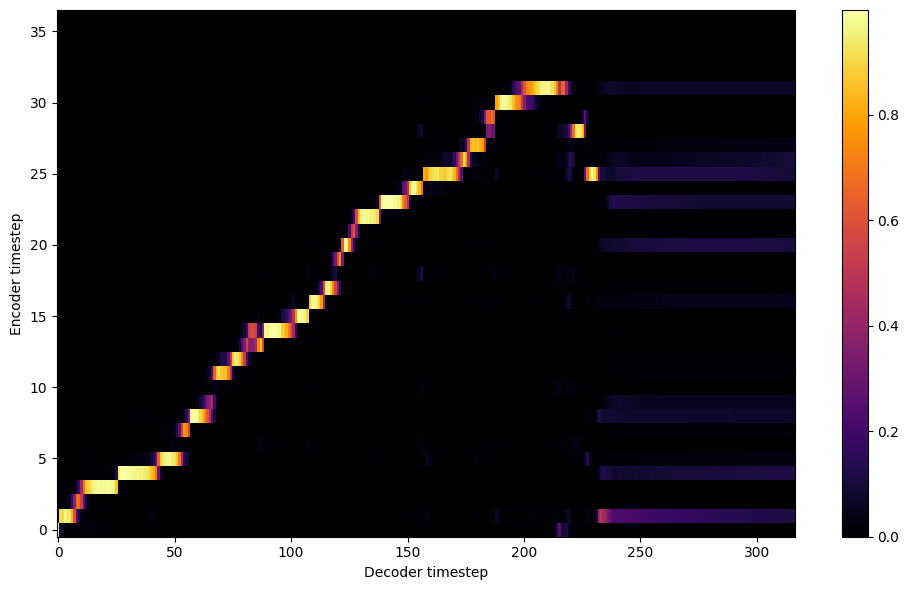


Starting Epoch: 192 Iteration: 3072


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 192 Validation loss 3088:  0.085539  Time: 0.3m LR: 0.000300


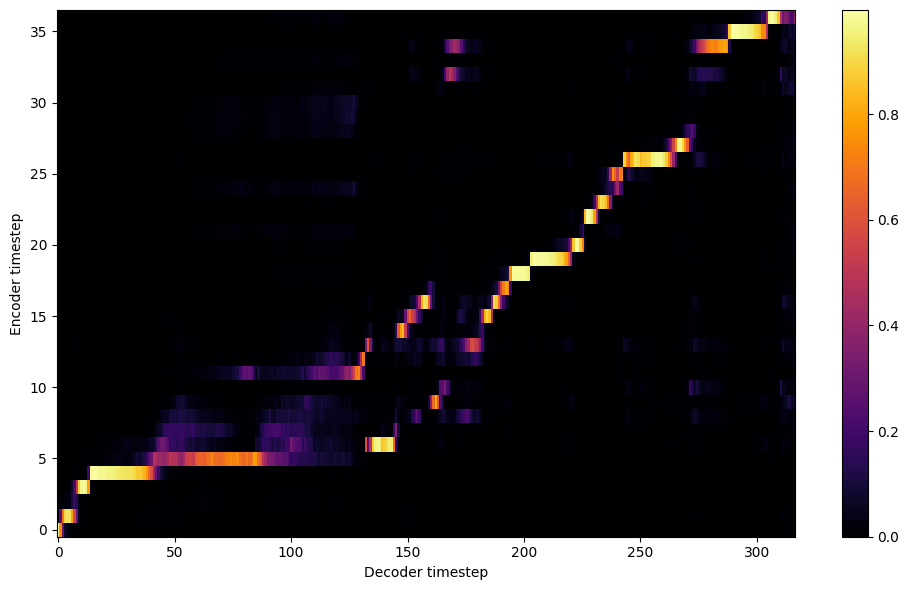


Starting Epoch: 193 Iteration: 3088


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 193 Validation loss 3104:  0.085142  Time: 0.3m LR: 0.000300


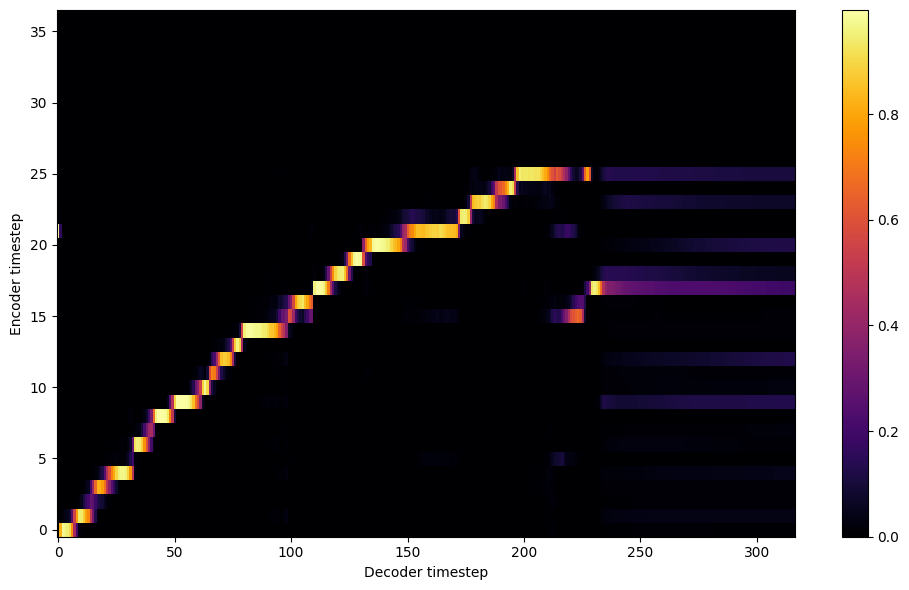


Starting Epoch: 194 Iteration: 3104


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 194 Validation loss 3120:  0.083695  Time: 0.4m LR: 0.000300


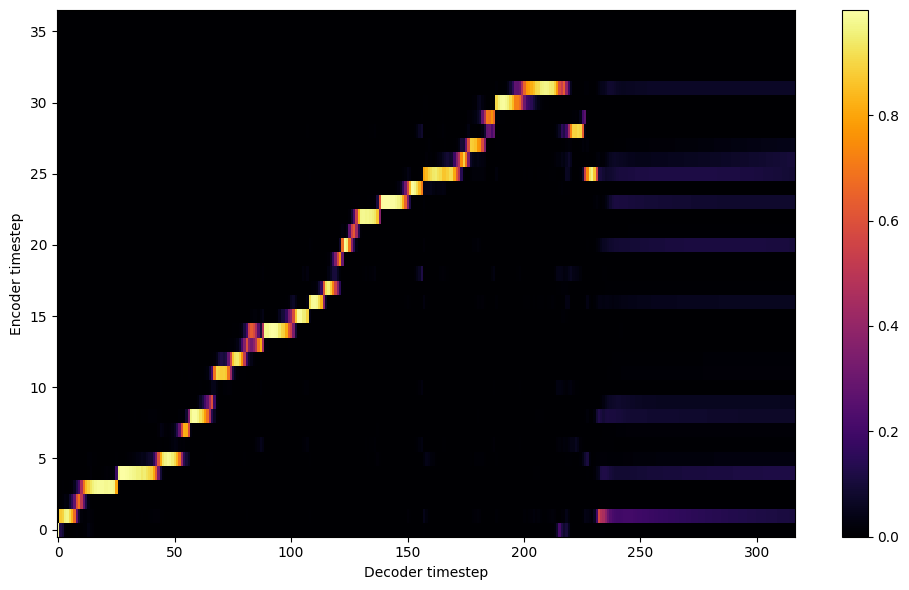


Starting Epoch: 195 Iteration: 3120


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 195 Validation loss 3136:  0.084637  Time: 0.3m LR: 0.000300


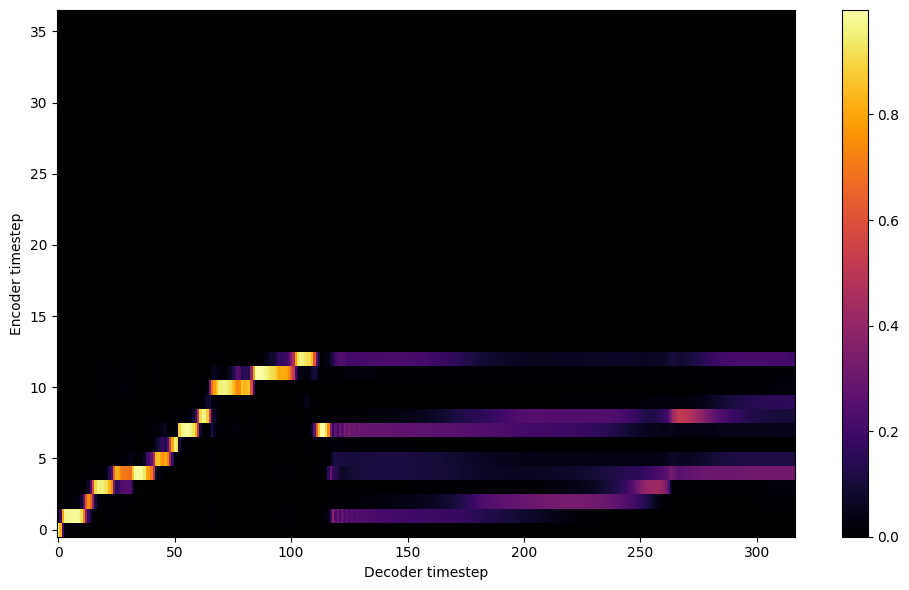


Starting Epoch: 196 Iteration: 3136


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 196 Validation loss 3152:  0.084677  Time: 0.3m LR: 0.000300


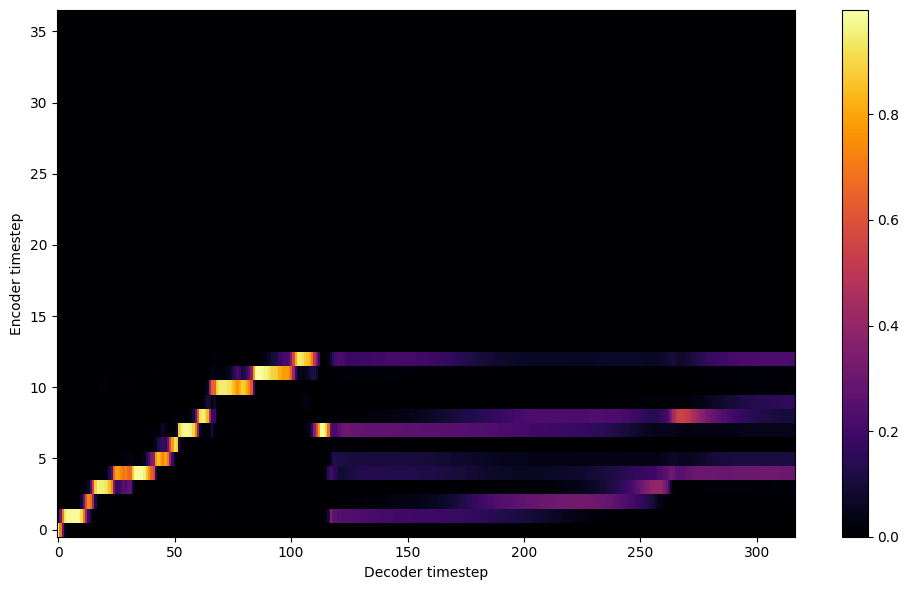


Starting Epoch: 197 Iteration: 3152


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 197 Validation loss 3168:  0.085971  Time: 0.3m LR: 0.000300


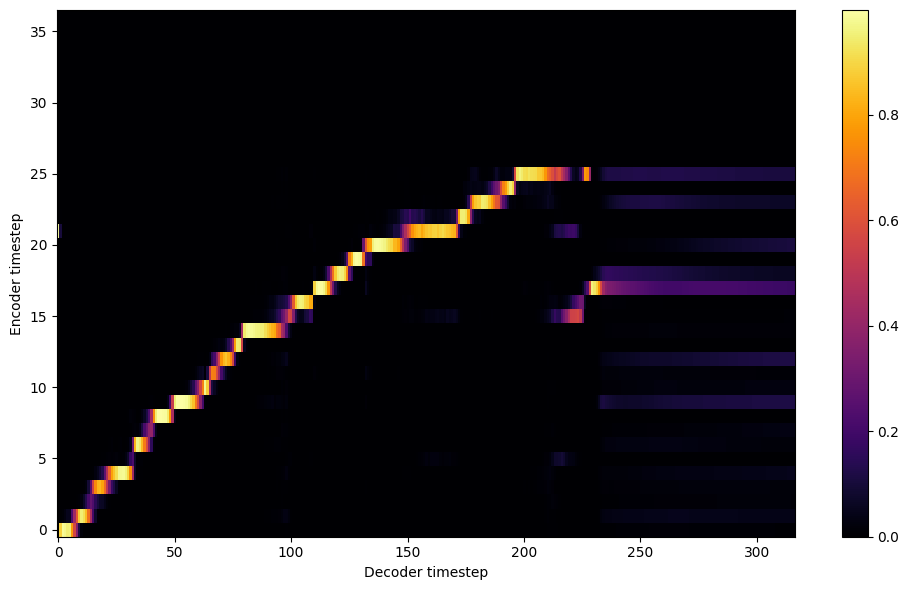


Starting Epoch: 198 Iteration: 3168


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 198 Validation loss 3184:  0.082781  Time: 0.3m LR: 0.000300


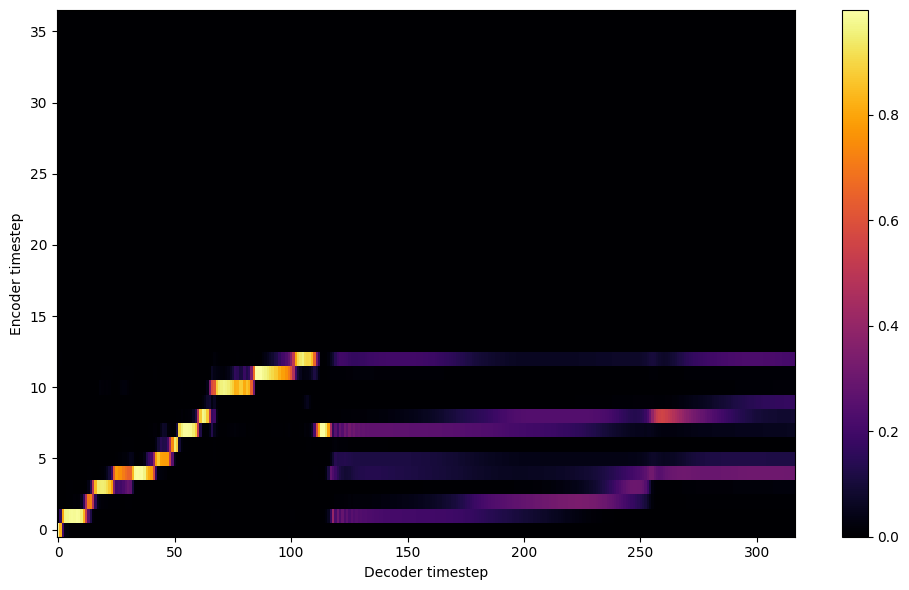


Starting Epoch: 199 Iteration: 3184


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 199 Validation loss 3200:  0.082982  Time: 0.3m LR: 0.000300


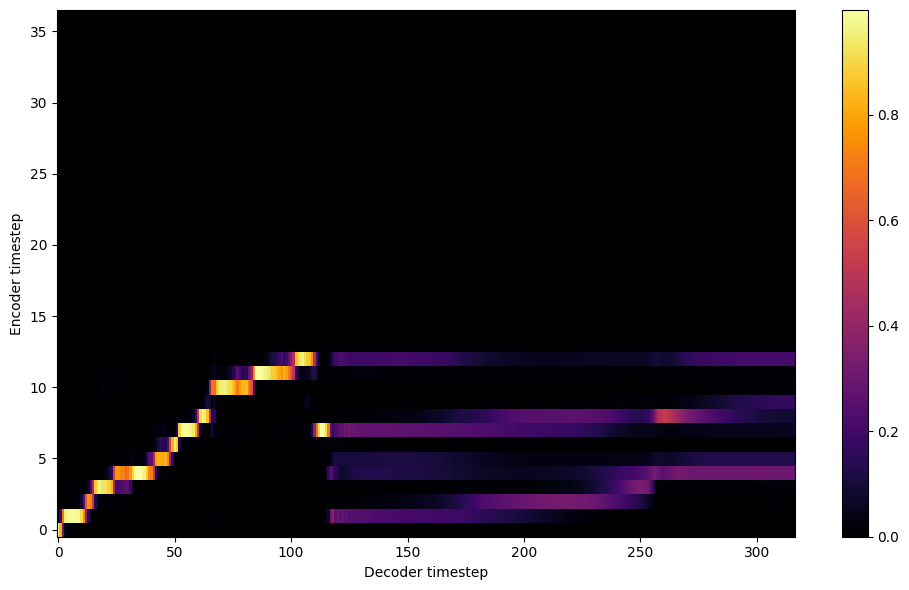

Saving model and optimizer state at iteration 3200 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 200 Iteration: 3200


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 200 Validation loss 3216:  0.082246  Time: 0.4m LR: 0.000300


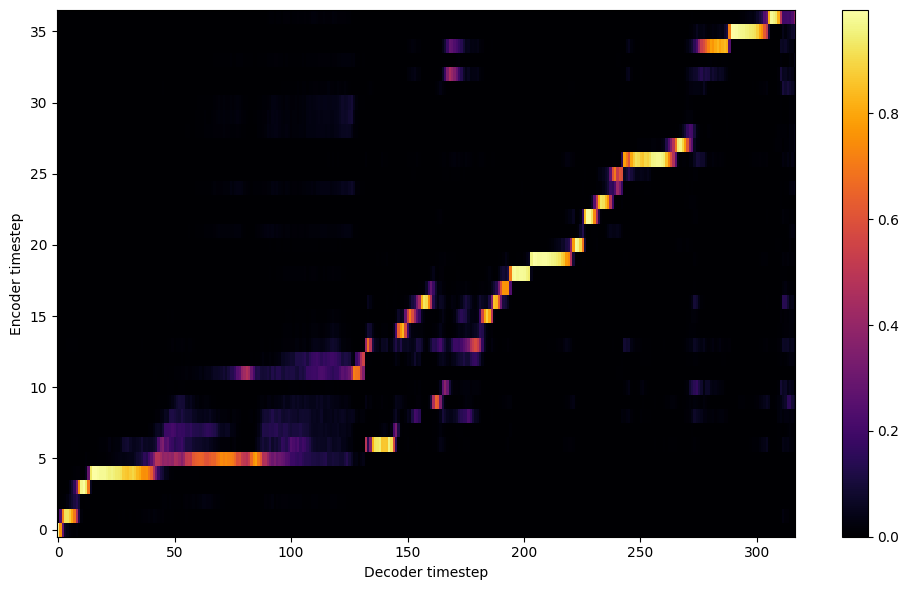


Starting Epoch: 201 Iteration: 3216


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 201 Validation loss 3232:  0.080437  Time: 0.4m LR: 0.000300


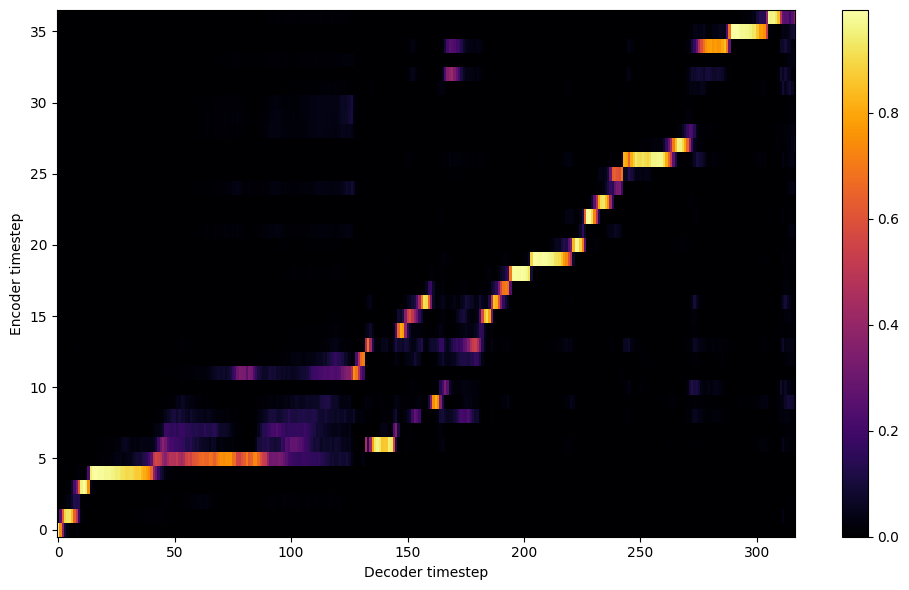


Starting Epoch: 202 Iteration: 3232


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 202 Validation loss 3248:  0.081021  Time: 0.3m LR: 0.000300


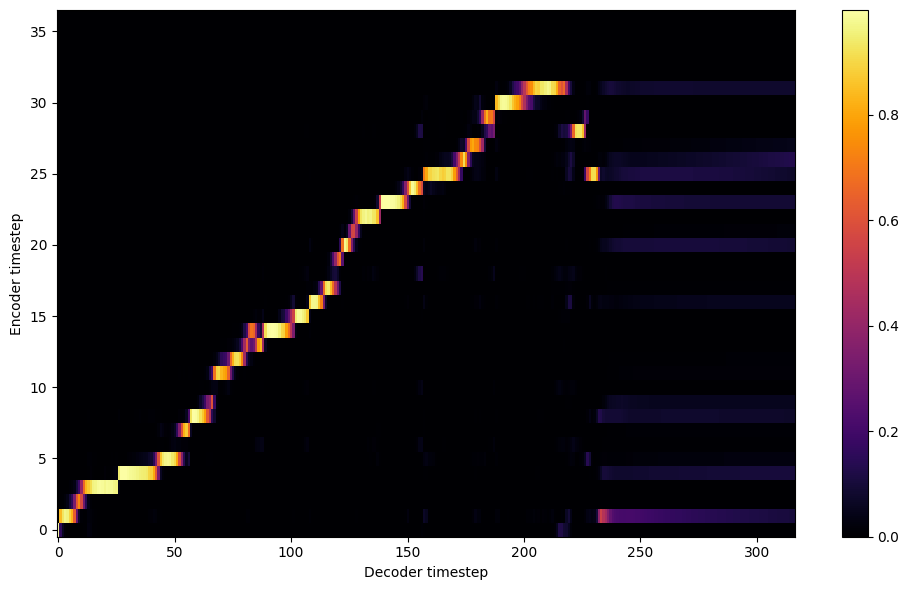


Starting Epoch: 203 Iteration: 3248


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 203 Validation loss 3264:  0.080402  Time: 0.3m LR: 0.000300


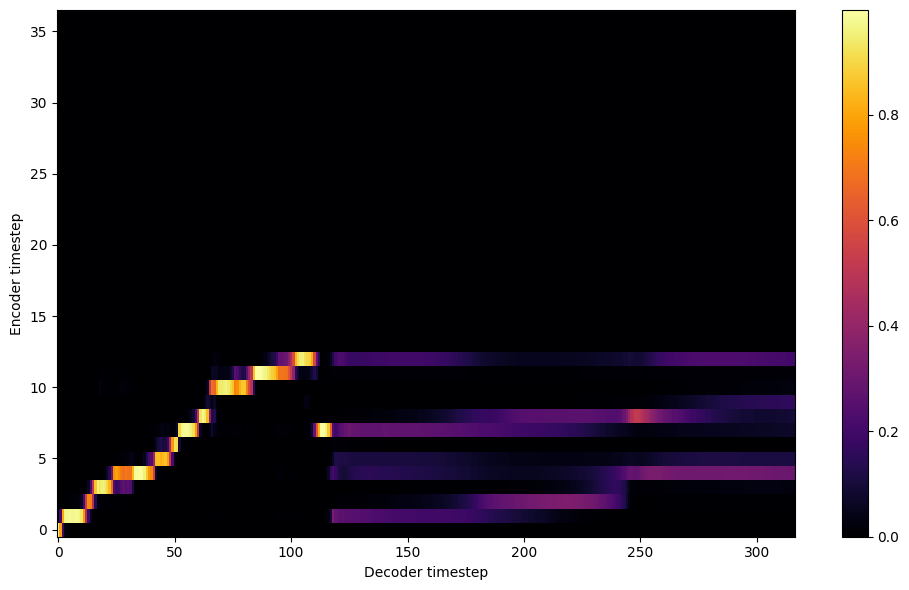


Starting Epoch: 204 Iteration: 3264


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 204 Validation loss 3280:  0.081547  Time: 0.3m LR: 0.000300


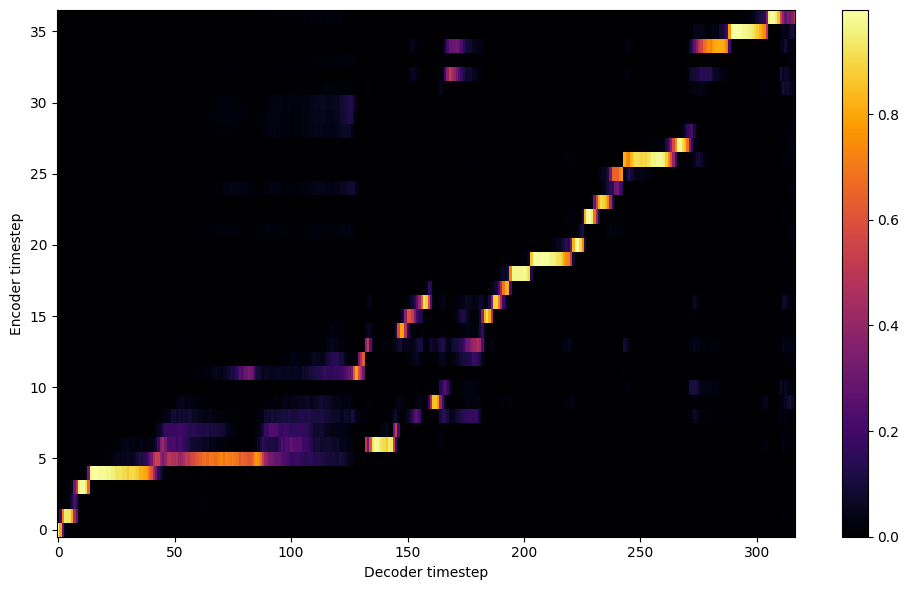


Starting Epoch: 205 Iteration: 3280


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 205 Validation loss 3296:  0.080745  Time: 0.3m LR: 0.000300


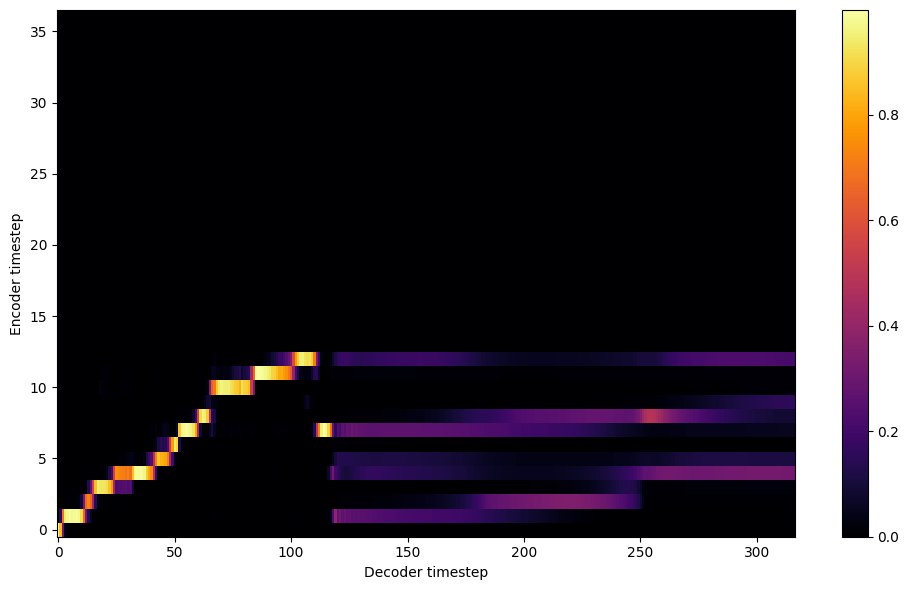


Starting Epoch: 206 Iteration: 3296


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 206 Validation loss 3312:  0.079115  Time: 0.3m LR: 0.000300


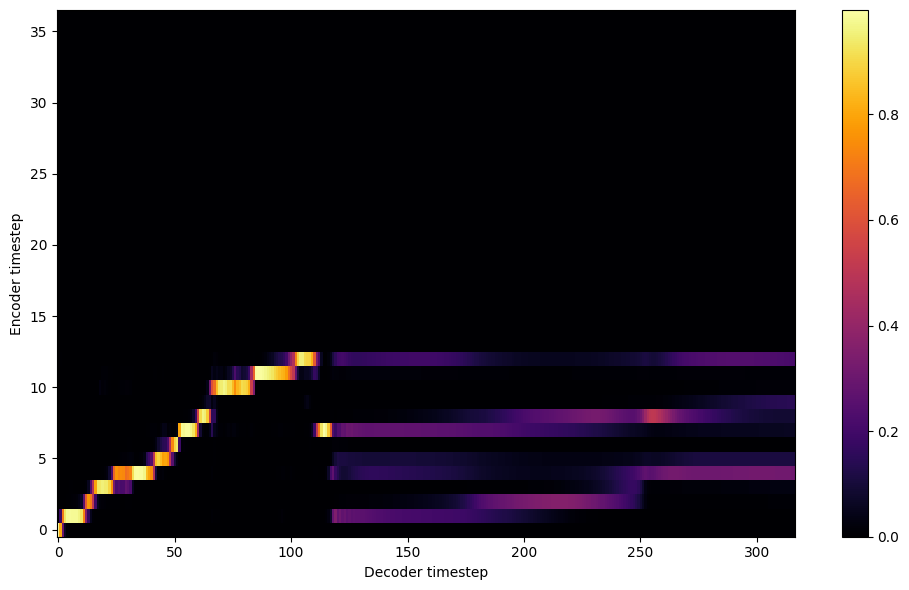


Starting Epoch: 207 Iteration: 3312


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 207 Validation loss 3328:  0.079345  Time: 0.3m LR: 0.000300


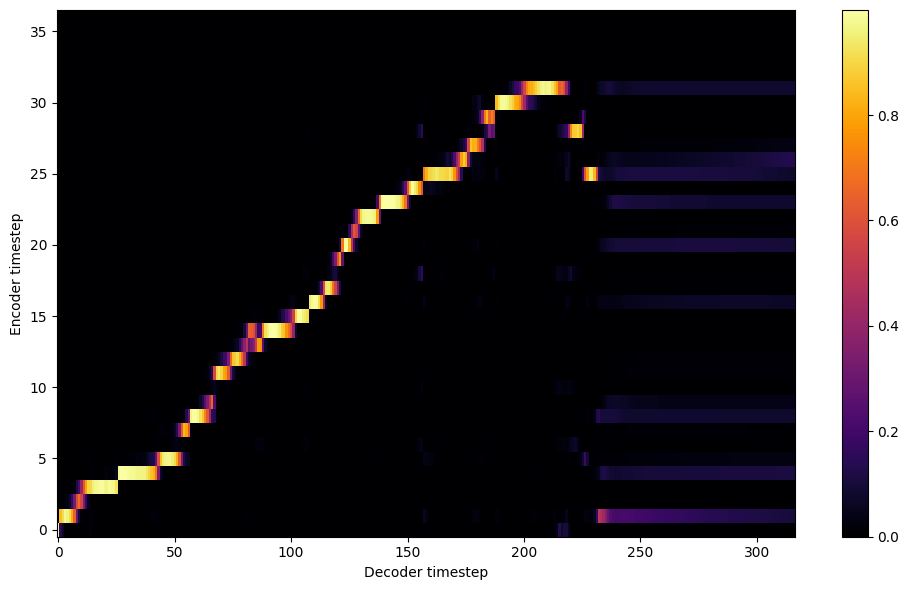


Starting Epoch: 208 Iteration: 3328


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 208 Validation loss 3344:  0.080428  Time: 0.4m LR: 0.000300


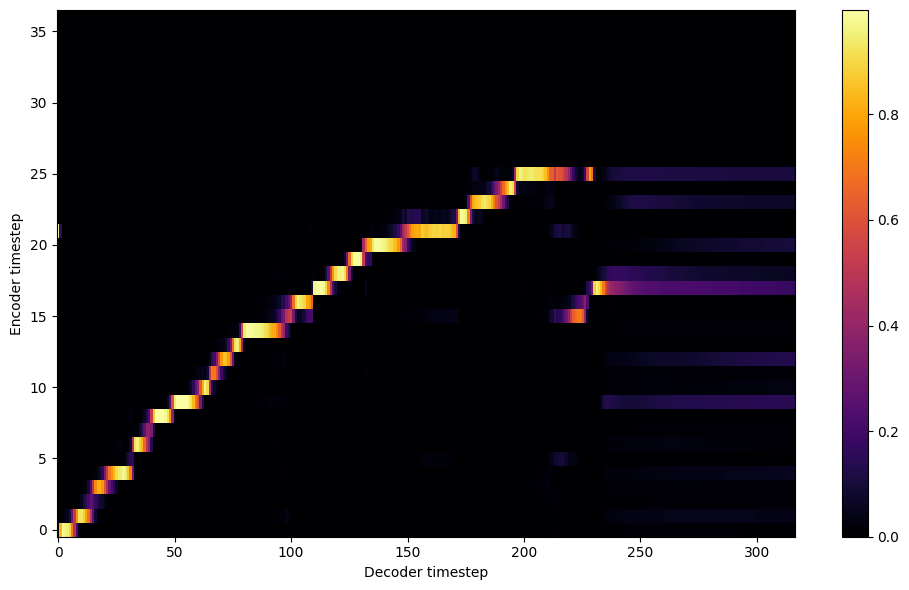


Starting Epoch: 209 Iteration: 3344


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 209 Validation loss 3360:  0.082010  Time: 0.3m LR: 0.000300


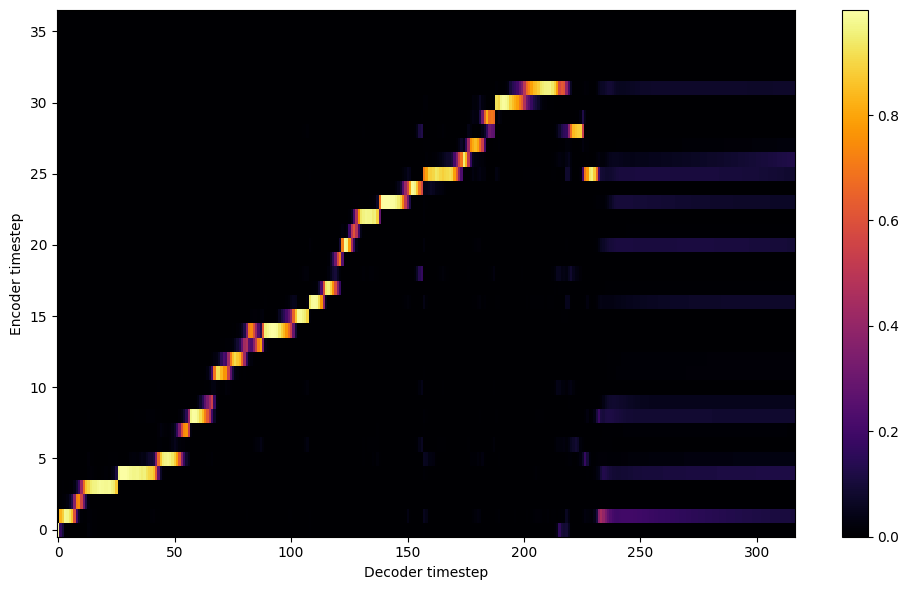

Saving model and optimizer state at iteration 3360 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 210 Iteration: 3360


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 210 Validation loss 3376:  0.080765  Time: 0.4m LR: 0.000300


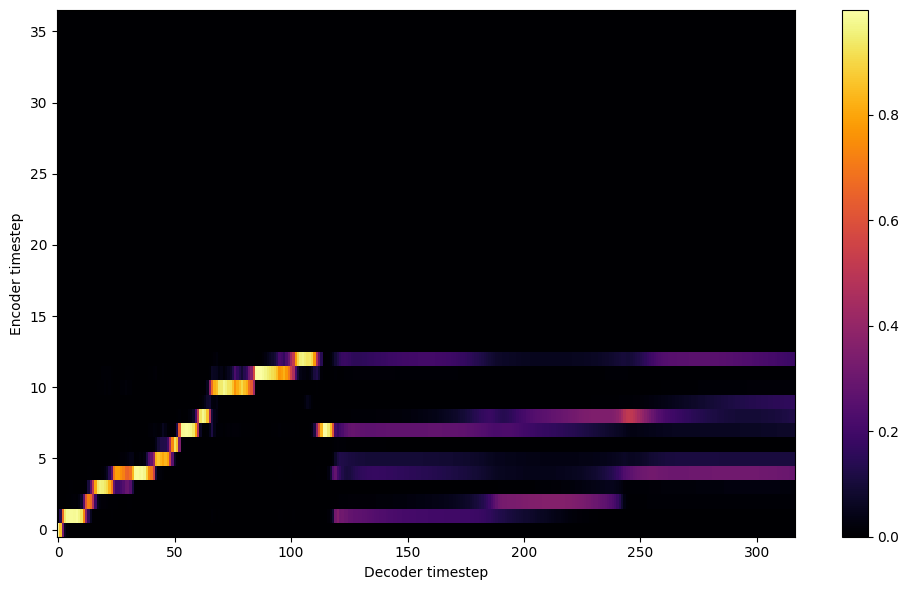


Starting Epoch: 211 Iteration: 3376


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 211 Validation loss 3392:  0.084837  Time: 0.3m LR: 0.000300


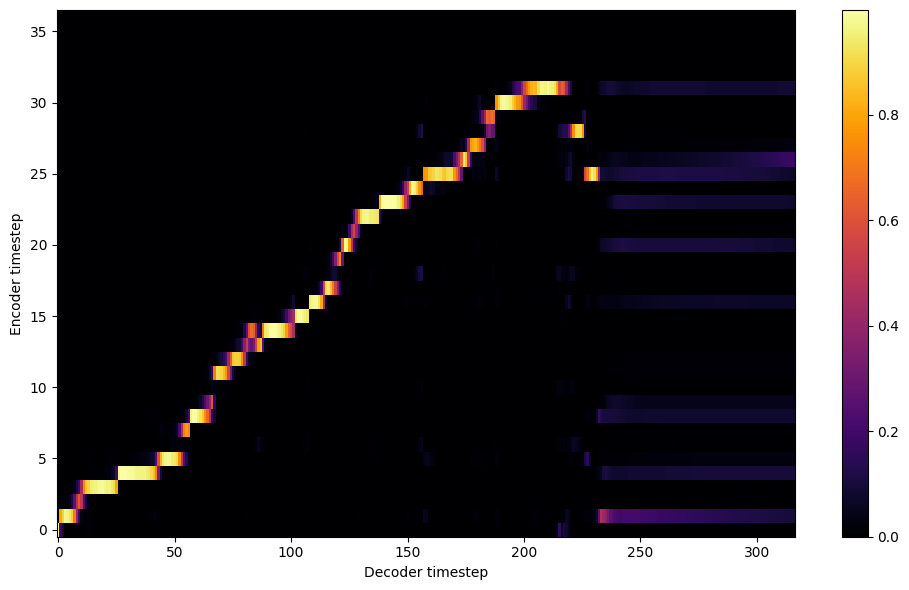


Starting Epoch: 212 Iteration: 3392


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 212 Validation loss 3408:  0.084255  Time: 0.3m LR: 0.000300


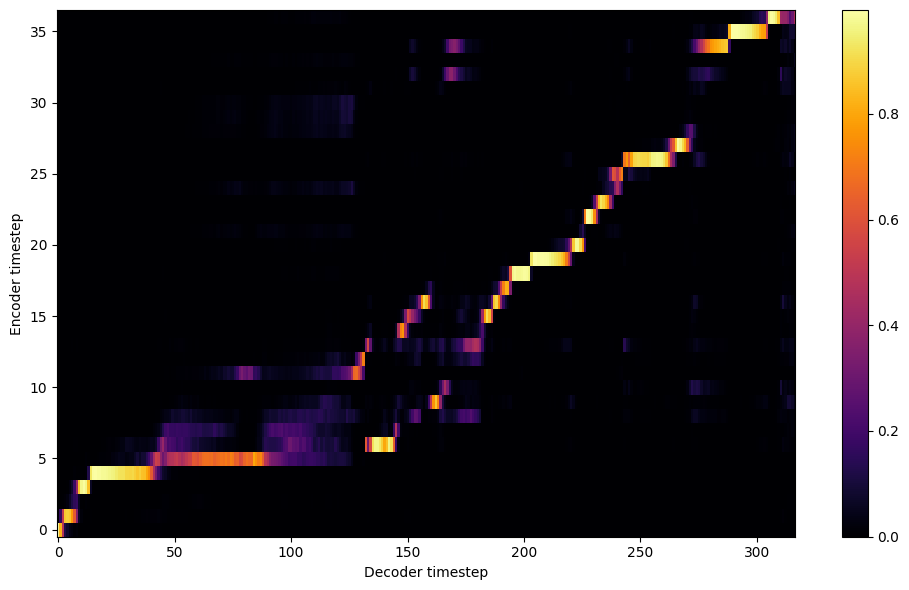


Starting Epoch: 213 Iteration: 3408


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 213 Validation loss 3424:  0.084498  Time: 0.4m LR: 0.000300


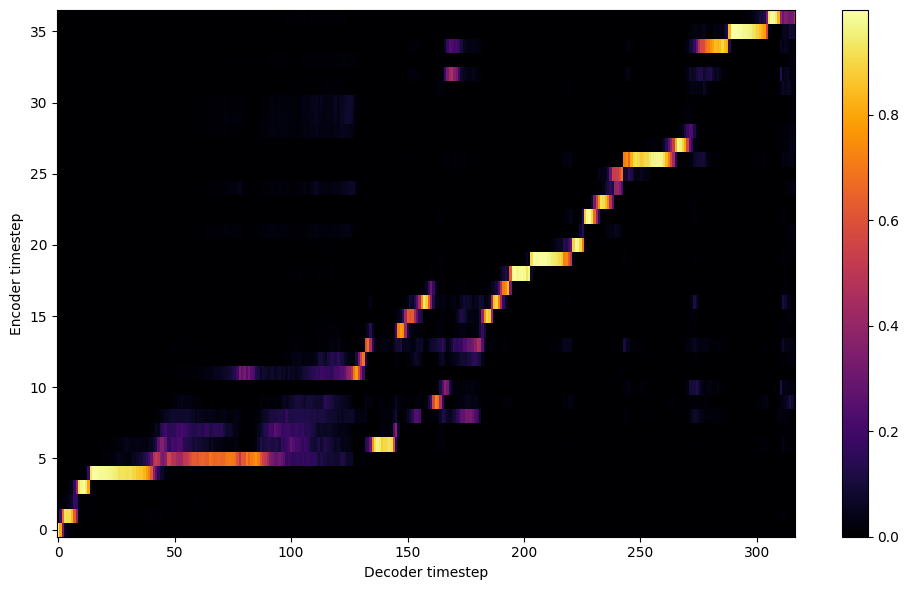


Starting Epoch: 214 Iteration: 3424


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 214 Validation loss 3440:  0.085695  Time: 0.3m LR: 0.000300


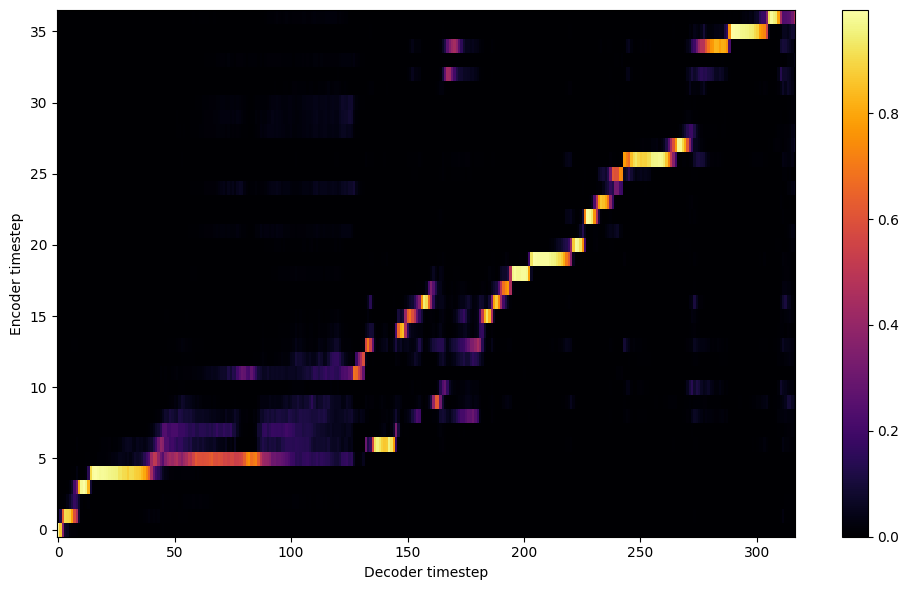


Starting Epoch: 215 Iteration: 3440


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 215 Validation loss 3456:  0.083104  Time: 0.4m LR: 0.000300


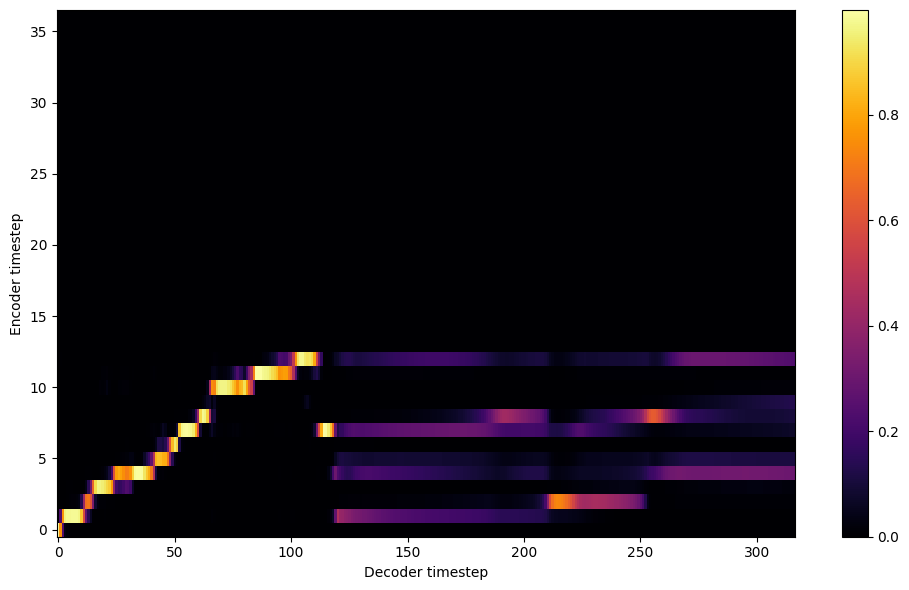


Starting Epoch: 216 Iteration: 3456


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 216 Validation loss 3472:  0.085653  Time: 0.3m LR: 0.000300


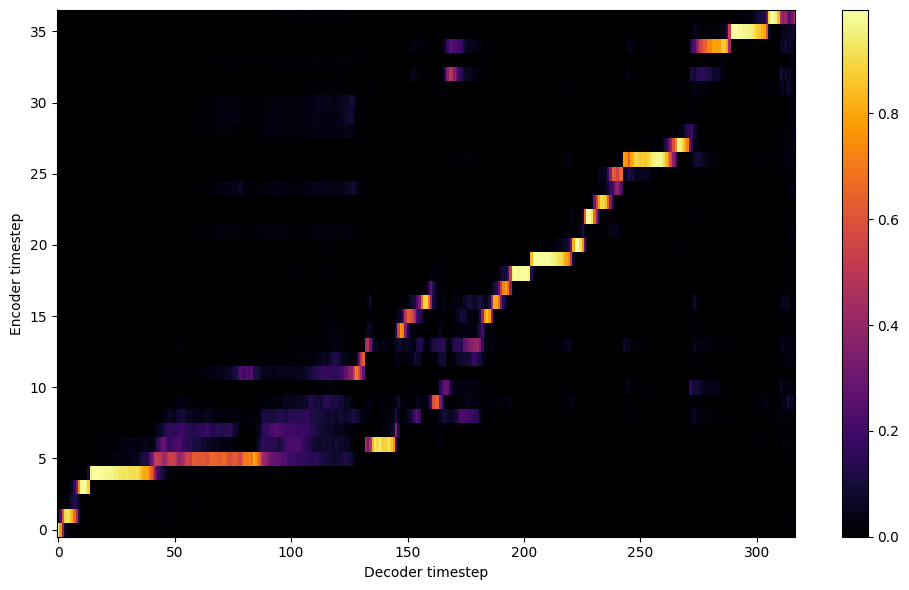


Starting Epoch: 217 Iteration: 3472


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 217 Validation loss 3488:  0.087003  Time: 0.3m LR: 0.000300


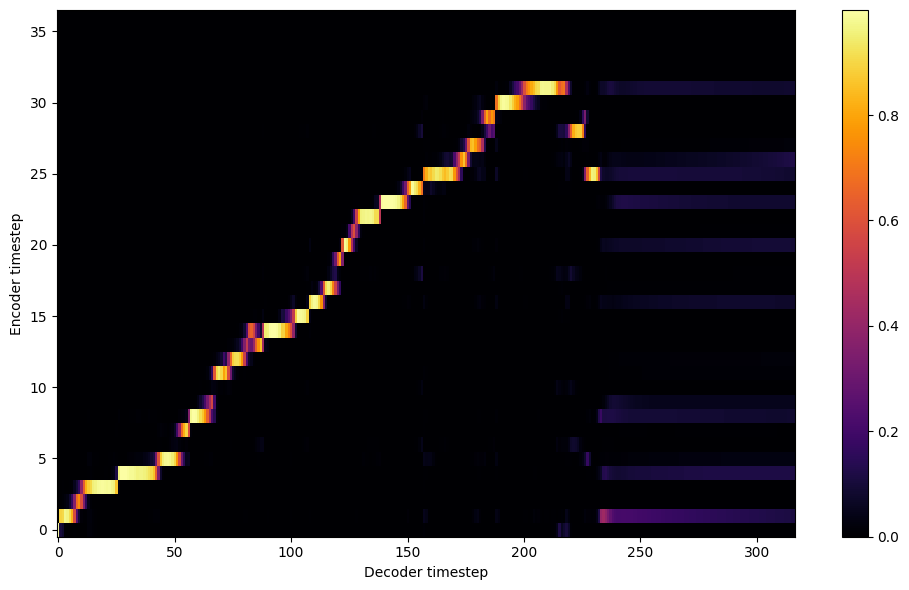


Starting Epoch: 218 Iteration: 3488


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 218 Validation loss 3504:  0.085268  Time: 0.4m LR: 0.000300


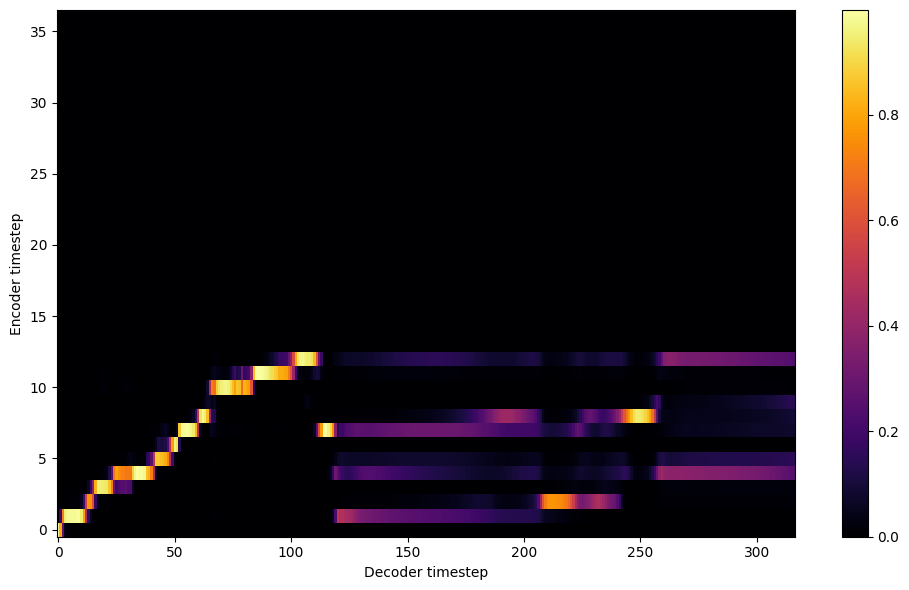


Starting Epoch: 219 Iteration: 3504


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 219 Validation loss 3520:  0.085857  Time: 0.3m LR: 0.000300


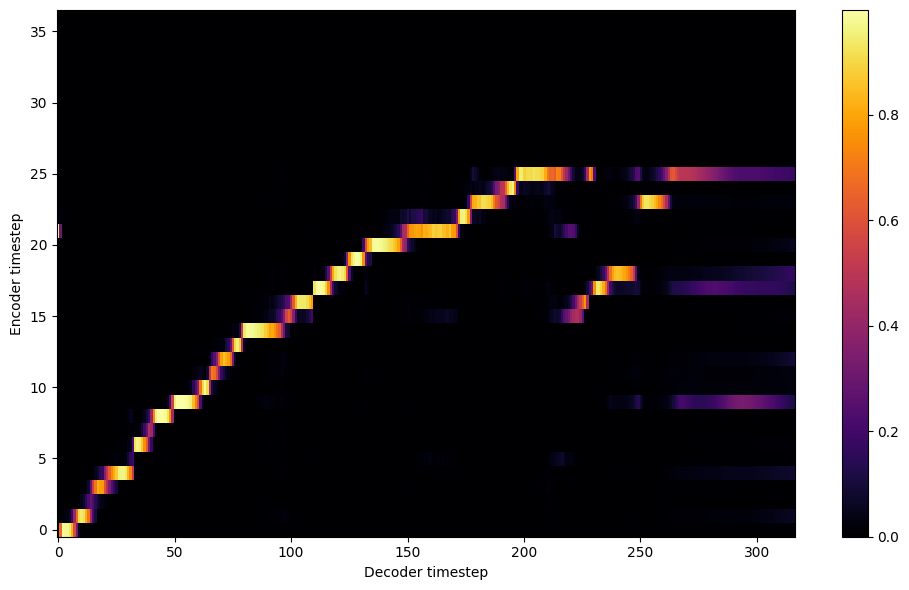

Saving model and optimizer state at iteration 3520 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 220 Iteration: 3520


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 220 Validation loss 3536:  0.081382  Time: 0.4m LR: 0.000300


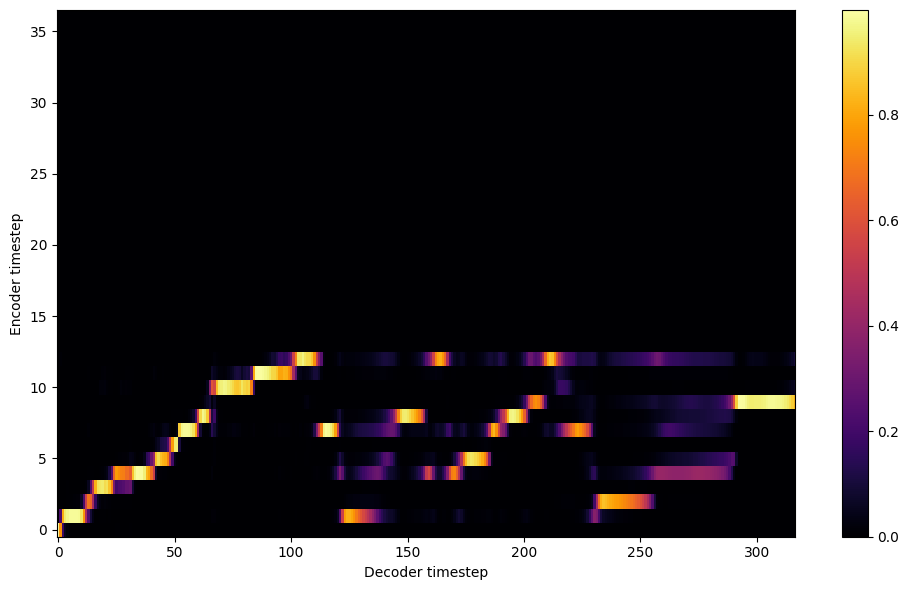


Starting Epoch: 221 Iteration: 3536


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 221 Validation loss 3552:  0.083068  Time: 0.4m LR: 0.000300


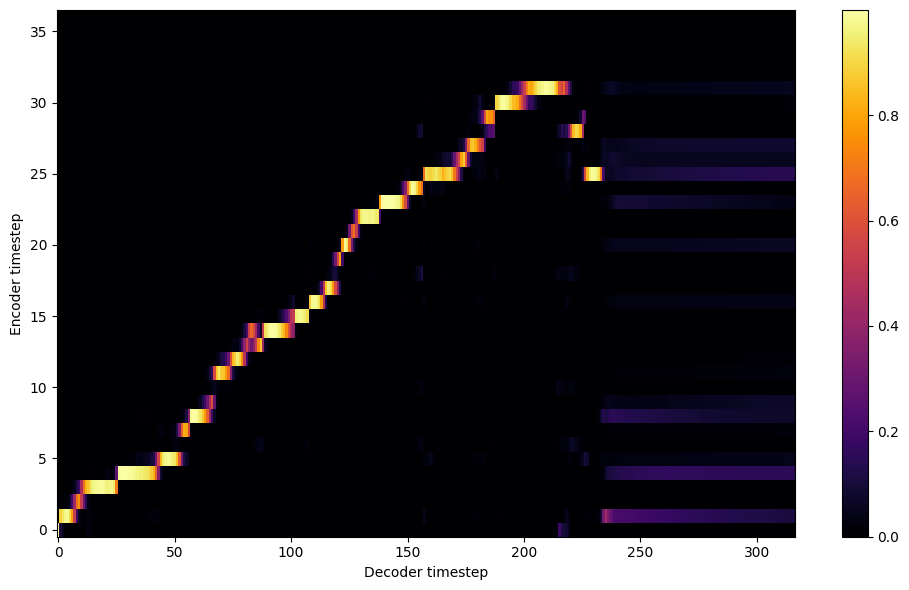


Starting Epoch: 222 Iteration: 3552


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 222 Validation loss 3568:  0.086006  Time: 0.3m LR: 0.000300


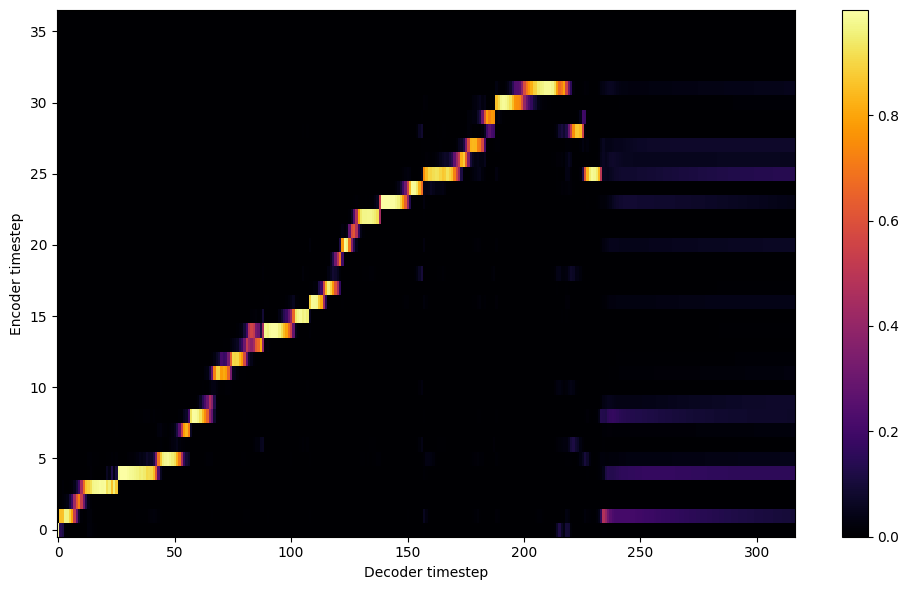


Starting Epoch: 223 Iteration: 3568


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 223 Validation loss 3584:  0.083692  Time: 0.4m LR: 0.000300


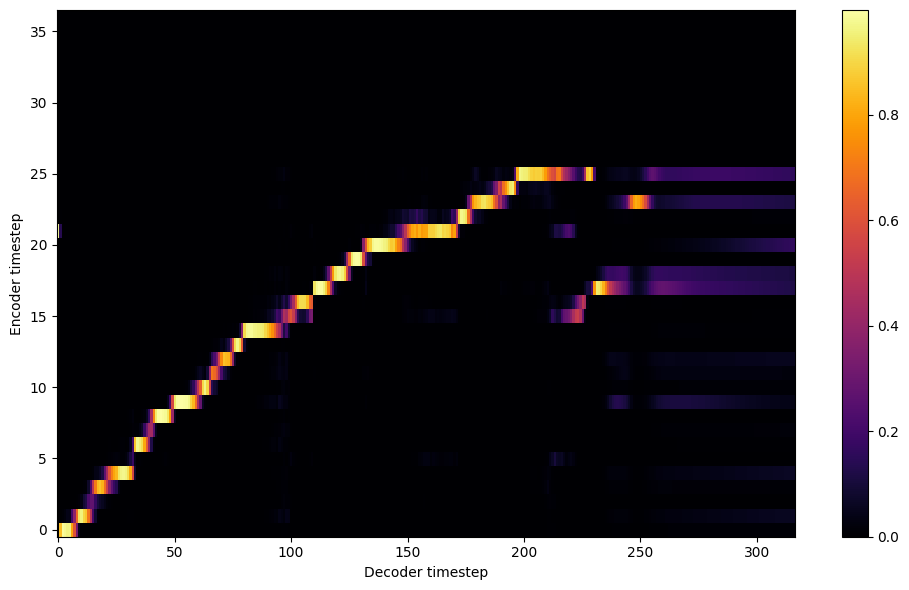


Starting Epoch: 224 Iteration: 3584


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 224 Validation loss 3600:  0.085601  Time: 0.3m LR: 0.000300


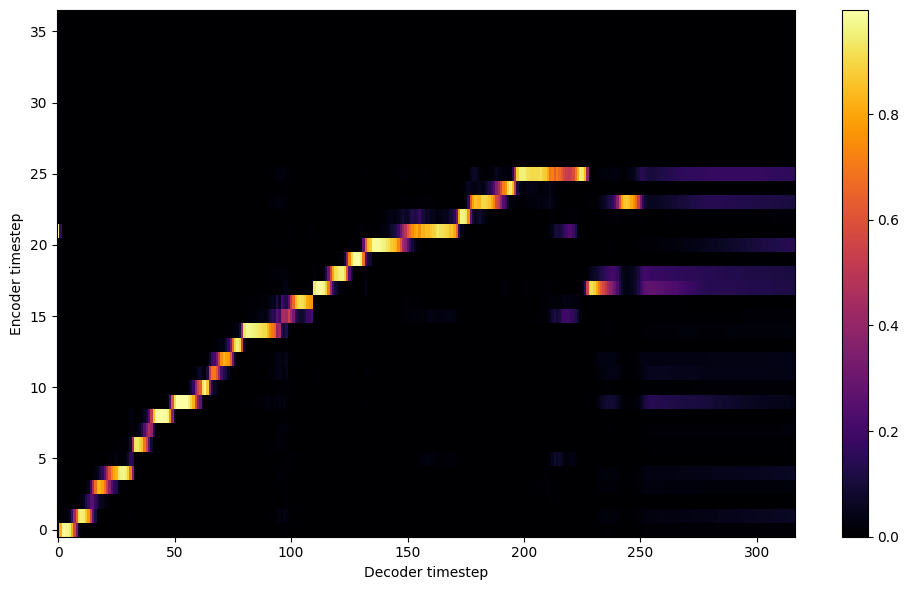


Starting Epoch: 225 Iteration: 3600


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 225 Validation loss 3616:  0.082204  Time: 0.3m LR: 0.000300


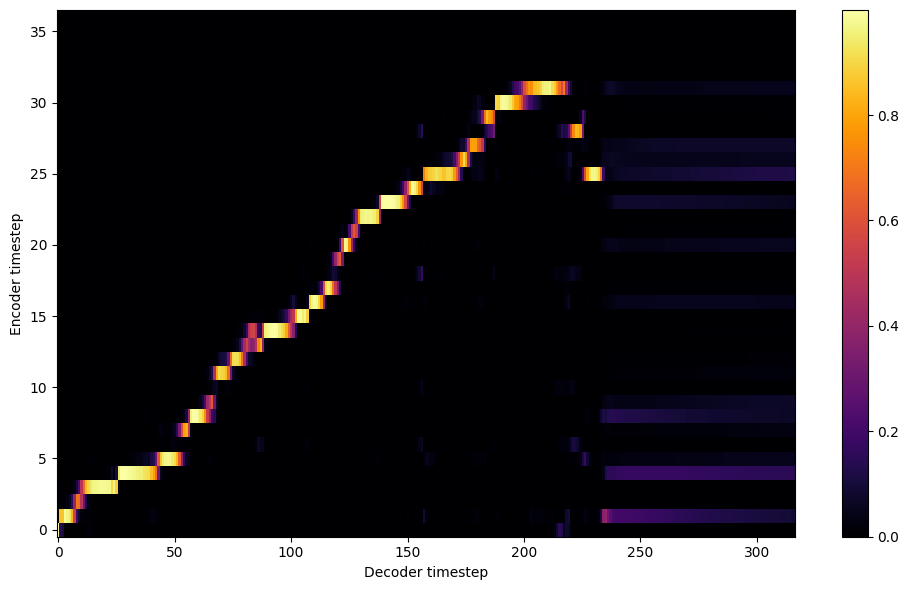


Starting Epoch: 226 Iteration: 3616


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 226 Validation loss 3632:  0.082043  Time: 0.3m LR: 0.000300


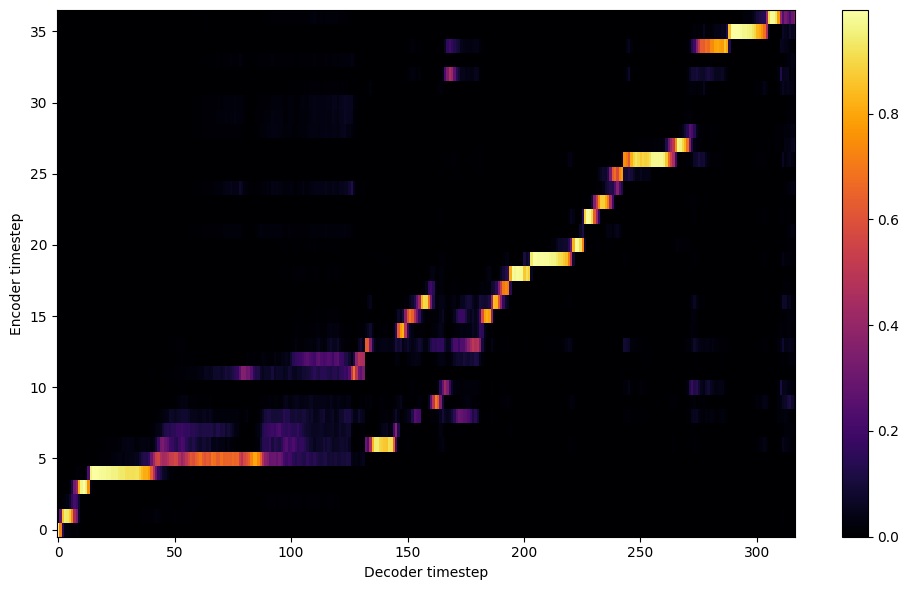


Starting Epoch: 227 Iteration: 3632


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 227 Validation loss 3648:  0.080614  Time: 0.3m LR: 0.000300


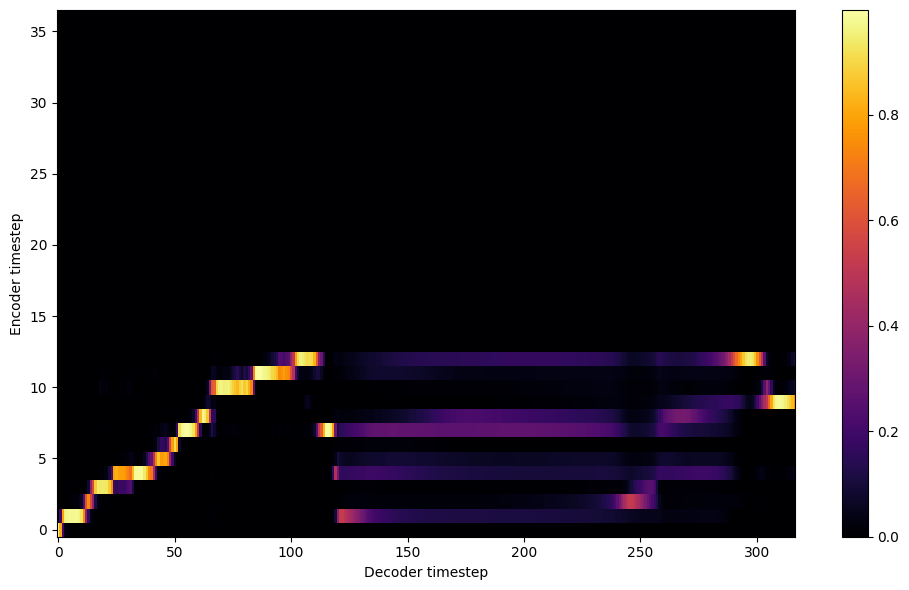


Starting Epoch: 228 Iteration: 3648


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 228 Validation loss 3664:  0.079889  Time: 0.4m LR: 0.000300


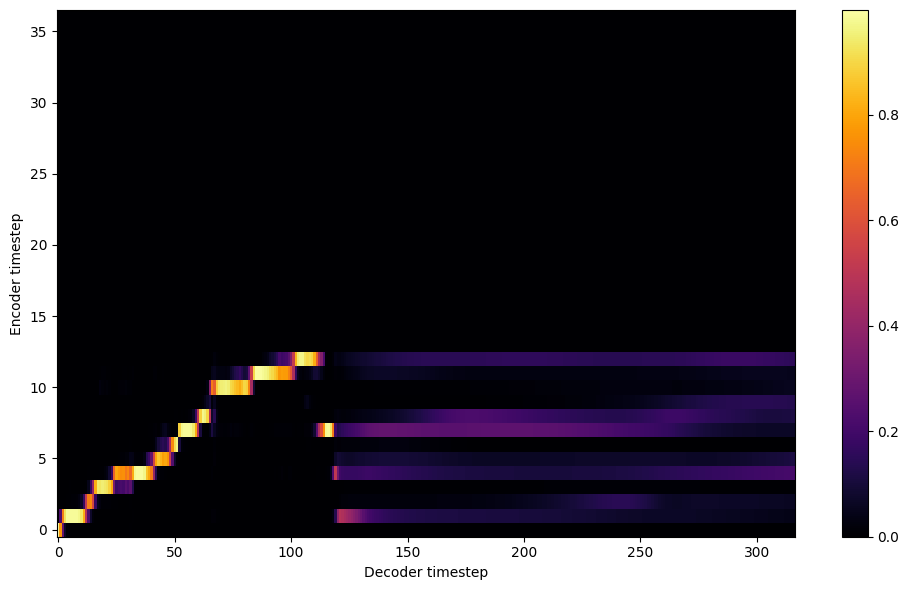


Starting Epoch: 229 Iteration: 3664


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 229 Validation loss 3680:  0.077322  Time: 0.3m LR: 0.000300


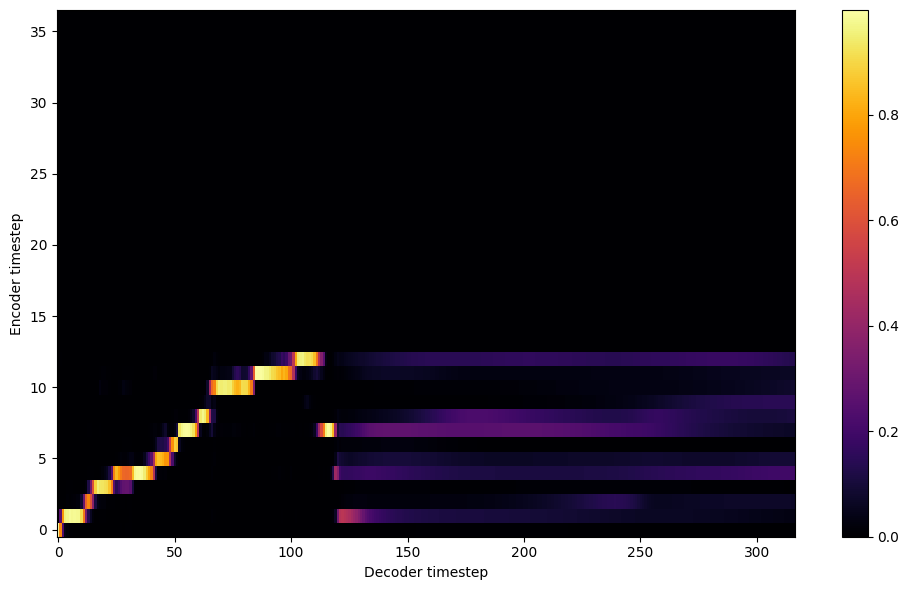

Saving model and optimizer state at iteration 3680 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 230 Iteration: 3680


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 230 Validation loss 3696:  0.077404  Time: 0.4m LR: 0.000300


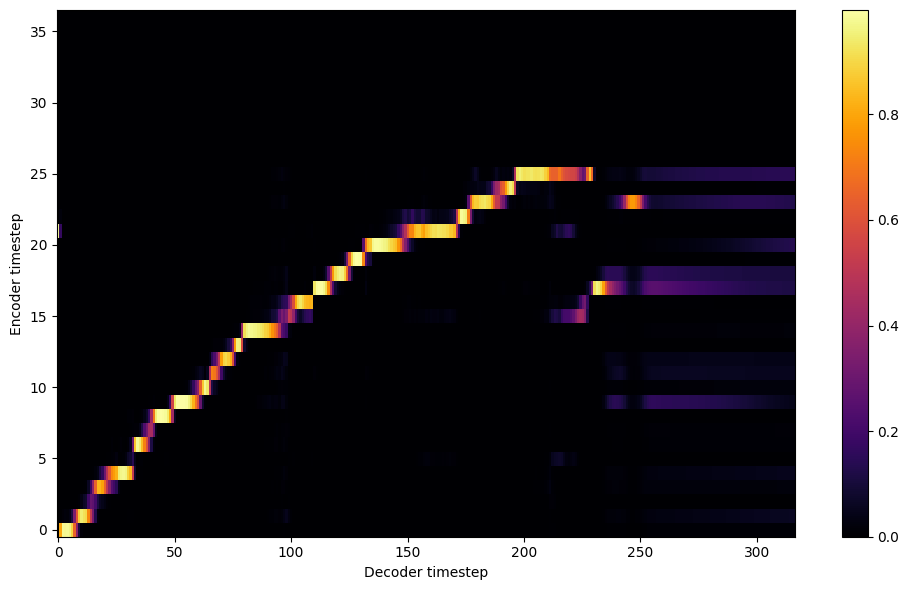


Starting Epoch: 231 Iteration: 3696


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 231 Validation loss 3712:  0.076100  Time: 0.3m LR: 0.000300


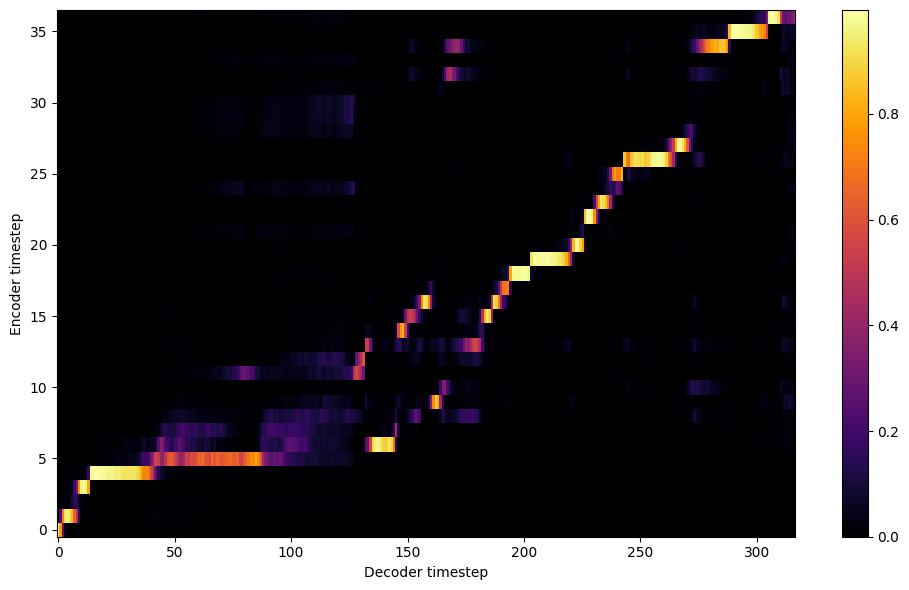


Starting Epoch: 232 Iteration: 3712


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 232 Validation loss 3728:  0.075339  Time: 0.3m LR: 0.000300


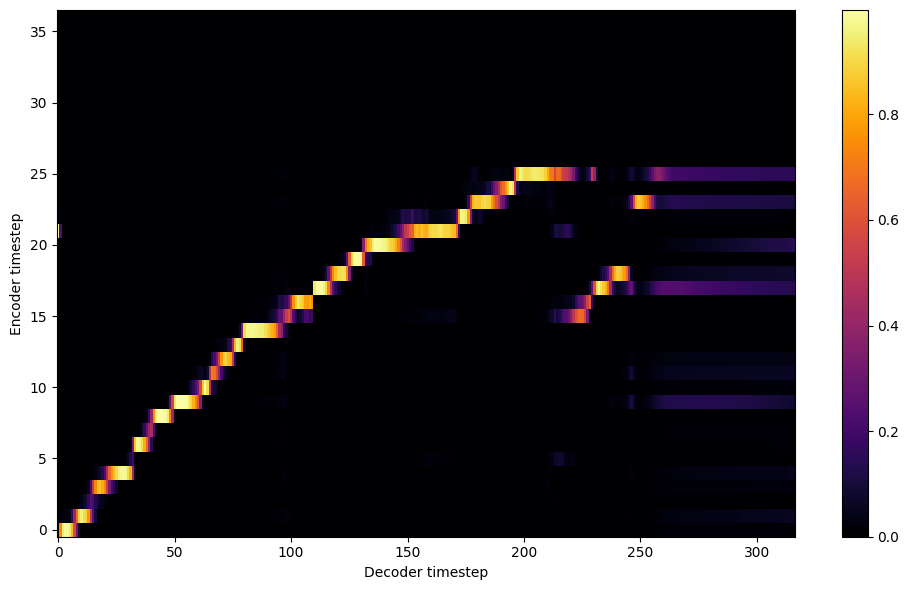


Starting Epoch: 233 Iteration: 3728


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 233 Validation loss 3744:  0.075536  Time: 0.4m LR: 0.000300


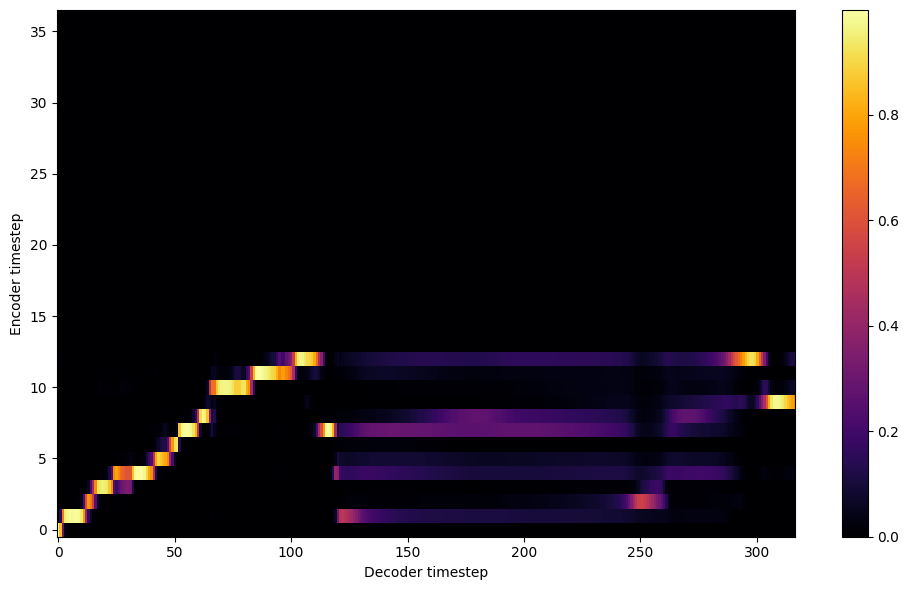


Starting Epoch: 234 Iteration: 3744


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 234 Validation loss 3760:  0.076448  Time: 0.4m LR: 0.000300


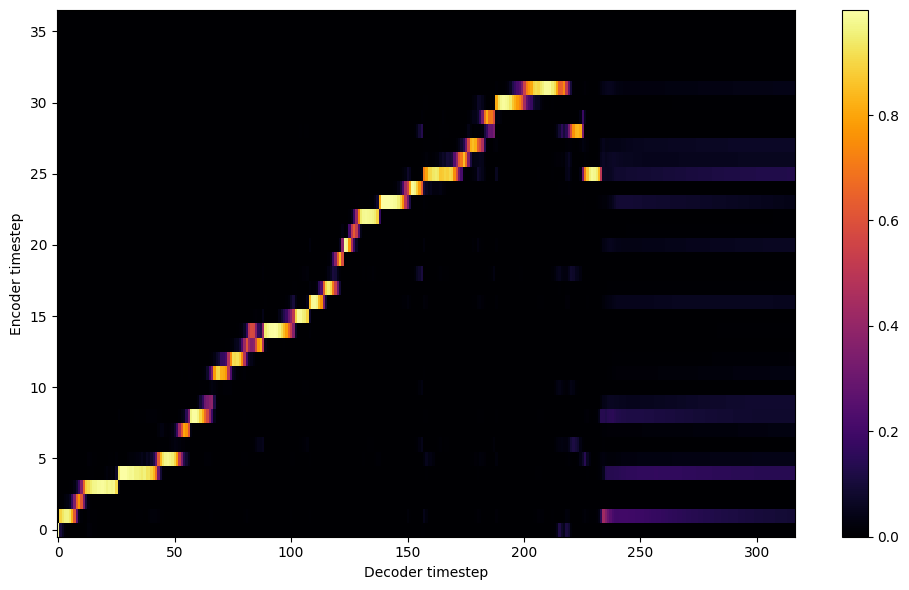


Starting Epoch: 235 Iteration: 3760


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 235 Validation loss 3776:  0.076040  Time: 0.4m LR: 0.000300


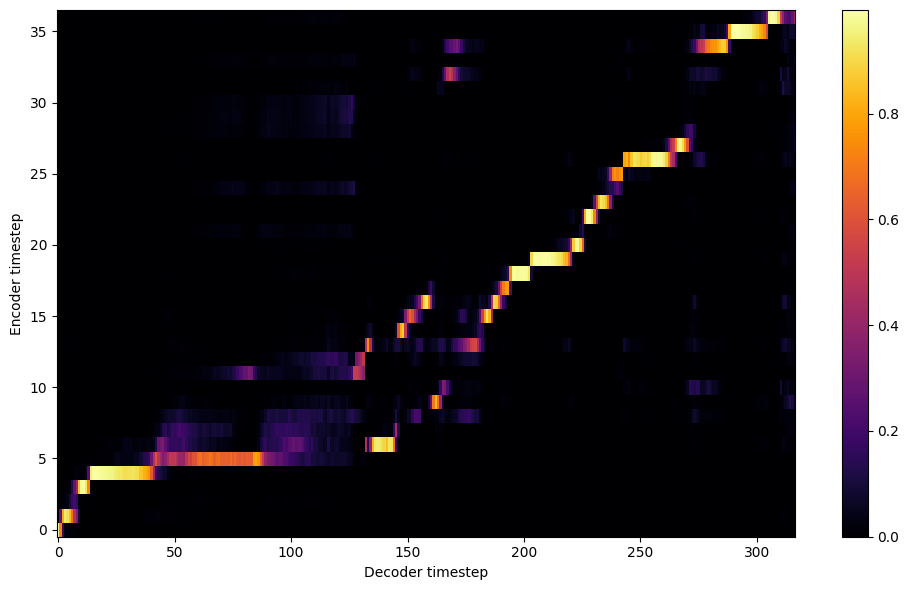


Starting Epoch: 236 Iteration: 3776


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 236 Validation loss 3792:  0.073794  Time: 0.3m LR: 0.000300


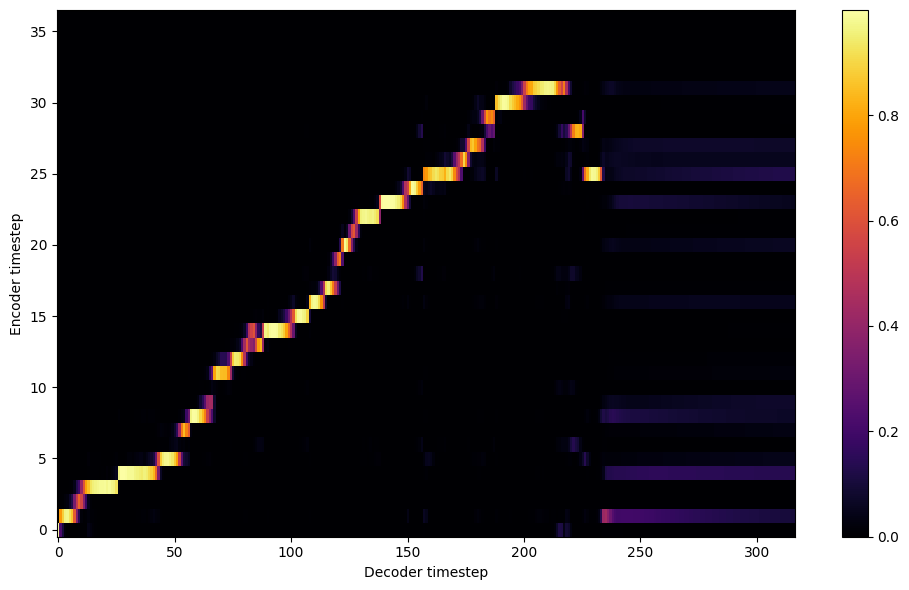


Starting Epoch: 237 Iteration: 3792


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 237 Validation loss 3808:  0.075437  Time: 0.3m LR: 0.000300


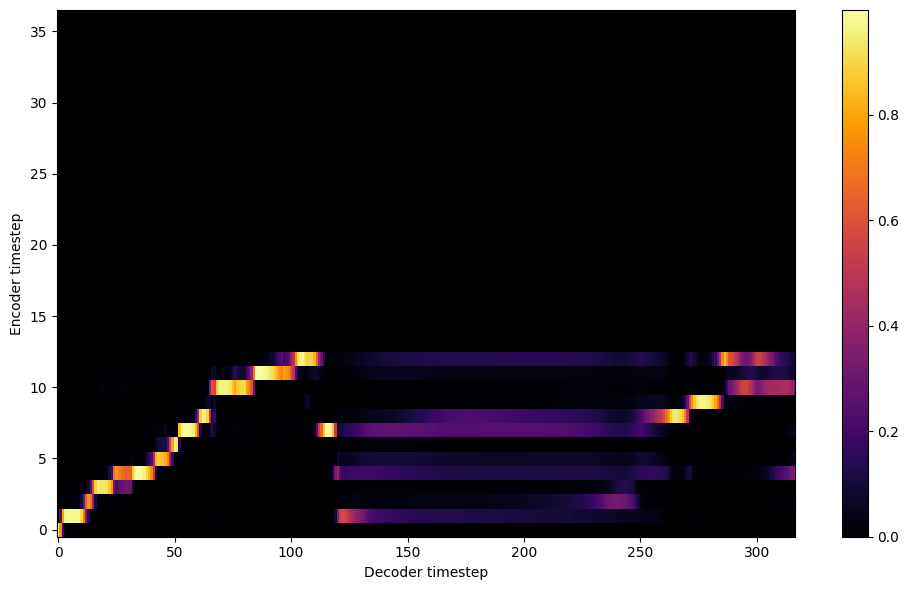


Starting Epoch: 238 Iteration: 3808


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 238 Validation loss 3824:  0.076814  Time: 0.3m LR: 0.000300


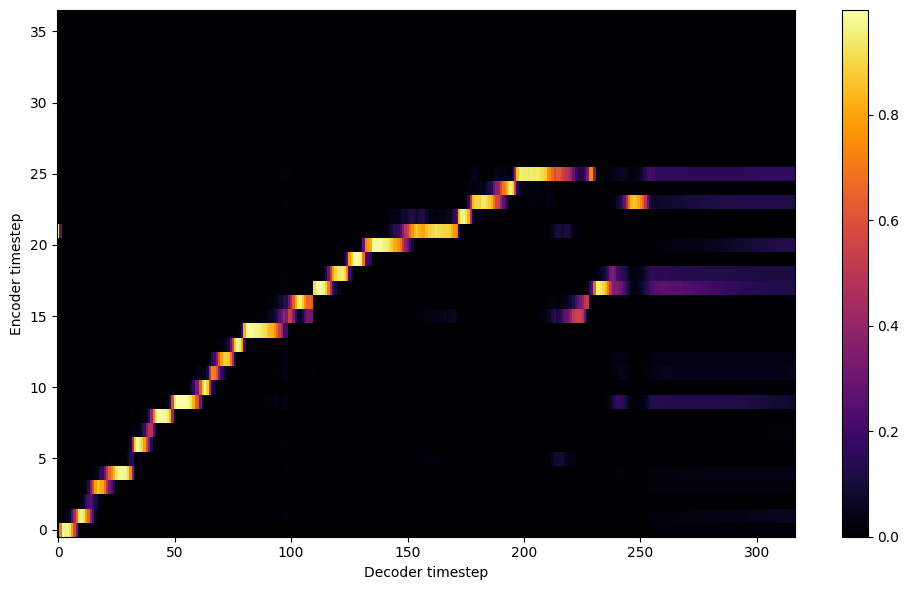


Starting Epoch: 239 Iteration: 3824


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 239 Validation loss 3840:  0.074775  Time: 0.3m LR: 0.000300


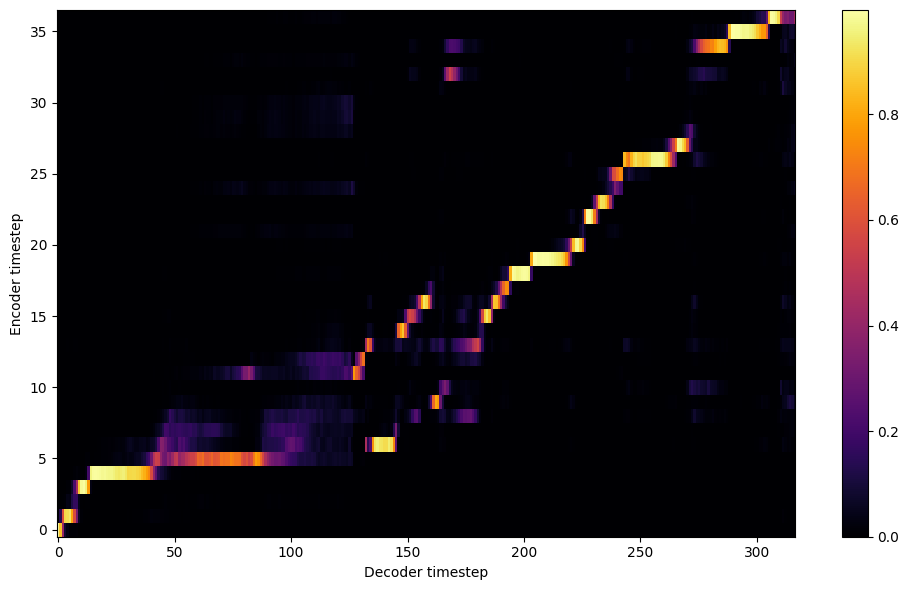

Saving model and optimizer state at iteration 3840 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved

Starting Epoch: 240 Iteration: 3840


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 240 Validation loss 3856:  0.075758  Time: 0.4m LR: 0.000300


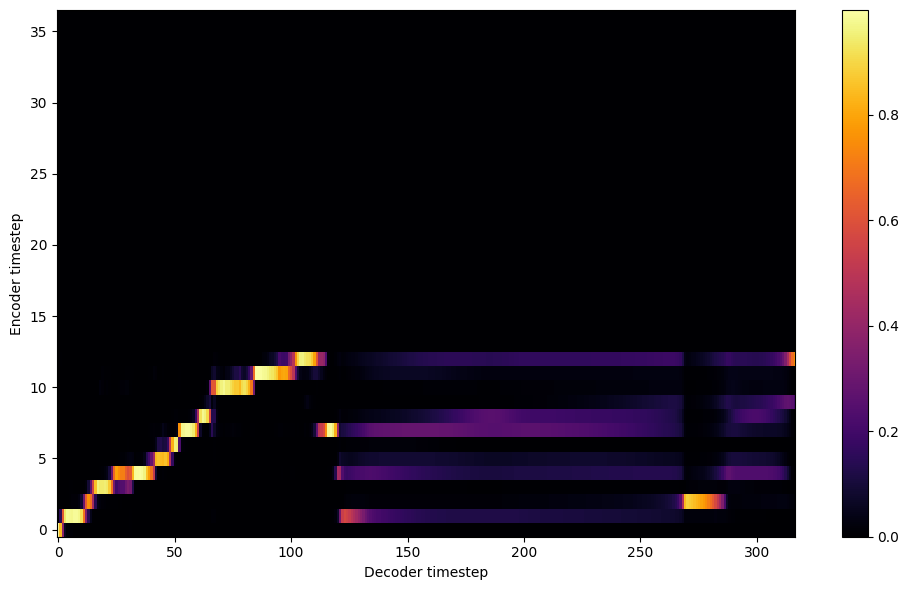


Starting Epoch: 241 Iteration: 3856


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 241 Validation loss 3872:  0.076399  Time: 0.3m LR: 0.000300


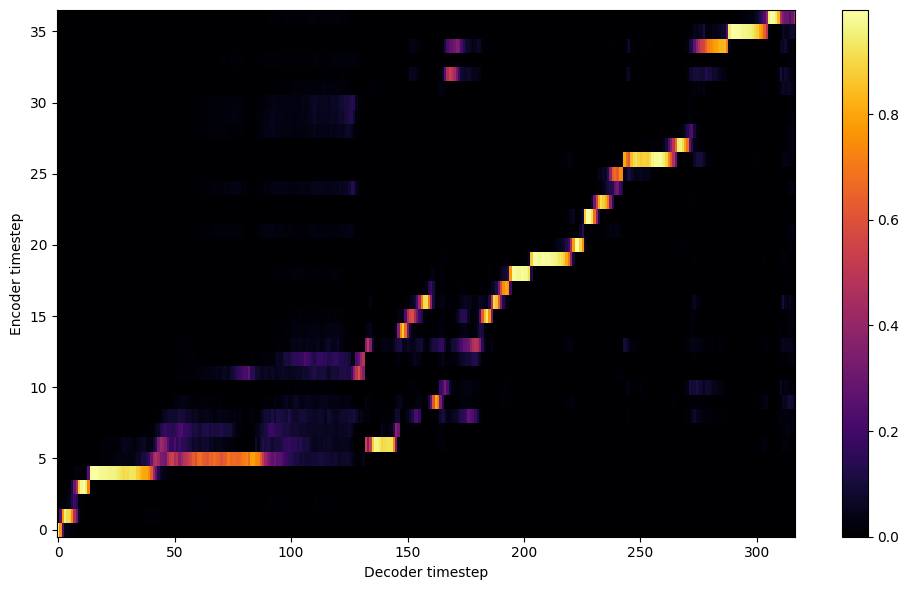


Starting Epoch: 242 Iteration: 3872


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 242 Validation loss 3888:  0.078082  Time: 0.3m LR: 0.000300


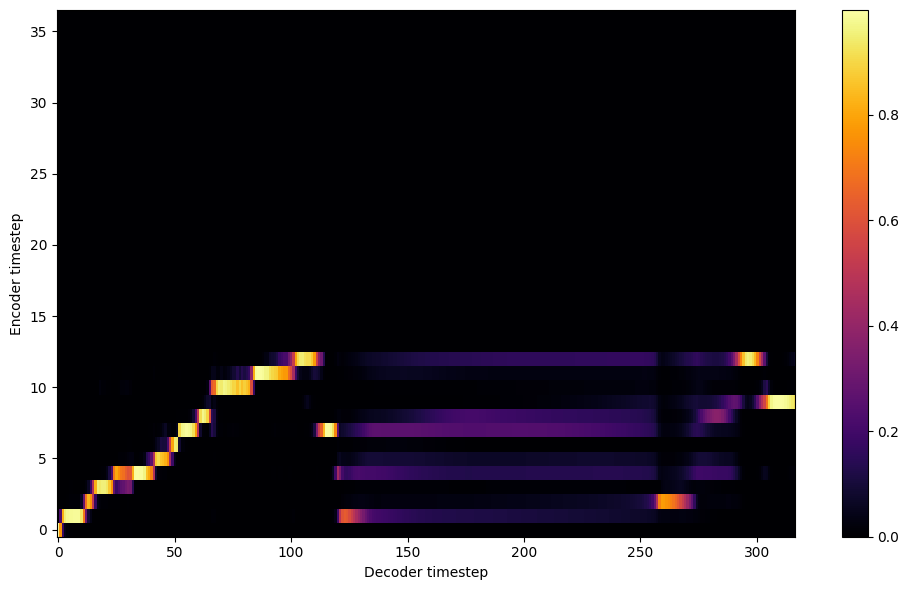


Starting Epoch: 243 Iteration: 3888


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 243 Validation loss 3904:  0.075119  Time: 0.4m LR: 0.000300


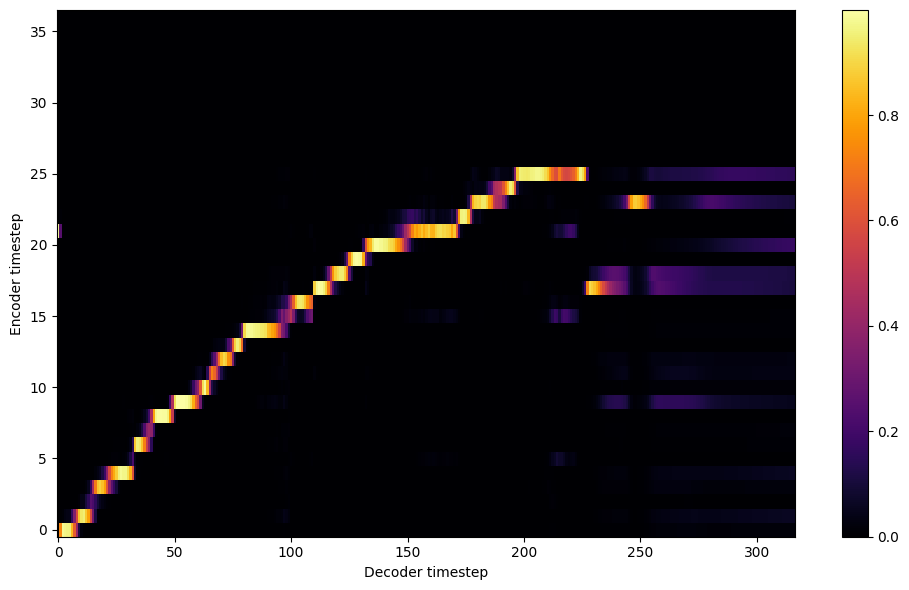


Starting Epoch: 244 Iteration: 3904


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 244 Validation loss 3920:  0.077077  Time: 0.3m LR: 0.000300


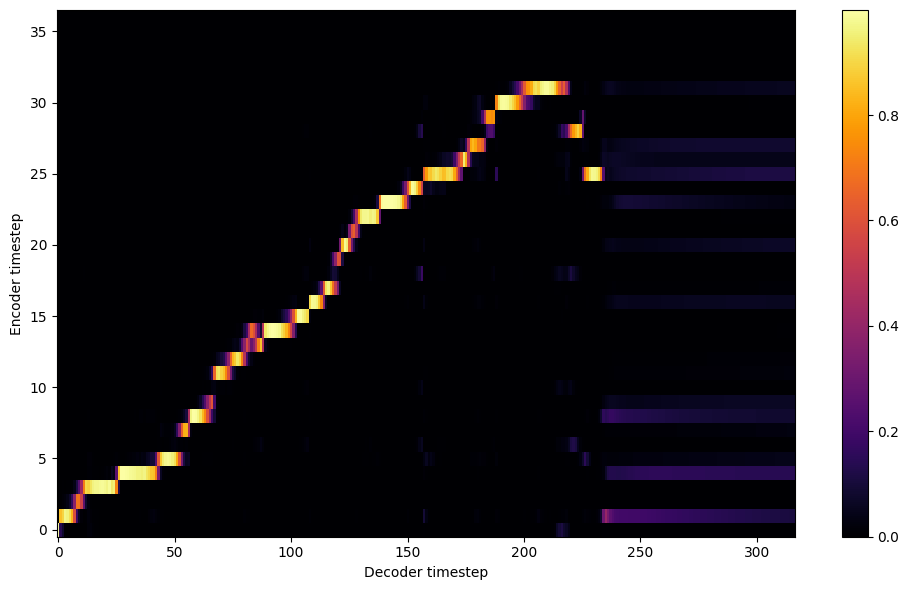


Starting Epoch: 245 Iteration: 3920


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 245 Validation loss 3936:  0.075309  Time: 0.4m LR: 0.000300


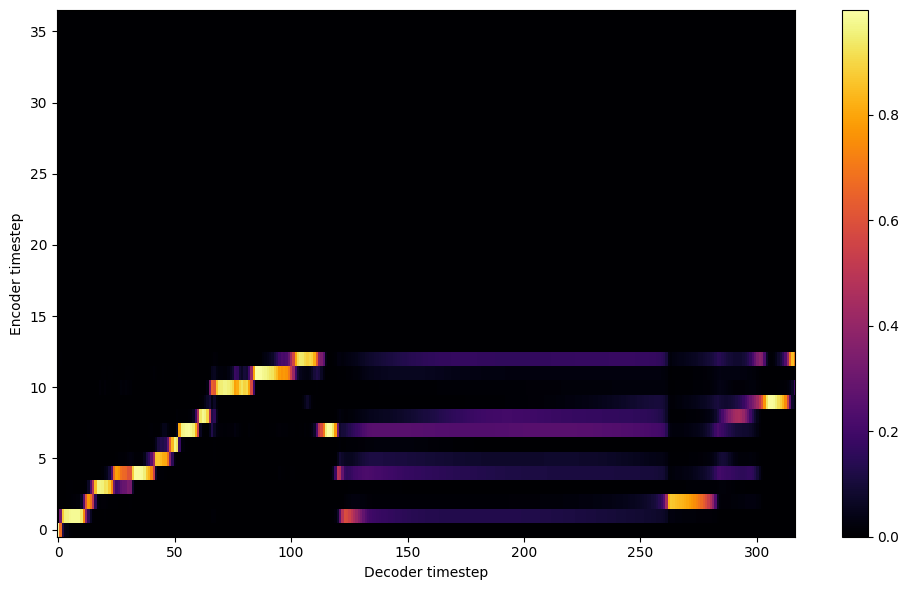


Starting Epoch: 246 Iteration: 3936


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 246 Validation loss 3952:  0.074501  Time: 0.3m LR: 0.000300


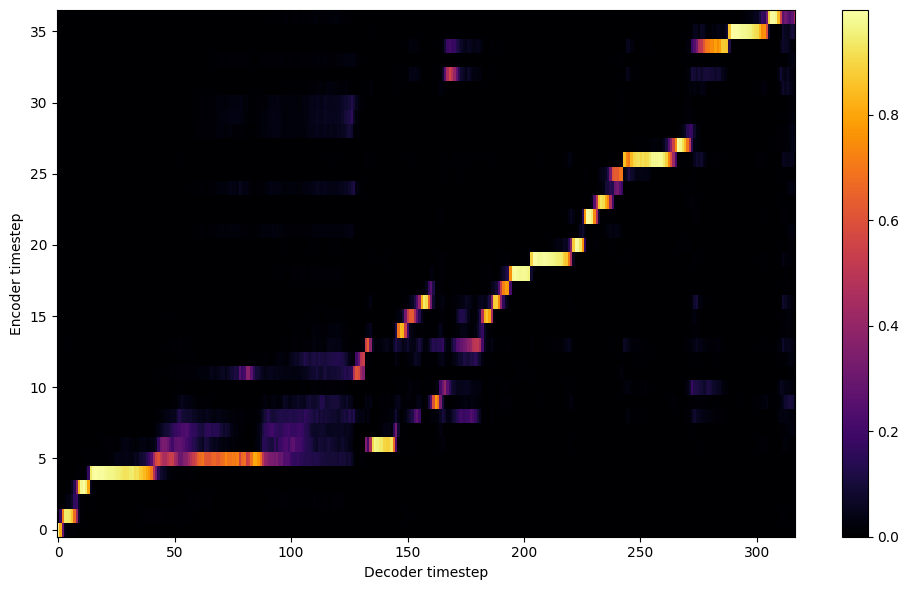


Starting Epoch: 247 Iteration: 3952


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 247 Validation loss 3968:  0.073709  Time: 0.4m LR: 0.000300


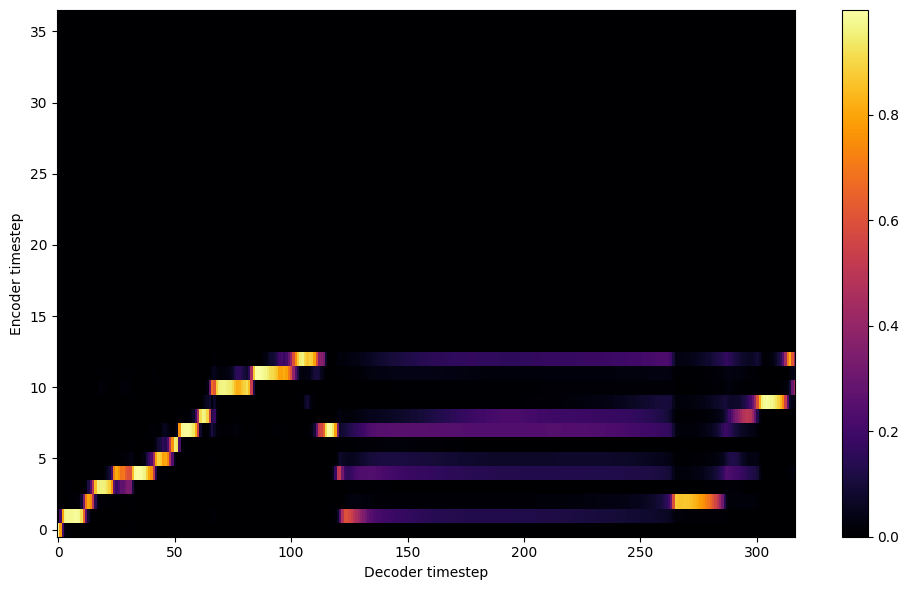


Starting Epoch: 248 Iteration: 3968


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 248 Validation loss 3984:  0.073046  Time: 0.4m LR: 0.000300


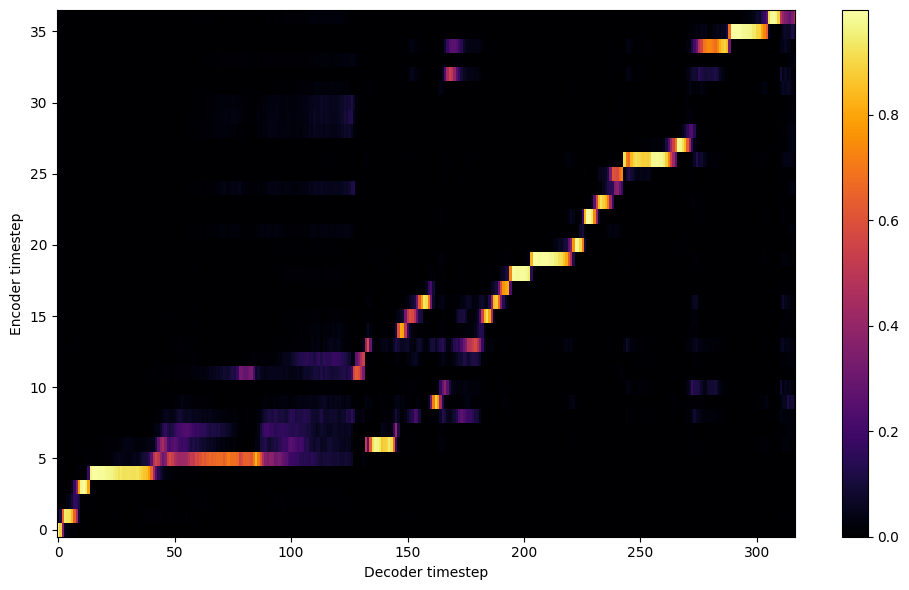


Starting Epoch: 249 Iteration: 3984


  0%|          | 0/16 [00:00<?, ?it/s]

Epoch: 249 Validation loss 4000:  0.074324  Time: 0.3m LR: 0.000300


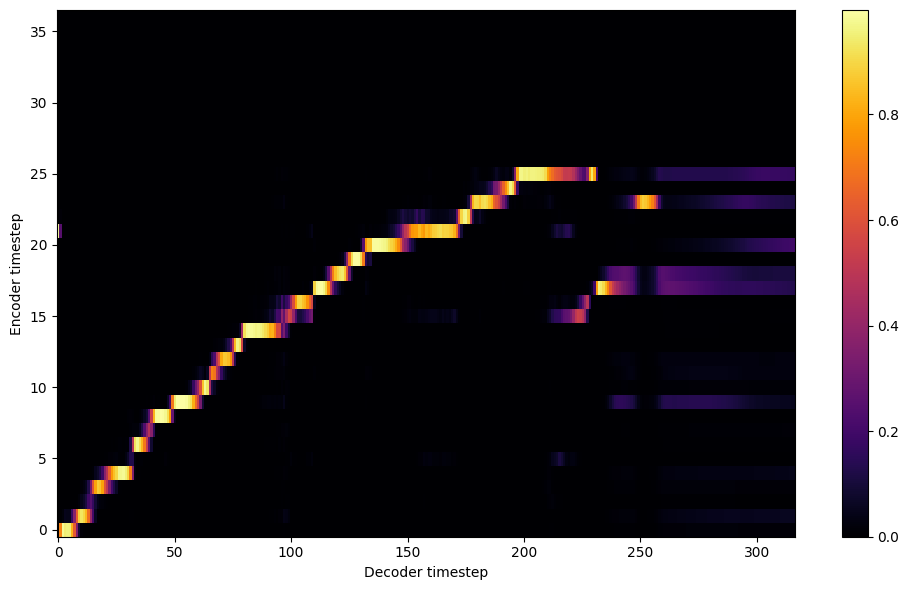

Saving model and optimizer state at iteration 4000 to /content/drive/MyDrive/colab/outdir/Sudip-sad
Model Saved


In [22]:
#@markdown ## <b><font color="pink" size="+2">  **Begin training**
#@markdown ___
#@markdown ### How often to save (number of epochs)
#@markdown `10` by default. Raise this if you're hitting a rate limit. If you're using a particularly large dataset, you might want to set this to `1` to prevent loss of progress.
save_interval =  10#@param {type: "integer"}
#
#@markdown ### How often to backup (number of epochs)
#@markdown `-1` (disabled) by default. This will save extra copies of your model every so often, so you always have something to revert to if you train the model for too long. This *will* chew through your Google Drive storage.
backup_interval =  -1#@param {type: "integer"}
#

print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)

JS to prevent idle timeout:

Press F12 OR CTRL + SHIFT + I OR right click on this website -> inspect.
Then click on the console tab and paste in the following code.

```javascript
function ClickConnect(){
console.log("Working");
document.querySelector("colab-toolbar-button#connect").click()
}
setInterval(ClickConnect,60000)
```